# PREMIERE PROJECT : Academic Ranking of World Universities Analytics

Team DeepLearning
© 2022 Hamoye Data Science Internship

---

I **Oladimeji WILLIAMS**, confirm - by submitting this document - that the solutions in this notebook are a result of my team's work (team Deep Learning), and that I abide by the [Code of Conduct](https://drive.google.com/file/d/1sbR80aowp1daCnElwx3kNm0fxids0e6b/view) contained therein.



### Overview: QS World University Rankings
> This dataset contains rankings of the world universities as maintained by Quacquarelli Symmonds. QS is a British think-tank company specializing in the analysis of higher education institutions throughout the world. QS uses 6 factors for their ranking framework wiz. Academic Reputation, Employer Reputation, Faculty to Student Ratio, Number of citations per faculty, International Faculty, International Students. Another feature included in this data was Classification (which is not used for ranking) which included the institution's size, subject range, research intensity, age, and status.
>This data can be used to analyze a specific set of universities' performances over the years as seen by QS. The scores can be an indicator of how well or bad have the universities performed in comparison to the last year.


Attribute Information:

1.   `Academic reputation` – Accounting for 40 per cent of the overall score, academic reputation looks at the teaching and research quality at the world’s universities. We collate over 130,000 expert opinions from the higher education space, creating the largest survey of academic opinion in the world. 
2.   `Employer reputation` – We know that students want to graduate with the skills and knowledge required for the employment market. We assess how institutions prepare students for successful careers, and which institutions provide the most competent, innovative, and effective graduates. 
3.   `Faculty/student ratio` – This indicator recognizes that a high number of academics per student reduces the teaching burden and creates a more supportive student experience. We assess how institutions provide students with meaningful access to lecturers and tutors. 
4.   `Citations per faculty` – We measure university research quality with a citation per faculty metric, taking the total number of academic citations in papers produced by a university in a five-year period.
5.   `International student ratio & International faculty ratio` – A highly international university creates a number of benefits. It demonstrates the ability to attract quality students and staff from across the world, and it implies a highly global outlook. Strong international institutions provide a multinational environment, building international sympathies and global awareness. 

The set of indicators for our World University Ranking and their weights are shown below, linking to 
their fuller descriptions in our methods section.
- Academic Reputation 40%
- Employer Reputation 10%
- Faculty Student Ratio 20%
- Citations per Faculty 20%
- International Faculty Ratio 5%
- International Student Ratio 5%
- International Research Network0% (for 2023 edition)
- Employment Outcomes 0% (for 2023 edition


Based on Classifications
1. Size
Based on the (full time equivalent) size of the degree-seeking student body. Where an FTE number is not 
provided or available, one will be estimated based on common characteristics of other institutions in the 
country or region in question.
Size Students
XL Extra Large More than 30,000
L Large >=12,000
M Medium >=5,000
S Small Fewer than 5,000

2. FOCUS/Subject Range
Four categories based on the institution’s provision of programs in the five broad faculty areas used in
the university rankings. Due to radically different publication habits and patterns in medicine, an 
additional category is added based on whether the subject institution has a medical school.
 
    - Focus Faculty Area
        - FC Full comprehensive: All 5 faculty areas + medical school
        - CO Comprehensive: All 5 faculty areas
        - FO Focused: 3 or 4 faculty areas
        - SP Specialist: 2 or fewer faculty areas
3. Age
    - Classification Age
        - 5 Historic: 100 years old and more
        - 4 Mature: 50-99 years old
        - 3 Established: 25-49 years old
        - 2 Young: 10-24 years old
        - 1 New: Less than 10 years old


4. Research Intensity
Four levels of research activity evaluated based on the number of documents retrievable from Scopus in 
the five-year period preceding the application of the classification. The thresholds required to reach the 
different levels are different depending on the institution's pre-classifications.
    - RESEARCH INTENSITY
        - VH Very High
        - HI High
        - MD Medium
        - LO Low

# 1. Preliminaries

In [1]:
# Load All Possible Libraries
import pandas as pd
import numpy as np
import random
import statistics
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow
from tensorflow import keras
from sklearn.compose import make_column_transformer
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.preprocessing import MinMaxScaler, StandardScaler, Normalizer, OneHotEncoder
from sklearn.model_selection import train_test_split, KFold, cross_val_score
from sklearn.preprocessing import LabelEncoder
from imblearn.over_sampling import SMOTE
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.linear_model import LinearRegression, Ridge, Lasso, LogisticRegression
from xgboost import XGBRegressor
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsClassifier
from catboost import CatBoostRegressor
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score, mean_squared_error, mean_absolute_error, r2_score, roc_curve, roc_auc_score, classification_report, confusion_matrix
import chardet
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

c:\users\williams\appdata\local\programs\python\python39\lib\site-packages\requests\__init__.py:102: RequestsDependencyWarning: urllib3 (1.26.6) or chardet (5.0.0)/charset_normalizer (2.0.4) doesn't match a supported version!
  warnings.warn("urllib3 ({}) or chardet ({})/charset_normalizer ({}) doesn't match a supported "


###### Load the dateset

In [2]:
with open("2018-QS-World-University-Rankings.csv", 'rb') as f:
    res = chardet.detect(f.read(100000))
res

{'encoding': None, 'confidence': 0.0, 'language': None}

In [3]:
df_2018 = pd.read_csv("2018-QS-World-University-Rankings.csv", encoding = 'unicode_escape', header = [0,1])
df_2019 = pd.read_csv("2019-QS-World-University-Rankings.csv", encoding = 'unicode_escape', header = [0,1])
df_2020 = pd.read_csv("2020-QS-World-University-Rankings.csv", encoding = 'unicode_escape', header = [0,1])

###### Peak the first few observations of each of the dataset

In [4]:
df_2018.head()

,2018,2017,Institution Name,Country,Classification,Unnamed: 5_level_0,Unnamed: 6_level_0,Unnamed: 7_level_0,Unnamed: 8_level_0,Academic Reputation,...,Unnamed: 12_level_0,Faculty Student,Unnamed: 14_level_0,Citations per Faculty,Unnamed: 16_level_0,International Faculty,Unnamed: 18_level_0,International Students,Unnamed: 20_level_0,Overall Score
,Unnamed: 0_level_1,Unnamed: 1_level_1,Unnamed: 2_level_1,Unnamed: 3_level_1,SIZE,FOCUS,RESEARCH INTENSITY,AGE,STATUS,SCORE,...,RANK,SCORE,RANK,SCORE,RANK,SCORE,RANK,SCORE,RANK,Unnamed: 21_level_1
0,1,1,MASSACHUSETTS INSTITUTE OF TECHNOLOGY (MIT),United States,M,CO,VH,5.0,B,100,...,4,100,14,99.9,8,100,36,96.1,70,100
1,2,2,STANFORD UNIVERSITY,United States,L,FC,VH,5.0,B,100,...,5,100,12,99.4,12,99.6,54,72.7,177,98.7
2,3,3,HARVARD UNIVERSITY,United States,L,FC,VH,5.0,B,100,...,3,98.3,38,99.9,9,96.5,103,75.2,165,98.4
3,4,5,CALIFORNIA INSTITUTE OF TECHNOLOGY (CALTECH),United States,S,CO,VH,5.0,B,99.5,...,77,100,3,100,4,93.4,126,89.2,106,97.7
4,5,4,UNIVERSITY OF CAMBRIDGE,United Kingdom,L,FC,VH,5.0,A,100,...,1,100,10,78.3,75,97.4,87,97.7,57,95.6


In [5]:
df_2019.head()

,2019,2018,Institution Name,Country,Classification,Unnamed: 5_level_0,Unnamed: 6_level_0,Unnamed: 7_level_0,Unnamed: 8_level_0,Academic Reputation,...,Unnamed: 12_level_0,Faculty Student,Unnamed: 14_level_0,Citations per Faculty,Unnamed: 16_level_0,International Faculty,Unnamed: 18_level_0,International Students,Unnamed: 20_level_0,Overall Score
,Unnamed: 0_level_1,Unnamed: 1_level_1,Unnamed: 2_level_1,Unnamed: 3_level_1,SIZE,FOCUS,RESEARCH INTENSITY,AGE,STATUS,SCORE,...,RANK,SCORE,RANK,SCORE,RANK,SCORE,RANK,SCORE,RANK,Unnamed: 21_level_1
0,1,1,MASSACHUSETTS INSTITUTE OF TECHNOLOGY (MIT),United States,M,CO,VH,5.0,B,100,...,4,100,17,99.8,8,100,41,95.5,77,100
1,2,2,STANFORD UNIVERSITY,United States,L,FC,VH,5.0,B,100,...,5,100,16,99,13,99.8,56,70.5,190,98.6
2,3,3,HARVARD UNIVERSITY,United States,L,FC,VH,5.0,B,100,...,1,99.3,40,99.8,9,92.1,151,75.7,164,98.5
3,4,4,CALIFORNIA INSTITUTE OF TECHNOLOGY (CALTECH),United States,S,CO,VH,5.0,B,98.7,...,72,100,4,100,5,96.8,115,90.3,103,97.2
4,5,6,UNIVERSITY OF OXFORD,United Kingdom,L,FC,VH,5.0,A,100,...,3,100,7,83,56,99.6,63,98.8,43,96.8


In [6]:
df_2020.head()

,Rank in 2020,Rank in 2019,Institution Name,Country,Classification,Unnamed: 5_level_0,Unnamed: 6_level_0,Unnamed: 7_level_0,Unnamed: 8_level_0,Academic Reputation,...,Unnamed: 12_level_0,Faculty Student,Unnamed: 14_level_0,Citations per Faculty,Unnamed: 16_level_0,International Faculty,Unnamed: 18_level_0,International Students,Unnamed: 20_level_0,Overall Score
,Unnamed: 0_level_1,Unnamed: 1_level_1,Unnamed: 2_level_1,Unnamed: 3_level_1,SIZE,FOCUS,RESEARCH INTENSITY,AGE,STATUS,SCORE,...,RANK,SCORE,RANK,SCORE,RANK,SCORE,RANK,SCORE,RANK,Unnamed: 21_level_1
0,1,1,Massachusetts Institute of Technology (MIT),United States,M,CO,VH,5.0,B,100,...,4,100,15,99.8,7,100,43,94.1,87,100
1,2,2,Stanford University,United States,L,FC,VH,5.0,B,100,...,5,100,12,98.6,13,99.8,62,67.7,196,98.4
2,3,3,Harvard University,United States,L,FC,VH,5.0,B,100,...,1,98.7,40,99.6,8,86.3,186,62.2,221,97.4
3,4,5,University of Oxford,United Kingdom,L,FC,VH,5.0,A,100,...,3,100,8,84.7,45,99.7,64,98.5,50,97.2
4,5,4,California Institute of Technology (Caltech),United States,S,CO,VH,5.0,B,97.8,...,74,100,4,100,4,99.4,72,87.3,121,96.9


###### Correct the headers of each of the dataset and confirm

In [7]:
for d in [df_2018, df_2019, df_2020]:
    cols = []
    for column in d:
        if column[0].startswith('Unnamed'):
            cols.append(column[1])
        elif column[1].startswith('Unnamed'):
            cols.append(column[0])
        else:
            cols.append(column[0]+'_'+column[1])
    d.columns = cols

In [8]:
df_2018.head()

,2018,2017,Institution Name,Country,Classification_SIZE,FOCUS,RESEARCH INTENSITY,AGE,STATUS,Academic Reputation_SCORE,...,RANK,Faculty Student_SCORE,RANK,Citations per Faculty_SCORE,RANK,International Faculty_SCORE,RANK,International Students_SCORE,RANK,Overall Score
0,1,1,MASSACHUSETTS INSTITUTE OF TECHNOLOGY (MIT),United States,M,CO,VH,5.0,B,100,...,4,100,14,99.9,8,100,36,96.1,70,100
1,2,2,STANFORD UNIVERSITY,United States,L,FC,VH,5.0,B,100,...,5,100,12,99.4,12,99.6,54,72.7,177,98.7
2,3,3,HARVARD UNIVERSITY,United States,L,FC,VH,5.0,B,100,...,3,98.3,38,99.9,9,96.5,103,75.2,165,98.4
3,4,5,CALIFORNIA INSTITUTE OF TECHNOLOGY (CALTECH),United States,S,CO,VH,5.0,B,99.5,...,77,100,3,100,4,93.4,126,89.2,106,97.7
4,5,4,UNIVERSITY OF CAMBRIDGE,United Kingdom,L,FC,VH,5.0,A,100,...,1,100,10,78.3,75,97.4,87,97.7,57,95.6


In [9]:
df_2019.head()

,2019,2018,Institution Name,Country,Classification_SIZE,FOCUS,RESEARCH INTENSITY,AGE,STATUS,Academic Reputation_SCORE,...,RANK,Faculty Student_SCORE,RANK,Citations per Faculty_SCORE,RANK,International Faculty_SCORE,RANK,International Students_SCORE,RANK,Overall Score
0,1,1,MASSACHUSETTS INSTITUTE OF TECHNOLOGY (MIT),United States,M,CO,VH,5.0,B,100,...,4,100,17,99.8,8,100,41,95.5,77,100
1,2,2,STANFORD UNIVERSITY,United States,L,FC,VH,5.0,B,100,...,5,100,16,99,13,99.8,56,70.5,190,98.6
2,3,3,HARVARD UNIVERSITY,United States,L,FC,VH,5.0,B,100,...,1,99.3,40,99.8,9,92.1,151,75.7,164,98.5
3,4,4,CALIFORNIA INSTITUTE OF TECHNOLOGY (CALTECH),United States,S,CO,VH,5.0,B,98.7,...,72,100,4,100,5,96.8,115,90.3,103,97.2
4,5,6,UNIVERSITY OF OXFORD,United Kingdom,L,FC,VH,5.0,A,100,...,3,100,7,83,56,99.6,63,98.8,43,96.8


In [10]:
df_2020.head()

,Rank in 2020,Rank in 2019,Institution Name,Country,Classification_SIZE,FOCUS,RESEARCH INTENSITY,AGE,STATUS,Academic Reputation_SCORE,...,RANK,Faculty Student_SCORE,RANK,Citations per Faculty_SCORE,RANK,International Faculty_SCORE,RANK,International Students_SCORE,RANK,Overall Score
0,1,1,Massachusetts Institute of Technology (MIT),United States,M,CO,VH,5.0,B,100,...,4,100,15,99.8,7,100,43,94.1,87,100
1,2,2,Stanford University,United States,L,FC,VH,5.0,B,100,...,5,100,12,98.6,13,99.8,62,67.7,196,98.4
2,3,3,Harvard University,United States,L,FC,VH,5.0,B,100,...,1,98.7,40,99.6,8,86.3,186,62.2,221,97.4
3,4,5,University of Oxford,United Kingdom,L,FC,VH,5.0,A,100,...,3,100,8,84.7,45,99.7,64,98.5,50,97.2
4,5,4,California Institute of Technology (Caltech),United States,S,CO,VH,5.0,B,97.8,...,74,100,4,100,4,99.4,72,87.3,121,96.9


# 2. INTUITIVE  DATA CLEANING FOR ANALYSIS

In [11]:
df_2020.isna().sum()

Rank in 2020                    22
Rank in 2019                    72
Institution Name                 0
Country                          0
Classification_SIZE              0
FOCUS                           23
RESEARCH INTENSITY              24
AGE                             23
STATUS                          42
Academic Reputation_SCORE        0
RANK                             0
Employer Reputation_SCORE        0
RANK                             0
Faculty Student_SCORE            0
RANK                             0
Citations per Faculty_SCORE      0
RANK                             0
International Faculty_SCORE     46
RANK                             5
International Students_SCORE     6
RANK                             1
Overall Score                    0
dtype: int64

In [12]:
df_2020 = df_2020.drop(['RANK'], axis = 1)
df_2018 = df_2018.drop(['RANK'], axis = 1)
df_2019 = df_2019.drop(['RANK'], axis = 1)

In [13]:
cleaned_2020 = df_2020.copy()

In [14]:
cleaned_2020 = cleaned_2020[~cleaned_2020['Rank in 2020'].isna()] # remove the institutions without rank in 2020

In [15]:
cleaned_2020 = cleaned_2020[~cleaned_2020['Rank in 2019'].isna()] # remove the institutions without rank in 2020

In [16]:
cleaned_2020.isna().sum()

Rank in 2020                     0
Rank in 2019                     0
Institution Name                 0
Country                          0
Classification_SIZE              0
FOCUS                           14
RESEARCH INTENSITY              15
AGE                             18
STATUS                          21
Academic Reputation_SCORE        0
Employer Reputation_SCORE        0
Faculty Student_SCORE            0
Citations per Faculty_SCORE      0
International Faculty_SCORE     39
International Students_SCORE     5
Overall Score                    0
dtype: int64

In [17]:
cleaned_2020.isna().sum()

Rank in 2020                     0
Rank in 2019                     0
Institution Name                 0
Country                          0
Classification_SIZE              0
FOCUS                           14
RESEARCH INTENSITY              15
AGE                             18
STATUS                          21
Academic Reputation_SCORE        0
Employer Reputation_SCORE        0
Faculty Student_SCORE            0
Citations per Faculty_SCORE      0
International Faculty_SCORE     39
International Students_SCORE     5
Overall Score                    0
dtype: int64

In [18]:
for c in cleaned_2020.columns:
    if c != 'AGE':
        print('-------')
        print(f'unique{c}')
        print(np.unique(cleaned_2020[c].astype('str')))
    else:
        continue

-------
uniqueRank in 2020
['  104=' '  108=' '  116=' '  11=' '  120=' '  125=' '  130=' '  132='
 '  140=' '  154=' '  156=' '  160=' '  163=' '  165=' '  167=' '  169='
 '  170=' '  173=' '  177=' '  179=' '  186=' '  189=' '  18=' '  192='
 '  198=' '  200=' '  207=' '  212=' '  215=' '  217=' '  219=' '  227='
 '  22=' '  231=' '  234=' '  239=' '  247=' '  251=' '  253=' '  257='
 '  25=' '  262=' '  266=' '  268=' '  271=' '  274=' '  277=' '  281='
 '  285=' '  287=' '  291=' '  296=' '  298=' '  29=' '  302=' '  305='
 '  312=' '  314=' '  320=' '  322=' '  324=' '  329=' '  331=' '  336='
 '  338=' '  33=' '  340=' '  344=' '  349=' '  351=' '  353=' '  356='
 '  359=' '  35=' '  364=' '  368=' '  371=' '  372=' '  377=' '  379='
 '  383=' '  387=' '  389=' '  392=' '  395=' '  398=' '  400=' '  407='
 '  410=' '  412=' '  419=' '  421=' '  424=' '  427=' '  429=' '  432='
 '  436=' '  439=' '  442=' '  448=' '  451=' '  454=' '  458=' '  462='
 '  468=' '  474=' '  478=' '  

In [19]:
cleaned_na = cleaned_2020.dropna()

In [20]:
cleaned_na.replace('-', np.nan).isna().sum()

Rank in 2020                      0
Rank in 2019                      0
Institution Name                  0
Country                           0
Classification_SIZE               0
FOCUS                             0
RESEARCH INTENSITY                0
AGE                               0
STATUS                            0
Academic Reputation_SCORE       326
Employer Reputation_SCORE       300
Faculty Student_SCORE           233
Citations per Faculty_SCORE     256
International Faculty_SCORE     250
International Students_SCORE    251
Overall Score                     0
dtype: int64

In [21]:
cleaned_na = cleaned_na.replace('-', np.nan).dropna() # some values represented null value with -

In [22]:
cleaned_na.isna().sum()

Rank in 2020                    0
Rank in 2019                    0
Institution Name                0
Country                         0
Classification_SIZE             0
FOCUS                           0
RESEARCH INTENSITY              0
AGE                             0
STATUS                          0
Academic Reputation_SCORE       0
Employer Reputation_SCORE       0
Faculty Student_SCORE           0
Citations per Faculty_SCORE     0
International Faculty_SCORE     0
International Students_SCORE    0
Overall Score                   0
dtype: int64

In [23]:
for c in cleaned_2020.columns:
    if c != 'AGE':
        print('-------')
        print(f'unique{c}')
        print(np.unique(cleaned_na[c].astype('str')))
    else:
        continue

-------
uniqueRank in 2020
['  104=' '  108=' '  116=' '  11=' '  120=' '  125=' '  130=' '  132='
 '  140=' '  154=' '  156=' '  160=' '  163=' '  165=' '  167=' '  169='
 '  170=' '  173=' '  177=' '  179=' '  186=' '  189=' '  18=' '  192='
 '  198=' '  200=' '  207=' '  212=' '  215=' '  217=' '  219=' '  227='
 '  22=' '  231=' '  234=' '  239=' '  247=' '  251=' '  253=' '  257='
 '  25=' '  262=' '  266=' '  268=' '  271=' '  274=' '  277=' '  281='
 '  285=' '  287=' '  291=' '  296=' '  298=' '  29=' '  302=' '  305='
 '  312=' '  314=' '  320=' '  322=' '  324=' '  329=' '  331=' '  336='
 '  338=' '  33=' '  340=' '  344=' '  349=' '  351=' '  353=' '  356='
 '  359=' '  35=' '  364=' '  368=' '  371=' '  372=' '  377=' '  379='
 '  383=' '  387=' '  389=' '  392=' '  395=' '  398=' '  400=' '  407='
 '  410=' '  412=' '  419=' '  421=' '  424=' '  427=' '  429=' '  432='
 '  436=' '  439=' '  442=' '  448=' '  451=' '  454=' '  458=' '  462='
 '  468=' '  474=' '  478=' '  

In [24]:
cleaned_na[cleaned_na['Rank in 2019'] == '551-560']

,Rank in 2020,Rank in 2019,Institution Name,Country,Classification_SIZE,FOCUS,RESEARCH INTENSITY,AGE,STATUS,Academic Reputation_SCORE,Employer Reputation_SCORE,Faculty Student_SCORE,Citations per Faculty_SCORE,International Faculty_SCORE,International Students_SCORE,Overall Score
473,474=,551-560,Pontificia Universidad Católica del Perú,Peru,L,FO,HI,5.0,B,36.5,56.3,19.2,1.7,7,2.3,25


In [25]:
cleaned_na['Rank in 2020'] = cleaned_na['Rank in 2020'].str.strip().str.replace('=','')
cleaned_na['Rank in 2019'] = cleaned_na['Rank in 2019'].str.strip().str.replace('=','') # remove = in columns with = alongside rank value

In [26]:
cleaned_na

,Rank in 2020,Rank in 2019,Institution Name,Country,Classification_SIZE,FOCUS,RESEARCH INTENSITY,AGE,STATUS,Academic Reputation_SCORE,Employer Reputation_SCORE,Faculty Student_SCORE,Citations per Faculty_SCORE,International Faculty_SCORE,International Students_SCORE,Overall Score
0,1,1,Massachusetts Institute of Technology (MIT),United States,M,CO,VH,5.0,B,100,100,100,99.8,100,94.1,100
1,2,2,Stanford University,United States,L,FC,VH,5.0,B,100,100,100,98.6,99.8,67.7,98.4
2,3,3,Harvard University,United States,L,FC,VH,5.0,B,100,100,98.7,99.6,86.3,62.2,97.4
3,4,5,University of Oxford,United Kingdom,L,FC,VH,5.0,A,100,100,100,84.7,99.7,98.5,97.2
4,5,4,California Institute of Technology (Caltech),United States,S,CO,VH,5.0,B,97.8,81.2,100,100,99.4,87.3,96.9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,491,439,University of Delaware,United States,L,CO,VH,5.0,A,11,10.2,11.6,67.1,39.3,22.5,24.3
496,491,481,V.N. Karazin Kharkiv National University,Ukraine,L,FC,MD,5.0,A,10.8,11.4,72.2,1.8,1.3,78.4,24.3
497,498,531-540,Czech Technical University In Prague,Czech Republic,L,SP,VH,5.0,A,18.7,39.7,33.9,10.6,18.2,57.5,24.2
498,498,422,Université de Montpellier,France,XL,CO,VH,1.0,A,20.3,18.8,13.1,42.8,20.1,39.3,24.2


In [27]:
cleaned_na.tail(10)

,Rank in 2020,Rank in 2019,Institution Name,Country,Classification_SIZE,FOCUS,RESEARCH INTENSITY,AGE,STATUS,Academic Reputation_SCORE,Employer Reputation_SCORE,Faculty Student_SCORE,Citations per Faculty_SCORE,International Faculty_SCORE,International Students_SCORE,Overall Score
488,489,498,Amirkabir University of Technology,Iran,M,FO,VH,4.0,A,4.7,15,7.4,94.9,7,2.6,24.4
489,489,511-520,Universidad de Santiago de Chile (USACH),Chile,L,FC,MD,5.0,A,35.6,60.2,13.1,4.7,8.2,2.2,24.4
492,491,480,M.O.Auezov South Kazakhstan State University,Kazakhstan,L,CO,MD,4.0,A,7,6.1,94.1,1,17.1,17.7,24.3
493,491,531-540,Universidad de Montevideo,Uruguay,S,FC,LO,2.0,B,13.4,17.3,79.1,1.3,18.1,3.7,24.3
494,491,453,Université Aix-Marseille,France,XL,FC,VH,1.0,A,33.9,4.9,13.5,25,23.6,26.6,24.3
495,491,439,University of Delaware,United States,L,CO,VH,5.0,A,11,10.2,11.6,67.1,39.3,22.5,24.3
496,491,481,V.N. Karazin Kharkiv National University,Ukraine,L,FC,MD,5.0,A,10.8,11.4,72.2,1.8,1.3,78.4,24.3
497,498,531-540,Czech Technical University In Prague,Czech Republic,L,SP,VH,5.0,A,18.7,39.7,33.9,10.6,18.2,57.5,24.2
498,498,422,Université de Montpellier,France,XL,CO,VH,1.0,A,20.3,18.8,13.1,42.8,20.1,39.3,24.2
499,498,481,University of Eastern Finland,Finland,M,CO,VH,3.0,A,14.5,10.5,43.8,33.5,27.9,9.1,24.2


In [28]:
cleaned_2019 = df_2019.copy()

In [29]:
cleaned_2019.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1025 entries, 0 to 1024
Data columns (total 16 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   2019                          1003 non-null   object 
 1   2018                          939 non-null    object 
 2   Institution Name              1022 non-null   object 
 3   Country                       1021 non-null   object 
 4   Classification_SIZE           1021 non-null   object 
 5   FOCUS                         1021 non-null   object 
 6   RESEARCH INTENSITY            1021 non-null   object 
 7   AGE                           1021 non-null   float64
 8   STATUS                        1021 non-null   object 
 9   Academic Reputation_SCORE     1021 non-null   object 
 10  Employer Reputation_SCORE     1019 non-null   object 
 11  Faculty Student_SCORE         1021 non-null   object 
 12  Citations per Faculty_SCORE   1021 non-null   object 
 13  Int

In [30]:
cleaned_2019 = cleaned_2019.dropna()

In [31]:
cleaned_2019.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 895 entries, 0 to 999
Data columns (total 16 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   2019                          895 non-null    object 
 1   2018                          895 non-null    object 
 2   Institution Name              895 non-null    object 
 3   Country                       895 non-null    object 
 4   Classification_SIZE           895 non-null    object 
 5   FOCUS                         895 non-null    object 
 6   RESEARCH INTENSITY            895 non-null    object 
 7   AGE                           895 non-null    float64
 8   STATUS                        895 non-null    object 
 9   Academic Reputation_SCORE     895 non-null    object 
 10  Employer Reputation_SCORE     895 non-null    object 
 11  Faculty Student_SCORE         895 non-null    object 
 12  Citations per Faculty_SCORE   895 non-null    object 
 13  Inter

In [32]:
for c in cleaned_2019.columns:
    if c != 'AGE':
        print('-------')
        print(f'unique{c}')
        print(np.unique(cleaned_2019[c].astype('str')))
    else:
        continue

-------
unique2019
['  100=' '  104=' '  122=' '  126=' '  128=' '  132=' '  141=' '  149='
 '  151=' '  154=' '  156=' '  160=' '  163=' '  172=' '  175=' '  180='
 '  184=' '  186=' '  193=' '  195=' '  200=' '  204=' '  208=' '  212='
 '  214=' '  218=' '  221=' '  223=' '  231=' '  237=' '  239=' '  242='
 '  244=' '  250=' '  253=' '  257=' '  260=' '  264=' '  269=' '  272='
 '  275=' '  277=' '  279=' '  283=' '  285=' '  289=' '  292=' '  295='
 '  299=' '  302=' '  306=' '  310=' '  313=' '  315=' '  317=' '  319='
 '  321=' '  323=' '  326=' '  329=' '  332=' '  336=' '  338=' '  343='
 '  345=' '  352=' '  355=' '  359=' '  363=' '  367=' '  369=' '  373='
 '  376=' '  381=' '  384=' '  387=' '  391=' '  394=' '  397=' '  402='
 '  405=' '  407=' '  412=' '  415=' '  417=' '  420=' '  422=' '  426='
 '  429=' '  432=' '  435=' '  439=' '  443=' '  446=' '  448=' '  450='
 '  453=' '  456=' '  461=' '  464=' '  470=' '  472=' '  476=' '  478='
 '  481=' '  489=' '  491=' '  4

In [33]:
cleaned_2019.replace('-', np.nan).isna().sum()

2019                              0
2018                              0
Institution Name                  0
Country                           0
Classification_SIZE               0
FOCUS                             0
RESEARCH INTENSITY                0
AGE                               0
STATUS                            0
Academic Reputation_SCORE       325
Employer Reputation_SCORE       312
Faculty Student_SCORE           248
Citations per Faculty_SCORE     252
International Faculty_SCORE     247
International Students_SCORE    244
Overall Score                     0
dtype: int64

In [34]:
cleaned_2019 = cleaned_2019.replace('-', np.nan).dropna()

In [35]:
cleaned_2019[cleaned_2019['2019'] == '351']

,2019,2018,Institution Name,Country,Classification_SIZE,FOCUS,RESEARCH INTENSITY,AGE,STATUS,Academic Reputation_SCORE,Employer Reputation_SCORE,Faculty Student_SCORE,Citations per Faculty_SCORE,International Faculty_SCORE,International Students_SCORE,Overall Score
350,351,343,CITY UNIVERSITY LONDON,United Kingdom,L,CO,HI,5.0,A,15.4,24.8,13.4,49.2,95.3,99.8,31


In [36]:
cleaned_2019['2019'] = cleaned_2019['2019'].str.strip().str.replace('=','')
cleaned_2019['2018'] = cleaned_2019['2018'].str.strip().str.replace('=','')

In [37]:
cleaned_2019.tail(10)

,2019,2018,Institution Name,Country,Classification_SIZE,FOCUS,RESEARCH INTENSITY,AGE,STATUS,Academic Reputation_SCORE,Employer Reputation_SCORE,Faculty Student_SCORE,Citations per Faculty_SCORE,International Faculty_SCORE,International Students_SCORE,Overall Score
492,491,481-490,UNIVERSITÀ CATTOLICA DEL SACRO CUORE,Italy,L,CO,VH,4.0,B,23.2,50.2,17.7,18.9,21.1,24.1,23.9
493,494,461-470,UNIVERSITY OF NEW MEXICO,United States,L,FC,VH,5.0,A,15.6,11.3,10.4,67.3,9.9,6.2,23.8
494,495,501-550,UNIVERSIDAD DE GRANADA,Spain,XL,FC,VH,5.0,A,34.9,14,12.8,21.4,5.1,23.7,23.7
495,495,501-550,UNIVERSITÄT HOHENHEIM,Germany,M,FO,VH,5.0,A,8.2,11.2,7.8,74.4,24.3,31.5,23.7
496,495,501-550,UNIVERSITY OF OKLAHOMA,United States,L,FC,VH,5.0,A,10.7,13,61,17.6,37.1,10.6,23.7
497,498,501-550,AMIRKABIR UNIVERSITY OF TECHNOLOGY,Iran,M,FO,VH,4.0,A,4.9,9.8,8.6,92.7,4.2,2.5,23.6
498,498,551-600,WESTERN SYDNEY UNIVERSITY,Australia,XL,FC,HI,3.0,A,15.9,26.4,9.9,25.9,100,47.8,23.6
499,500,441-450,SINGAPORE MANAGEMENT UNIVERSITY,Singapore,M,SP,HI,2.0,A,12.7,29,13.8,21.2,100,69.4,23.5
501,500,491-500,UNIVERSITÉ SAINT-JOSEPH DE BEYROUTH,Lebanon,M,FC,MD,5.0,B,7.7,26.9,68.1,2.3,62.2,10.2,23.5
502,500,551-600,UNIVERSITY OF SCIENCE AND TECHNOLOGY BEIJING,China,L,CO,VH,4.0,A,18.2,6,18.9,56.3,5,4.6,23.5


In [38]:
cleaned_2018 = df_2018.copy()

In [39]:
cleaned_2018.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 984 entries, 0 to 983
Data columns (total 16 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   2018                          962 non-null    object 
 1   2017                          914 non-null    object 
 2   Institution Name              981 non-null    object 
 3   Country                       980 non-null    object 
 4   Classification_SIZE           980 non-null    object 
 5   FOCUS                         969 non-null    object 
 6   RESEARCH INTENSITY            968 non-null    object 
 7   AGE                           959 non-null    float64
 8   STATUS                        962 non-null    object 
 9   Academic Reputation_SCORE     980 non-null    object 
 10  Employer Reputation_SCORE     980 non-null    object 
 11  Faculty Student_SCORE         980 non-null    object 
 12  Citations per Faculty_SCORE   979 non-null    object 
 13  Inter

In [40]:
cleaned_2018 = cleaned_2018.dropna()

In [41]:
cleaned_2018.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 895 entries, 0 to 957
Data columns (total 16 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   2018                          895 non-null    object 
 1   2017                          895 non-null    object 
 2   Institution Name              895 non-null    object 
 3   Country                       895 non-null    object 
 4   Classification_SIZE           895 non-null    object 
 5   FOCUS                         895 non-null    object 
 6   RESEARCH INTENSITY            895 non-null    object 
 7   AGE                           895 non-null    float64
 8   STATUS                        895 non-null    object 
 9   Academic Reputation_SCORE     895 non-null    object 
 10  Employer Reputation_SCORE     895 non-null    object 
 11  Faculty Student_SCORE         895 non-null    object 
 12  Citations per Faculty_SCORE   895 non-null    object 
 13  Inter

In [42]:
for c in cleaned_2018.columns:
    if c != 'AGE':
        print('-------')
        print(f'unique{c}')
        print(np.unique(cleaned_2018[c].astype('str')))
    else:
        continue

-------
unique2018
['  102=' '  109=' '  114=' '  116=' '  122=' '  125=' '  135=' '  137='
 '  142=' '  147=' '  149=' '  158=' '  161=' '  164=' '  173=' '  179='
 '  182=' '  188=' '  192=' '  195=' '  205=' '  207=' '  210=' '  21='
 '  224=' '  230=' '  236=' '  23=' '  240=' '  243=' '  245=' '  247='
 '  250=' '  254=' '  256=' '  259=' '  264=' '  267=' '  270=' '  272='
 '  277=' '  279=' '  283=' '  287=' '  289=' '  28=' '  293=' '  296='
 '  299=' '  301=' '  305=' '  308=' '  314=' '  316=' '  319=' '  323='
 '  325=' '  331=' '  334=' '  339=' '  341=' '  344=' '  346=' '  349='
 '  352=' '  355=' '  357=' '  361=' '  364=' '  367=' '  36=' '  373='
 '  382=' '  386=' '  388=' '  38=' '  391=' '  395=' '  398=' '  41='
 '  47=' '  71=' '  73=' '  76=' '  78=' '  801-1000' '  82=' '  84='
 '  90=' '  93=' '  95=' '  98=' '1' '10' '100' '101' '104' '105' '106'
 '107' '108' '11' '112' '113' '118' '119' '12' '120' '121' '124' '127'
 '128' '129' '13' '130' '131' '132' '133' '1

In [43]:
cleaned_2018.replace('-', np.nan).isna().sum()

2018                              0
2017                              0
Institution Name                  0
Country                           0
Classification_SIZE               0
FOCUS                             0
RESEARCH INTENSITY                0
AGE                               0
STATUS                            0
Academic Reputation_SCORE       502
Employer Reputation_SCORE       502
Faculty Student_SCORE           406
Citations per Faculty_SCORE     406
International Faculty_SCORE     406
International Students_SCORE    406
Overall Score                   406
dtype: int64

In [44]:
cleaned_2018 = cleaned_2018.replace('-', np.nan).dropna()

In [45]:
cleaned_2018.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 393 entries, 0 to 399
Data columns (total 16 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   2018                          393 non-null    object 
 1   2017                          393 non-null    object 
 2   Institution Name              393 non-null    object 
 3   Country                       393 non-null    object 
 4   Classification_SIZE           393 non-null    object 
 5   FOCUS                         393 non-null    object 
 6   RESEARCH INTENSITY            393 non-null    object 
 7   AGE                           393 non-null    float64
 8   STATUS                        393 non-null    object 
 9   Academic Reputation_SCORE     393 non-null    object 
 10  Employer Reputation_SCORE     393 non-null    object 
 11  Faculty Student_SCORE         393 non-null    object 
 12  Citations per Faculty_SCORE   393 non-null    object 
 13  Inter

In [46]:
cleaned_2018['2018'] = cleaned_2018['2018'].str.strip().str.replace('=','')
cleaned_2018['2017'] = cleaned_2018['2017'].str.strip().str.replace('=','')

In [47]:
cleaned_2018.tail(10)

,2018,2017,Institution Name,Country,Classification_SIZE,FOCUS,RESEARCH INTENSITY,AGE,STATUS,Academic Reputation_SCORE,Employer Reputation_SCORE,Faculty Student_SCORE,Citations per Faculty_SCORE,International Faculty_SCORE,International Students_SCORE,Overall Score
390,391,380,DUBLIN CITY UNIVERSITY (DCU),Ireland,L,CO,HI,3.0,A,22.2,46.3,35.8,17.3,78.4,57.2,31
391,391,411-420,NATIONAL CENTRAL UNIVERSITY,Taiwan,M,CO,VH,4.0,A,32.5,17.3,31.7,40.3,15.6,19.6,31
392,391,411-420,UNIVERSITY OF UTAH,United States,L,FC,VH,5.0,A,21.2,11.1,60.1,38.2,16.3,17.2,31
393,394,374,UNIVERSITY OF COLORADO AT DENVER,United States,L,FC,VH,5.0,A,12.1,11.5,100,18.8,4.4,15.5,30.8
394,395,365,AMERICAN UNIVERSITY IN CAIRO,Egypt,M,CO,HI,4.0,B,31,49.3,37.1,5.1,90.7,5.8,30.7
395,395,401-410,ILLINOIS INSTITUTE OF TECHNOLOGY,United States,M,CO,VH,5.0,B,23.6,13.9,19,49.7,21.4,100,30.7
396,397,431-440,HUFS  HANKUK (KOREA) UNIVERSITY OF FOREIGN ST...,South Korea,L,CO,MD,4.0,B,18.7,31.5,78.3,2.1,37.9,39,30.6
397,398,421-430,"GOLDSMITHS, UNIVERSITY OF LONDON",United Kingdom,M,FO,VH,5.0,A,27.3,13.2,25.5,19.7,85,97.2,30.5
398,398,401-410,JOHANNES GUTENBERG UNIVERSITÄT MAINZ,Germany,XL,FC,HI,5.0,A,27.9,25.2,48.7,20.1,35.1,24.6,30.5
399,398,401-410,TAIPEI MEDICAL UNIVERSITY,Taiwan,M,FO,VH,4.0,B,15.5,14.8,84.7,18.7,24.4,17.3,30.5


In [48]:
cleaned_na['Institution Name'] = cleaned_na['Institution Name'].str.replace(',','')
cleaned_na['Institution Name'] = cleaned_na['Institution Name'].str.replace('.','')
cleaned_na['Institution Name'] = cleaned_na['Institution Name'].str.lower()
cleaned_na['Institution Name'].head()

0     massachusetts institute of technology (mit)
1                             stanford university
2                              harvard university
3                            university of oxford
4    california institute of technology (caltech)
Name: Institution Name, dtype: object

In [49]:
cleaned_2019['Institution Name'] = cleaned_2019['Institution Name'].str.replace(',','')
cleaned_2019['Institution Name'] = cleaned_2019['Institution Name'].str.replace('.','')
cleaned_2019['Institution Name'] = cleaned_2019['Institution Name'].str.lower()
cleaned_2019['Institution Name'].head()

0     massachusetts institute of technology (mit)
1                             stanford university
2                              harvard university
3    california institute of technology (caltech)
4                            university of oxford
Name: Institution Name, dtype: object

In [50]:
cleaned_2018['Institution Name'] = cleaned_2018['Institution Name'].str.replace(',','')
cleaned_2018['Institution Name'] = cleaned_2018['Institution Name'].str.replace('.','')
cleaned_2018['Institution Name'] = cleaned_2018['Institution Name'].str.lower()
cleaned_2018['Institution Name'].head()

0    massachusetts institute of technology (mit) 
1                             stanford university
2                              harvard university
3    california institute of technology (caltech)
4                         university of cambridge
Name: Institution Name, dtype: object

In [51]:
# Combine the three cleaned datasets
final = pd.concat([cleaned_na, cleaned_2019, cleaned_2018], axis = 1).dropna()

In [52]:
final[['Rank in 2020', 'Rank in 2019', '2019', '2018', '2017', 'Institution Name']]

,Rank in 2020,Rank in 2019,2019,2018,2018,2017,Institution Name,Institution Name,Institution Name
0,1,1,1,1,1,1,massachusetts institute of technology (mit),massachusetts institute of technology (mit),massachusetts institute of technology (mit)
1,2,2,2,2,2,2,stanford university,stanford university,stanford university
2,3,3,3,3,3,3,harvard university,harvard university,harvard university
3,4,5,4,4,4,5,university of oxford,california institute of technology (caltech),california institute of technology (caltech)
4,5,4,5,6,5,4,california institute of technology (caltech),university of oxford,university of cambridge
...,...,...,...,...,...,...,...,...,...
393,392,446,394,336,394,374,rudn university,ln gumilyov eurasian national university,university of colorado at denver
394,392,397,394,411-420,395,365,university of colorado at denver,university of warsaw,american university in cairo
395,395,352,396,398,395,401-410,kobe university,goldsmiths university of london,illinois institute of technology
397,395,420,397,360,398,421-430,the american university in cairo,la trobe university,goldsmiths university of london


In [53]:
final.columns

Index(['Rank in 2020', 'Rank in 2019', 'Institution Name', 'Country',
       'Classification_SIZE', 'FOCUS', 'RESEARCH INTENSITY', 'AGE', 'STATUS',
       'Academic Reputation_SCORE', 'Employer Reputation_SCORE',
       'Faculty Student_SCORE', 'Citations per Faculty_SCORE',
       'International Faculty_SCORE', 'International Students_SCORE',
       'Overall Score', '2019', '2018', 'Institution Name', 'Country',
       'Classification_SIZE', 'FOCUS', 'RESEARCH INTENSITY', 'AGE', 'STATUS',
       'Academic Reputation_SCORE', 'Employer Reputation_SCORE',
       'Faculty Student_SCORE', 'Citations per Faculty_SCORE',
       'International Faculty_SCORE', 'International Students_SCORE',
       'Overall Score', '2018', '2017', 'Institution Name', 'Country',
       'Classification_SIZE', 'FOCUS', 'RESEARCH INTENSITY', 'AGE', 'STATUS',
       'Academic Reputation_SCORE', 'Employer Reputation_SCORE',
       'Faculty Student_SCORE', 'Citations per Faculty_SCORE',
       'International Faculty_

In [54]:
cleaned_na.head()

,Rank in 2020,Rank in 2019,Institution Name,Country,Classification_SIZE,FOCUS,RESEARCH INTENSITY,AGE,STATUS,Academic Reputation_SCORE,Employer Reputation_SCORE,Faculty Student_SCORE,Citations per Faculty_SCORE,International Faculty_SCORE,International Students_SCORE,Overall Score
0,1,1,massachusetts institute of technology (mit),United States,M,CO,VH,5.0,B,100,100,100,99.8,100,94.1,100
1,2,2,stanford university,United States,L,FC,VH,5.0,B,100,100,100,98.6,99.8,67.7,98.4
2,3,3,harvard university,United States,L,FC,VH,5.0,B,100,100,98.7,99.6,86.3,62.2,97.4
3,4,5,university of oxford,United Kingdom,L,FC,VH,5.0,A,100,100,100,84.7,99.7,98.5,97.2
4,5,4,california institute of technology (caltech),United States,S,CO,VH,5.0,B,97.8,81.2,100,100,99.4,87.3,96.9


In [55]:
cleaned_2018.head()

,2018,2017,Institution Name,Country,Classification_SIZE,FOCUS,RESEARCH INTENSITY,AGE,STATUS,Academic Reputation_SCORE,Employer Reputation_SCORE,Faculty Student_SCORE,Citations per Faculty_SCORE,International Faculty_SCORE,International Students_SCORE,Overall Score
0,1,1,massachusetts institute of technology (mit),United States,M,CO,VH,5.0,B,100,100,100,99.9,100,96.1,100
1,2,2,stanford university,United States,L,FC,VH,5.0,B,100,100,100,99.4,99.6,72.7,98.7
2,3,3,harvard university,United States,L,FC,VH,5.0,B,100,100,98.3,99.9,96.5,75.2,98.4
3,4,5,california institute of technology (caltech),United States,S,CO,VH,5.0,B,99.5,85.4,100,100,93.4,89.2,97.7
4,5,4,university of cambridge,United Kingdom,L,FC,VH,5.0,A,100,100,100,78.3,97.4,97.7,95.6


In [56]:
cleaned_2019.head()

,2019,2018,Institution Name,Country,Classification_SIZE,FOCUS,RESEARCH INTENSITY,AGE,STATUS,Academic Reputation_SCORE,Employer Reputation_SCORE,Faculty Student_SCORE,Citations per Faculty_SCORE,International Faculty_SCORE,International Students_SCORE,Overall Score
0,1,1,massachusetts institute of technology (mit),United States,M,CO,VH,5.0,B,100,100,100,99.8,100,95.5,100
1,2,2,stanford university,United States,L,FC,VH,5.0,B,100,100,100,99,99.8,70.5,98.6
2,3,3,harvard university,United States,L,FC,VH,5.0,B,100,100,99.3,99.8,92.1,75.7,98.5
3,4,4,california institute of technology (caltech),United States,S,CO,VH,5.0,B,98.7,81.2,100,100,96.8,90.3,97.2
4,5,6,university of oxford,United Kingdom,L,FC,VH,5.0,A,100,100,100,83,99.6,98.8,96.8


In [57]:
names_2019 = list(cleaned_2019['Institution Name'])
names_2018 = list(cleaned_2018['Institution Name'])
names_2020 = list(cleaned_na['Institution Name'])

In [58]:
for i in range(len(names_2020)):
    names_2020[i] = names_2020[i].lower()
for i in range(len(names_2019)):
    names_2019[i] = names_2019[i].lower()

In [59]:
names_2020

['massachusetts institute of technology (mit)',
 'stanford university',
 'harvard university',
 'university of oxford',
 'california institute of technology (caltech)',
 'eth zurich (swiss federal institute of technology)',
 'university of cambridge',
 'ucl (university college london)',
 'imperial college london',
 'university of chicago',
 'nanyang technological university (ntu)',
 'national university of singapore (nus)',
 'princeton university',
 'cornell university',
 'university of pennsylvania',
 'tsinghua university',
 'yale university',
 'columbia university',
 'ecole polytechnique fédérale de lausanne (epfl)',
 'university of edinburgh',
 'university of michigan',
 'peking university',
 'the university of tokyo',
 'johns hopkins university',
 'duke university',
 'university of hong kong (hku)',
 'the university of manchester',
 'university of california berkeley (ucb)',
 'australian national university (anu)',
 'university of toronto',
 'northwestern university',
 'the hong ko

In [60]:
a = []
for i, name in enumerate(names_2020):
    if name not in names_2019:
        a.append(name)
print(len(a))
print(len(names_2020))

25
485


In [61]:
b = []
for name in names_2019:
    if name not in names_2020:
        b.append(name)
print(len(b))
print(len(names_2019))

30
490


In [62]:
c = []
for i, name in enumerate(names_2018):
    if name not in names_2019:
        c.append(name)
print(len(c))
print(len(names_2018))

25
393


In [63]:
df_2019.dropna()[df_2019.dropna()['2019'] == '351'].replace('-', np.nan).info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1 entries, 350 to 350
Data columns (total 16 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   2019                          1 non-null      object 
 1   2018                          1 non-null      object 
 2   Institution Name              1 non-null      object 
 3   Country                       1 non-null      object 
 4   Classification_SIZE           1 non-null      object 
 5   FOCUS                         1 non-null      object 
 6   RESEARCH INTENSITY            1 non-null      object 
 7   AGE                           1 non-null      float64
 8   STATUS                        1 non-null      object 
 9   Academic Reputation_SCORE     1 non-null      object 
 10  Employer Reputation_SCORE     1 non-null      object 
 11  Faculty Student_SCORE         1 non-null      object 
 12  Citations per Faculty_SCORE   1 non-null      object 
 13  Inter

In [64]:
# Save the each of the cleaned datasets
cleaned_na.to_csv('df2020.csv', index = False)
cleaned_2019.to_csv('df2019.csv', index = False)
cleaned_2018.to_csv('df2018.csv', index = False)

# 3. EXPLORATORY ANALYSIS

In [65]:
df2018 = pd.read_csv("df2018.csv")
df2019 = pd.read_csv("df2019.csv")
df2020 = pd.read_csv("df2020.csv")

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [66]:
df2018.head()

,2018,2017,Institution Name,Country,Classification_SIZE,FOCUS,RESEARCH INTENSITY,AGE,STATUS,Academic Reputation_SCORE,Employer Reputation_SCORE,Faculty Student_SCORE,Citations per Faculty_SCORE,International Faculty_SCORE,International Students_SCORE,Overall Score
0,1,1,massachusetts institute of technology (mit),United States,M,CO,VH,5.0,B,100.0,100.0,100.0,99.9,100.0,96.1,100.0
1,2,2,stanford university,United States,L,FC,VH,5.0,B,100.0,100.0,100.0,99.4,99.6,72.7,98.7
2,3,3,harvard university,United States,L,FC,VH,5.0,B,100.0,100.0,98.3,99.9,96.5,75.2,98.4
3,4,5,california institute of technology (caltech),United States,S,CO,VH,5.0,B,99.5,85.4,100.0,100.0,93.4,89.2,97.7
4,5,4,university of cambridge,United Kingdom,L,FC,VH,5.0,A,100.0,100.0,100.0,78.3,97.4,97.7,95.6


In [67]:
df2018.dtypes

2018                              int64
2017                             object
Institution Name                 object
Country                          object
Classification_SIZE              object
FOCUS                            object
RESEARCH INTENSITY               object
AGE                             float64
STATUS                           object
Academic Reputation_SCORE       float64
Employer Reputation_SCORE       float64
Faculty Student_SCORE           float64
Citations per Faculty_SCORE     float64
International Faculty_SCORE     float64
International Students_SCORE    float64
Overall Score                   float64
dtype: object

In [68]:
df2018.shape

(393, 16)

In [69]:
print(f'"Classification_SIZE": {df2018["Classification_SIZE"].unique()}')
print(f'"FOCUS": {df2018["FOCUS"].unique()}')
print(f'"RESEARCH INTENSITY": {df2018["RESEARCH INTENSITY"].unique()}')
print(f'"STATUS": {df2018["STATUS"].unique()}')

"Classification_SIZE": ['M' 'L' 'S' 'XL']
"FOCUS": ['CO' 'FC' 'FO' 'SP']
"RESEARCH INTENSITY": ['VH' 'HI' 'MD' 'LO']
"STATUS": ['B' 'A']


In [70]:
df2018.nunique()

2018                            274
2017                            277
Institution Name                393
Country                          47
Classification_SIZE               4
FOCUS                             4
RESEARCH INTENSITY                4
AGE                               4
STATUS                            2
Academic Reputation_SCORE       312
Employer Reputation_SCORE       313
Faculty Student_SCORE           313
Citations per Faculty_SCORE     326
International Faculty_SCORE     290
International Students_SCORE    317
Overall Score                   274
dtype: int64

In [71]:
df2018.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 393 entries, 0 to 392
Data columns (total 16 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   2018                          393 non-null    int64  
 1   2017                          393 non-null    object 
 2   Institution Name              393 non-null    object 
 3   Country                       393 non-null    object 
 4   Classification_SIZE           393 non-null    object 
 5   FOCUS                         393 non-null    object 
 6   RESEARCH INTENSITY            393 non-null    object 
 7   AGE                           393 non-null    float64
 8   STATUS                        393 non-null    object 
 9   Academic Reputation_SCORE     393 non-null    float64
 10  Employer Reputation_SCORE     393 non-null    float64
 11  Faculty Student_SCORE         393 non-null    float64
 12  Citations per Faculty_SCORE   393 non-null    float64
 13  Inter

In [72]:
df2018.isnull().sum()

2018                            0
2017                            0
Institution Name                0
Country                         0
Classification_SIZE             0
FOCUS                           0
RESEARCH INTENSITY              0
AGE                             0
STATUS                          0
Academic Reputation_SCORE       0
Employer Reputation_SCORE       0
Faculty Student_SCORE           0
Citations per Faculty_SCORE     0
International Faculty_SCORE     0
International Students_SCORE    0
Overall Score                   0
dtype: int64

In [73]:
df2018.describe()

,2018,AGE,Academic Reputation_SCORE,Employer Reputation_SCORE,Faculty Student_SCORE,Citations per Faculty_SCORE,International Faculty_SCORE,International Students_SCORE,Overall Score
count,393.000000,393.000000,393.000000,393.000000,393.000000,393.000000,393.000000,393.000000,393.000000
mean,198.941476,4.506361,53.875064,54.522646,50.707379,48.138422,56.630534,51.541221,52.293384
std,115.700723,0.725333,26.063683,26.664467,30.353074,26.949525,34.743174,31.701622,17.766704
min,1.000000,2.000000,10.900000,5.400000,3.200000,1.000000,1.300000,1.000000,30.500000
25%,98.000000,4.000000,31.600000,33.900000,23.800000,26.000000,22.100000,23.200000,37.700000
50%,200.000000,5.000000,48.900000,50.200000,46.200000,48.300000,57.200000,47.800000,47.900000
75%,299.000000,5.000000,74.500000,77.000000,79.400000,69.300000,92.400000,82.400000,64.700000
max,398.000000,5.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000


In [74]:
df2018.corr()

,2018,AGE,Academic Reputation_SCORE,Employer Reputation_SCORE,Faculty Student_SCORE,Citations per Faculty_SCORE,International Faculty_SCORE,International Students_SCORE,Overall Score
2018,1.000000,-0.324658,-0.874113,-0.712758,-0.317348,-0.569035,-0.292591,-0.292456,-0.957707
AGE,-0.324658,1.000000,0.328722,0.252877,0.018833,0.161245,0.030665,0.096186,0.298185
Academic Reputation_SCORE,-0.874113,0.328722,1.000000,0.741867,0.123453,0.407950,0.107108,0.115993,0.886779
Employer Reputation_SCORE,-0.712758,0.252877,0.741867,1.000000,0.087730,0.257639,0.191406,0.227509,0.734094
Faculty Student_SCORE,-0.317348,0.018833,0.123453,0.087730,1.000000,-0.138229,-0.079192,0.026453,0.380754
Citations per Faculty_SCORE,-0.569035,0.161245,0.407950,0.257639,-0.138229,1.000000,0.300724,0.212569,0.583853
International Faculty_SCORE,-0.292591,0.030665,0.107108,0.191406,-0.079192,0.300724,1.000000,0.663189,0.313375
International Students_SCORE,-0.292456,0.096186,0.115993,0.227509,0.026453,0.212569,0.663189,1.000000,0.330443
Overall Score,-0.957707,0.298185,0.886779,0.734094,0.380754,0.583853,0.313375,0.330443,1.000000


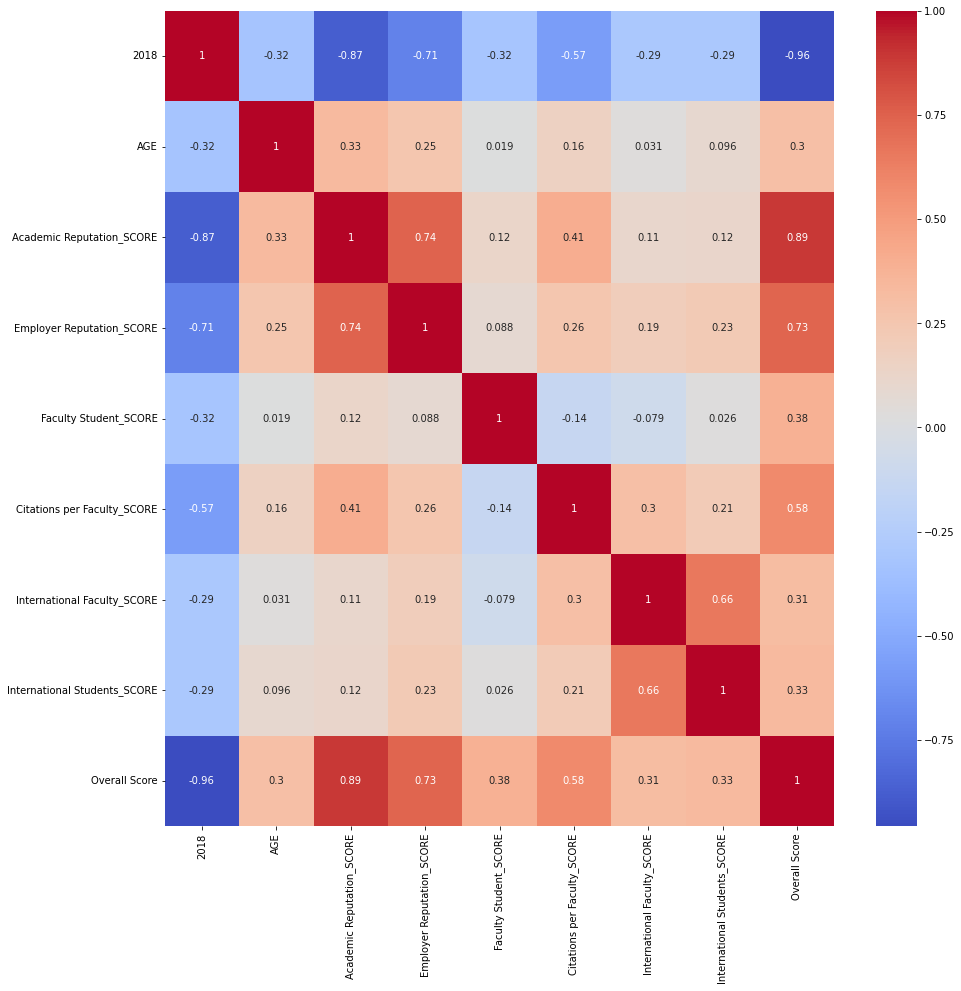

In [75]:
plt.figure(figsize=(15,15))
sns.heatmap(df2018.corr(), cmap='coolwarm', annot=True)
plt.show()

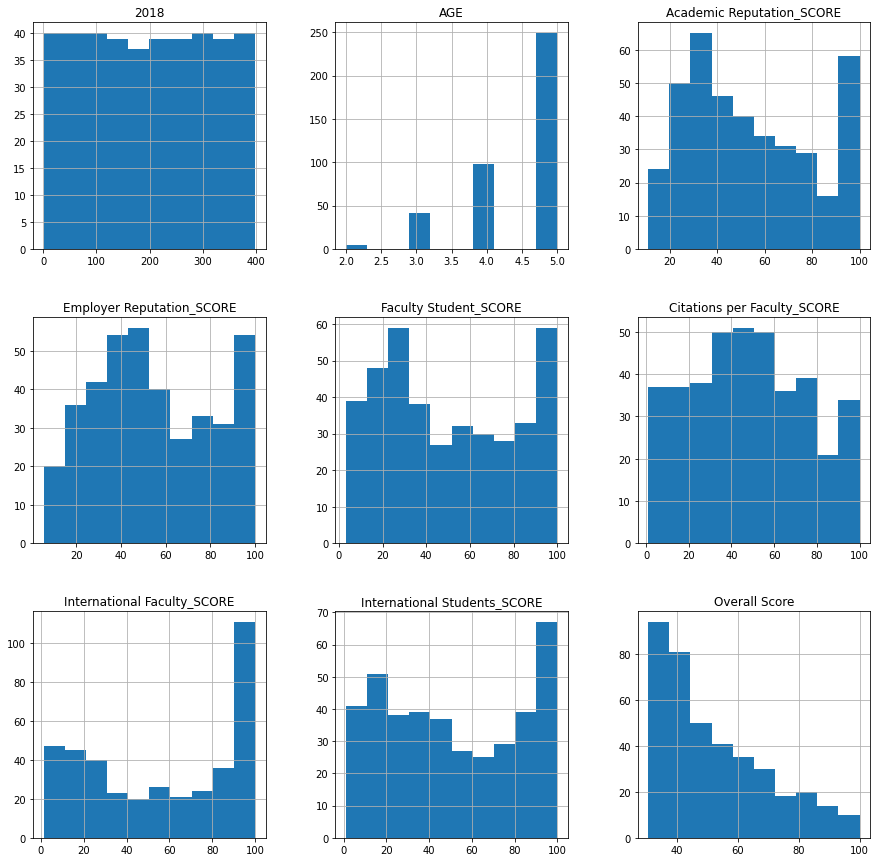

In [76]:
df2018.hist(figsize=(15,15))
plt.show()

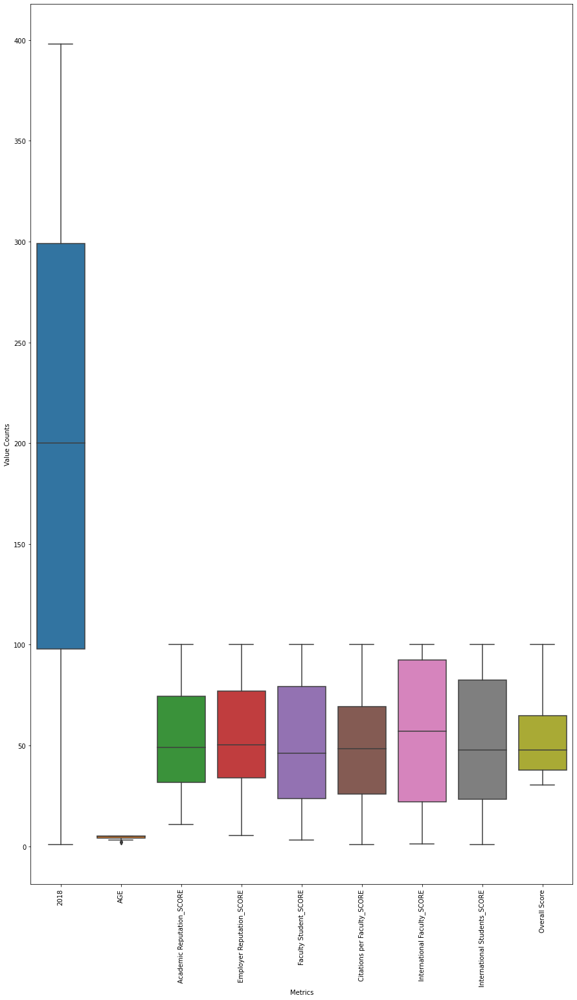

In [77]:
# Checking for outliers
fig,axis= plt.subplots(figsize=(15,25))
sns.boxplot(data=df2018)
plt.xticks(rotation=90)
plt.xlabel('Metrics')
plt.ylabel('Value Counts')
plt.show()

### Visualizations based on the six main metrics

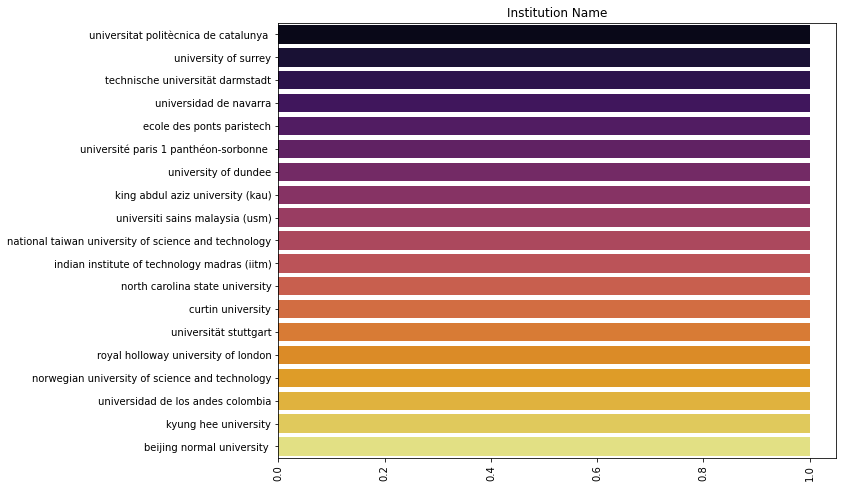

In [78]:
sns.barplot(df2018['Institution Name'].value_counts()[1:20].values,df2018['Institution Name'].value_counts()[1:20].index,palette=('inferno'))
plt.xticks(rotation=90)
fig=plt.gcf()
fig.set_size_inches(10,8)
plt.title('Institution Name')
plt.show()

Text(0.5, 1.0, 'Country')

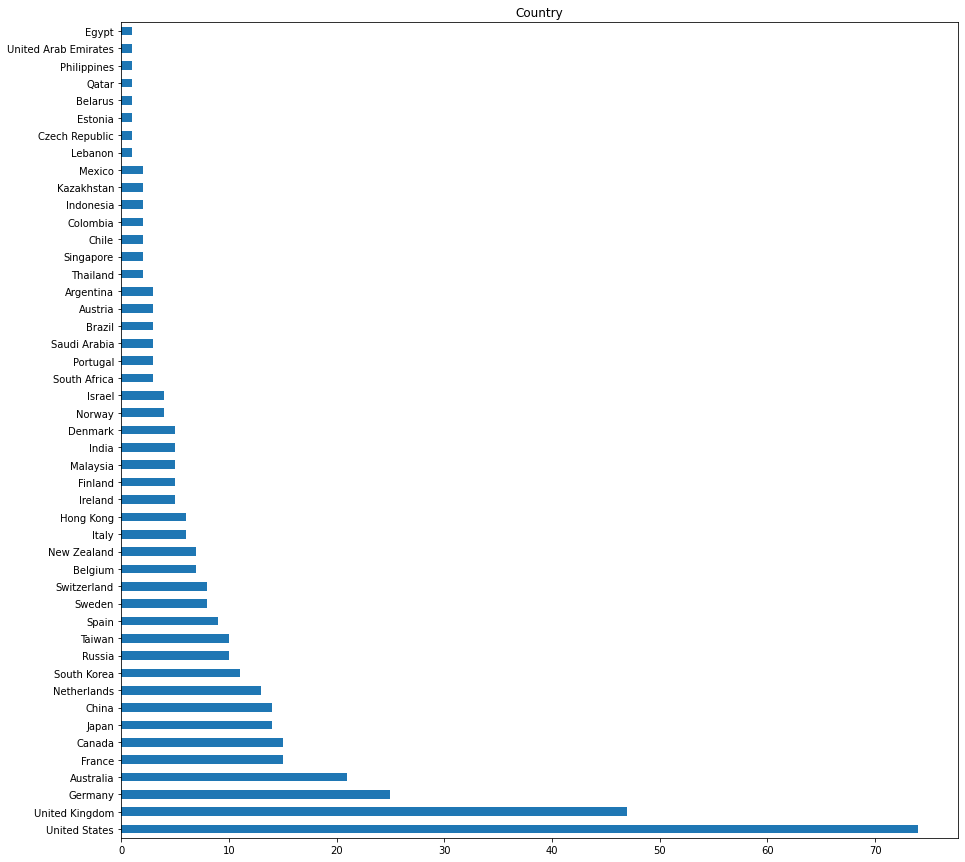

In [79]:
df2018['Country'].value_counts().head(1000).plot(kind='barh',figsize=[15,15])
plt.title('Country')

 In the year 2018, United States tends to be the continent with more number of universities.
It is followed by United Kingdom, then Germany, then Austrialia and least being Egypt(which happened to be the only represented African on this list)

In [80]:
print('Number of countries with ranked universities: ',df2018['Country'].nunique())

Number of countries with ranked universities:  47


 In the year 2018, out of the 195 countries in the world, only 47 countries have universities that are ranked.
Note:The number of countries in the world, comprises 193 countries that are member states of the United Nations and 2 countries that are non-member observer states: the Holy See and the State of Palestine

United States consists of more number of universities that have been ranked over the years followed by United Kingdom and Germany

### EDA FOR 2019 DATASET

In [81]:
df2019.head()

,2019,2018,Institution Name,Country,Classification_SIZE,FOCUS,RESEARCH INTENSITY,AGE,STATUS,Academic Reputation_SCORE,Employer Reputation_SCORE,Faculty Student_SCORE,Citations per Faculty_SCORE,International Faculty_SCORE,International Students_SCORE,Overall Score
0,1,1,massachusetts institute of technology (mit),United States,M,CO,VH,5.0,B,100.0,100.0,100.0,99.8,100.0,95.5,100.0
1,2,2,stanford university,United States,L,FC,VH,5.0,B,100.0,100.0,100.0,99.0,99.8,70.5,98.6
2,3,3,harvard university,United States,L,FC,VH,5.0,B,100.0,100.0,99.3,99.8,92.1,75.7,98.5
3,4,4,california institute of technology (caltech),United States,S,CO,VH,5.0,B,98.7,81.2,100.0,100.0,96.8,90.3,97.2
4,5,6,university of oxford,United Kingdom,L,FC,VH,5.0,A,100.0,100.0,100.0,83.0,99.6,98.8,96.8


In [82]:
df2019.dtypes

2019                              int64
2018                             object
Institution Name                 object
Country                          object
Classification_SIZE              object
FOCUS                            object
RESEARCH INTENSITY               object
AGE                             float64
STATUS                           object
Academic Reputation_SCORE       float64
Employer Reputation_SCORE       float64
Faculty Student_SCORE           float64
Citations per Faculty_SCORE     float64
International Faculty_SCORE     float64
International Students_SCORE    float64
Overall Score                   float64
dtype: object

In [83]:
df2019.shape

(490, 16)

In [84]:
print(df2019["Classification_SIZE"].unique())
print(df2019["FOCUS"].unique())
print(df2019["RESEARCH INTENSITY"].unique())
print(df2019["STATUS"].unique())

['M' 'L' 'S' 'XL']
['CO' 'FC' 'FO' 'SP']
['VH' 'HI' 'MD' 'LO']
['B' 'A']


In [85]:
df2019.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 490 entries, 0 to 489
Data columns (total 16 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   2019                          490 non-null    int64  
 1   2018                          490 non-null    object 
 2   Institution Name              490 non-null    object 
 3   Country                       490 non-null    object 
 4   Classification_SIZE           490 non-null    object 
 5   FOCUS                         490 non-null    object 
 6   RESEARCH INTENSITY            490 non-null    object 
 7   AGE                           490 non-null    float64
 8   STATUS                        490 non-null    object 
 9   Academic Reputation_SCORE     490 non-null    float64
 10  Employer Reputation_SCORE     490 non-null    float64
 11  Faculty Student_SCORE         490 non-null    float64
 12  Citations per Faculty_SCORE   490 non-null    float64
 13  Inter

In [86]:
df2019.isnull().sum()

2019                            0
2018                            0
Institution Name                0
Country                         0
Classification_SIZE             0
FOCUS                           0
RESEARCH INTENSITY              0
AGE                             0
STATUS                          0
Academic Reputation_SCORE       0
Employer Reputation_SCORE       0
Faculty Student_SCORE           0
Citations per Faculty_SCORE     0
International Faculty_SCORE     0
International Students_SCORE    0
Overall Score                   0
dtype: int64

In [87]:
df2019.describe()

,2019,AGE,Academic Reputation_SCORE,Employer Reputation_SCORE,Faculty Student_SCORE,Citations per Faculty_SCORE,International Faculty_SCORE,International Students_SCORE,Overall Score
count,490.000000,490.000000,490.000000,490.000000,490.000000,490.000000,490.000000,490.000000,490.000000
mean,248.614286,4.418367,39.974898,40.228980,51.575918,44.437347,54.044490,47.555714,44.412041
std,144.127529,0.805445,26.717052,28.107388,30.178951,26.807194,35.070831,32.565898,18.647095
min,1.000000,1.000000,3.000000,2.500000,4.000000,1.000000,1.500000,1.000000,23.500000
25%,125.250000,4.000000,18.925000,16.725000,24.475000,22.750000,20.225000,17.525000,29.450000
50%,247.500000,5.000000,31.750000,32.550000,47.500000,44.000000,55.600000,42.150000,38.350000
75%,372.750000,5.000000,56.700000,58.400000,81.075000,62.375000,92.350000,79.250000,54.325000
max,500.000000,5.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000


In [88]:
df2019.corr()

,2019,AGE,Academic Reputation_SCORE,Employer Reputation_SCORE,Faculty Student_SCORE,Citations per Faculty_SCORE,International Faculty_SCORE,International Students_SCORE,Overall Score
2019,1.000000,-0.288461,-0.843618,-0.738337,-0.329242,-0.553341,-0.387310,-0.366071,-0.931279
AGE,-0.288461,1.000000,0.332966,0.198127,0.046367,0.155303,-0.036445,0.028346,0.280123
Academic Reputation_SCORE,-0.843618,0.332966,1.000000,0.800386,0.155495,0.434470,0.207380,0.205002,0.908832
Employer Reputation_SCORE,-0.738337,0.198127,0.800386,1.000000,0.141180,0.300173,0.260293,0.284343,0.792828
Faculty Student_SCORE,-0.329242,0.046367,0.155495,0.141180,1.000000,-0.180350,-0.066467,0.013614,0.378178
Citations per Faculty_SCORE,-0.553341,0.155303,0.434470,0.300173,-0.180350,1.000000,0.315012,0.235440,0.575048
International Faculty_SCORE,-0.387310,-0.036445,0.207380,0.260293,-0.066467,0.315012,1.000000,0.666796,0.380348
International Students_SCORE,-0.366071,0.028346,0.205002,0.284343,0.013614,0.235440,0.666796,1.000000,0.383434
Overall Score,-0.931279,0.280123,0.908832,0.792828,0.378178,0.575048,0.380348,0.383434,1.000000


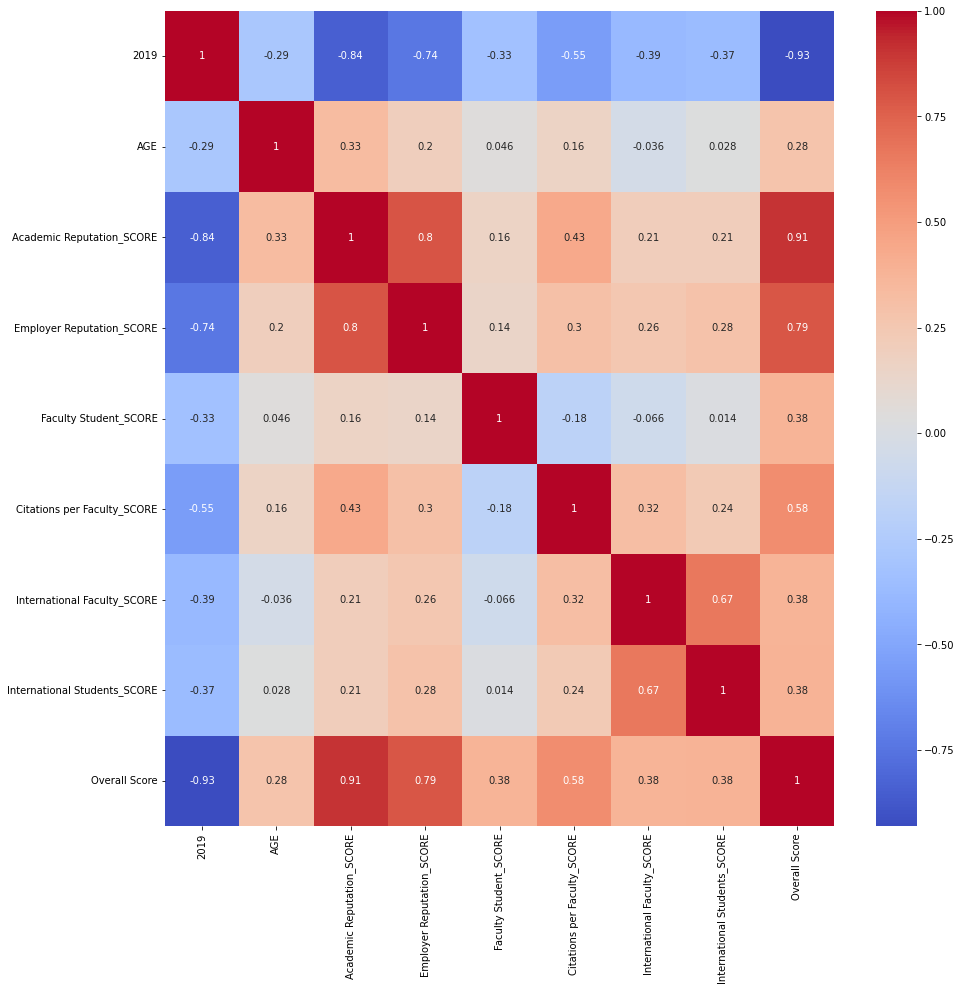

In [89]:
plt.figure(figsize=(15,15))
sns.heatmap(df2019.corr(), cmap='coolwarm', annot=True)
plt.show()

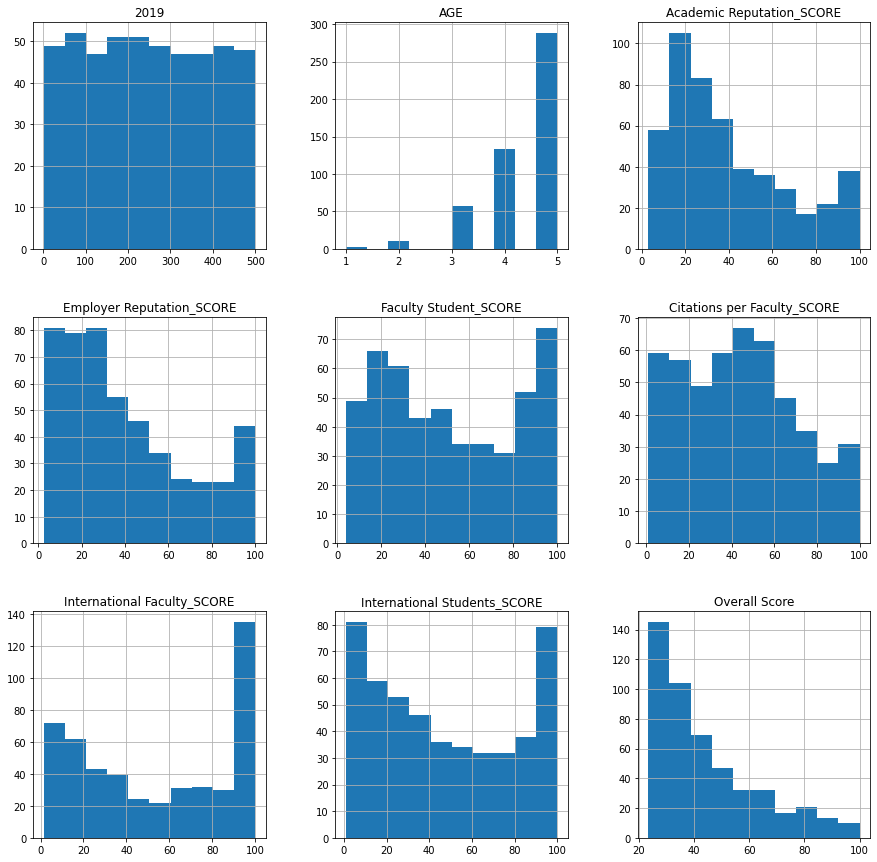

In [90]:
df2019.hist(figsize=(15,15))
plt.show()

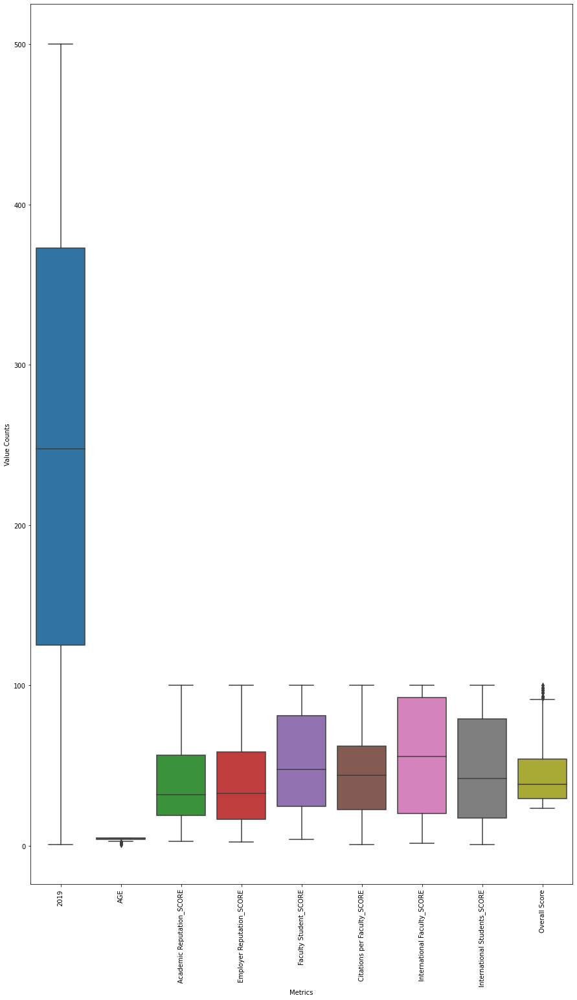

In [91]:
fig,axis= plt.subplots(figsize=(15,25))
sns.boxplot(data=df2019)
plt.xticks(rotation=90)
plt.xlabel('Metrics')
plt.ylabel('Value Counts')
plt.show()

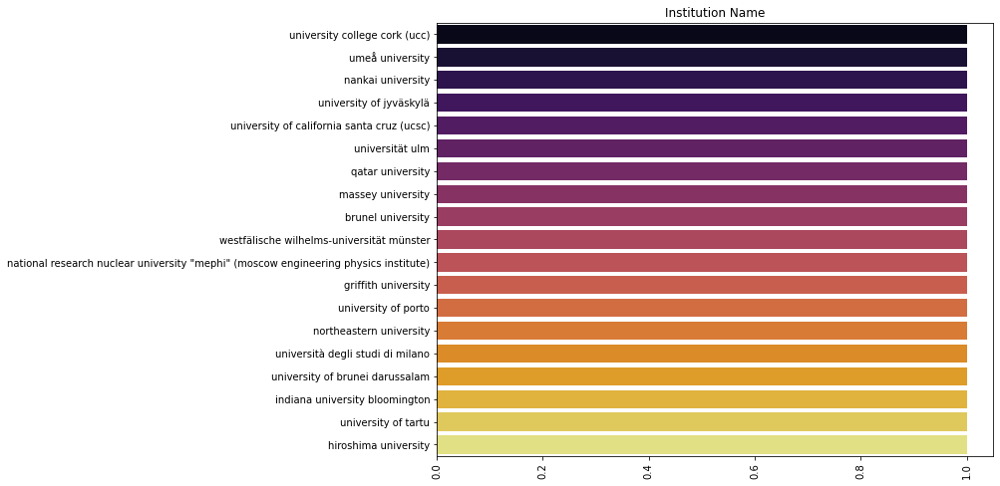

In [92]:
sns.barplot(df2019['Institution Name'].value_counts()[1:20].values,df2019['Institution Name'].value_counts()[1:20].index,palette=('inferno'))
plt.xticks(rotation=90)
fig=plt.gcf()
fig.set_size_inches(10,8)
plt.title('Institution Name')
plt.show()

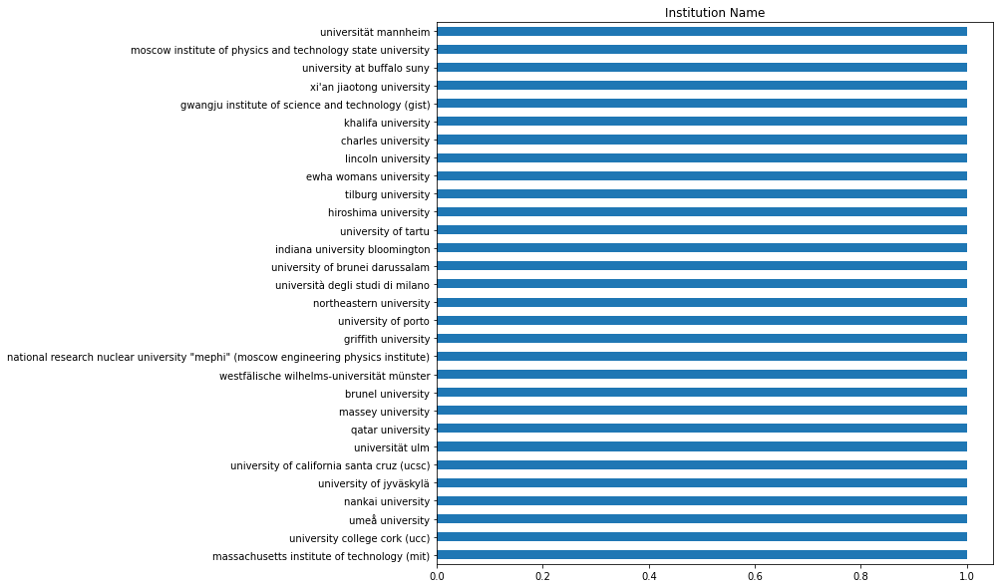

In [93]:
df2019['Institution Name'].value_counts().head(30).plot(kind='barh',figsize=[10,10])
plt.title('Institution Name')
plt.show()

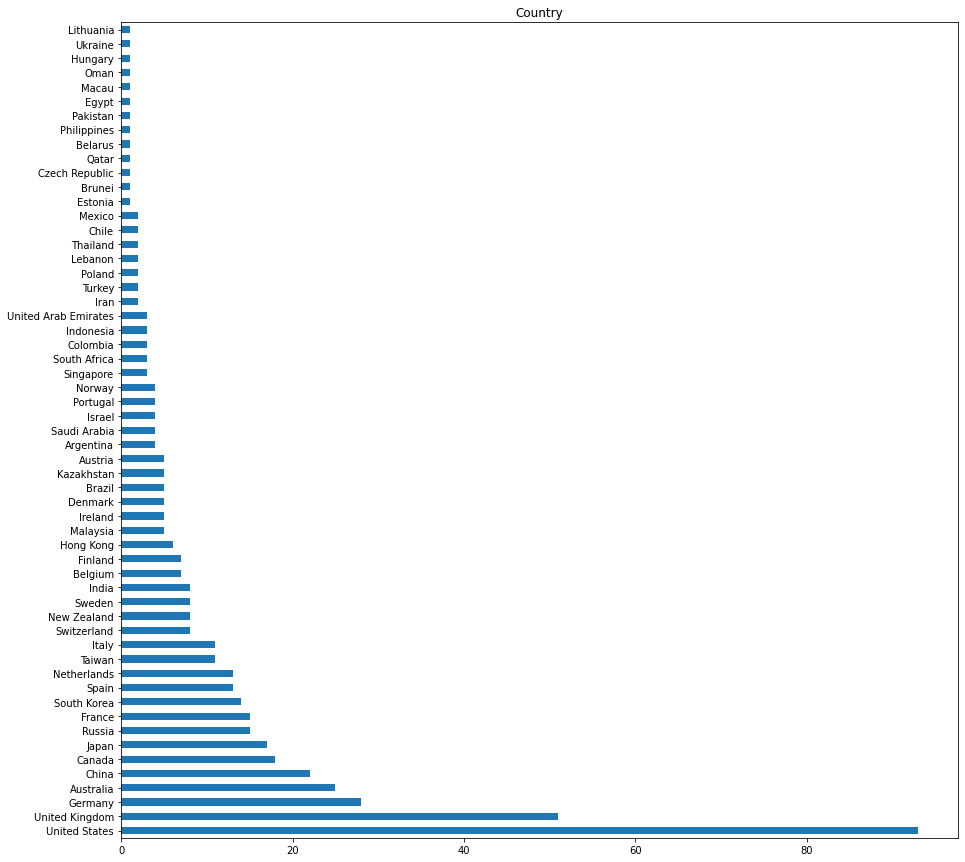

In [94]:
df2019['Country'].value_counts().head(1000).plot(kind='barh',figsize=[15,15])
plt.title('Country')
plt.show()

 In the year 2019, United States tends to be the continent with more number of universities.
It is followed by United Kingdom and least being Egypt.

In [95]:
print('Number of countries with ranked universities: ',df2019['Country'].nunique())

Number of countries with ranked universities:  57


In the year 2019, out of the 195 countries in the world, only 57 countries have universities that are ranked.
Note:The number of countries in the world, comprises 193 countries that are member states of the United Nations and 2 countries that are non-member observer states: the Holy See and the State of Palestine

### EDA FOR 2020 DATASET

In [96]:
df2020.head()

,Rank in 2020,Rank in 2019,Institution Name,Country,Classification_SIZE,FOCUS,RESEARCH INTENSITY,AGE,STATUS,Academic Reputation_SCORE,Employer Reputation_SCORE,Faculty Student_SCORE,Citations per Faculty_SCORE,International Faculty_SCORE,International Students_SCORE,Overall Score
0,1,1,massachusetts institute of technology (mit),United States,M,CO,VH,5.0,B,100.0,100.0,100.0,99.8,100.0,94.1,100.0
1,2,2,stanford university,United States,L,FC,VH,5.0,B,100.0,100.0,100.0,98.6,99.8,67.7,98.4
2,3,3,harvard university,United States,L,FC,VH,5.0,B,100.0,100.0,98.7,99.6,86.3,62.2,97.4
3,4,5,university of oxford,United Kingdom,L,FC,VH,5.0,A,100.0,100.0,100.0,84.7,99.7,98.5,97.2
4,5,4,california institute of technology (caltech),United States,S,CO,VH,5.0,B,97.8,81.2,100.0,100.0,99.4,87.3,96.9


In [97]:
df2020.dtypes

Rank in 2020                      int64
Rank in 2019                     object
Institution Name                 object
Country                          object
Classification_SIZE              object
FOCUS                            object
RESEARCH INTENSITY               object
AGE                             float64
STATUS                           object
Academic Reputation_SCORE       float64
Employer Reputation_SCORE       float64
Faculty Student_SCORE           float64
Citations per Faculty_SCORE     float64
International Faculty_SCORE     float64
International Students_SCORE    float64
Overall Score                   float64
dtype: object

In [98]:
df2020.shape

(485, 16)

In [99]:
print(df2020["Classification_SIZE"].unique())
print(df2020["FOCUS"].unique())
print(df2020["RESEARCH INTENSITY"].unique())
print(df2020["STATUS"].unique())

['M' 'L' 'S' 'XL']
['CO' 'FC' 'FO' 'SP']
['VH' 'HI' 'MD' 'LO']
['B' 'A' 'C']


In [100]:
df2020.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 485 entries, 0 to 484
Data columns (total 16 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Rank in 2020                  485 non-null    int64  
 1   Rank in 2019                  485 non-null    object 
 2   Institution Name              485 non-null    object 
 3   Country                       485 non-null    object 
 4   Classification_SIZE           485 non-null    object 
 5   FOCUS                         485 non-null    object 
 6   RESEARCH INTENSITY            485 non-null    object 
 7   AGE                           485 non-null    float64
 8   STATUS                        485 non-null    object 
 9   Academic Reputation_SCORE     485 non-null    float64
 10  Employer Reputation_SCORE     485 non-null    float64
 11  Faculty Student_SCORE         485 non-null    float64
 12  Citations per Faculty_SCORE   485 non-null    float64
 13  Inter

In [101]:
df2020.describe()

,Rank in 2020,AGE,Academic Reputation_SCORE,Employer Reputation_SCORE,Faculty Student_SCORE,Citations per Faculty_SCORE,International Faculty_SCORE,International Students_SCORE,Overall Score
count,485.000000,485.000000,485.000000,485.000000,485.000000,485.000000,485.000000,485.000000,485.000000
mean,247.635052,4.387629,41.305773,40.708247,50.191959,43.934433,53.832784,46.307010,44.572577
std,144.345362,0.875665,26.834000,28.457222,30.307686,26.172425,35.597958,32.749819,18.633264
min,1.000000,1.000000,3.800000,1.900000,2.500000,1.000000,1.300000,1.000000,24.200000
25%,123.000000,4.000000,19.300000,16.800000,23.600000,22.300000,18.000000,17.000000,29.400000
50%,246.000000,5.000000,33.900000,33.900000,45.800000,44.300000,51.900000,39.700000,38.400000
75%,372.000000,5.000000,58.600000,59.600000,79.500000,62.000000,92.100000,75.400000,54.300000
max,498.000000,5.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000


In [102]:
df2020.isnull().sum()

Rank in 2020                    0
Rank in 2019                    0
Institution Name                0
Country                         0
Classification_SIZE             0
FOCUS                           0
RESEARCH INTENSITY              0
AGE                             0
STATUS                          0
Academic Reputation_SCORE       0
Employer Reputation_SCORE       0
Faculty Student_SCORE           0
Citations per Faculty_SCORE     0
International Faculty_SCORE     0
International Students_SCORE    0
Overall Score                   0
dtype: int64

In [103]:
df2020.corr()

,Rank in 2020,AGE,Academic Reputation_SCORE,Employer Reputation_SCORE,Faculty Student_SCORE,Citations per Faculty_SCORE,International Faculty_SCORE,International Students_SCORE,Overall Score
Rank in 2020,1.000000,-0.299107,-0.853298,-0.741307,-0.324204,-0.528713,-0.393857,-0.375066,-0.932437
AGE,-0.299107,1.000000,0.289762,0.230669,0.102235,0.167269,-0.016210,0.023406,0.283956
Academic Reputation_SCORE,-0.853298,0.289762,1.000000,0.799148,0.159652,0.419841,0.210199,0.208908,0.909432
Employer Reputation_SCORE,-0.741307,0.230669,0.799148,1.000000,0.139503,0.306879,0.230772,0.269114,0.793012
Faculty Student_SCORE,-0.324204,0.102235,0.159652,0.139503,1.000000,-0.200431,-0.075757,0.020407,0.378022
Citations per Faculty_SCORE,-0.528713,0.167269,0.419841,0.306879,-0.200431,1.000000,0.348576,0.240387,0.560721
International Faculty_SCORE,-0.393857,-0.016210,0.210199,0.230772,-0.075757,0.348576,1.000000,0.684255,0.386537
International Students_SCORE,-0.375066,0.023406,0.208908,0.269114,0.020407,0.240387,0.684255,1.000000,0.390183
Overall Score,-0.932437,0.283956,0.909432,0.793012,0.378022,0.560721,0.386537,0.390183,1.000000


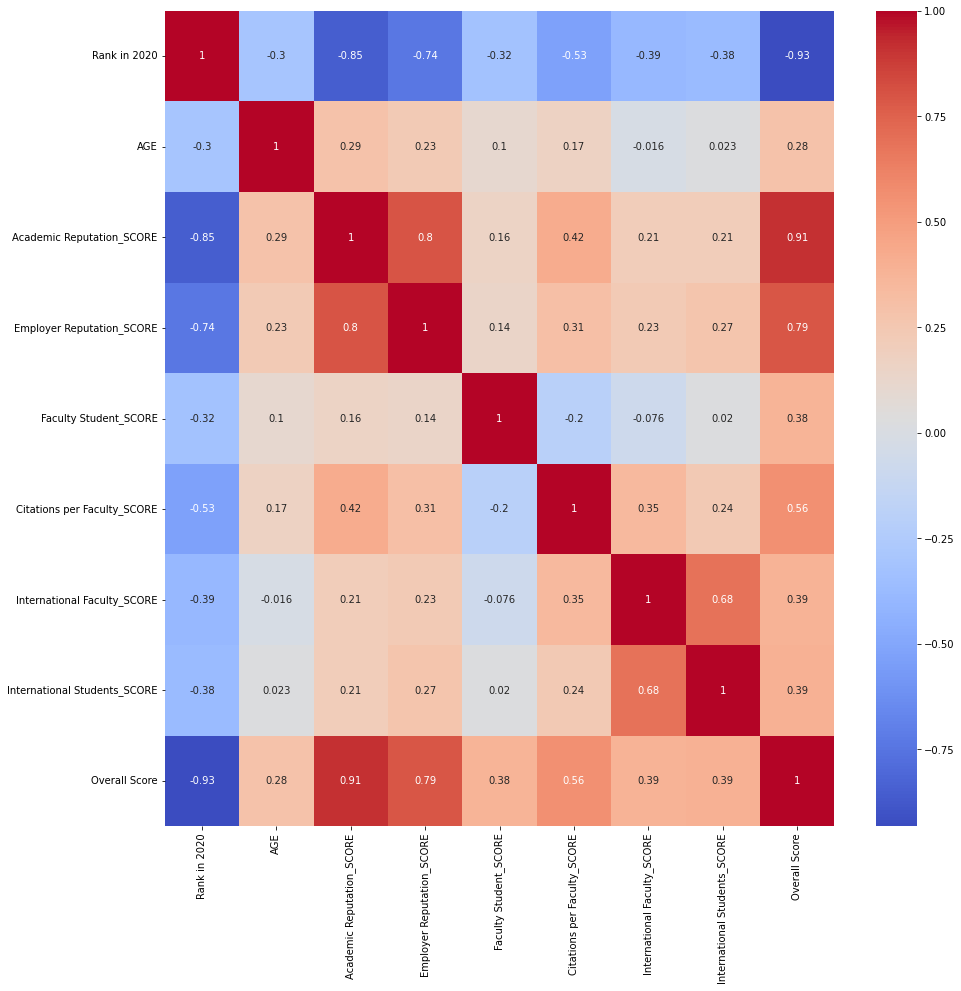

In [104]:
plt.figure(figsize=(15,15))
sns.heatmap(df2020.corr(), cmap='coolwarm', annot=True)
plt.show()

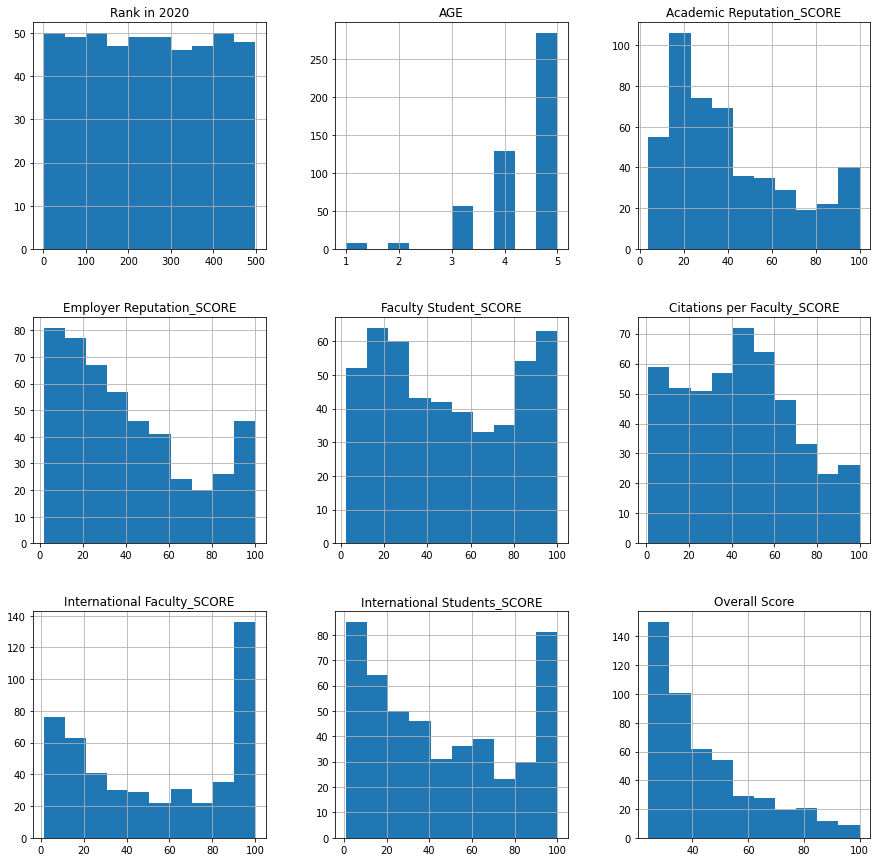

In [105]:
df2020.hist(figsize=(15,15))
plt.show()

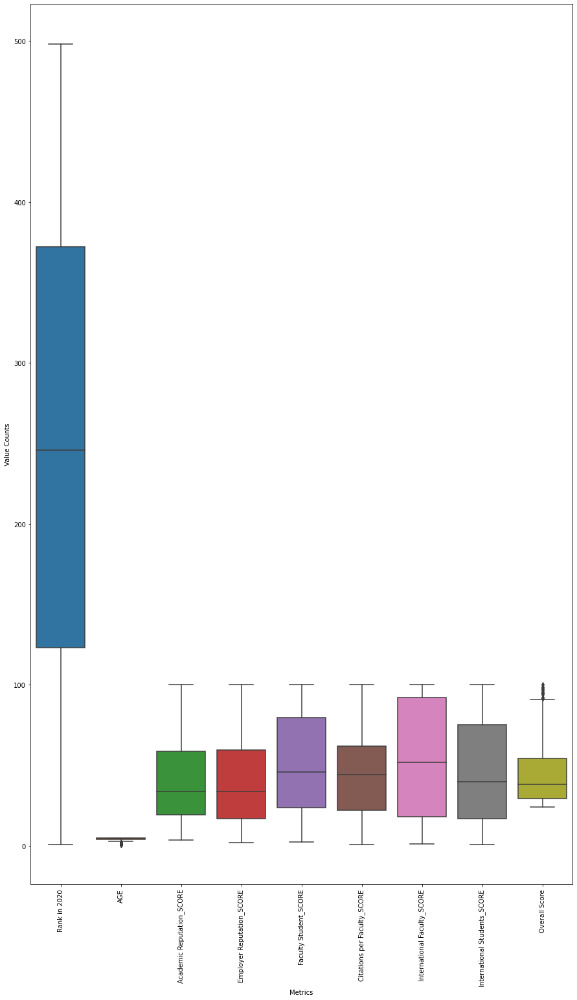

In [106]:
fig,axis= plt.subplots(figsize=(15,25))
sns.boxplot(data=df2020)
plt.xticks(rotation=90)
plt.xlabel('Metrics')
plt.ylabel('Value Counts')
plt.show()

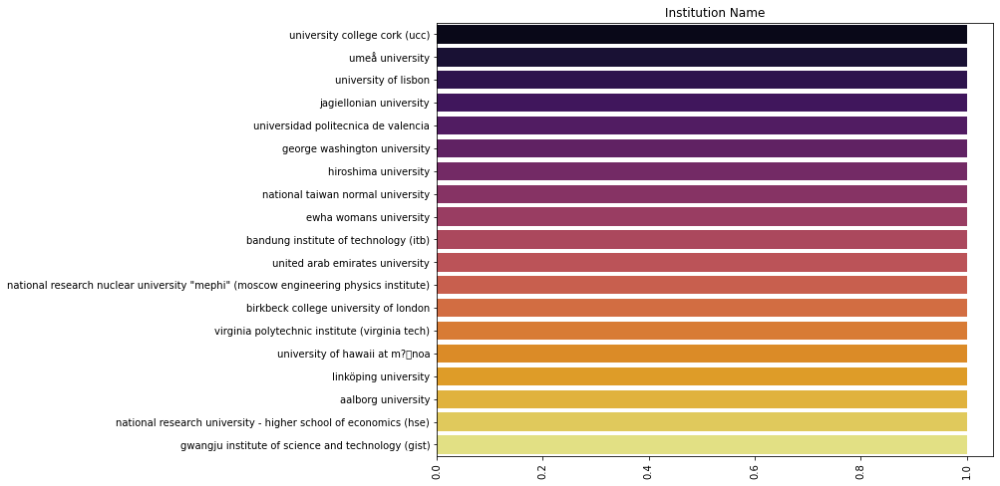

In [107]:
sns.barplot(df2020['Institution Name'].value_counts()[1:20].values,df2020['Institution Name'].value_counts()[1:20].index,palette=('inferno'))
plt.xticks(rotation=90)
fig=plt.gcf()
fig.set_size_inches(10,8)
plt.title('Institution Name')
plt.show()

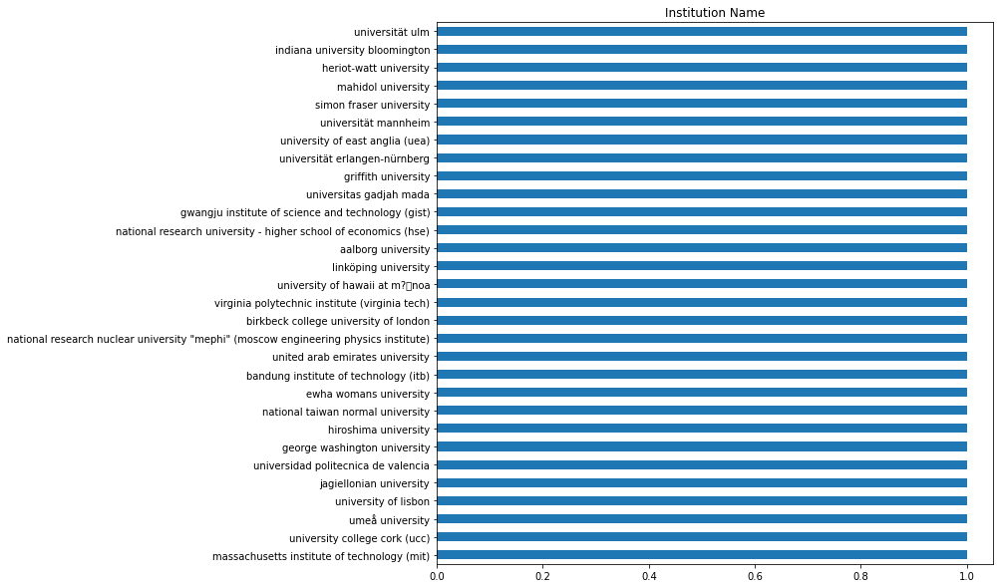

In [108]:
df2020['Institution Name'].value_counts().head(30).plot(kind='barh',figsize=[10,10])
plt.title('Institution Name')
plt.show()

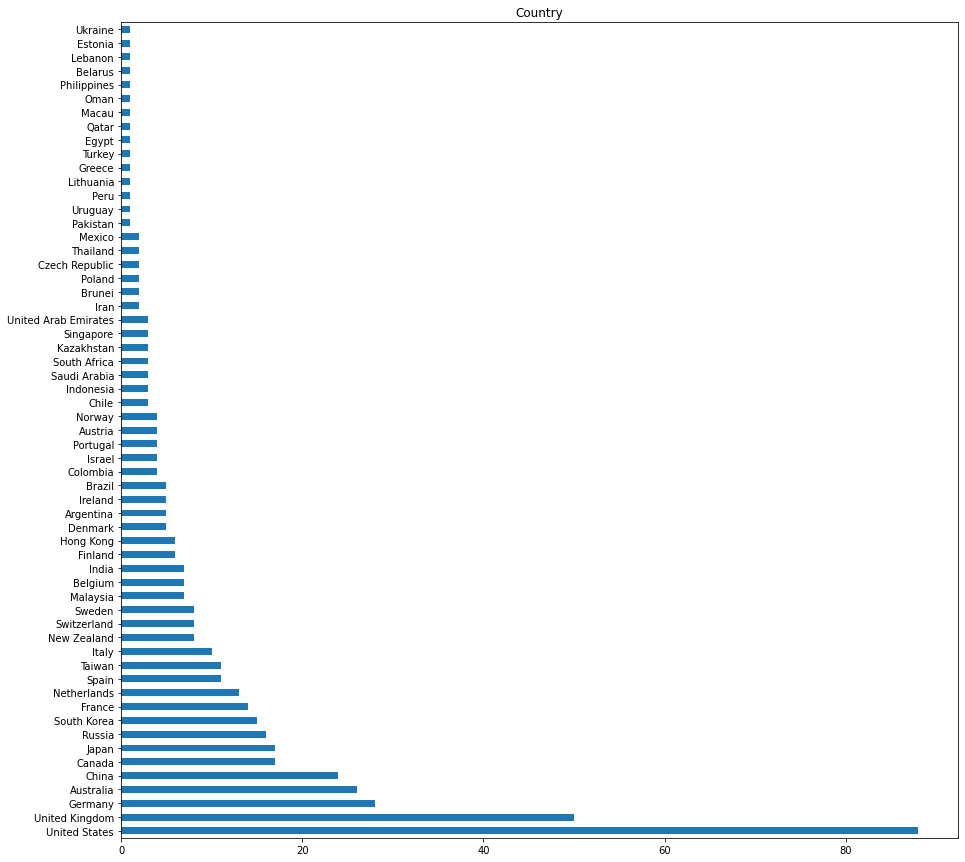

In [109]:
df2020['Country'].value_counts().head(1000).plot(kind='barh',figsize=[15,15])
plt.title('Country')
plt.show()

 In the year 2020, United States tends to be the continent with more number of universities.
It is followed by United Kingdom and least being Egypt.

In [110]:
print('Number of countries with ranked universities: ',df2020['Country'].nunique())

Number of countries with ranked universities:  59


In the year 2020, out of the 195 countries in the world, only 59 countries have universities that are ranked. Note:The number of countries in the world, comprises 193 countries that are member states of the United Nations and 2 countries that are non-member observer states: the Holy See and the State of Palestine

### 2018 UNIVARIATE

In [111]:
bill_pay = df2018.loc[:,['2018', '2017', 'Institution Name', 'Country', 'Classification_SIZE',
       'FOCUS', 'RESEARCH INTENSITY', 'AGE', 'STATUS',
       'Academic Reputation_SCORE', 'Employer Reputation_SCORE',
       'Faculty Student_SCORE', 'Citations per Faculty_SCORE',
       'International Faculty_SCORE', 'International Students_SCORE',
       'Overall Score']]
for i in bill_pay:
    print('The maximum value for', i,' is:',df2018[i].max(),'while the minimum value is:',df2018[i].min())

The maximum value for 2018  is: 398 while the minimum value is: 1
The maximum value for 2017  is: 98 while the minimum value is: 1
The maximum value for Institution Name  is: zhejiang university while the minimum value is: aalborg university
The maximum value for Country  is: United States while the minimum value is: Argentina
The maximum value for Classification_SIZE  is: XL while the minimum value is: L
The maximum value for FOCUS  is: SP while the minimum value is: CO
The maximum value for RESEARCH INTENSITY  is: VH while the minimum value is: HI
The maximum value for AGE  is: 5.0 while the minimum value is: 2.0
The maximum value for STATUS  is: B while the minimum value is: A
The maximum value for Academic Reputation_SCORE  is: 100.0 while the minimum value is: 10.9
The maximum value for Employer Reputation_SCORE  is: 100.0 while the minimum value is: 5.4
The maximum value for Faculty Student_SCORE  is: 100.0 while the minimum value is: 3.2
The maximum value for Citations per Facul

In [112]:
bin_edges = [10,20,30,40,50,60,70,80,90,100]
bin_names = ['below_10','below_20','below_30','below_40','below_50','below_60','below_70','below_80','below_90']
df2018['Academic Reputation SCORE'] = pd.cut(df2018['Academic Reputation_SCORE'], bin_edges, labels=bin_names)

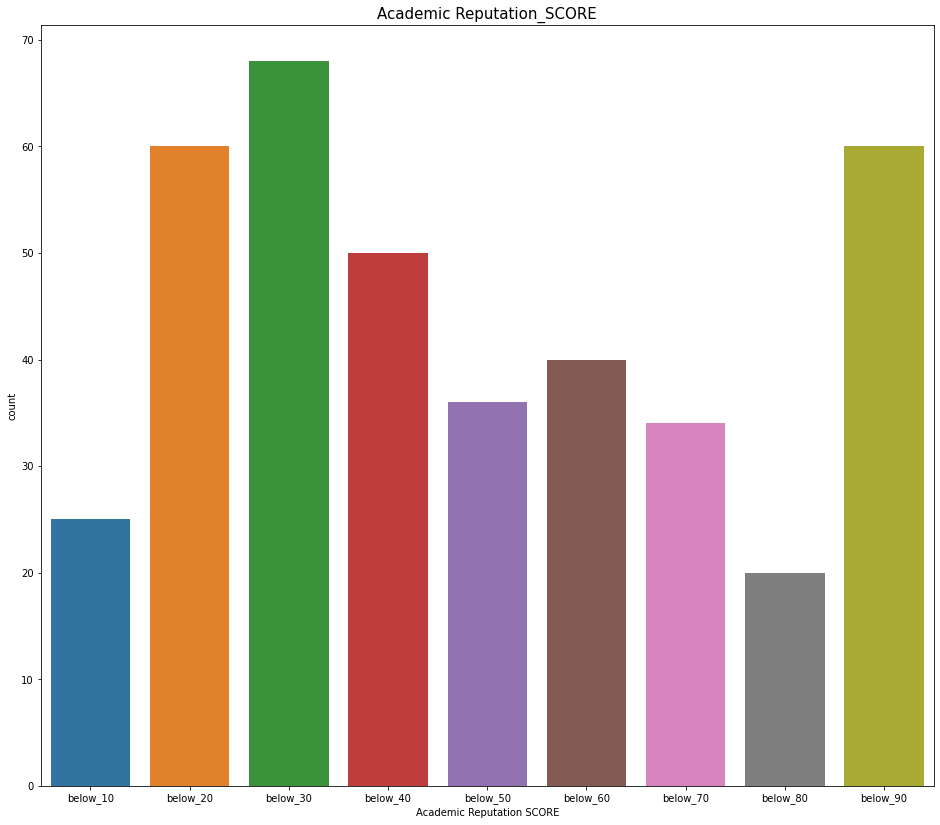

In [113]:
plt.figure(figsize=(16,14))
sns.countplot(df2018['Academic Reputation SCORE'])
plt.title('Academic Reputation_SCORE', fontsize = 15)
plt.savefig("Academic_Reputation_Score.png", bbox_inches='tight', dpi=500)
plt.show()

In [114]:
pd.DataFrame(df2018['Academic Reputation SCORE'].value_counts())

,Academic Reputation SCORE
below_30,68
below_20,60
below_90,60
below_40,50
below_60,40
below_50,36
below_70,34
below_10,25
below_80,20


Just 68 universities had academic reputation score of below 30

In [115]:
bin_edges = [10,20,30,40,50,60,70,80,90,100]
bin_names = ['below_10','below_20','below_30','below_40','below_50','below_60','below_70','below_80','below_90']
df2018['Employer Reputation SCORE'] = pd.cut(df2018['Employer Reputation_SCORE'], bin_edges, labels=bin_names)

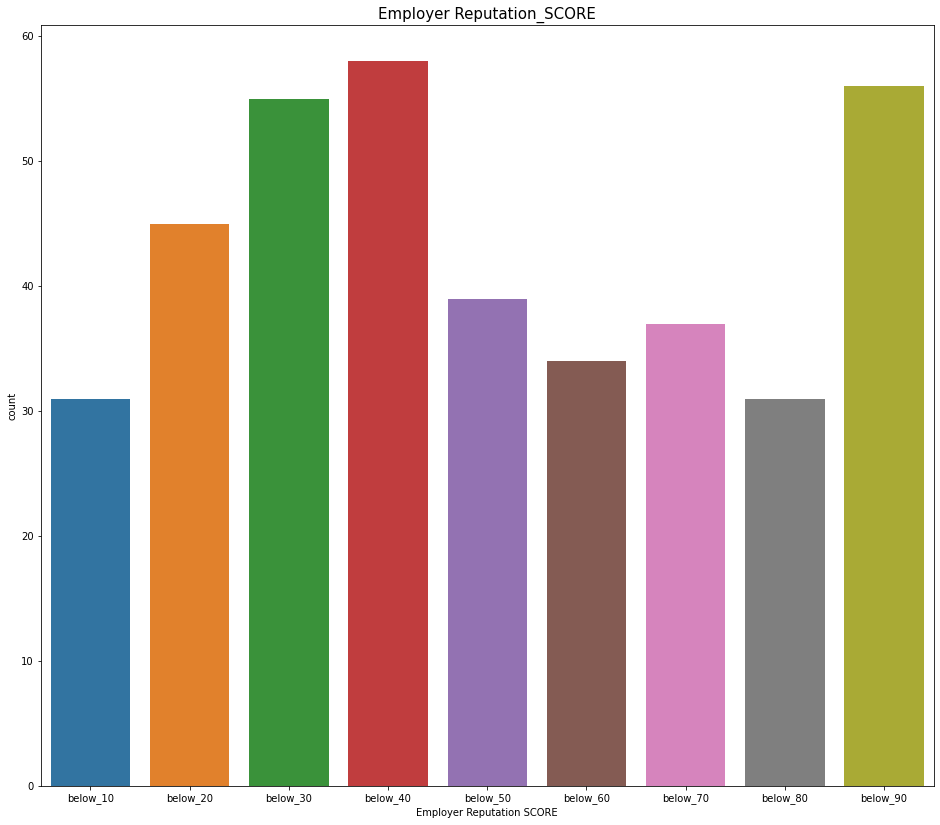

In [116]:
plt.figure(figsize=(16,14))
sns.countplot(df2018['Employer Reputation SCORE'])
plt.title('Employer Reputation_SCORE', fontsize = 15)
plt.show()

In [117]:
pd.DataFrame(df2018['Employer Reputation SCORE'].value_counts())

,Employer Reputation SCORE
below_40,58
below_90,56
below_30,55
below_20,45
below_50,39
below_70,37
below_60,34
below_10,31
below_80,31


In [118]:
bin_edges = [10,20,30,40,50,60,70,80,90,100]
bin_names = ['below_10','below_20','below_30','below_40','below_50','below_60','below_70','below_80','below_90']
df2018['Faculty Student SCORE'] = pd.cut(df2018['Faculty Student_SCORE'], bin_edges, labels=bin_names)

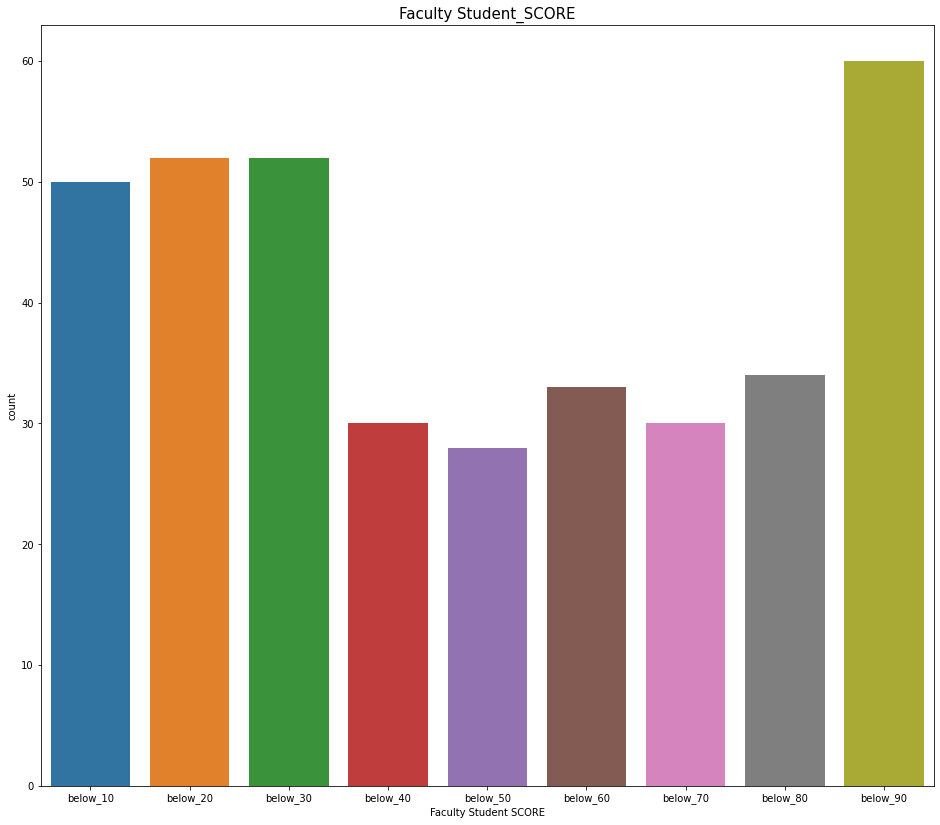

In [119]:
plt.figure(figsize=(16,14))
sns.countplot(df2018['Faculty Student SCORE'])
plt.title('Faculty Student_SCORE', fontsize = 15)
plt.show()

In [120]:
pd.DataFrame(df2018['Faculty Student SCORE'].value_counts())

,Faculty Student SCORE
below_90,60
below_20,52
below_30,52
below_10,50
below_80,34
below_60,33
below_40,30
below_70,30
below_50,28


In [121]:
bin_edges = [10,20,30,40,50,60,70,80,90,100]
bin_names = ['below_10','below_20','below_30','below_40','below_50','below_60','below_70','below_80','below_90']
df2018['Citations per Faculty SCORE'] = pd.cut(df2018['Citations per Faculty_SCORE'], bin_edges, labels=bin_names)

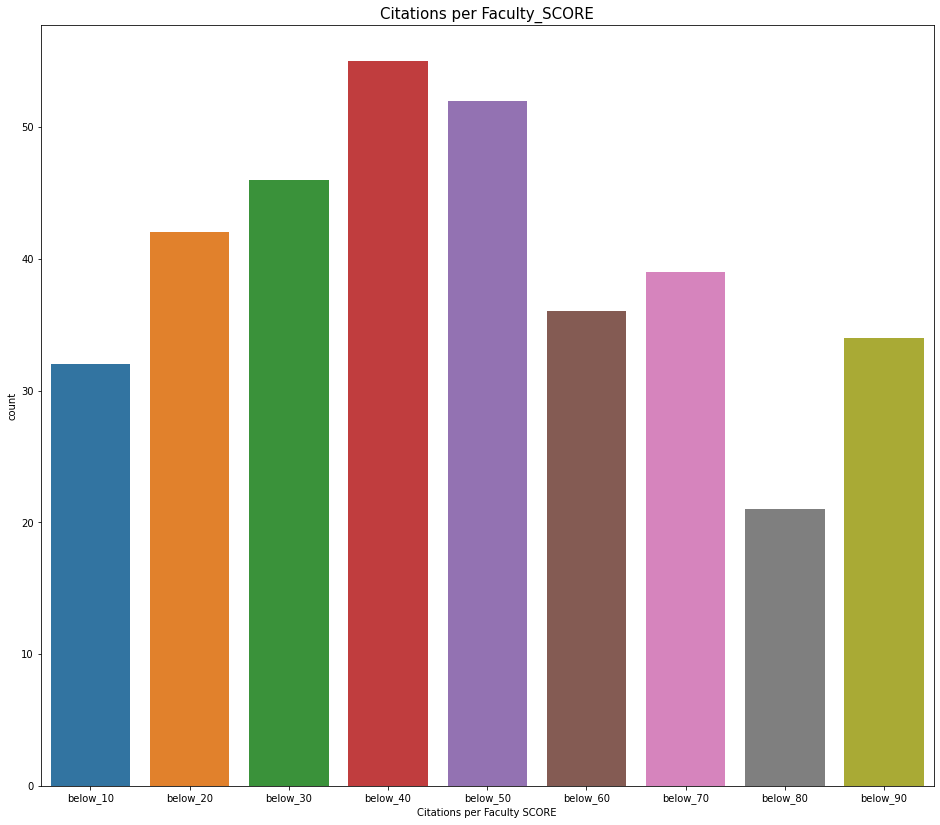

In [122]:
plt.figure(figsize=(16,14))
sns.countplot(df2018['Citations per Faculty SCORE'])
plt.title('Citations per Faculty_SCORE', fontsize = 15)
plt.show()

In [123]:
pd.DataFrame(df2018['Citations per Faculty SCORE'].value_counts())

,Citations per Faculty SCORE
below_40,55
below_50,52
below_30,46
below_20,42
below_70,39
below_60,36
below_90,34
below_10,32
below_80,21


In [124]:
bin_edges = [10,20,30,40,50,60,70,80,90,100]
bin_names = ['below_10','below_20','below_30','below_40','below_50','below_60','below_70','below_80','below_90']
df2018['International Faculty SCORE'] = pd.cut(df2018['International Faculty_SCORE'], bin_edges, labels=bin_names)

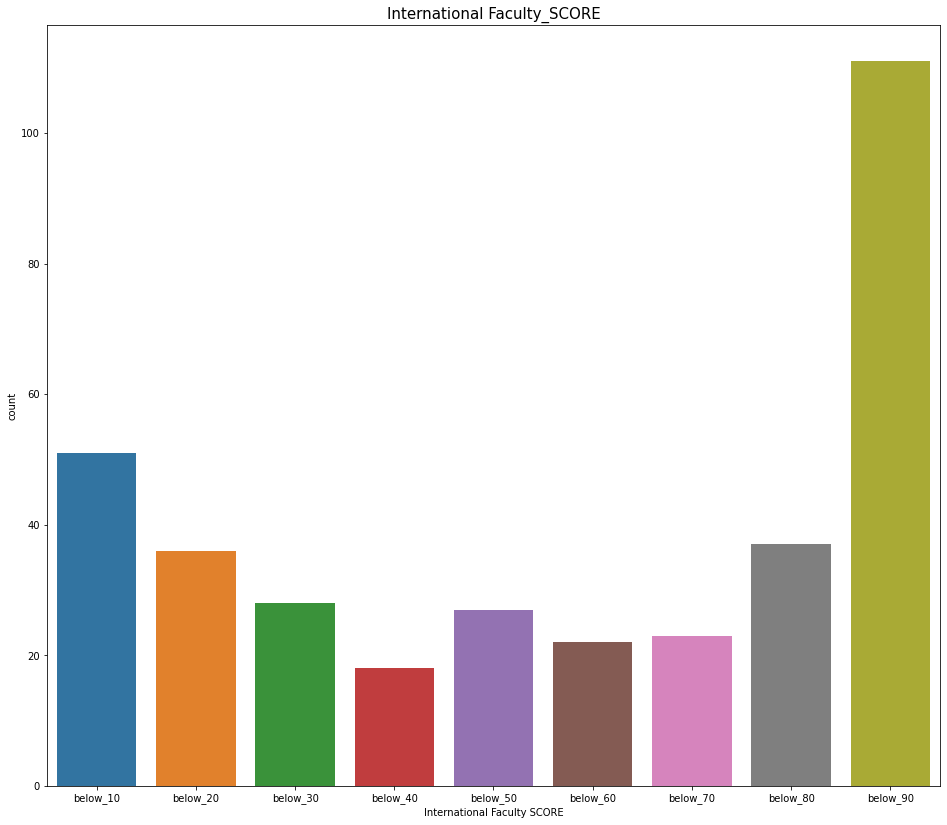

In [125]:
plt.figure(figsize=(16,14))
sns.countplot(df2018['International Faculty SCORE'])
plt.title('International Faculty_SCORE', fontsize = 15)
plt.show()

In [126]:
pd.DataFrame(df2018['International Faculty SCORE'].value_counts())

,International Faculty SCORE
below_90,111
below_10,51
below_80,37
below_20,36
below_30,28
below_50,27
below_70,23
below_60,22
below_40,18


In [127]:
bin_edges = [10,20,30,40,50,60,70,80,90,100]
bin_names = ['below_10','below_20','below_30','below_40','below_50','below_60','below_70','below_80','below_90']
df2018['International Students SCORE'] = pd.cut(df2018['International Students_SCORE'], bin_edges, labels=bin_names)

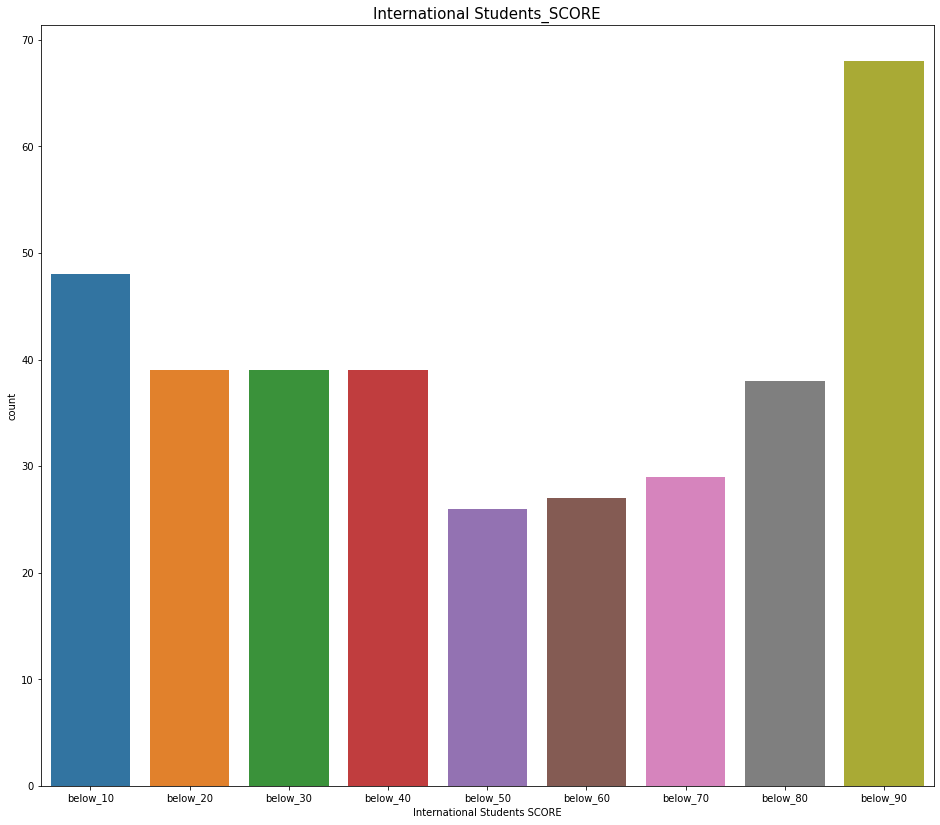

In [128]:
plt.figure(figsize=(16,14))
sns.countplot(df2018['International Students SCORE'])
plt.title('International Students_SCORE', fontsize = 15)
plt.show()

In [129]:
pd.DataFrame(df2018['International Students SCORE'].value_counts())

,International Students SCORE
below_90,68
below_10,48
below_20,39
below_30,39
below_40,39
below_80,38
below_70,29
below_60,27
below_50,26


In [130]:
bin_edges = [30,35,40,45,50,55,60,65,70,75,80,85,90,95,100]
bin_names = ['below_30','below_35','below_40','below_45','below_50','below_55','below_60','below_65','below_70','below_75','below_80','below_85','below_90','below_95']
df2018['Overall_Score'] = pd.cut(df2018['Overall Score'], bin_edges, labels=bin_names)

In [131]:
#pd.DataFrame(df2018['Score_class'].value_counts(normalize=True)*100)

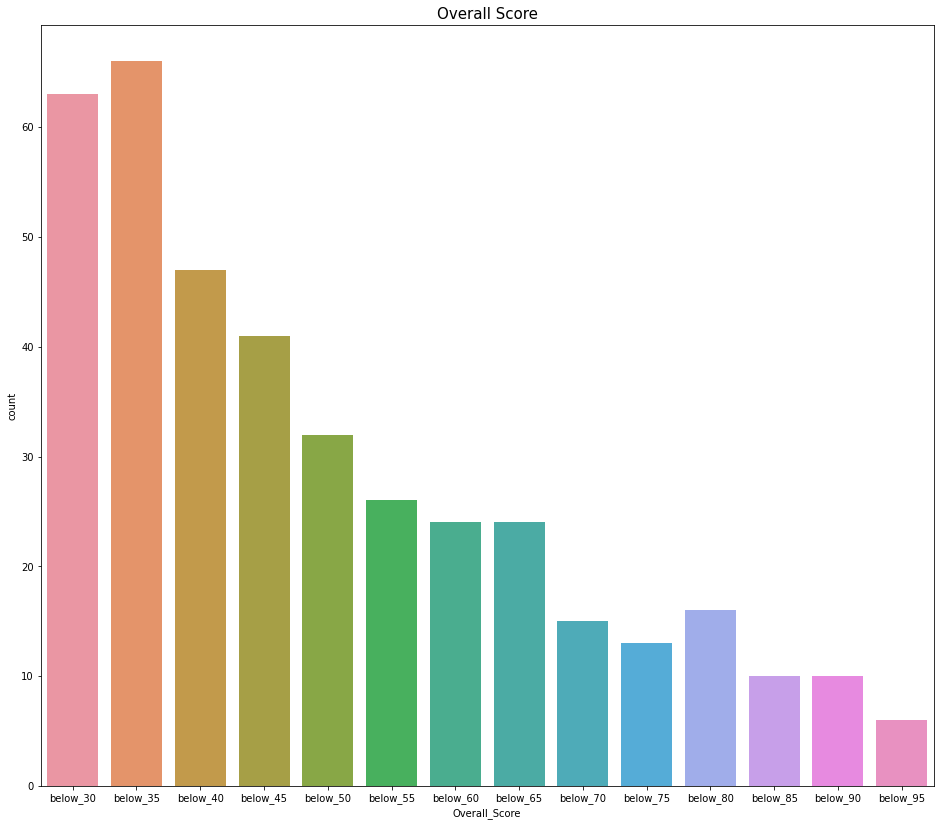

In [132]:
plt.figure(figsize=(16,14))
sns.countplot(df2018['Overall_Score'])
plt.title('Overall Score', fontsize = 15)
plt.show()

In [133]:
pd.DataFrame(df2018['Overall_Score'].value_counts())

,Overall_Score
below_35,66
below_30,63
below_40,47
below_45,41
below_50,32
below_55,26
below_60,24
below_65,24
below_80,16
below_70,15


In [134]:
grouped_country = pd.DataFrame(df2018.groupby('Country')['International Faculty_SCORE', 'International Students_SCORE'].mean()).reset_index()

In [135]:
grouped_country.sort_values(['International Faculty_SCORE', 'International Students_SCORE'],
                            ascending = False).head(10).style.bar(subset = ['International Faculty_SCORE',
                                                                            'International Students_SCORE'], color = 'green').set_properties(**{"border" : "2px solid white"})

,Country,International Faculty_SCORE,International Students_SCORE
33,Qatar,100.000000,99.900000
36,Singapore,100.000000,87.150000
44,United Arab Emirates,100.000000,76.300000
17,Hong Kong,99.966667,90.216667
41,Switzerland,99.950000,82.262500
25,Lebanon,99.200000,68.000000
35,Saudi Arabia,99.066667,43.300000
1,Australia,97.438095,82.695238
29,New Zealand,96.285714,76.885714
45,United Kingdom,91.772340,92.063830


The above Chart shows the top 10 countries with the highest mean International Faculty and International Student Scores. This provides an idea of how accessible these universites could be for international candidates. There are other factors which contribute to this, which are not covered in this analysis. For example, a University may be open to all, but barriers such as tuition, language, scholarship opportunities etc might be of hindrance for some candidates.

### 2019 UNIVARIATE

In [136]:
bin_edges = [10,20,30,40,50,60,70,80,90,100]
bin_names = ['below_10','below_20','below_30','below_40','below_50','below_60','below_70','below_80','below_90']
df2019['Academic Reputation SCORE'] = pd.cut(df2019['Academic Reputation_SCORE'], bin_edges, labels=bin_names)

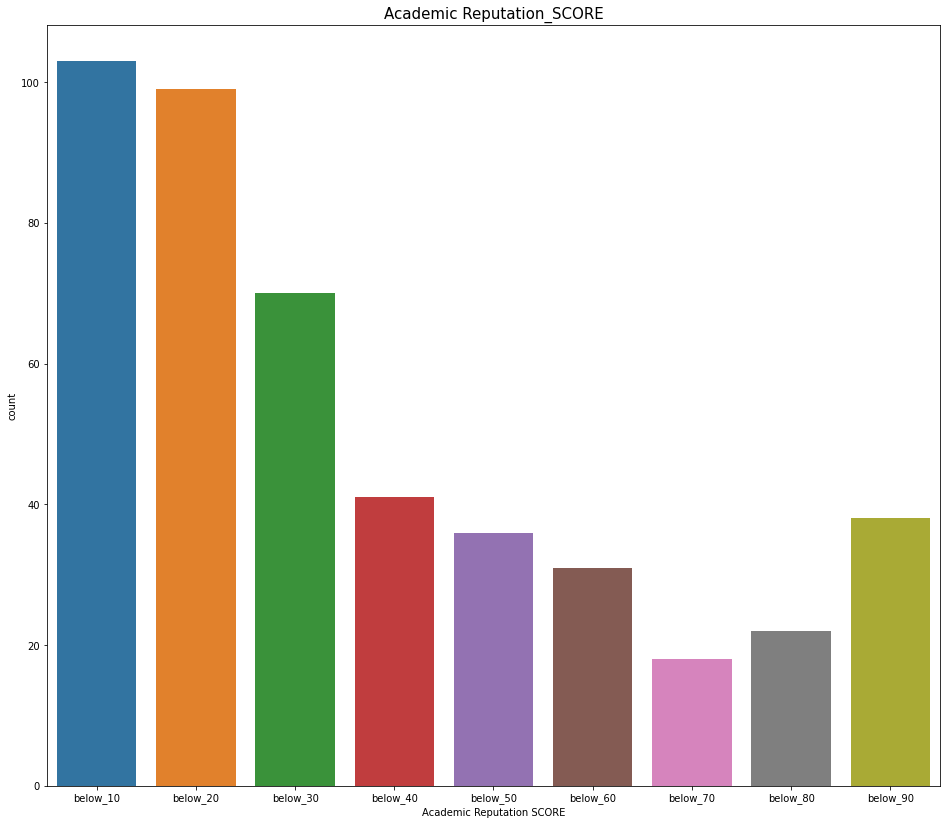

In [137]:
plt.figure(figsize=(16,14))
sns.countplot(df2019['Academic Reputation SCORE'])
plt.title('Academic Reputation_SCORE', fontsize = 15)
plt.show()

In [138]:
pd.DataFrame(df2019['Academic Reputation SCORE'].value_counts())

,Academic Reputation SCORE
below_10,103
below_20,99
below_30,70
below_40,41
below_90,38
below_50,36
below_60,31
below_80,22
below_70,18


In [139]:
bin_edges = [10,20,30,40,50,60,70,80,90,100]
bin_names = ['below_10','below_20','below_30','below_40','below_50','below_60','below_70','below_80','below_90']
df2019['Employer Reputation SCORE'] = pd.cut(df2019['Employer Reputation_SCORE'], bin_edges, labels=bin_names)

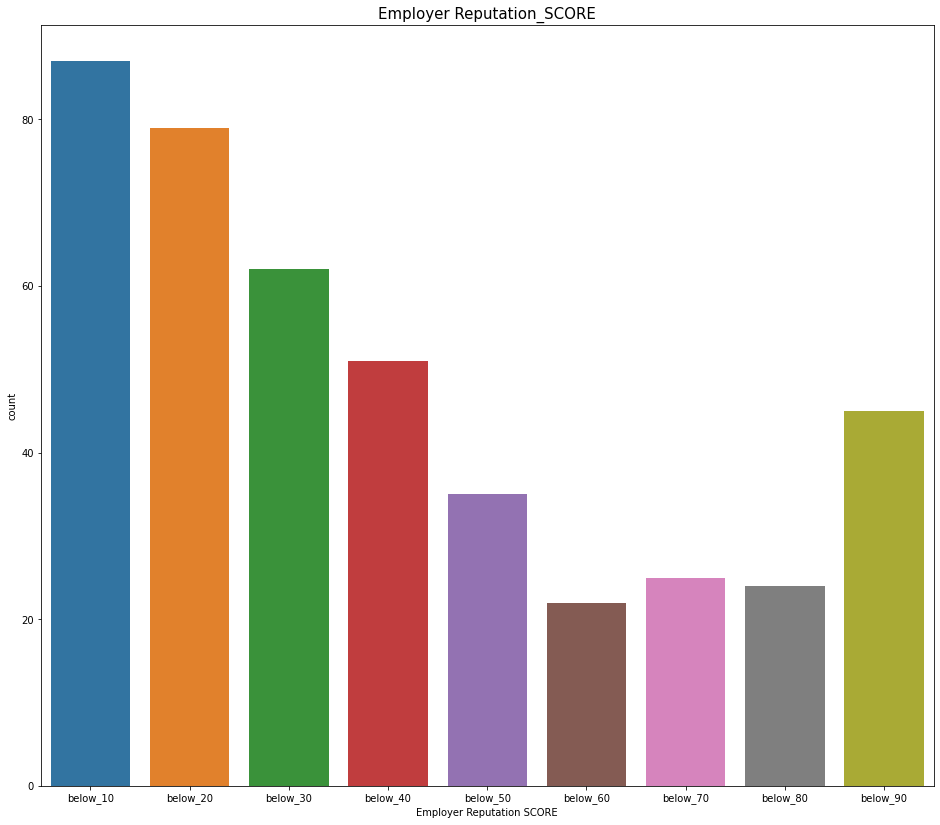

In [140]:
plt.figure(figsize=(16,14))
sns.countplot(df2019['Employer Reputation SCORE'])
plt.title('Employer Reputation_SCORE', fontsize = 15)
plt.show()

In [141]:
pd.DataFrame(df2019['Employer Reputation SCORE'].value_counts())

,Employer Reputation SCORE
below_10,87
below_20,79
below_30,62
below_40,51
below_90,45
below_50,35
below_70,25
below_80,24
below_60,22


In [142]:
bin_edges = [10,20,30,40,50,60,70,80,90,100]
bin_names = ['below_10','below_20','below_30','below_40','below_50','below_60','below_70','below_80','below_90']
df2019['Faculty Student SCORE'] = pd.cut(df2019['Faculty Student_SCORE'], bin_edges, labels=bin_names)

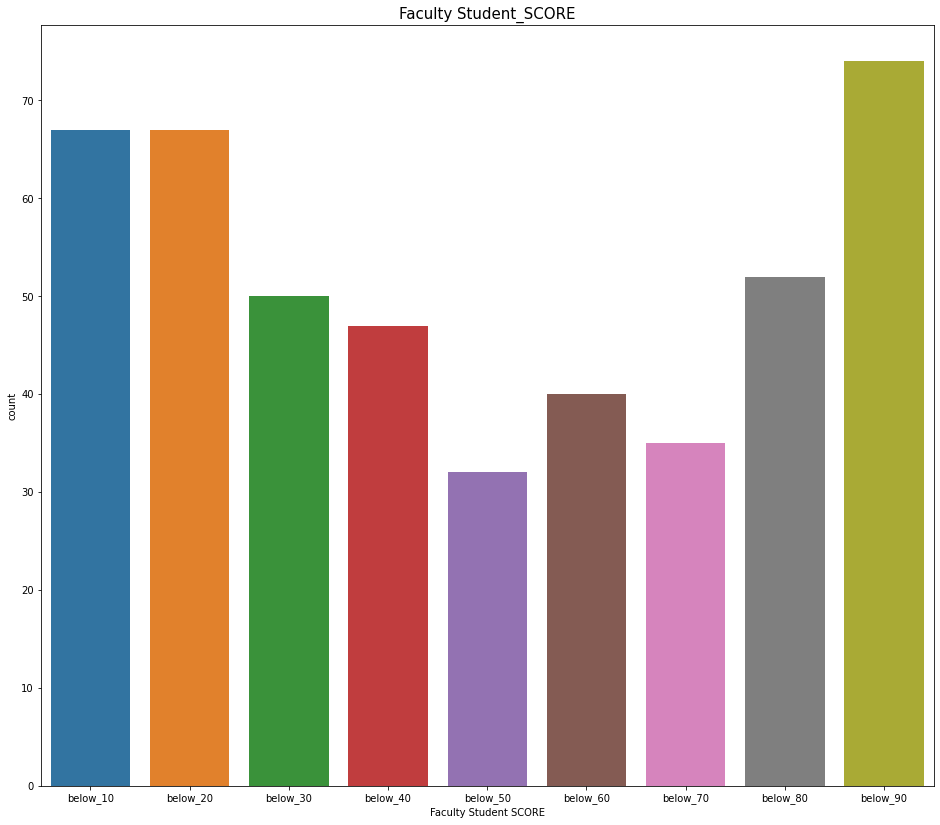

In [143]:
plt.figure(figsize=(16,14))
sns.countplot(df2019['Faculty Student SCORE'])
plt.title('Faculty Student_SCORE', fontsize = 15)
plt.show()

In [144]:
pd.DataFrame(df2019['Faculty Student SCORE'].value_counts())

,Faculty Student SCORE
below_90,74
below_10,67
below_20,67
below_80,52
below_30,50
below_40,47
below_60,40
below_70,35
below_50,32


In [145]:
bin_edges = [10,20,30,40,50,60,70,80,90,100]
bin_names = ['below_10','below_20','below_30','below_40','below_50','below_60','below_70','below_80','below_90']
df2019['Citations per Faculty SCORE'] = pd.cut(df2019['Citations per Faculty_SCORE'], bin_edges, labels=bin_names)

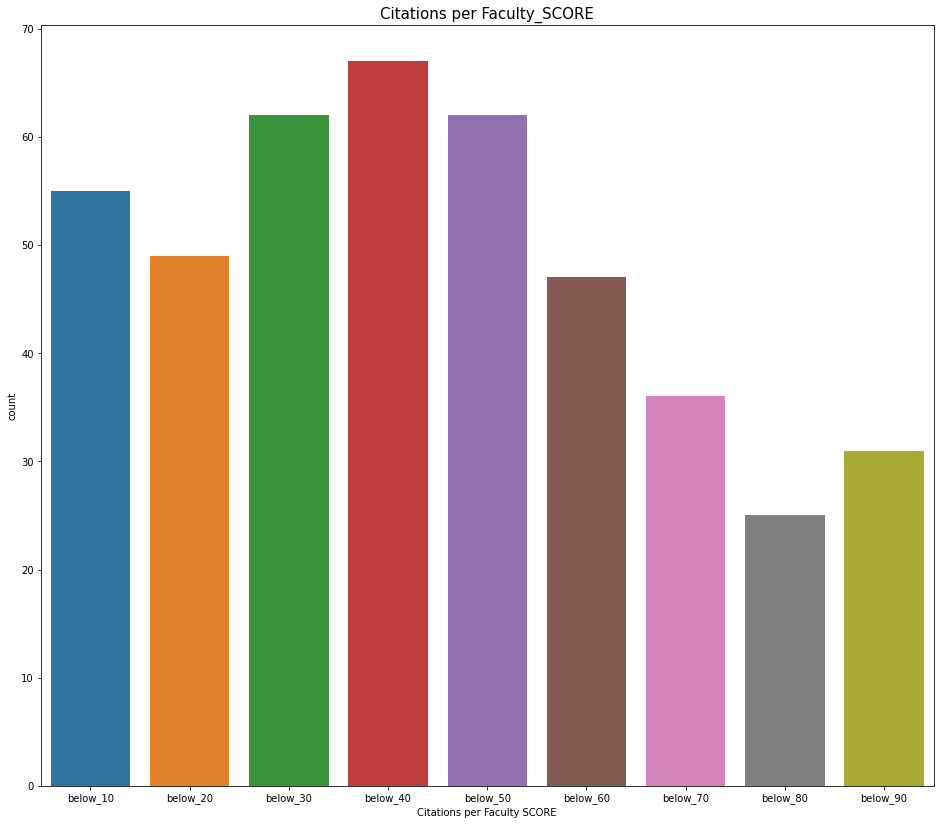

In [146]:
plt.figure(figsize=(16,14))
sns.countplot(df2019['Citations per Faculty SCORE'])
plt.title('Citations per Faculty_SCORE', fontsize = 15)
plt.show()

In [147]:
pd.DataFrame(df2019['Citations per Faculty SCORE'].value_counts())

,Citations per Faculty SCORE
below_40,67
below_30,62
below_50,62
below_10,55
below_20,49
below_60,47
below_70,36
below_90,31
below_80,25


In [148]:
bin_edges = [10,20,30,40,50,60,70,80,90,100]
bin_names = ['below_10','below_20','below_30','below_40','below_50','below_60','below_70','below_80','below_90']
df2019['International Faculty SCORE'] = pd.cut(df2019['International Faculty_SCORE'], bin_edges, labels=bin_names)

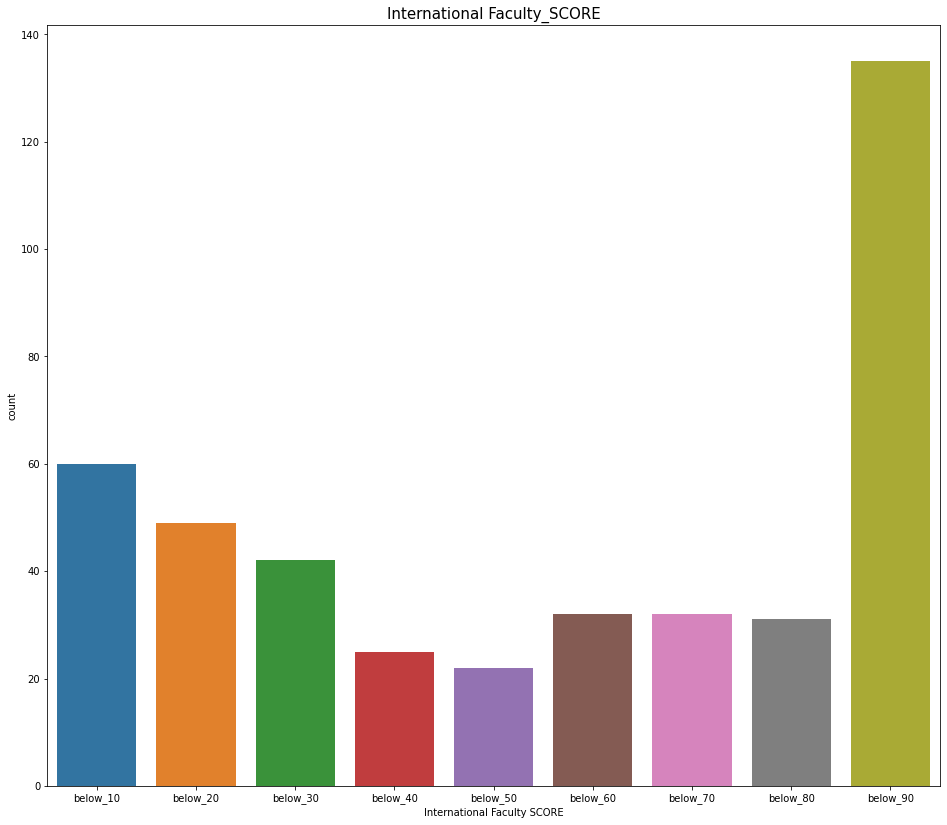

In [149]:
plt.figure(figsize=(16,14))
sns.countplot(df2019['International Faculty SCORE'])
plt.title('International Faculty_SCORE', fontsize = 15)
plt.show()

In [150]:
pd.DataFrame(df2019['International Faculty SCORE'].value_counts())

,International Faculty SCORE
below_90,135
below_10,60
below_20,49
below_30,42
below_60,32
below_70,32
below_80,31
below_40,25
below_50,22


In [151]:
bin_edges = [10,20,30,40,50,60,70,80,90,100]
bin_names = ['below_10','below_20','below_30','below_40','below_50','below_60','below_70','below_80','below_90']
df2019['International Students SCORE'] = pd.cut(df2019['International Students_SCORE'], bin_edges, labels=bin_names)

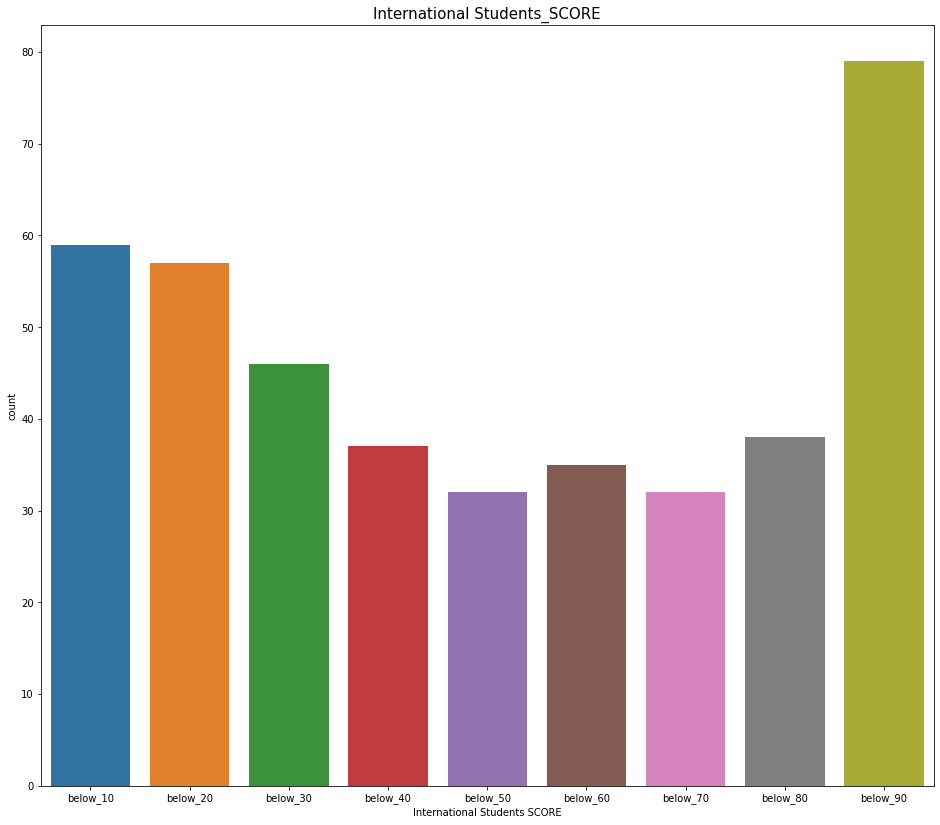

In [152]:
plt.figure(figsize=(16,14))
sns.countplot(df2019['International Students SCORE'])
plt.title('International Students_SCORE', fontsize = 15)
plt.show()

In [153]:
pd.DataFrame(df2019['International Students SCORE'].value_counts())

,International Students SCORE
below_90,79
below_10,59
below_20,57
below_30,46
below_80,38
below_40,37
below_60,35
below_50,32
below_70,32


In [154]:
bin_edges = [30,35,40,45,50,55,60,65,70,75,80,85,90,95,100]
bin_names = ['below_30','below_35','below_40','below_45','below_50','below_55','below_60','below_65','below_70','below_75','below_80','below_85','below_90','below_95']
df2019['Overall_Score'] = pd.cut(df2019['Overall Score'], bin_edges, labels=bin_names)

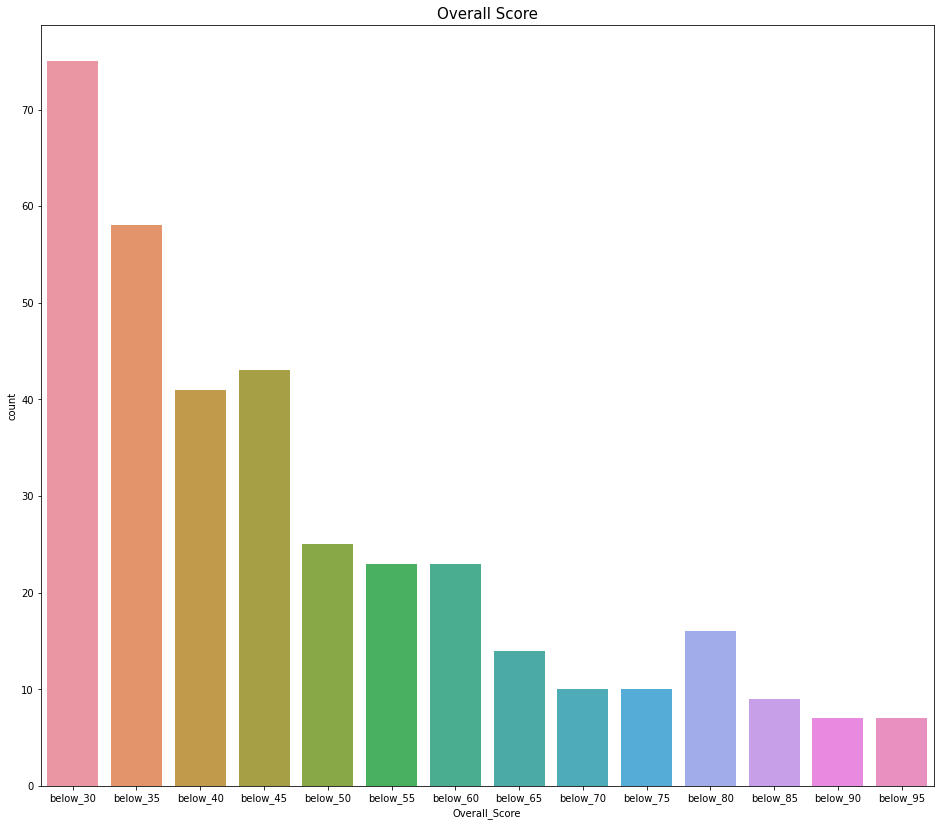

In [155]:
plt.figure(figsize=(16,14))
sns.countplot(df2019['Overall_Score'])
plt.title('Overall Score', fontsize = 15)
plt.show()

In [156]:
pd.DataFrame(df2019['Overall_Score'].value_counts())

,Overall_Score
below_30,75
below_35,58
below_45,43
below_40,41
below_50,25
below_55,23
below_60,23
below_80,16
below_65,14
below_70,10


In [157]:
grouped_country_2= pd.DataFrame(df2019.groupby('Country')['International Faculty_SCORE', 'International Students_SCORE'].mean()).reset_index()

In [158]:
grouped_country_2.sort_values(['International Faculty_SCORE', 'International Students_SCORE'],
                            ascending = False).head(10).style.bar(subset = ['International Faculty_SCORE','International Students_SCORE'], color = 'green').set_properties(**{"border" : "2px solid white"})

,Country,International Faculty_SCORE,International Students_SCORE
41,Qatar,100.000000,99.500000
30,Macau,100.000000,96.700000
44,Singapore,100.000000,77.866667
54,United Arab Emirates,100.000000,73.266667
6,Brunei,100.000000,65.700000
36,Oman,100.000000,4.800000
49,Switzerland,99.937500,82.087500
18,Hong Kong,99.933333,90.683333
43,Saudi Arabia,98.825000,33.875000
1,Australia,97.524000,84.632000


The above Chart shows the tope 10 countries with the highest mean International Faculty and International Student Scores. This provides an idea of how accessible these universites could be for international candidates. There are other factors which contribute to this, which are not covered in this analysis. For example, a University may be open to all but barriers such as tuition, language, scholarship opportunities etc might be of hindrance for some candidates.¶

### 2020 UNIVARIATE

In [159]:
bin_edges = [10,20,30,40,50,60,70,80,90,100]
bin_names = ['below_10','below_20','below_30','below_40','below_50','below_60','below_70','below_80','below_90']
df2020['Academic Reputation SCORE'] = pd.cut(df2020['Academic Reputation_SCORE'], bin_edges, labels=bin_names)

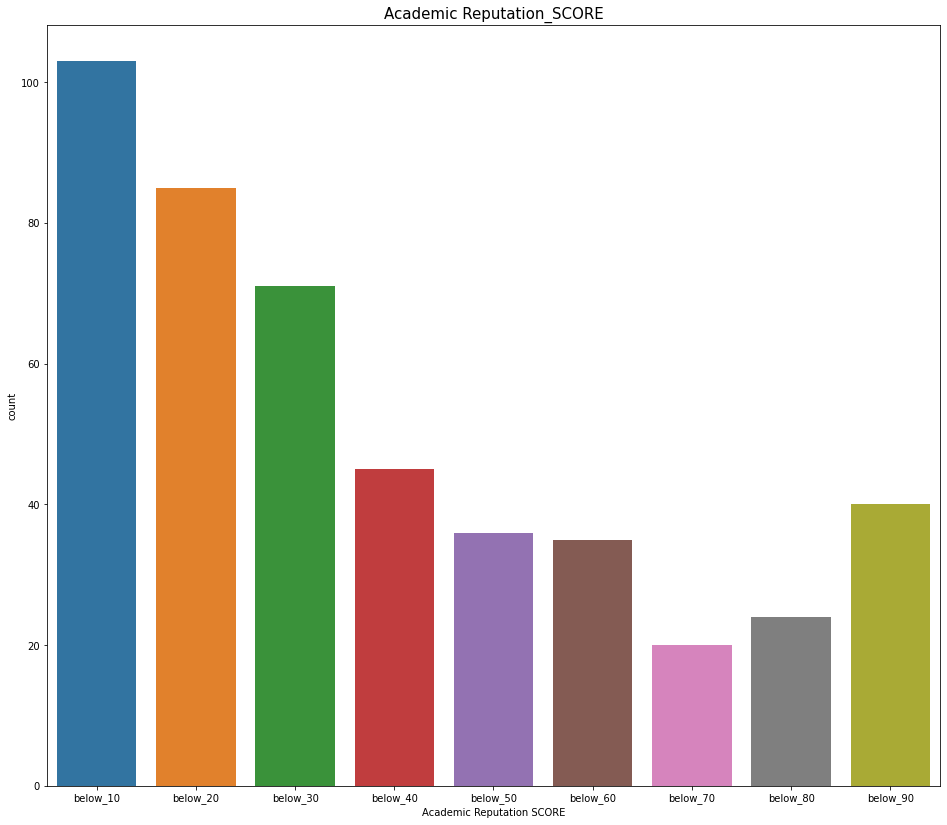

In [160]:
plt.figure(figsize=(16,14))
sns.countplot(df2020['Academic Reputation SCORE'])
plt.title('Academic Reputation_SCORE', fontsize = 15)
plt.show()

In [161]:
pd.DataFrame(df2020['Academic Reputation SCORE'].value_counts())

,Academic Reputation SCORE
below_10,103
below_20,85
below_30,71
below_40,45
below_90,40
below_50,36
below_60,35
below_80,24
below_70,20


In [162]:
bin_edges = [10,20,30,40,50,60,70,80,90,100]
bin_names = ['below_10','below_20','below_30','below_40','below_50','below_60','below_70','below_80','below_90']
df2020['Employer Reputation SCORE'] = pd.cut(df2020['Employer Reputation_SCORE'], bin_edges, labels=bin_names)

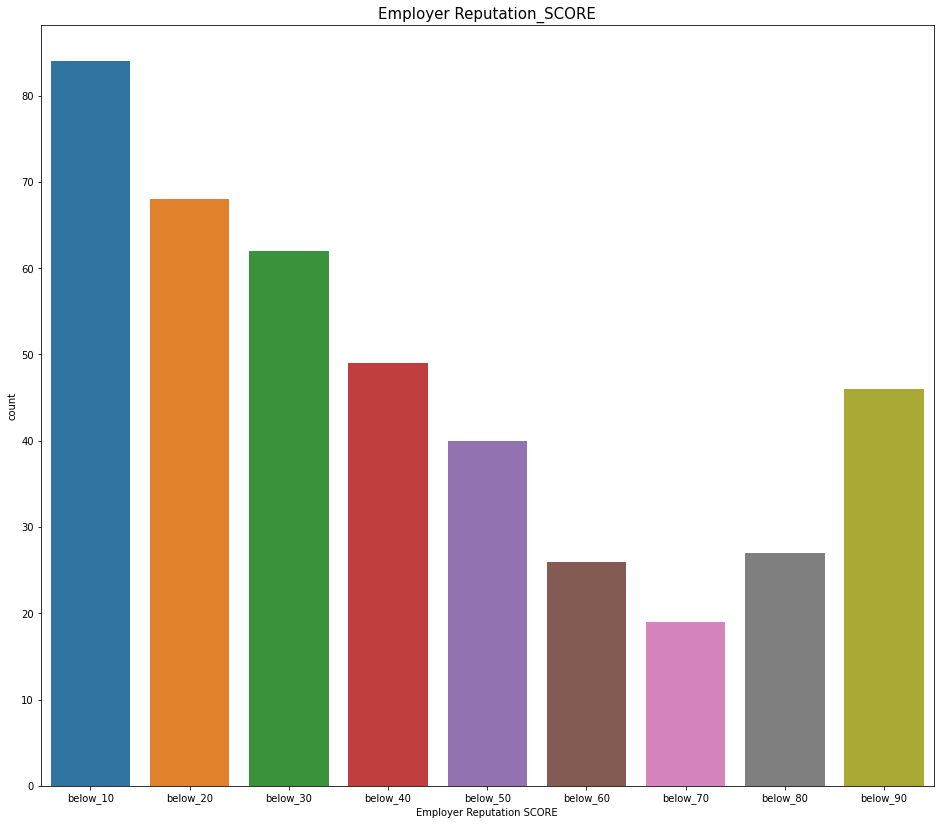

In [163]:
plt.figure(figsize=(16,14))
sns.countplot(df2020['Employer Reputation SCORE'])
plt.title('Employer Reputation_SCORE', fontsize = 15)
plt.show()

In [164]:
pd.DataFrame(df2020['Employer Reputation SCORE'].value_counts())

,Employer Reputation SCORE
below_10,84
below_20,68
below_30,62
below_40,49
below_90,46
below_50,40
below_80,27
below_60,26
below_70,19


In [165]:
in_edges = [10,20,30,40,50,60,70,80,90,100]
bin_names = ['below_10','below_20','below_30','below_40','below_50','below_60','below_70','below_80','below_90']
df2020['Faculty Student SCORE'] = pd.cut(df2020['Faculty Student_SCORE'], bin_edges, labels=bin_names)

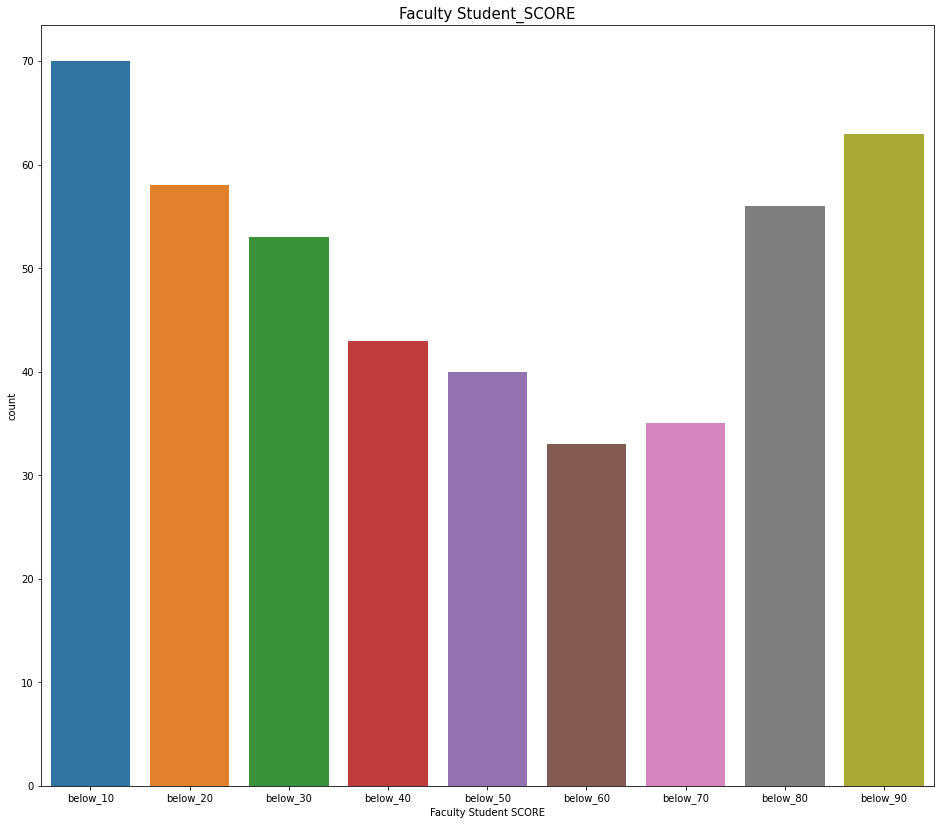

In [166]:
plt.figure(figsize=(16,14))
sns.countplot(df2020['Faculty Student SCORE'])
plt.title('Faculty Student_SCORE', fontsize = 15)
plt.show()

In [167]:
pd.DataFrame(df2020['Faculty Student SCORE'].value_counts())

,Faculty Student SCORE
below_10,70
below_90,63
below_20,58
below_80,56
below_30,53
below_40,43
below_50,40
below_70,35
below_60,33


In [168]:
bin_edges = [10,20,30,40,50,60,70,80,90,100]
bin_names = ['below_10','below_20','below_30','below_40','below_50','below_60','below_70','below_80','below_90']
df2020['Citations per Faculty SCORE'] = pd.cut(df2020['Citations per Faculty_SCORE'], bin_edges, labels=bin_names)

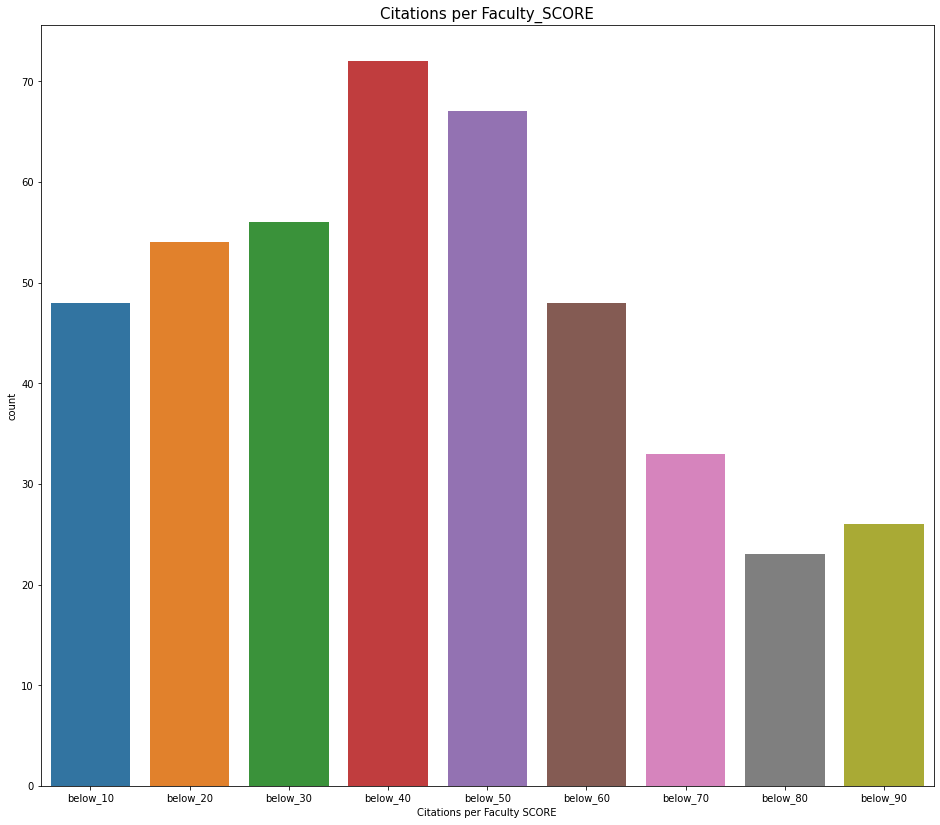

In [169]:
plt.figure(figsize=(16,14))
sns.countplot(df2020['Citations per Faculty SCORE'])
plt.title('Citations per Faculty_SCORE', fontsize = 15)
plt.show()

In [170]:
pd.DataFrame(df2020['Citations per Faculty SCORE'].value_counts())

,Citations per Faculty SCORE
below_40,72
below_50,67
below_30,56
below_20,54
below_10,48
below_60,48
below_70,33
below_90,26
below_80,23


In [171]:
bin_edges = [10,20,30,40,50,60,70,80,90,100]
bin_names = ['below_10','below_20','below_30','below_40','below_50','below_60','below_70','below_80','below_90']
df2020['International Faculty SCORE'] = pd.cut(df2020['International Faculty_SCORE'], bin_edges, labels=bin_names)

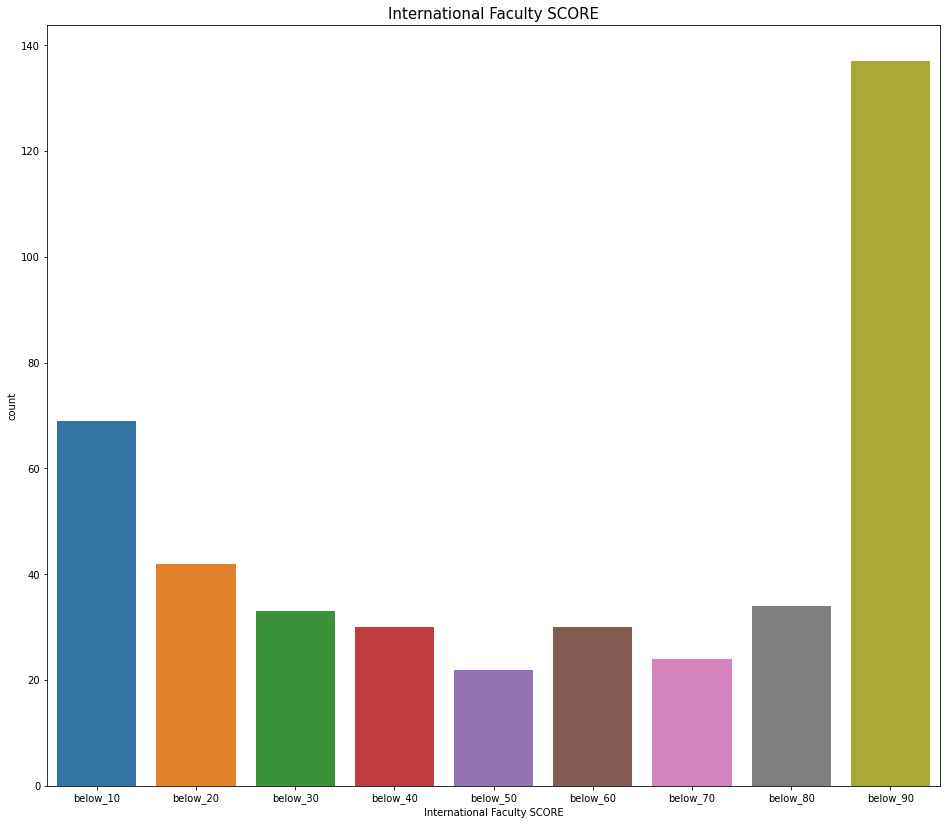

In [172]:
plt.figure(figsize=(16,14))
sns.countplot(df2020['International Faculty SCORE'])
plt.title('International Faculty SCORE', fontsize = 15)
plt.show()

In [173]:
pd.DataFrame(df2020['International Faculty SCORE'].value_counts())

,International Faculty SCORE
below_90,137
below_10,69
below_20,42
below_80,34
below_30,33
below_40,30
below_60,30
below_70,24
below_50,22


In [174]:
bin_edges = [10,20,30,40,50,60,70,80,90,100]
bin_names = ['below_10','below_20','below_30','below_40','below_50','below_60','below_70','below_80','below_90']
df2020['International Students SCORE'] = pd.cut(df2020['International Students_SCORE'], bin_edges, labels=bin_names)

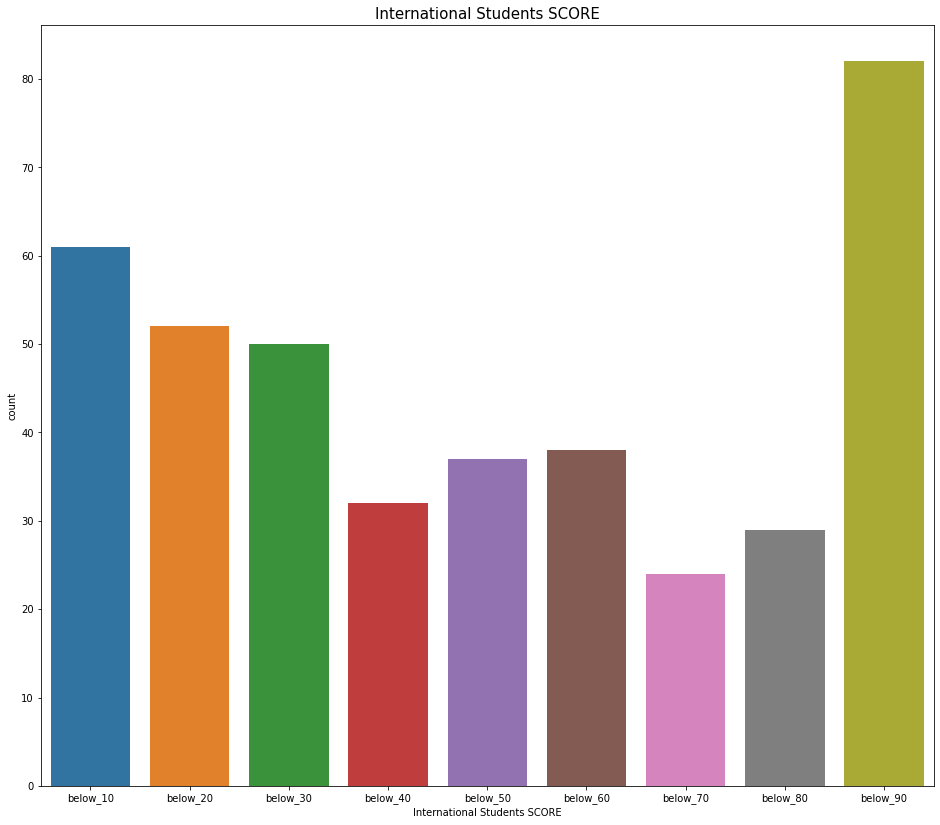

In [175]:
plt.figure(figsize=(16,14))
sns.countplot(df2020['International Students SCORE'])
plt.title('International Students SCORE', fontsize = 15)
plt.show()

In [176]:
pd.DataFrame(df2020['International Students SCORE'].value_counts())

,International Students SCORE
below_90,82
below_10,61
below_20,52
below_30,50
below_60,38
below_50,37
below_40,32
below_80,29
below_70,24


In [177]:
bin_edges = [30,35,40,45,50,55,60,65,70,75,80,85,90,95,100]
bin_names = ['below_30','below_35','below_40','below_45','below_50','below_55','below_60','below_65','below_70','below_75','below_80','below_85','below_90','below_95']
df2020['Overall_Score'] = pd.cut(df2020['Overall Score'], bin_edges, labels=bin_names)

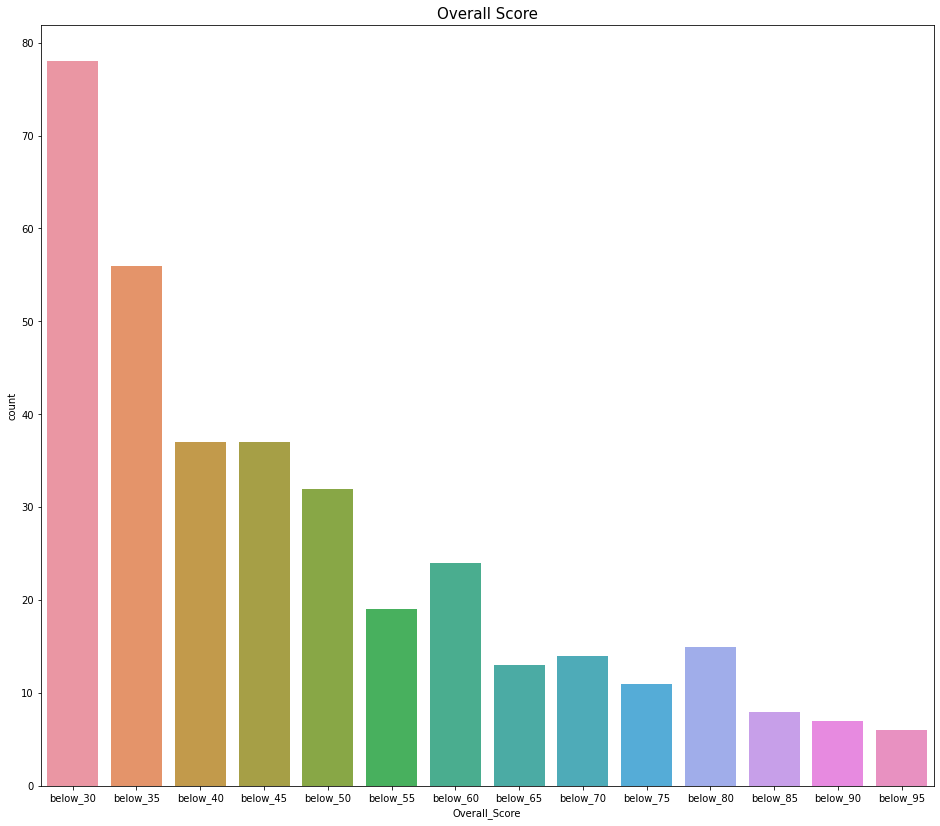

In [178]:
plt.figure(figsize=(16,14))
sns.countplot(df2020['Overall_Score'])
plt.title('Overall Score', fontsize = 15)
plt.show()

In [179]:
pd.DataFrame(df2020['Overall_Score'].value_counts())

,Overall_Score
below_30,78
below_35,56
below_40,37
below_45,37
below_50,32
below_60,24
below_55,19
below_80,15
below_70,14
below_65,13


In [180]:
df2020.head()

,Rank in 2020,Rank in 2019,Institution Name,Country,Classification_SIZE,FOCUS,RESEARCH INTENSITY,AGE,STATUS,Academic Reputation_SCORE,Employer Reputation_SCORE,Faculty Student_SCORE,Citations per Faculty_SCORE,International Faculty_SCORE,International Students_SCORE,Overall Score,Academic Reputation SCORE,Employer Reputation SCORE,Faculty Student SCORE,Citations per Faculty SCORE,International Faculty SCORE,International Students SCORE,Overall_Score
0,1,1,massachusetts institute of technology (mit),United States,M,CO,VH,5.0,B,100.0,100.0,100.0,99.8,100.0,94.1,100.0,below_90,below_90,below_90,below_90,below_90,below_90,below_95
1,2,2,stanford university,United States,L,FC,VH,5.0,B,100.0,100.0,100.0,98.6,99.8,67.7,98.4,below_90,below_90,below_90,below_90,below_90,below_60,below_95
2,3,3,harvard university,United States,L,FC,VH,5.0,B,100.0,100.0,98.7,99.6,86.3,62.2,97.4,below_90,below_90,below_90,below_90,below_80,below_60,below_95
3,4,5,university of oxford,United Kingdom,L,FC,VH,5.0,A,100.0,100.0,100.0,84.7,99.7,98.5,97.2,below_90,below_90,below_90,below_80,below_90,below_90,below_95
4,5,4,california institute of technology (caltech),United States,S,CO,VH,5.0,B,97.8,81.2,100.0,100.0,99.4,87.3,96.9,below_90,below_80,below_90,below_90,below_90,below_80,below_95


In [181]:
grouped_country_3 = pd.DataFrame(df2020.groupby('Country')['International Faculty_SCORE', 'International Students_SCORE'].mean()).reset_index()

In [182]:
grouped_country_3.sort_values(['International Faculty_SCORE', 'International Students_SCORE'],
                            ascending = False).head(10).style.bar(subset = ['International Faculty_SCORE',
                                                                            'International Students_SCORE'], color = 'green').set_properties(**{"border" : "2px solid white"})

,Country,International Faculty_SCORE,International Students_SCORE
42,Qatar,100.000000,98.300000
30,Macau,100.000000,96.200000
45,Singapore,100.000000,72.800000
55,United Arab Emirates,100.000000,68.000000
36,Oman,100.000000,7.600000
19,Hong Kong,99.983333,89.800000
50,Switzerland,99.900000,81.337500
6,Brunei,99.600000,41.550000
34,New Zealand,98.187500,81.300000
1,Australia,97.923077,83.884615


The above Chart shows the tope 10 countries with the highest mean International Faculty and International Student Scores. This provides an idea of how accessible these universites could be for international candidates. There are other factors which contribute to this, which are not covered in this analysis. For example, a University may be open to all but barriers such as tuition, language, scholarship opportunities etc might be of hindrance for some candidates.

In [183]:
top_10_countries_1 = df2018.groupby('Country')['Institution Name'].count().sort_values(ascending = False).head(10).index
list(top_10_countries_1)

['United States',
 'United Kingdom',
 'Germany',
 'Australia',
 'France',
 'Canada',
 'China',
 'Japan',
 'Netherlands',
 'South Korea']

In [184]:
top_10_countries_2 = df2019.groupby('Country')['Institution Name'].count().sort_values(ascending = False).head(10).index
list(top_10_countries_2)

['United States',
 'United Kingdom',
 'Germany',
 'Australia',
 'China',
 'Canada',
 'Japan',
 'Russia',
 'France',
 'South Korea']

In [185]:
top_10_countries_3 = df2020.groupby('Country')['Institution Name'].count().sort_values(ascending = False).head(10).index
list(top_10_countries_3)

['United States',
 'United Kingdom',
 'Germany',
 'Australia',
 'China',
 'Japan',
 'Canada',
 'Russia',
 'South Korea',
 'France']

The top ten countries have maintained their position amongst the top 10 with only Netherland losing its position, amongst the top 10, to Russia.
Qatar maintained the first position based on the International Faulty and International Students scores from 2018-2020 with Macau making a lot progress from 2018 to maintain the second position from 2019-2020¶

### 2018 BIVARIATE

In [186]:
df2018.head()

,2018,2017,Institution Name,Country,Classification_SIZE,FOCUS,RESEARCH INTENSITY,AGE,STATUS,Academic Reputation_SCORE,Employer Reputation_SCORE,Faculty Student_SCORE,Citations per Faculty_SCORE,International Faculty_SCORE,International Students_SCORE,Overall Score,Academic Reputation SCORE,Employer Reputation SCORE,Faculty Student SCORE,Citations per Faculty SCORE,International Faculty SCORE,International Students SCORE,Overall_Score
0,1,1,massachusetts institute of technology (mit),United States,M,CO,VH,5.0,B,100.0,100.0,100.0,99.9,100.0,96.1,100.0,below_90,below_90,below_90,below_90,below_90,below_90,below_95
1,2,2,stanford university,United States,L,FC,VH,5.0,B,100.0,100.0,100.0,99.4,99.6,72.7,98.7,below_90,below_90,below_90,below_90,below_90,below_70,below_95
2,3,3,harvard university,United States,L,FC,VH,5.0,B,100.0,100.0,98.3,99.9,96.5,75.2,98.4,below_90,below_90,below_90,below_90,below_90,below_70,below_95
3,4,5,california institute of technology (caltech),United States,S,CO,VH,5.0,B,99.5,85.4,100.0,100.0,93.4,89.2,97.7,below_90,below_80,below_90,below_90,below_90,below_80,below_95
4,5,4,university of cambridge,United Kingdom,L,FC,VH,5.0,A,100.0,100.0,100.0,78.3,97.4,97.7,95.6,below_90,below_90,below_90,below_70,below_90,below_90,below_95


<Figure size 864x576 with 0 Axes>

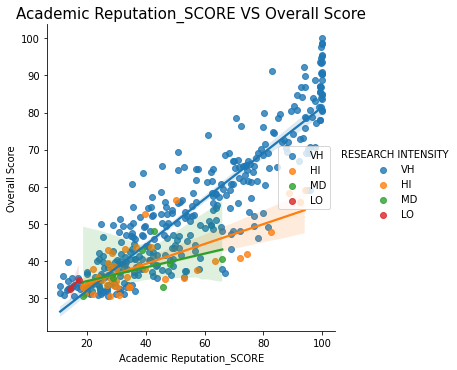

In [187]:
plt.figure(figsize=(12,8))
g = sns.lmplot(x="Academic Reputation_SCORE", y="Overall Score", hue="RESEARCH INTENSITY", data=df2018)
plt.legend(loc='right')
plt.title('Academic Reputation_SCORE VS Overall Score', fontsize = 15)
plt.show()

There is strong relationship between the academic score and  overall score.
As academic score increase, the overall score increase. 
However, Universities having very high research intensity tend to have high overall score.

<Figure size 864x576 with 0 Axes>

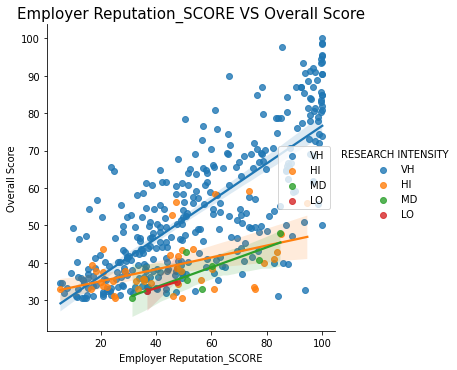

In [188]:
plt.figure(figsize=(12,8))
g = sns.lmplot(x="Employer Reputation_SCORE", y="Overall Score", hue="RESEARCH INTENSITY", data=df2018)
plt.legend(loc='right')
plt.title('Employer Reputation_SCORE VS Overall Score', fontsize = 15)
plt.show()

There is strong relationship between the Employe Reputation score and overall score.
As Employer Repuation score increase, the overall score increase and vice versa. 
However, Universities having very high research intensity tend to have high overall score.

<Figure size 864x576 with 0 Axes>

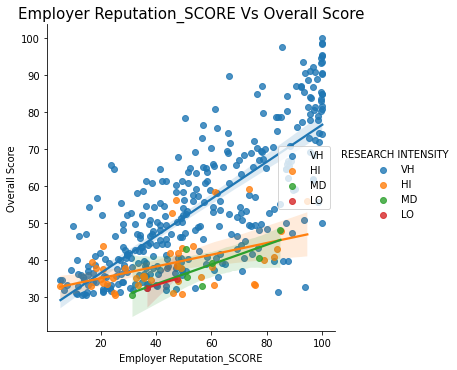

In [189]:
plt.figure(figsize=(12,8))
g = sns.lmplot(x="Employer Reputation_SCORE", y="Overall Score", hue="RESEARCH INTENSITY", data=df2018)
plt.legend(loc='right')
plt.title("Employer Reputation_SCORE Vs Overall Score", fontsize = 15)
plt.show()

There is strong relationship between the employer reputaion and  overall score.
As employer reputaion score increase, the overall score increase and vice versa. 
However, Universities having very high research intensity tend to have high overall score.

<Figure size 864x576 with 0 Axes>

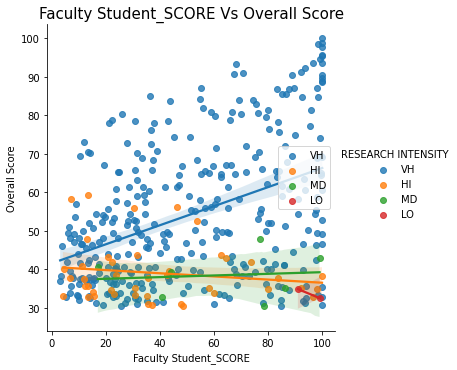

In [190]:
plt.figure(figsize=(12,8))
g = sns.lmplot(x="Faculty Student_SCORE", y="Overall Score", hue="RESEARCH INTENSITY", data=df2018)
plt.legend(loc='right')
plt.title("Faculty Student_SCORE Vs Overall Score", fontsize = 15)
plt.show()

There is strong relationship between the faculty student and  overall score.
As faculty student score increase, the overall score increase and vice versa. 
However, Universities having very high research intensity tend to have high overall score.

<Figure size 864x576 with 0 Axes>

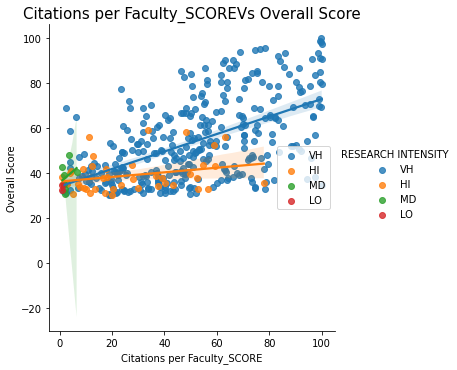

In [191]:
plt.figure(figsize=(12,8))
g = sns.lmplot(x="Citations per Faculty_SCORE", y="Overall Score", hue="RESEARCH INTENSITY", data=df2018)
plt.legend(loc='right')
plt.title("Citations per Faculty_SCOREVs Overall Score", fontsize = 15)
plt.show()

There is strong relationship between the Citation per faculty score and  overall score.
As Citation per faculty score increase, the overall score increase and vice versa. 
However, Universities having very high research intensity tend to have high overall score.

<Figure size 864x576 with 0 Axes>

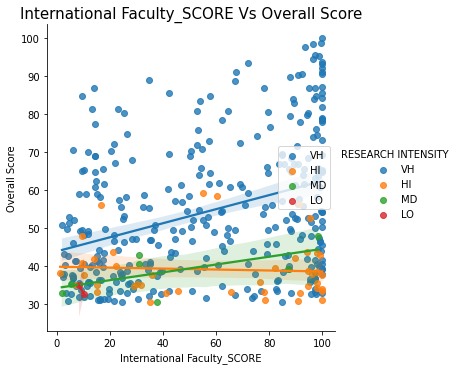

In [192]:
plt.figure(figsize=(12,8))
g = sns.lmplot(x="International Faculty_SCORE", y="Overall Score", hue="RESEARCH INTENSITY", data=df2018)
plt.legend(loc='right')
plt.title("International Faculty_SCORE Vs Overall Score", fontsize = 15)
plt.show()

There is weak relationship between the international faculty score and overall score. 
As international faculty score does not really affect the overall score. 
However, Universities having very high research intensity tend to have high overall score.

<Figure size 864x576 with 0 Axes>

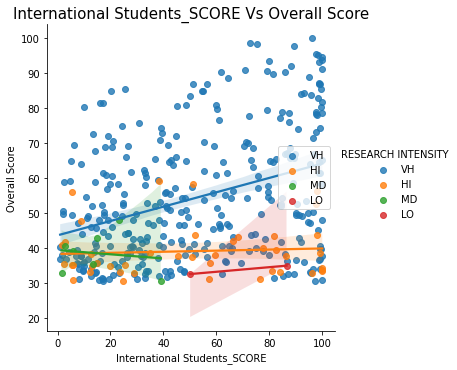

In [193]:
plt.figure(figsize=(12,8))
g = sns.lmplot(x="International Students_SCORE", y="Overall Score", hue="RESEARCH INTENSITY", data=df2018)
plt.legend(loc='right')
plt.title("International Students_SCORE Vs Overall Score", fontsize = 15)
plt.show()

There is weak relationship between the internationalstudents score and overall score. 
As international student score does not really affect the overall score. 
However, Universities having very high research intensity tend to have high overall score.

### 2019 BIVARIATE

In [194]:
df2019.head()

,2019,2018,Institution Name,Country,Classification_SIZE,FOCUS,RESEARCH INTENSITY,AGE,STATUS,Academic Reputation_SCORE,Employer Reputation_SCORE,Faculty Student_SCORE,Citations per Faculty_SCORE,International Faculty_SCORE,International Students_SCORE,Overall Score,Academic Reputation SCORE,Employer Reputation SCORE,Faculty Student SCORE,Citations per Faculty SCORE,International Faculty SCORE,International Students SCORE,Overall_Score
0,1,1,massachusetts institute of technology (mit),United States,M,CO,VH,5.0,B,100.0,100.0,100.0,99.8,100.0,95.5,100.0,below_90,below_90,below_90,below_90,below_90,below_90,below_95
1,2,2,stanford university,United States,L,FC,VH,5.0,B,100.0,100.0,100.0,99.0,99.8,70.5,98.6,below_90,below_90,below_90,below_90,below_90,below_70,below_95
2,3,3,harvard university,United States,L,FC,VH,5.0,B,100.0,100.0,99.3,99.8,92.1,75.7,98.5,below_90,below_90,below_90,below_90,below_90,below_70,below_95
3,4,4,california institute of technology (caltech),United States,S,CO,VH,5.0,B,98.7,81.2,100.0,100.0,96.8,90.3,97.2,below_90,below_80,below_90,below_90,below_90,below_90,below_95
4,5,6,university of oxford,United Kingdom,L,FC,VH,5.0,A,100.0,100.0,100.0,83.0,99.6,98.8,96.8,below_90,below_90,below_90,below_80,below_90,below_90,below_95


<Figure size 864x576 with 0 Axes>

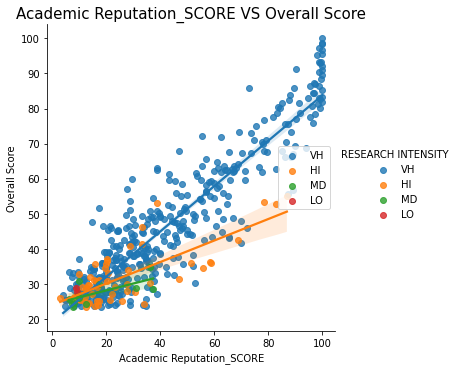

In [195]:
plt.figure(figsize=(12,8))
g = sns.lmplot(x="Academic Reputation_SCORE", y="Overall Score", hue="RESEARCH INTENSITY", data=df2019)
plt.legend(loc='right')
plt.title('Academic Reputation_SCORE VS Overall Score', fontsize = 15)
plt.show()

There is strong relationship between the academic reputation score and overall score.
As academic reputation score increase, the overall score increase and vice versa.
However, Universities having very high research intensity tend to have high overall score.

<Figure size 864x576 with 0 Axes>

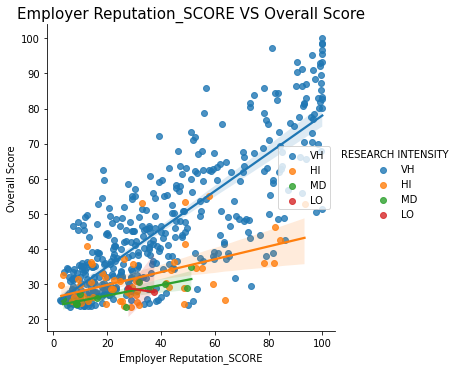

In [196]:
plt.figure(figsize=(12,8))
g = sns.lmplot(x="Employer Reputation_SCORE", y="Overall Score", hue="RESEARCH INTENSITY", data=df2019)
plt.legend(loc='right')
plt.title('Employer Reputation_SCORE VS Overall Score', fontsize = 15)
plt.show()

There is strong relationship between the Employe Reputation score and overall score.
As Employer Repuation score increase, the overall score increase and vice versa. 
However, Universities having very high research intensity tend to have high overall score.

<Figure size 864x720 with 0 Axes>

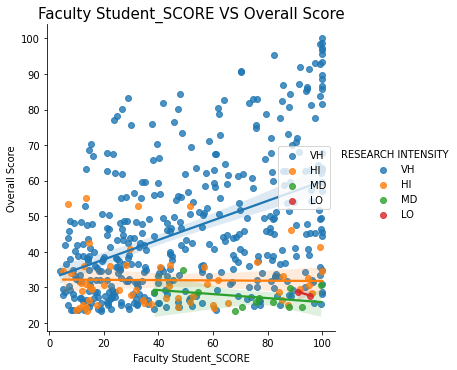

In [197]:
plt.figure(figsize=(12,10))
g = sns.lmplot(x="Faculty Student_SCORE", y="Overall Score", hue="RESEARCH INTENSITY", data=df2019)
plt.legend(loc='right')
plt.title('Faculty Student_SCORE VS Overall Score', fontsize = 15)
plt.show()

<Figure size 864x576 with 0 Axes>

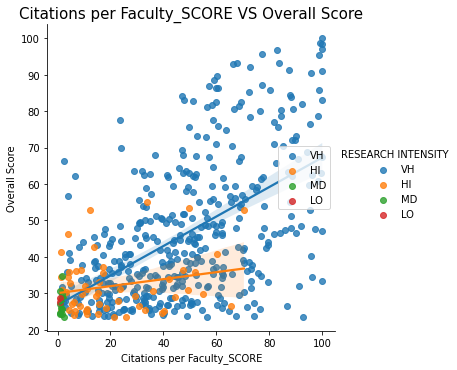

In [198]:
plt.figure(figsize=(12,8))
g = sns.lmplot(x="Citations per Faculty_SCORE", y="Overall Score", hue="RESEARCH INTENSITY", data=df2019)
plt.legend(loc='right')
plt.title('Citations per Faculty_SCORE VS Overall Score', fontsize = 15)
plt.show()

There is strong relationship between the citation per faculty score and overall score.
As Citations per faculty score increase, the overall score increase and vice versa. 
However, Universities having very high research intensity tend to have high overall score.

<Figure size 864x576 with 0 Axes>

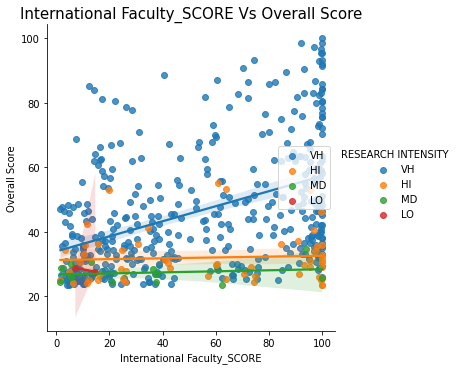

In [199]:
plt.figure(figsize=(12,8))
g = sns.lmplot(x="International Faculty_SCORE", y="Overall Score", hue="RESEARCH INTENSITY", data=df2019)
plt.legend(loc='right')
plt.title("International Faculty_SCORE Vs Overall Score", fontsize = 15)
plt.show()

There is weak relationship between the international faculty score and overall score. 
As international faculty score does not really affect the overall score. 
However, Universities having very high research intensity tend to have high overall score.

<Figure size 864x576 with 0 Axes>

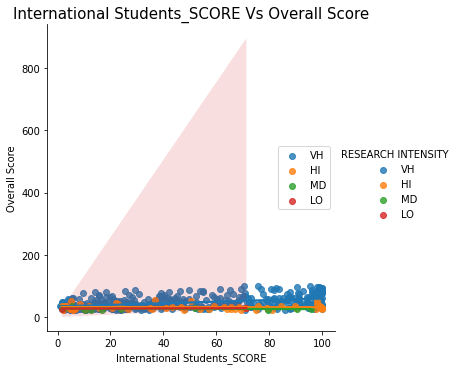

In [200]:
plt.figure(figsize=(12,8))
g = sns.lmplot(x="International Students_SCORE", y="Overall Score", hue="RESEARCH INTENSITY", data=df2019)
plt.legend(loc='right')
plt.title("International Students_SCORE Vs Overall Score", fontsize = 15)
plt.show()

There is no relationship between the international students score and overall score. 
As international students score does not really affect the overall score. 

### 2020 BIVARIATE

<Figure size 864x576 with 0 Axes>

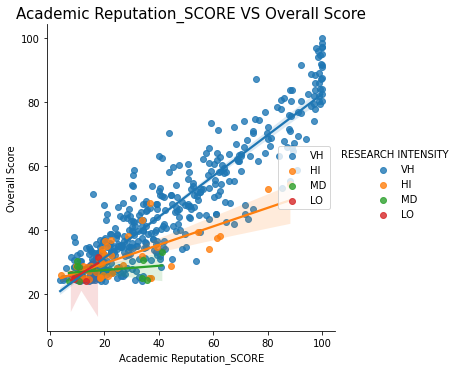

In [201]:
plt.figure(figsize=(12,8))
g = sns.lmplot(x="Academic Reputation_SCORE", y="Overall Score", hue="RESEARCH INTENSITY", data=df2020)
plt.legend(loc='right')
plt.title('Academic Reputation_SCORE VS Overall Score', fontsize = 15)
plt.show()

There is strong relationship between the academic reputaion score and overall score.
As academic reputaion score  increase, the overall score increase and vice versa.
However, Universities having very high research intensity tend to have high overall score.

<Figure size 864x576 with 0 Axes>

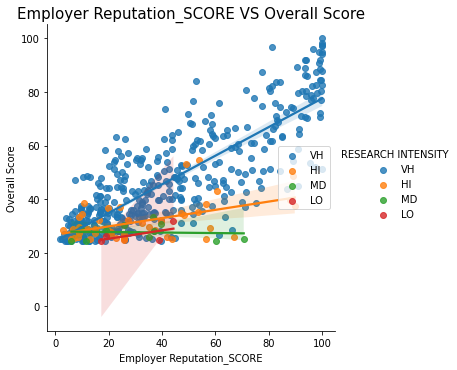

In [202]:
plt.figure(figsize=(12,8))
g = sns.lmplot(x="Employer Reputation_SCORE", y="Overall Score", hue="RESEARCH INTENSITY", data=df2020)
plt.legend(loc='right')
plt.title('Employer Reputation_SCORE VS Overall Score', fontsize = 15)
plt.show()

<Figure size 864x576 with 0 Axes>

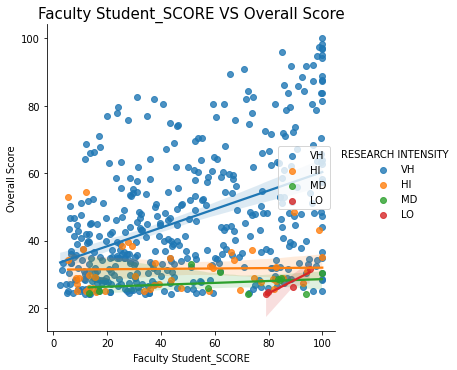

In [203]:
plt.figure(figsize=(12,8))
g = sns.lmplot(x="Faculty Student_SCORE", y="Overall Score", hue="RESEARCH INTENSITY", data=df2020)
plt.legend(loc='right')
plt.title('Faculty Student_SCORE VS Overall Score', fontsize = 15)
plt.show()

There is strong relationship between the faculty student score and overall score.
As faculty student score increase, the overall score increase and vice versa.
However, Universities having very high research intensity tend to have high overall score.

<Figure size 864x576 with 0 Axes>

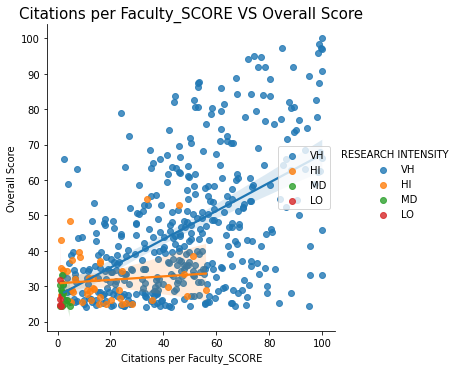

In [204]:
plt.figure(figsize=(12,8))
g = sns.lmplot(x="Citations per Faculty_SCORE", y="Overall Score", hue="RESEARCH INTENSITY", data=df2020)
plt.legend(loc='right')
plt.title('Citations per Faculty_SCORE VS Overall Score', fontsize = 15)
plt.show()

There is strong relationship between the citation per faculty score and overall score.
As citation per faculty score increase, the overall score increase and vice versa.
However, Universities having very high research intensity tend to have high overall score.

<Figure size 864x576 with 0 Axes>

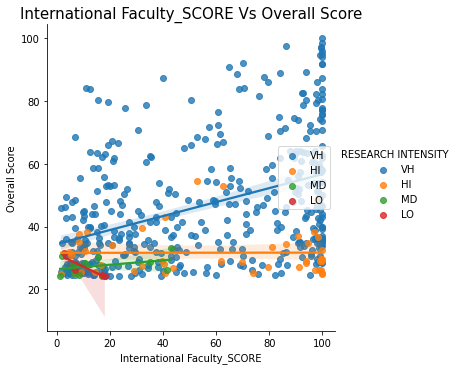

In [205]:
plt.figure(figsize=(12,8))
g = sns.lmplot(x="International Faculty_SCORE", y="Overall Score", hue="RESEARCH INTENSITY", data=df2020)
plt.legend(loc='right')
plt.title("International Faculty_SCORE Vs Overall Score", fontsize = 15)
plt.show()

There is weak relationship between the international faculty score and overall score.
As international faculty score increase, the overall score increase and vice versa.
However, Universities having very high research intensity tend to have high overall score.

<Figure size 864x576 with 0 Axes>

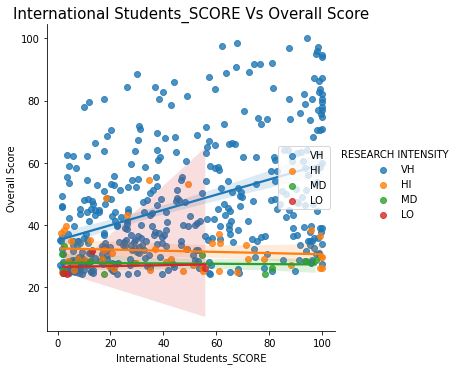

In [206]:
plt.figure(figsize=(12,8))
g = sns.lmplot(x="International Students_SCORE", y="Overall Score", hue="RESEARCH INTENSITY", data=df2020)
plt.legend(loc='right')
plt.title("International Students_SCORE Vs Overall Score", fontsize = 15)
plt.show()

There is weak relationship between the international faculty score and overall score. 
As international faculty score does not really affect the overall score. 
However, Universities having very high research intensity tend to have high overall score.

#### SUMMARY FROM BIVARIATE ANALYSIS OF 3YEARS DATASET

1. There is strong relationship between the academic reputaion score and overall score. 
As academic reputaion score increase, the overall score increase and vice versa. 
However, Universities having very high research intensity tend to have high overall score.

2. There is strong relationship between the Employe Reputation score and overall score.
As Employer Repuation score increase, the overall score increase and vice versa.
However, Universities having very high research intensity tend to have high overall score.

3. There is strong relationship between the faculty student and overall score. 
As faculty student score increase, the overall score increase and vice versa.
However, Universities having very high research intensity tend to have high overall score

4. There is strong relationship between the citation per faculty score and overall score.
As citation per faculty score increase, the overall score increase and vice versa.
However, Universities having very high research intensity tend to have high overall score.

5. There is weak relationship between the international faculty score and overall score. 
As international faculty score increase, the overall score increase and vice versa.
However, Universities having very high research intensity tend to have high overall score.

6. There is weak relationship between the international faculty score and overall score. 
As international faculty score does not really affect the overall score.
However, Universities having very high research intensity tend to have high overall score.

# 4. INTUITIVE CLEANING FOR MODELLING

In [207]:
# Load the dateset
df_2018 = pd.read_csv("2018-QS-World-University-Rankings.csv", encoding="latin")
df_2019 = pd.read_csv(r"2019-QS-World-University-Rankings.csv", encoding="latin")
df_2020 = pd.read_csv(r"2020-QS-World-University-Rankings.csv", encoding="latin")

In [208]:
df_2018.head()

,2018,2017,Institution Name,Country,Classification,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Academic Reputation,Unnamed: 10,Employer Reputation,Unnamed: 12,Faculty Student,Unnamed: 14,Citations per Faculty,Unnamed: 16,International Faculty,Unnamed: 18,International Students,Unnamed: 20,Overall Score
0,NaN,NaN,NaN,NaN,SIZE,FOCUS,RESEARCH INTENSITY,AGE,STATUS,SCORE,RANK,SCORE,RANK,SCORE,RANK,SCORE,RANK,SCORE,RANK,SCORE,RANK,NaN
1,1,1,MASSACHUSETTS INSTITUTE OF TECHNOLOGY (MIT),United States,M,CO,VH,5,B,100,6,100,4,100,14,99.9,8,100,36,96.1,70,100
2,2,2,STANFORD UNIVERSITY,United States,L,FC,VH,5,B,100,5,100,5,100,12,99.4,12,99.6,54,72.7,177,98.7
3,3,3,HARVARD UNIVERSITY,United States,L,FC,VH,5,B,100,1,100,3,98.3,38,99.9,9,96.5,103,75.2,165,98.4
4,4,5,CALIFORNIA INSTITUTE OF TECHNOLOGY (CALTECH),United States,S,CO,VH,5,B,99.5,22,85.4,77,100,3,100,4,93.4,126,89.2,106,97.7


In [209]:
# Reload the dateset with Proper Headers
df_2018 = pd.read_csv("2018-QS-World-University-Rankings.csv", names=[2018, 2017, "Institution", "Country", "Classification_Size", "Classification_Focus", "Research_Intensity", "Age", "Status", "Academic_Reputation_Score", "Academic_Reputation_Rank", "Employer_Reputation_Score", "Employer_Reputation_Rank", "Faculty_Student_Score", "Faculty_Student_Rank", "Citations_Per_Faculty_Score", "Citations_Per_Faculty_Rank", "International_Faculty_Score", "International_Faculty_Rank", "International_Student_Score", "International_Student_Rank", "Overall_Score"], skiprows=2, encoding="latin")
df_2019 = pd.read_csv(r"2019-QS-World-University-Rankings.csv", names=[2019, 2018, "Institution", "Country", "Classification_Size", "Classification_Focus", "Research_Intensity", "Age", "Status", "Academic_Reputation_Score", "Academic_Reputation_Rank", "Employer_Reputation_Score", "Employer_Reputation_Rank", "Faculty_Student_Score", "Faculty_Student_Rank", "Citations_Per_Faculty_Score", "Citations_Per_Faculty_Rank", "International_Faculty_Score", "International_Faculty_Rank", "International_Student_Score", "International_Student_Rank", "Overall_Score"], skiprows=2, encoding="latin")
df_2020 = pd.read_csv(r"2020-QS-World-University-Rankings.csv", names=[2020, 2019, "Institution", "Country", "Classification_Size", "Classification_Focus", "Research_Intensity", "Age", "Status", "Academic_Reputation_Score", "Academic_Reputation_Rank", "Employer_Reputation_Score", "Employer_Reputation_Rank", "Faculty_Student_Score", "Faculty_Student_Rank", "Citations_Per_Faculty_Score", "Citations_Per_Faculty_Rank", "International_Faculty_Score", "International_Faculty_Rank", "International_Student_Score", "International_Student_Rank", "Overall_Score"], skiprows=2, encoding="latin")

In [210]:
# Take out rows whose almost 60% of the observations are missing
df_2018.drop(df_2018.index[501:], inplace=True)
df_2018.tail()

,2018,2017,Institution,Country,Classification_Size,Classification_Focus,Research_Intensity,Age,Status,Academic_Reputation_Score,Academic_Reputation_Rank,Employer_Reputation_Score,Employer_Reputation_Rank,Faculty_Student_Score,Faculty_Student_Rank,Citations_Per_Faculty_Score,Citations_Per_Faculty_Rank,International_Faculty_Score,International_Faculty_Rank,International_Student_Score,International_Student_Rank,Overall_Score
496,491-500,451-460,PUSAN NATIONAL UNIVERSITY,South Korea,L,FC,VH,4.0,A,-,-,-,-,34.7,376,21.8,401+,8.1,401+,11.1,401+,25.2
497,491-500,501-550,"UNIVERSIDADE ESTADUAL PAULISTA ""JÚLIO DE MESQU...",Brazil,XL,FC,VH,3.0,A,-,-,-,-,27.4,401+,10.8,401+,5.9,401+,3.3,401+,25.8
498,491-500,491-500,UNIVERSITÉ SAINT-JOSEPH DE BEYROUTH,Lebanon,M,FC,MD,5.0,B,-,-,-,-,70.2,165,2.2,401+,59.9,265,9.3,401+,25.6
499,491-500,501-550,UNIVERSITY OF GUELPH,Canada,L,CO,VH,4.0,A,-,-,-,-,9.5,401+,40.9,311,46.9,320,15.5,401+,25.3
500,491-500,601-650,URAL FEDERAL UNIVERSITY,Russia,L,CO,HI,4.0,A,-,-,-,-,73.5,152,1.7,401+,13.5,401+,19.2,401+,25.3


In [211]:
df_2019.drop(df_2019.index[1000:], inplace=True)
df_2019.tail()

,2019,2018,Institution,Country,Classification_Size,Classification_Focus,Research_Intensity,Age,Status,Academic_Reputation_Score,Academic_Reputation_Rank,Employer_Reputation_Score,Employer_Reputation_Rank,Faculty_Student_Score,Faculty_Student_Rank,Citations_Per_Faculty_Score,Citations_Per_Faculty_Rank,International_Faculty_Score,International_Faculty_Rank,International_Student_Score,International_Student_Rank,Overall_Score
995,801-1000,801-1000,VORONEZH STATE UNIVERSITY,Russia,L,CO,MD,5.0,A,-,-,-,-,40.2,383,-,-,-,-,18.1,547,7.2 - 14.2
996,801-1000,801-1000,VYTAUTAS MAGNUS UNIVERSITY,Lithuania,M,FO,HI,4.0,A,-,-,-,-,-,-,-,-,28.1,464,-,-,7.2 - 14.2
997,801-1000,801-1000,WEST UNIVERSITY OF TIMISOARA,Romania,L,FO,HI,4.0,A,-,-,-,-,-,-,-,-,-,-,-,-,7.2 - 14.2
998,801-1000,801-1000,WROCLAW UNIVERSITY OF TECHNOLOGY,Poland,L,FO,VH,5.0,A,-,-,17.9,499,-,-,-,-,NaN,-,NaN,-,7.2 - 14.2
999,801-1000,751-800,YEUNGNAM UNIVERSITY,South Korea,L,FC,HI,4.0,C,-,-,-,-,-,-,19.1,564,27.8,468,-,-,7.2 - 14.2


In [212]:
df_2020.drop(df_2020.index[1002:], inplace=True)
df_2020.tail()

,2020,2019,Institution,Country,Classification_Size,Classification_Focus,Research_Intensity,Age,Status,Academic_Reputation_Score,Academic_Reputation_Rank,Employer_Reputation_Score,Employer_Reputation_Rank,Faculty_Student_Score,Faculty_Student_Rank,Citations_Per_Faculty_Score,Citations_Per_Faculty_Rank,International_Faculty_Score,International_Faculty_Rank,International_Student_Score,International_Student_Rank,Overall_Score
997,801-1000,NaN,Warsaw University of Life Sciences,Poland,L,FO,VH,5.0,A,-,-,-,-,28.8,521,-,-,-,-,-,-,9 - 14.1
998,801-1000,801-1000,Wroc?aw University of Science and Technology,Poland,L,FO,VH,5.0,A,-,-,-,-,26.3,564,-,-,-,-,-,-,9 - 14.1
999,801-1000,NaN,Wuhan University of Technology,China,XL,FO,VH,2.0,A,-,-,-,-,-,-,18.9,569,-,-,-,-,9 - 14.1
1000,801-1000,NaN,Xi'an Jiaotong-Liverpool University,China,M,CO,HI,2.0,B,-,-,-,-,-,-,-,-,100,33,-,-,9 - 14.1
1001,801-1000,801-1000,Yeungnam University,South Korea,L,FC,HI,4.0,C,-,-,-,-,-,-,23.4,503,21.9,524,-,-,9 - 14.1


### The score should be independent of the previous years' ranks, institution's name, and Age. We drop all the columns that should not affect the overall score

In [213]:
df_2018.columns

Index([                         2018,                          2017,
                       'Institution',                     'Country',
               'Classification_Size',        'Classification_Focus',
                'Research_Intensity',                         'Age',
                            'Status',   'Academic_Reputation_Score',
          'Academic_Reputation_Rank',   'Employer_Reputation_Score',
          'Employer_Reputation_Rank',       'Faculty_Student_Score',
              'Faculty_Student_Rank', 'Citations_Per_Faculty_Score',
        'Citations_Per_Faculty_Rank', 'International_Faculty_Score',
        'International_Faculty_Rank', 'International_Student_Score',
        'International_Student_Rank',               'Overall_Score'],
      dtype='object')

In [214]:
list(df_2018.filter(regex="Rank$", axis=1).columns)

['Academic_Reputation_Rank',
 'Employer_Reputation_Rank',
 'Faculty_Student_Rank',
 'Citations_Per_Faculty_Rank',
 'International_Faculty_Rank',
 'International_Student_Rank']

In [215]:
df_2018 = df_2018.drop(columns=[2018, 2017, "Institution", "Country", "Age", 'Academic_Reputation_Rank', 'Employer_Reputation_Rank', 'Faculty_Student_Rank', 'Citations_Per_Faculty_Rank', 'International_Faculty_Rank', 'International_Student_Rank'], axis=1)

In [216]:
df_2019.columns

Index([                         2019,                          2018,
                       'Institution',                     'Country',
               'Classification_Size',        'Classification_Focus',
                'Research_Intensity',                         'Age',
                            'Status',   'Academic_Reputation_Score',
          'Academic_Reputation_Rank',   'Employer_Reputation_Score',
          'Employer_Reputation_Rank',       'Faculty_Student_Score',
              'Faculty_Student_Rank', 'Citations_Per_Faculty_Score',
        'Citations_Per_Faculty_Rank', 'International_Faculty_Score',
        'International_Faculty_Rank', 'International_Student_Score',
        'International_Student_Rank',               'Overall_Score'],
      dtype='object')

In [217]:
list(df_2019.filter(regex="Rank$", axis=1).columns)

['Academic_Reputation_Rank',
 'Employer_Reputation_Rank',
 'Faculty_Student_Rank',
 'Citations_Per_Faculty_Rank',
 'International_Faculty_Rank',
 'International_Student_Rank']

In [218]:
df_2019 = df_2019.drop(columns=[2019, 2018, "Institution", "Country", "Age", 'Academic_Reputation_Rank', 'Employer_Reputation_Rank', 'Faculty_Student_Rank', 'Citations_Per_Faculty_Rank', 'International_Faculty_Rank', 'International_Student_Rank'], axis=1)

In [219]:
df_2020.columns

Index([                         2020,                          2019,
                       'Institution',                     'Country',
               'Classification_Size',        'Classification_Focus',
                'Research_Intensity',                         'Age',
                            'Status',   'Academic_Reputation_Score',
          'Academic_Reputation_Rank',   'Employer_Reputation_Score',
          'Employer_Reputation_Rank',       'Faculty_Student_Score',
              'Faculty_Student_Rank', 'Citations_Per_Faculty_Score',
        'Citations_Per_Faculty_Rank', 'International_Faculty_Score',
        'International_Faculty_Rank', 'International_Student_Score',
        'International_Student_Rank',               'Overall_Score'],
      dtype='object')

In [220]:
list(df_2020.filter(regex="Rank$", axis=1).columns)

['Academic_Reputation_Rank',
 'Employer_Reputation_Rank',
 'Faculty_Student_Rank',
 'Citations_Per_Faculty_Rank',
 'International_Faculty_Rank',
 'International_Student_Rank']

In [221]:
df_2020 = df_2020.drop(columns=[2020, 2019, "Institution", "Country", "Age", 'Academic_Reputation_Rank', 'Employer_Reputation_Rank', 'Faculty_Student_Rank', 'Citations_Per_Faculty_Rank', 'International_Faculty_Rank', 'International_Student_Rank'], axis=1)

In [222]:
df_2018.tail()

,Classification_Size,Classification_Focus,Research_Intensity,Status,Academic_Reputation_Score,Employer_Reputation_Score,Faculty_Student_Score,Citations_Per_Faculty_Score,International_Faculty_Score,International_Student_Score,Overall_Score
496,L,FC,VH,A,-,-,34.7,21.8,8.1,11.1,25.2
497,XL,FC,VH,A,-,-,27.4,10.8,5.9,3.3,25.8
498,M,FC,MD,B,-,-,70.2,2.2,59.9,9.3,25.6
499,L,CO,VH,A,-,-,9.5,40.9,46.9,15.5,25.3
500,L,CO,HI,A,-,-,73.5,1.7,13.5,19.2,25.3


In [223]:
df_2018.shape

(501, 11)

In [224]:
df_2018.isnull().sum()

Classification_Size            0
Classification_Focus           0
Research_Intensity             0
Status                         3
Academic_Reputation_Score      0
Employer_Reputation_Score      0
Faculty_Student_Score          0
Citations_Per_Faculty_Score    1
International_Faculty_Score    6
International_Student_Score    1
Overall_Score                  0
dtype: int64

In [225]:
df_2018.replace(to_replace="-", value=np.nan, inplace=True)

In [226]:
df_2018.isnull().sum()

Classification_Size              0
Classification_Focus             0
Research_Intensity               0
Status                           3
Academic_Reputation_Score      101
Employer_Reputation_Score      101
Faculty_Student_Score            0
Citations_Per_Faculty_Score      1
International_Faculty_Score      6
International_Student_Score      1
Overall_Score                    0
dtype: int64

In [227]:
df_2018.columns

Index(['Classification_Size', 'Classification_Focus', 'Research_Intensity',
       'Status', 'Academic_Reputation_Score', 'Employer_Reputation_Score',
       'Faculty_Student_Score', 'Citations_Per_Faculty_Score',
       'International_Faculty_Score', 'International_Student_Score',
       'Overall_Score'],
      dtype='object')

In [228]:
# Convert to appropriate datatype
df_2018[['Academic_Reputation_Score', 'Employer_Reputation_Score',
       'Faculty_Student_Score', 'Citations_Per_Faculty_Score',
       'International_Faculty_Score', 'International_Student_Score']] = df_2018[['Academic_Reputation_Score', 'Employer_Reputation_Score',
       'Faculty_Student_Score', 'Citations_Per_Faculty_Score',
       'International_Faculty_Score', 'International_Student_Score']].astype("float64")

In [229]:
df_2018[df_2018.Status.isnull()==True]

,Classification_Size,Classification_Focus,Research_Intensity,Status,Academic_Reputation_Score,Employer_Reputation_Score,Faculty_Student_Score,Citations_Per_Faculty_Score,International_Faculty_Score,International_Student_Score,Overall_Score
192,S,FO,VH,NaN,20.8,11.1,91.2,98.3,2.4,18.2,48.5
193,S,FC,VH,NaN,18.8,18.7,86.3,96.0,2.0,49.8,48.5
467,L,FO,VH,NaN,NaN,NaN,2.8,81.1,NaN,25.7,27.1


In [230]:
df_2018.Status.iloc[186:200]

186      A
187      A
188      A
189      A
190      A
191      B
192    NaN
193    NaN
194      A
195      A
196      A
197      A
198      B
199      A
Name: Status, dtype: object

In [231]:
df_2018.Status.iloc[192] = df_2018.Status.iloc[186:192].mode().iat[0]

In [232]:
df_2018.Status.iloc[193] = df_2018.Status.iloc[194:200].mode().iat[0]

In [233]:
df_2018.Status.iloc[467] = df_2018.Status.iloc[462:467].mode().iat[0]

In [234]:
df_2018.Status.isnull().sum()

0

In [235]:
df_2018[df_2018.Academic_Reputation_Score.isnull()==True]

,Classification_Size,Classification_Focus,Research_Intensity,Status,Academic_Reputation_Score,Employer_Reputation_Score,Faculty_Student_Score,Citations_Per_Faculty_Score,International_Faculty_Score,International_Student_Score,Overall_Score
400,L,CO,VH,A,NaN,NaN,2.3,79.5,10.4,26.9,30.1
401,L,FO,VH,A,NaN,NaN,11.3,63.7,1.6,2.6,30.3
402,L,FO,VH,A,NaN,NaN,93.8,2.2,12.7,56.5,29.9
403,XL,FC,VH,A,NaN,NaN,6.3,56.7,27.3,35.3,30.2
404,M,CO,MD,B,NaN,NaN,99.8,1.0,10.6,NaN,30
405,XL,FC,MD,A,NaN,NaN,24.0,1.5,23.5,2.4,30.2
406,L,FC,VH,A,NaN,NaN,17.7,25.3,8.3,41.2,29.8
407,L,FC,MD,A,NaN,NaN,78.0,1.8,1.3,89.9,29.9
408,L,FC,HI,A,NaN,NaN,69.1,5.1,7.0,4.6,30
409,L,FC,VH,A,NaN,NaN,22.5,32.0,66.8,12.7,30.4


In [236]:
print(df_2018.Academic_Reputation_Score.iloc[300:400].mode())
print(df_2018["Academic_Reputation_Score"].max())
print(df_2018["Academic_Reputation_Score"].min())

0     13.7
1     15.5
2     17.6
3     20.2
4     22.2
5     23.6
6     26.7
7     27.1
8     28.8
9     29.9
10    31.3
11    31.4
12    52.9
Name: Academic_Reputation_Score, dtype: float64
100.0
3.2


In [237]:
def feature_score(df=None, col=None, start_index=None, stop_index=None, min_n=None, max_n=None, ndigits=None):
    for i in df[col][df[col].isnull()==True].index[start_index:stop_index]:
        df[col].iloc[i] = round(random.uniform(min_n, max_n), ndigits)

In [238]:
feature_score(df=df_2018, col="Academic_Reputation_Score", start_index=0, stop_index=20, min_n=13.7, max_n=31.3, ndigits=1)
feature_score(df=df_2018, col="Academic_Reputation_Score", start_index=0, stop_index=20, min_n=13.7, max_n=31.3, ndigits=1)
feature_score(df=df_2018, col="Academic_Reputation_Score", start_index=0, stop_index=-1, min_n=3.2, max_n=31.3, ndigits=1)
df_2018.Academic_Reputation_Score.fillna(round(random.uniform(1, 5), 1), inplace=True)

In [239]:
df_2018.Employer_Reputation_Score.isnull().sum()

101

In [240]:
df_2018[df_2018.Employer_Reputation_Score.isnull()==True]

,Classification_Size,Classification_Focus,Research_Intensity,Status,Academic_Reputation_Score,Employer_Reputation_Score,Faculty_Student_Score,Citations_Per_Faculty_Score,International_Faculty_Score,International_Student_Score,Overall_Score
400,L,CO,VH,A,27.9,NaN,2.3,79.5,10.4,26.9,30.1
401,L,FO,VH,A,19.8,NaN,11.3,63.7,1.6,2.6,30.3
402,L,FO,VH,A,30.9,NaN,93.8,2.2,12.7,56.5,29.9
403,XL,FC,VH,A,22.6,NaN,6.3,56.7,27.3,35.3,30.2
404,M,CO,MD,B,22.7,NaN,99.8,1.0,10.6,NaN,30
405,XL,FC,MD,A,22.7,NaN,24.0,1.5,23.5,2.4,30.2
406,L,FC,VH,A,27.8,NaN,17.7,25.3,8.3,41.2,29.8
407,L,FC,MD,A,16.8,NaN,78.0,1.8,1.3,89.9,29.9
408,L,FC,HI,A,21.6,NaN,69.1,5.1,7.0,4.6,30
409,L,FC,VH,A,24.5,NaN,22.5,32.0,66.8,12.7,30.4


In [241]:
print(df_2018.Employer_Reputation_Score.iloc[300:400].mode())
print(df_2018["Employer_Reputation_Score"].max())
print(df_2018["Employer_Reputation_Score"].min())

0    20.7
1    22.2
Name: Employer_Reputation_Score, dtype: float64
100.0
1.9


In [242]:
feature_score(df=df_2018, col="Employer_Reputation_Score", start_index=0, stop_index=20, min_n=10, max_n=22.2, ndigits=1)
feature_score(df=df_2018, col="Employer_Reputation_Score",start_index=0, stop_index=20, min_n=5, max_n=20, ndigits=1)
feature_score(df=df_2018, col="Employer_Reputation_Score", start_index=0, stop_index=-1, min_n=1.9, max_n=10, ndigits=1)
df_2018.Employer_Reputation_Score.fillna(round(random.uniform(1, 5), 1), inplace=True)

In [243]:
df_2018[df_2018.Citations_Per_Faculty_Score.isnull()==True]

,Classification_Size,Classification_Focus,Research_Intensity,Status,Academic_Reputation_Score,Employer_Reputation_Score,Faculty_Student_Score,Citations_Per_Faculty_Score,International_Faculty_Score,International_Student_Score,Overall_Score
494,M,CO,LO,A,10.3,5.6,92.6,NaN,19.5,9.4,25.3


In [244]:
df_2018.Citations_Per_Faculty_Score.fillna(round(random.uniform(10, 20), 1), inplace=True)

In [245]:
df_2018[df_2018.International_Faculty_Score.isnull()==True]

,Classification_Size,Classification_Focus,Research_Intensity,Status,Academic_Reputation_Score,Employer_Reputation_Score,Faculty_Student_Score,Citations_Per_Faculty_Score,International_Faculty_Score,International_Student_Score,Overall_Score
189,S,SP,VH,A,38.3,22.3,56.1,100.0,NaN,2.1,49
327,M,FC,VH,B,3.2,6.4,96.3,65.9,NaN,24.2,35.6
363,L,FC,LO,B,24.2,66.9,76.9,1.2,NaN,19.5,33
415,XL,CO,MD,A,22.1,16.2,37.2,1.8,NaN,1.8,29.4
467,L,FO,VH,A,24.4,9.5,2.8,81.1,NaN,25.7,27.1
478,M,FO,VH,A,20.9,4.0,9.7,84.3,NaN,1.3,26.4


In [246]:
print(df_2018.International_Faculty_Score.mode())
print(df_2018["International_Faculty_Score"].max())
print(df_2018["International_Faculty_Score"].min())

0    100.0
Name: International_Faculty_Score, dtype: float64
100.0
1.3


In [247]:
feature_score(df=df_2018, col="International_Faculty_Score", start_index=0, stop_index=-1, min_n=1.3, max_n=80, ndigits=1)
df_2018.International_Faculty_Score.fillna(round(random.uniform(1, 10), 1), inplace=True)

In [248]:
df_2018[df_2018.International_Student_Score.isnull()==True]

,Classification_Size,Classification_Focus,Research_Intensity,Status,Academic_Reputation_Score,Employer_Reputation_Score,Faculty_Student_Score,Citations_Per_Faculty_Score,International_Faculty_Score,International_Student_Score,Overall_Score
404,M,CO,MD,B,22.7,16.2,99.8,1.0,10.6,NaN,30


In [249]:
print(df_2018.International_Student_Score.mode())
print(df_2018["International_Student_Score"].max())
print(df_2018["International_Student_Score"].min())

0    100.0
Name: International_Student_Score, dtype: float64
100.0
1.0


In [250]:
feature_score(df=df_2018, col="International_Student_Score", start_index=0, stop_index=-1, min_n=1, max_n=80, ndigits=1)
df_2018.International_Student_Score.fillna(round(random.uniform(1, 10), 1), inplace=True)

In [251]:
df_2018.isnull().sum()

Classification_Size            0
Classification_Focus           0
Research_Intensity             0
Status                         0
Academic_Reputation_Score      0
Employer_Reputation_Score      0
Faculty_Student_Score          0
Citations_Per_Faculty_Score    0
International_Faculty_Score    0
International_Student_Score    0
Overall_Score                  0
dtype: int64

In [252]:
df_2019.isnull().sum()

Classification_Size             0
Classification_Focus            0
Research_Intensity              0
Status                          0
Academic_Reputation_Score       0
Employer_Reputation_Score       2
Faculty_Student_Score           0
Citations_Per_Faculty_Score     0
International_Faculty_Score    53
International_Student_Score    12
Overall_Score                   0
dtype: int64

In [253]:
df_2019.replace(to_replace="-", value=np.nan, inplace=True)

In [254]:
df_2019.isnull().sum()

Classification_Size              0
Classification_Focus             0
Research_Intensity               0
Status                           0
Academic_Reputation_Score      411
Employer_Reputation_Score      385
Faculty_Student_Score          293
Citations_Per_Faculty_Score    322
International_Faculty_Score    327
International_Student_Score    309
Overall_Score                    0
dtype: int64

In [255]:
# Convert to appropriate datatype
df_2019[['Academic_Reputation_Score', 'Employer_Reputation_Score',
       'Faculty_Student_Score', 'Citations_Per_Faculty_Score',
       'International_Faculty_Score', 'International_Student_Score']] = df_2019[['Academic_Reputation_Score', 'Employer_Reputation_Score',
       'Faculty_Student_Score', 'Citations_Per_Faculty_Score',
       'International_Faculty_Score', 'International_Student_Score']].astype("float64")

In [256]:
df_2019[df_2019.Academic_Reputation_Score.isnull()==True]

,Classification_Size,Classification_Focus,Research_Intensity,Status,Academic_Reputation_Score,Employer_Reputation_Score,Faculty_Student_Score,Citations_Per_Faculty_Score,International_Faculty_Score,International_Student_Score,Overall_Score
503,L,FC,VH,B,NaN,NaN,43.0,27.9,41.9,48.4,23.1 - 23.4
504,L,CO,VH,A,NaN,NaN,36.2,27.2,49.9,44.7,23.1 - 23.4
505,M,FC,HI,B,NaN,NaN,88.6,NaN,NaN,NaN,23.1 - 23.4
506,M,CO,VH,B,NaN,NaN,37.9,45.2,NaN,47.0,23.1 - 23.4
507,M,CO,HI,A,NaN,NaN,99.4,NaN,NaN,14.9,23.1 - 23.4
509,S,FO,VH,B,NaN,23.6,38.6,21.1,39.5,17.1,23.1 - 23.4
512,L,FC,VH,B,NaN,NaN,71.9,30.6,NaN,NaN,23.1 - 23.4
513,M,FO,VH,A,NaN,NaN,74.2,NaN,17.2,36.9,22.9 - 23
514,M,FC,VH,A,NaN,NaN,82.5,NaN,NaN,NaN,22.9 - 23
515,L,FC,HI,A,NaN,NaN,74.9,NaN,NaN,NaN,22.9 - 23


In [257]:
print(df_2019.Academic_Reputation_Score.mode())
print(df_2019["Academic_Reputation_Score"].max())
print(df_2019["Academic_Reputation_Score"].min())

0    100.0
Name: Academic_Reputation_Score, dtype: float64
100.0
3.0


In [258]:
feature_score(df=df_2019, col="Academic_Reputation_Score", start_index=0, stop_index=-1, min_n=3, max_n=60, ndigits=1)
df_2019.Academic_Reputation_Score.fillna(round(random.uniform(10, 35), 1), inplace=True)

In [259]:
df_2019.isnull().sum()

Classification_Size              0
Classification_Focus             0
Research_Intensity               0
Status                           0
Academic_Reputation_Score        0
Employer_Reputation_Score      385
Faculty_Student_Score          293
Citations_Per_Faculty_Score    322
International_Faculty_Score    327
International_Student_Score    309
Overall_Score                    0
dtype: int64

In [260]:
df_2019[df_2019.Employer_Reputation_Score.isnull()==True]

,Classification_Size,Classification_Focus,Research_Intensity,Status,Academic_Reputation_Score,Employer_Reputation_Score,Faculty_Student_Score,Citations_Per_Faculty_Score,International_Faculty_Score,International_Student_Score,Overall_Score
503,L,FC,VH,B,58.0,NaN,43.0,27.9,41.9,48.4,23.1 - 23.4
504,L,CO,VH,A,33.1,NaN,36.2,27.2,49.9,44.7,23.1 - 23.4
505,M,FC,HI,B,44.6,NaN,88.6,NaN,NaN,NaN,23.1 - 23.4
506,M,CO,VH,B,53.4,NaN,37.9,45.2,NaN,47.0,23.1 - 23.4
507,M,CO,HI,A,53.4,NaN,99.4,NaN,NaN,14.9,23.1 - 23.4
508,L,FC,VH,A,19.8,NaN,42.2,21.1,NaN,NaN,23.1 - 23.4
511,XL,FC,VH,A,32.7,NaN,NaN,30.0,NaN,NaN,23.1 - 23.4
512,L,FC,VH,B,37.7,NaN,71.9,30.6,NaN,NaN,23.1 - 23.4
513,M,FO,VH,A,14.8,NaN,74.2,NaN,17.2,36.9,22.9 - 23
514,M,FC,VH,A,43.6,NaN,82.5,NaN,NaN,NaN,22.9 - 23


In [261]:
print(df_2019.Employer_Reputation_Score.mode())
print(df_2019["Employer_Reputation_Score"].max())
print(df_2019["Employer_Reputation_Score"].min())

0    100.0
Name: Employer_Reputation_Score, dtype: float64
100.0
2.5


In [262]:
feature_score(df=df_2019, col="Employer_Reputation_Score", start_index=0, stop_index=-1, min_n=2.5, max_n=50, ndigits=1)
df_2019.Employer_Reputation_Score.fillna(round(random.uniform(5, 25), 1), inplace=True)

In [263]:
df_2019.isnull().sum()

Classification_Size              0
Classification_Focus             0
Research_Intensity               0
Status                           0
Academic_Reputation_Score        0
Employer_Reputation_Score        0
Faculty_Student_Score          293
Citations_Per_Faculty_Score    322
International_Faculty_Score    327
International_Student_Score    309
Overall_Score                    0
dtype: int64

In [264]:
df_2019[df_2019.Faculty_Student_Score.isnull()==True]

,Classification_Size,Classification_Focus,Research_Intensity,Status,Academic_Reputation_Score,Employer_Reputation_Score,Faculty_Student_Score,Citations_Per_Faculty_Score,International_Faculty_Score,International_Student_Score,Overall_Score
511,XL,FC,VH,A,32.7,49.7,NaN,30.0,NaN,NaN,23.1 - 23.4
518,L,FC,MD,A,33.1,52.2,NaN,NaN,NaN,NaN,22.9 - 23
519,XL,CO,VH,A,29.1,38.1,NaN,33.0,NaN,17.4,22.9 - 23
522,XL,FC,VH,A,30.8,55.0,NaN,NaN,NaN,NaN,22.6 - 22.8
523,L,FC,VH,A,3.8,17.0,NaN,47.3,38.9,NaN,22.6 - 22.8
526,L,FC,MD,B,32.4,58.0,NaN,NaN,NaN,NaN,22.6 - 22.8
530,XL,CO,VH,A,16.8,8.4,NaN,47.4,47.8,34.3,22.6 - 22.8
533,L,CO,VH,A,4.3,24.8,NaN,70.3,NaN,NaN,22.2 - 22.5
545,XL,FC,VH,A,16.8,2.5,NaN,45.2,NaN,NaN,21.9 - 22.1
546,XL,CO,VH,A,54.7,28.7,NaN,62.1,NaN,NaN,21.9 - 22.1


In [265]:
print(df_2019.Faculty_Student_Score[500:].mode())
print(df_2019["Faculty_Student_Score"].iloc[500:].max())
print(df_2019["Faculty_Student_Score"].iloc[500:].min())

0    23.9
1    28.2
2    28.7
3    28.8
4    31.4
5    39.0
Name: Faculty_Student_Score, dtype: float64
99.4
18.9


In [266]:
feature_score(df=df_2019, col="Faculty_Student_Score", start_index=0, stop_index=-1, min_n=18.9, max_n=99.4, ndigits=1)
df_2019.Faculty_Student_Score.fillna(round(random.uniform(18.9, 50), 1), inplace=True)

In [267]:
df_2019.isnull().sum()

Classification_Size              0
Classification_Focus             0
Research_Intensity               0
Status                           0
Academic_Reputation_Score        0
Employer_Reputation_Score        0
Faculty_Student_Score            0
Citations_Per_Faculty_Score    322
International_Faculty_Score    327
International_Student_Score    309
Overall_Score                    0
dtype: int64

In [268]:
df_2019[df_2019.Citations_Per_Faculty_Score.isnull()==True]

,Classification_Size,Classification_Focus,Research_Intensity,Status,Academic_Reputation_Score,Employer_Reputation_Score,Faculty_Student_Score,Citations_Per_Faculty_Score,International_Faculty_Score,International_Student_Score,Overall_Score
505,M,FC,HI,B,44.6,26.9,88.6,NaN,NaN,NaN,23.1 - 23.4
507,M,CO,HI,A,53.4,15.0,99.4,NaN,NaN,14.9,23.1 - 23.4
510,XL,CO,MD,A,27.4,36.4,41.5,NaN,NaN,NaN,23.1 - 23.4
513,M,FO,VH,A,14.8,5.7,74.2,NaN,17.2,36.9,22.9 - 23
514,M,FC,VH,A,43.6,33.9,82.5,NaN,NaN,NaN,22.9 - 23
515,L,FC,HI,A,51.0,39.2,74.9,NaN,NaN,NaN,22.9 - 23
517,M,CO,HI,A,8.8,25.8,66.6,NaN,NaN,NaN,22.9 - 23
518,L,FC,MD,A,33.1,52.2,40.7,NaN,NaN,NaN,22.9 - 23
522,XL,FC,VH,A,30.8,55.0,76.1,NaN,NaN,NaN,22.6 - 22.8
525,M,CO,VH,A,15.3,8.9,87.8,NaN,NaN,NaN,22.6 - 22.8


In [269]:
print(df_2019.Citations_Per_Faculty_Score[505:].mode())
print(df_2019["Citations_Per_Faculty_Score"].iloc[505:].max())
print(df_2019["Citations_Per_Faculty_Score"].iloc[505:].min())

0    18.8
1    18.9
2    30.0
3    30.6
4    32.3
5    32.8
Name: Citations_Per_Faculty_Score, dtype: float64
80.2
16.6


In [270]:
feature_score(df=df_2019, col="Citations_Per_Faculty_Score", start_index=0, stop_index=-1, min_n=16.6, max_n=80.2, ndigits=1)
df_2019.Citations_Per_Faculty_Score.fillna(round(random.uniform(16.6, 50), 1), inplace=True)

In [271]:
df_2019.isnull().sum()

Classification_Size              0
Classification_Focus             0
Research_Intensity               0
Status                           0
Academic_Reputation_Score        0
Employer_Reputation_Score        0
Faculty_Student_Score            0
Citations_Per_Faculty_Score      0
International_Faculty_Score    327
International_Student_Score    309
Overall_Score                    0
dtype: int64

In [272]:
df_2019[df_2019.International_Faculty_Score.isnull()==True]

,Classification_Size,Classification_Focus,Research_Intensity,Status,Academic_Reputation_Score,Employer_Reputation_Score,Faculty_Student_Score,Citations_Per_Faculty_Score,International_Faculty_Score,International_Student_Score,Overall_Score
310,M,FC,VH,B,3.3,2.9,97.5,59.3,NaN,13.3,33.7
326,L,FC,VH,A,18.5,7.1,92.7,20.8,NaN,28.2,32.3
369,L,FC,LO,B,16.2,44.7,86.9,1.2,NaN,20.6,29.7
381,M,FO,VH,A,13.5,21.6,16.8,89.5,NaN,2.6,29
398,S,FO,VH,A,5.8,7.3,91.9,33.2,NaN,1.1,28.2
445,L,FO,VH,A,19.4,41.1,8.9,59.9,NaN,4.7,25.9
500,L,CO,VH,A,9.5,26.9,66.4,10.3,NaN,33.1,23.5
505,M,FC,HI,B,44.6,26.9,88.6,35.5,NaN,NaN,23.1 - 23.4
506,M,CO,VH,B,53.4,5.3,37.9,45.2,NaN,47.0,23.1 - 23.4
507,M,CO,HI,A,53.4,15.0,99.4,53.6,NaN,14.9,23.1 - 23.4


In [273]:
print(df_2019.International_Faculty_Score[300:450].mode())
print(df_2019["International_Faculty_Score"].iloc[300:450].max())
print(df_2019["International_Faculty_Score"].iloc[300:450].min())

0    100.0
Name: International_Faculty_Score, dtype: float64
100.0
1.9


In [274]:
print(df_2019.International_Faculty_Score[500:].mode())
print(df_2019["International_Faculty_Score"].iloc[500:].max())
print(df_2019["International_Faculty_Score"].iloc[500:].min())

0    100.0
Name: International_Faculty_Score, dtype: float64
100.0
5.0


In [275]:
df_2019[df_2019.International_Faculty_Score.isnull()==True].index

Int64Index([310, 326, 369, 381, 398, 445, 500, 505, 506, 507,
            ...
            987, 988, 989, 991, 992, 993, 994, 995, 997, 998],
           dtype='int64', length=327)

In [276]:
feature_score(df=df_2019, col="International_Faculty_Score", start_index=0, stop_index=7, min_n=1.9, max_n=80.2, ndigits=1)
feature_score(df=df_2019, col="International_Faculty_Score", start_index=0, stop_index=-1, min_n=5, max_n=80.2, ndigits=1)
df_2019.International_Faculty_Score.fillna(round(random.uniform(5, 50), 1), inplace=True)

In [277]:
df_2019.isnull().sum()

Classification_Size              0
Classification_Focus             0
Research_Intensity               0
Status                           0
Academic_Reputation_Score        0
Employer_Reputation_Score        0
Faculty_Student_Score            0
Citations_Per_Faculty_Score      0
International_Faculty_Score      0
International_Student_Score    309
Overall_Score                    0
dtype: int64

In [278]:
df_2019[df_2019.International_Student_Score.isnull()==True]

,Classification_Size,Classification_Focus,Research_Intensity,Status,Academic_Reputation_Score,Employer_Reputation_Score,Faculty_Student_Score,Citations_Per_Faculty_Score,International_Faculty_Score,International_Student_Score,Overall_Score
473,XL,FC,VH,A,28.9,17.4,5.8,51.8,3.1,NaN,25
505,M,FC,HI,B,44.6,26.9,88.6,35.5,50.4,NaN,23.1 - 23.4
508,L,FC,VH,A,19.8,37.5,42.2,21.1,55.0,NaN,23.1 - 23.4
510,XL,CO,MD,A,27.4,36.4,41.5,57.4,69.5,NaN,23.1 - 23.4
511,XL,FC,VH,A,32.7,49.7,65.4,30.0,52.7,NaN,23.1 - 23.4
512,L,FC,VH,B,37.7,11.6,71.9,30.6,75.8,NaN,23.1 - 23.4
514,M,FC,VH,A,43.6,33.9,82.5,37.0,50.5,NaN,22.9 - 23
515,L,FC,HI,A,51.0,39.2,74.9,39.6,34.4,NaN,22.9 - 23
516,XL,FC,VH,A,28.6,17.4,33.9,50.1,20.3,NaN,22.9 - 23
517,M,CO,HI,A,8.8,25.8,66.6,54.9,69.1,NaN,22.9 - 23


In [279]:
print(df_2019.International_Student_Score[450:].mode())
print(df_2019["International_Student_Score"].iloc[450:].max())
print(df_2019["International_Student_Score"].iloc[450:].min())

0     14.8
1    100.0
Name: International_Student_Score, dtype: float64
100.0
1.6


In [280]:
feature_score(df=df_2019, col="International_Student_Score", start_index=0, stop_index=-1, min_n=10, max_n=60, ndigits=1)
df_2019.International_Student_Score.fillna(round(random.uniform(1, 50), 1), inplace=True)

In [281]:
df_2019.isnull().sum()

Classification_Size            0
Classification_Focus           0
Research_Intensity             0
Status                         0
Academic_Reputation_Score      0
Employer_Reputation_Score      0
Faculty_Student_Score          0
Citations_Per_Faculty_Score    0
International_Faculty_Score    0
International_Student_Score    0
Overall_Score                  0
dtype: int64

In [282]:
df_2019.Overall_Score.iloc[500:520]

500           23.5
501           23.5
502           23.5
503    23.1 - 23.4
504    23.1 - 23.4
505    23.1 - 23.4
506    23.1 - 23.4
507    23.1 - 23.4
508    23.1 - 23.4
509    23.1 - 23.4
510    23.1 - 23.4
511    23.1 - 23.4
512    23.1 - 23.4
513      22.9 - 23
514      22.9 - 23
515      22.9 - 23
516      22.9 - 23
517      22.9 - 23
518      22.9 - 23
519      22.9 - 23
Name: Overall_Score, dtype: object

In [283]:
df_2019.Overall_Score.iloc[503:].value_counts()

7.2 - 14.2     199
14.3 - 15.3     50
17.2 - 18.6     49
15.4 - 17.1     49
18.7 - 20.2     48
20.5 - 20.8     12
20.3 - 20.4     12
22.2 - 22.5     11
23.1 - 23.4     10
21.5 - 21.8     10
21.1 - 21.4     10
20.9 - 21       10
22.9 - 23        9
22.6 - 22.8      9
21.9 - 22.1      9
Name: Overall_Score, dtype: int64

In [284]:
df_2019.Overall_Score.iloc[503:513] = sorted([round(np.random.uniform(23.1,23.5), 1) for i in range(10)], reverse=True)

In [285]:
df_2019.Overall_Score.iloc[513:522] = sorted([round(np.random.uniform(22.9,23), 1) for i in range(9)], reverse=True)

In [286]:
df_2019.Overall_Score.iloc[513:522] = sorted([round(np.random.uniform(22.9,23), 1) for i in range(9)], reverse=True)

In [287]:
df_2019.Overall_Score.iloc[522:531] = sorted([round(np.random.uniform(22.6,22.8), 1) for i in range(9)], reverse=True)

In [288]:
df_2019.Overall_Score.iloc[531:542] = sorted([round(np.random.uniform(22.2,22.5), 1) for i in range(11)], reverse=True)

In [289]:
df_2019.Overall_Score.iloc[542:551] = sorted([round(np.random.uniform(21.9,22.1), 1) for i in range(9)], reverse=True)

In [290]:
df_2019.Overall_Score.iloc[551:561] = sorted([round(np.random.uniform(21.5,21.8), 1) for i in range(10)], reverse=True)

In [291]:
df_2019.Overall_Score.iloc[561:571] = sorted([round(np.random.uniform(21.1,21.4), 1) for i in range(10)], reverse=True)

In [292]:
df_2019.Overall_Score.iloc[571:581] = sorted([round(np.random.uniform(20.9,21), 1) for i in range(10)], reverse=True)

In [293]:
df_2019.Overall_Score.iloc[581:593] = sorted([round(np.random.uniform(20.5,20.8), 1) for i in range(12)], reverse=True)

In [294]:
df_2019.Overall_Score.iloc[593:605] = sorted([round(np.random.uniform(20.3,20.4), 1) for i in range(12)], reverse=True)

In [295]:
df_2019.Overall_Score.iloc[605:653] = sorted([round(np.random.uniform(18.7,20.2), 1) for i in range(48)], reverse=True)

In [296]:
df_2019.Overall_Score.iloc[653:702] = sorted([round(np.random.uniform(17.2,18.6), 1) for i in range(49)], reverse=True)

In [297]:
df_2019.Overall_Score.iloc[702:751] = sorted([round(np.random.uniform(15.4,17.1), 1) for i in range(49)], reverse=True)

In [298]:
df_2019.Overall_Score.iloc[751:801] = sorted([round(np.random.uniform(14.3,15.3), 1) for i in range(50)], reverse=True)

In [299]:
df_2019.Overall_Score.iloc[801:1000] = sorted([round(np.random.uniform(7.2,14.2), 1) for i in range(199)], reverse=True)

In [300]:
df_2019[['Overall_Score']] = df_2019[['Overall_Score']].astype("float64")

In [301]:
df_2019.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 11 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Classification_Size          1000 non-null   object 
 1   Classification_Focus         1000 non-null   object 
 2   Research_Intensity           1000 non-null   object 
 3   Status                       1000 non-null   object 
 4   Academic_Reputation_Score    1000 non-null   float64
 5   Employer_Reputation_Score    1000 non-null   float64
 6   Faculty_Student_Score        1000 non-null   float64
 7   Citations_Per_Faculty_Score  1000 non-null   float64
 8   International_Faculty_Score  1000 non-null   float64
 9   International_Student_Score  1000 non-null   float64
 10  Overall_Score                1000 non-null   float64
dtypes: float64(7), object(4)
memory usage: 86.1+ KB


In [302]:
df_2020.isnull().sum()

Classification_Size             0
Classification_Focus           23
Research_Intensity             24
Status                         40
Academic_Reputation_Score       0
Employer_Reputation_Score       0
Faculty_Student_Score           0
Citations_Per_Faculty_Score     0
International_Faculty_Score    41
International_Student_Score     5
Overall_Score                   0
dtype: int64

In [303]:
df_2020.replace(to_replace="-", value=np.nan, inplace=True)

In [304]:
df_2020.isnull().sum()

Classification_Size              0
Classification_Focus            23
Research_Intensity              24
Status                          40
Academic_Reputation_Score      421
Employer_Reputation_Score      382
Faculty_Student_Score          293
Citations_Per_Faculty_Score    325
International_Faculty_Score    320
International_Student_Score    314
Overall_Score                    0
dtype: int64

In [305]:
# Convert to appropriate datatype
df_2020[['Academic_Reputation_Score', 'Employer_Reputation_Score',
       'Faculty_Student_Score', 'Citations_Per_Faculty_Score',
       'International_Faculty_Score', 'International_Student_Score']] = df_2020[['Academic_Reputation_Score', 'Employer_Reputation_Score',
       'Faculty_Student_Score', 'Citations_Per_Faculty_Score',
       'International_Faculty_Score', 'International_Student_Score']].astype("float64")

In [306]:
df_2020[df_2020.Classification_Focus.isnull()==True]

,Classification_Size,Classification_Focus,Research_Intensity,Status,Academic_Reputation_Score,Employer_Reputation_Score,Faculty_Student_Score,Citations_Per_Faculty_Score,International_Faculty_Score,International_Student_Score,Overall_Score
52,L,NaN,NaN,NaN,77.7,98.6,100.0,26.2,67.1,72.1,73.4
254,XL,NaN,NaN,NaN,48.5,7.6,33.5,46.1,19.1,7.5,37.5
396,L,NaN,NaN,NaN,24.8,30.7,29.0,38.1,29.2,8.6,28.4
491,S,NaN,NaN,A,6.6,17.2,23.6,56.3,49.4,28.6,24.3
599,XL,NaN,NaN,NaN,NaN,NaN,NaN,29.8,66.2,68.2,20.3 - 20.4
659,L,NaN,NaN,NaN,NaN,NaN,53.9,NaN,NaN,NaN,16.7 - 18.4
684,XL,NaN,NaN,NaN,NaN,NaN,44.7,NaN,NaN,NaN,16.7 - 18.4
690,M,NaN,NaN,NaN,NaN,NaN,NaN,42.5,NaN,34.4,16.7 - 18.4
697,L,NaN,NaN,NaN,NaN,NaN,31.4,NaN,21.9,NaN,16.7 - 18.4
718,M,NaN,NaN,NaN,NaN,NaN,NaN,NaN,60.2,92.7,15.2 - 16.6


In [307]:
df_2020.Classification_Focus.iloc[52] = df_2020.Classification_Focus.iloc[:100].mode().iat[0]

In [308]:
df_2020.Classification_Focus.iloc[254] = df_2020.Classification_Focus.iloc[200:300].mode().iat[0]

In [309]:
df_2020.Classification_Focus.iloc[396] = df_2020.Classification_Focus.iloc[300:400].mode().iat[0]

In [310]:
df_2020.Classification_Focus.iloc[491] = df_2020.Classification_Focus.iloc[400:500].mode().iat[0]

In [311]:
df_2020.Classification_Focus.iloc[599] = df_2020.Classification_Focus.iloc[500:600].mode().iat[0]

In [312]:
print(df_2020.Classification_Focus.value_counts())
print(df_2020.Classification_Focus.value_counts().sum())

FC    476
CO    336
FO    134
SP     38
Name: Classification_Focus, dtype: int64
984


In [313]:
missing_no = df_2020.Classification_Focus.isnull().sum()
missing_no

18

In [314]:
df_2020.Classification_Focus.fillna(value="FC", limit=round(476/984*missing_no), inplace=True)
df_2020.Classification_Focus.fillna(value="CO", limit=round(336/984*missing_no), inplace=True)
df_2020.Classification_Focus.fillna(value="FO", limit=round(134/984*missing_no), inplace=True)
df_2020.Classification_Focus.fillna(value="SP", inplace=True)

In [315]:
df_2020.Classification_Focus.isnull().sum()

0

In [316]:
df_2020[df_2020.Research_Intensity.isnull()==True]

,Classification_Size,Classification_Focus,Research_Intensity,Status,Academic_Reputation_Score,Employer_Reputation_Score,Faculty_Student_Score,Citations_Per_Faculty_Score,International_Faculty_Score,International_Student_Score,Overall_Score
52,L,FC,NaN,NaN,77.7,98.6,100.0,26.2,67.1,72.1,73.4
254,XL,FC,NaN,NaN,48.5,7.6,33.5,46.1,19.1,7.5,37.5
396,L,FC,NaN,NaN,24.8,30.7,29.0,38.1,29.2,8.6,28.4
491,S,FC,NaN,A,6.6,17.2,23.6,56.3,49.4,28.6,24.3
599,XL,CO,NaN,NaN,NaN,NaN,NaN,29.8,66.2,68.2,20.3 - 20.4
659,L,FC,NaN,NaN,NaN,NaN,53.9,NaN,NaN,NaN,16.7 - 18.4
684,XL,FC,NaN,NaN,NaN,NaN,44.7,NaN,NaN,NaN,16.7 - 18.4
690,M,FC,NaN,NaN,NaN,NaN,NaN,42.5,NaN,34.4,16.7 - 18.4
697,L,FC,NaN,NaN,NaN,NaN,31.4,NaN,21.9,NaN,16.7 - 18.4
718,M,FC,NaN,NaN,NaN,NaN,NaN,NaN,60.2,92.7,15.2 - 16.6


In [317]:
df_2020.Classification_Focus.iloc[52] = df_2020.Classification_Focus.iloc[:100].mode().iat[0]

In [318]:
df_2020.Research_Intensity.iloc[254] = df_2020.Research_Intensity.iloc[200:300].mode().iat[0]

In [319]:
df_2020.Research_Intensity.iloc[396] = df_2020.Research_Intensity.iloc[300:400].mode().iat[0]

In [320]:
df_2020.Research_Intensity.iloc[491] = df_2020.Research_Intensity.iloc[400:500].mode().iat[0]

In [321]:
df_2020.Research_Intensity.iloc[599] = df_2020.Research_Intensity.iloc[500:600].mode().iat[0]

In [322]:
print(df_2020.Research_Intensity.value_counts())
print(df_2020.Research_Intensity.value_counts().sum())

VH    631
HI    256
MD     78
LO     17
Name: Research_Intensity, dtype: int64
982


In [323]:
missing_no = df_2020.Research_Intensity.isnull().sum()
missing_no

20

In [324]:
df_2020.Research_Intensity.fillna(value="VH", limit=round(631/982*missing_no), inplace=True)
df_2020.Research_Intensity.fillna(value="HI", limit=round(256/982*missing_no), inplace=True)
df_2020.Research_Intensity.fillna(value="MD", limit=round(78/982*missing_no), inplace=True)
df_2020.Research_Intensity.fillna(value="LO", inplace=True)

In [325]:
df_2020.Research_Intensity.isnull().sum()

0

In [326]:
df_2020[df_2020.Status.isnull()==True]

,Classification_Size,Classification_Focus,Research_Intensity,Status,Academic_Reputation_Score,Employer_Reputation_Score,Faculty_Student_Score,Citations_Per_Faculty_Score,International_Faculty_Score,International_Student_Score,Overall_Score
52,L,FC,VH,NaN,77.7,98.6,100.0,26.2,67.1,72.1,73.4
177,S,FC,VH,NaN,14.6,8.0,86.2,99.3,2.1,52.5,46.6
203,S,FO,VH,NaN,22.4,7.3,100.0,57.7,19.7,21.1,43.4
224,S,SP,HI,NaN,4.7,43.2,95.1,28.2,95.0,99.7,40.7
254,XL,FC,VH,NaN,48.5,7.6,33.5,46.1,19.1,7.5,37.5
310,M,FO,VH,NaN,12.8,11.2,88.4,17.4,67.1,54.5,33.6
396,L,FC,VH,NaN,24.8,30.7,29.0,38.1,29.2,8.6,28.4
514,M,FO,HI,NaN,NaN,46.0,32.3,NaN,55.4,75.2,22.9 - 23.4
545,M,FO,MD,NaN,NaN,23.4,47.3,NaN,50.6,41.7,21.8 - 21.9
558,L,SP,VH,NaN,NaN,NaN,NaN,59.4,NaN,NaN,21.5 - 21.7


In [327]:
df_2020.Status.iloc[52] = df_2020.Status.iloc[:100].mode().iat[0]

In [328]:
df_2020.Status.iloc[177] = df_2020.Status.iloc[100:200].mode().iat[0]

In [329]:
print(df_2020.Status.value_counts())
print(df_2020.Status.value_counts().sum())

A    795
B    161
C      8
Name: Status, dtype: int64
964


In [330]:
missing_no = df_2020.Status.isnull().sum()
missing_no

38

In [331]:
df_2020.Status.fillna(value="A", limit=round(795/964*missing_no), inplace=True)
df_2020.Status.fillna(value="B", limit=round(161/964*missing_no), inplace=True)
df_2020.Status.fillna(value="C", inplace=True)

In [332]:
df_2020.Research_Intensity.isnull().sum()

0

In [333]:
df_2020[df_2020.Academic_Reputation_Score.isnull()==True]

,Classification_Size,Classification_Focus,Research_Intensity,Status,Academic_Reputation_Score,Employer_Reputation_Score,Faculty_Student_Score,Citations_Per_Faculty_Score,International_Faculty_Score,International_Student_Score,Overall_Score
501,M,FO,VH,A,NaN,25.7,46.9,NaN,40.5,84.0,23.5 - 24.1
502,XL,FC,MD,A,NaN,NaN,72.5,NaN,100.0,23.2,23.5 - 24.1
503,XL,FC,VH,A,NaN,NaN,39.7,50.0,NaN,NaN,23.5 - 24.1
504,XL,FC,MD,A,NaN,NaN,64.1,NaN,100.0,22.6,23.5 - 24.1
505,L,FC,HI,A,NaN,17.9,55.8,NaN,24.7,74.3,23.5 - 24.1
507,L,CO,VH,A,NaN,27.3,37.7,NaN,80.1,38.5,23.5 - 24.1
509,L,CO,VH,A,NaN,NaN,NaN,52.2,NaN,66.4,23.5 - 24.1
511,L,FC,HI,A,NaN,NaN,76.6,NaN,NaN,NaN,22.9 - 23.4
512,M,FO,VH,A,NaN,19.1,38.0,32.0,27.0,18.9,22.9 - 23.4
513,L,CO,VH,A,NaN,NaN,NaN,77.4,NaN,NaN,22.9 - 23.4


In [334]:
print(df_2020.Academic_Reputation_Score.iloc[500:].mode())
print(df_2020["Academic_Reputation_Score"].iloc[500:].max())
print(df_2020["Academic_Reputation_Score"].iloc[500:].min())

0    16.7
1    17.2
Name: Academic_Reputation_Score, dtype: float64
35.8
16.5


In [335]:
feature_score(df=df_2020, col="Academic_Reputation_Score", start_index=0, stop_index=-1, min_n=16.5, max_n=35.8, ndigits=1)
df_2020.Academic_Reputation_Score.fillna(round(random.uniform(16.5, 20), 1), inplace=True)

In [336]:
df_2020.isnull().sum()

Classification_Size              0
Classification_Focus             0
Research_Intensity               0
Status                           0
Academic_Reputation_Score        0
Employer_Reputation_Score      382
Faculty_Student_Score          293
Citations_Per_Faculty_Score    325
International_Faculty_Score    320
International_Student_Score    314
Overall_Score                    0
dtype: int64

In [337]:
df_2020[df_2020.Employer_Reputation_Score.isnull()==True]

,Classification_Size,Classification_Focus,Research_Intensity,Status,Academic_Reputation_Score,Employer_Reputation_Score,Faculty_Student_Score,Citations_Per_Faculty_Score,International_Faculty_Score,International_Student_Score,Overall_Score
502,XL,FC,MD,A,22.6,NaN,72.5,NaN,100.0,23.2,23.5 - 24.1
503,XL,FC,VH,A,18.3,NaN,39.7,50.0,NaN,NaN,23.5 - 24.1
504,XL,FC,MD,A,22.0,NaN,64.1,NaN,100.0,22.6,23.5 - 24.1
508,L,FC,HI,A,17.8,NaN,53.9,NaN,NaN,58.4,23.5 - 24.1
509,L,CO,VH,A,35.6,NaN,NaN,52.2,NaN,66.4,23.5 - 24.1
510,XL,CO,VH,A,19.7,NaN,NaN,38.3,31.5,19.5,22.9 - 23.4
511,L,FC,HI,A,21.5,NaN,76.6,NaN,NaN,NaN,22.9 - 23.4
513,L,CO,VH,A,32.5,NaN,NaN,77.4,NaN,NaN,22.9 - 23.4
516,XL,FC,VH,A,35.8,NaN,NaN,21.3,NaN,21.5,22.9 - 23.4
518,XL,CO,VH,A,31.4,NaN,NaN,32.6,NaN,17.6,22.9 - 23.4


In [338]:
print(df_2020.Employer_Reputation_Score.iloc[500:].mode())
print(df_2020["Employer_Reputation_Score"].iloc[500:].max())
print(df_2020["Employer_Reputation_Score"].iloc[500:].min())

0    20.7
1    22.0
2    23.0
3    26.4
Name: Employer_Reputation_Score, dtype: float64
63.6
17.9


In [339]:
feature_score(df=df_2020, col="Employer_Reputation_Score", start_index=0, stop_index=150, min_n=26.4, max_n=63.6, ndigits=1)
feature_score(df=df_2020, col="Employer_Reputation_Score", start_index=0, stop_index=-1, min_n=17.9, max_n=30, ndigits=1)
df_2020.Employer_Reputation_Score.fillna(round(random.uniform(17.9, 30), 1), inplace=True)

In [340]:
df_2020.isnull().sum()

Classification_Size              0
Classification_Focus             0
Research_Intensity               0
Status                           0
Academic_Reputation_Score        0
Employer_Reputation_Score        0
Faculty_Student_Score          293
Citations_Per_Faculty_Score    325
International_Faculty_Score    320
International_Student_Score    314
Overall_Score                    0
dtype: int64

In [341]:
df_2020[df_2020.Faculty_Student_Score.isnull()==True]

,Classification_Size,Classification_Focus,Research_Intensity,Status,Academic_Reputation_Score,Employer_Reputation_Score,Faculty_Student_Score,Citations_Per_Faculty_Score,International_Faculty_Score,International_Student_Score,Overall_Score
500,M,CO,VH,B,20.0,28.8,NaN,24.0,58.6,14.9,23.5 - 24.1
509,L,CO,VH,A,35.6,40.8,NaN,52.2,NaN,66.4,23.5 - 24.1
510,XL,CO,VH,A,19.7,50.6,NaN,38.3,31.5,19.5,22.9 - 23.4
513,L,CO,VH,A,32.5,46.8,NaN,77.4,NaN,NaN,22.9 - 23.4
516,XL,FC,VH,A,35.8,62.0,NaN,21.3,NaN,21.5,22.9 - 23.4
517,L,CO,VH,B,24.8,39.5,NaN,19.9,19.5,NaN,22.9 - 23.4
518,XL,CO,VH,A,31.4,52.0,NaN,32.6,NaN,17.6,22.9 - 23.4
521,XL,CO,VH,A,21.3,31.9,NaN,19.7,30.4,71.4,22.9 - 23.4
522,M,FC,HI,A,29.2,62.5,NaN,51.5,50.4,70.5,22.4 - 22.8
523,XL,FC,VH,A,34.1,44.3,NaN,NaN,NaN,NaN,22.4 - 22.8


In [342]:
print(df_2020.Faculty_Student_Score.iloc[500:].mode())
print(df_2020["Faculty_Student_Score"].iloc[500:].max())
print(df_2020["Faculty_Student_Score"].iloc[500:].min())

0    28.5
1    45.2
Name: Faculty_Student_Score, dtype: float64
98.1
23.4


In [343]:
feature_score(df=df_2020, col="Faculty_Student_Score", start_index=0, stop_index=150, min_n=30, max_n=98.1, ndigits=1)
feature_score(df=df_2020, col="Faculty_Student_Score", start_index=0, stop_index=-1, min_n=23.4, max_n=45, ndigits=1)
df_2020.Faculty_Student_Score.fillna(round(random.uniform(10, 30), 1), inplace=True)

In [344]:
df_2020.isnull().sum()

Classification_Size              0
Classification_Focus             0
Research_Intensity               0
Status                           0
Academic_Reputation_Score        0
Employer_Reputation_Score        0
Faculty_Student_Score            0
Citations_Per_Faculty_Score    325
International_Faculty_Score    320
International_Student_Score    314
Overall_Score                    0
dtype: int64

In [345]:
df_2020[df_2020.Citations_Per_Faculty_Score.isnull()==True]

,Classification_Size,Classification_Focus,Research_Intensity,Status,Academic_Reputation_Score,Employer_Reputation_Score,Faculty_Student_Score,Citations_Per_Faculty_Score,International_Faculty_Score,International_Student_Score,Overall_Score
501,M,FO,VH,A,34.0,25.7,46.9,NaN,40.5,84.0,23.5 - 24.1
502,XL,FC,MD,A,22.6,50.2,72.5,NaN,100.0,23.2,23.5 - 24.1
504,XL,FC,MD,A,22.0,42.0,64.1,NaN,100.0,22.6,23.5 - 24.1
505,L,FC,HI,A,25.6,17.9,55.8,NaN,24.7,74.3,23.5 - 24.1
506,M,CO,HI,A,16.5,26.8,68.9,NaN,NaN,NaN,23.5 - 24.1
507,L,CO,VH,A,19.8,27.3,37.7,NaN,80.1,38.5,23.5 - 24.1
508,L,FC,HI,A,17.8,51.1,53.9,NaN,NaN,58.4,23.5 - 24.1
511,L,FC,HI,A,21.5,57.4,76.6,NaN,NaN,NaN,22.9 - 23.4
514,M,FO,HI,A,25.5,46.0,32.3,NaN,55.4,75.2,22.9 - 23.4
515,XL,CO,HI,A,27.5,45.2,35.3,NaN,NaN,NaN,22.9 - 23.4


In [346]:
print(df_2020.Citations_Per_Faculty_Score.iloc[500:].mode())
print(df_2020["Citations_Per_Faculty_Score"].iloc[500:].max())
print(df_2020["Citations_Per_Faculty_Score"].iloc[500:].min())

0    18.6
1    21.8
Name: Citations_Per_Faculty_Score, dtype: float64
80.2
17.5


In [347]:
feature_score(df=df_2020, col="Citations_Per_Faculty_Score", start_index=0, stop_index=150, min_n=21.8, max_n=80.2, ndigits=1)
feature_score(df=df_2020, col="Citations_Per_Faculty_Score", start_index=0, stop_index=-1, min_n=17.5, max_n=60, ndigits=1)
df_2020.Citations_Per_Faculty_Score.fillna(round(random.uniform(10, 45), 1), inplace=True)

In [348]:
df_2020.isnull().sum()

Classification_Size              0
Classification_Focus             0
Research_Intensity               0
Status                           0
Academic_Reputation_Score        0
Employer_Reputation_Score        0
Faculty_Student_Score            0
Citations_Per_Faculty_Score      0
International_Faculty_Score    320
International_Student_Score    314
Overall_Score                    0
dtype: int64

In [349]:
df_2020[df_2020.International_Faculty_Score.isnull()==True]

,Classification_Size,Classification_Focus,Research_Intensity,Status,Academic_Reputation_Score,Employer_Reputation_Score,Faculty_Student_Score,Citations_Per_Faculty_Score,International_Faculty_Score,International_Student_Score,Overall_Score
340,L,FC,VH,A,18.8,3.7,98.0,14.0,NaN,28.6,31.8
362,M,FC,VH,B,2.6,3.3,99.3,42.9,NaN,11.6,30.5
375,S,FO,VH,A,5.4,4.6,96.4,36.2,NaN,NaN,29.2
383,M,FO,VH,A,13.7,19.6,11.7,93.8,NaN,3.0,28.8
490,M,CO,VH,A,11.7,15.2,18.7,71.2,NaN,1.5,24.3
503,XL,FC,VH,A,18.3,41.9,39.7,50.0,NaN,NaN,23.5 - 24.1
506,M,CO,HI,A,16.5,26.8,68.9,22.6,NaN,NaN,23.5 - 24.1
508,L,FC,HI,A,17.8,51.1,53.9,63.6,NaN,58.4,23.5 - 24.1
509,L,CO,VH,A,35.6,40.8,52.9,52.2,NaN,66.4,23.5 - 24.1
511,L,FC,HI,A,21.5,57.4,76.6,51.7,NaN,NaN,22.9 - 23.4


In [350]:
print(df_2020.International_Faculty_Score.iloc[300:].mode())
print(df_2020["International_Faculty_Score"].iloc[300:].max())
print(df_2020["International_Faculty_Score"].iloc[300:].min())

0    100.0
Name: International_Faculty_Score, dtype: float64
100.0
1.3


In [351]:
feature_score(df=df_2020, col="International_Faculty_Score", start_index=0, stop_index=100, min_n=10, max_n=80, ndigits=1)
feature_score(df=df_2020, col="International_Faculty_Score", start_index=0, stop_index=-1, min_n=1, max_n=60, ndigits=1)
df_2020.International_Faculty_Score.fillna(round(random.uniform(1, 45), 1), inplace=True)

In [352]:
df_2020.isnull().sum()

Classification_Size              0
Classification_Focus             0
Research_Intensity               0
Status                           0
Academic_Reputation_Score        0
Employer_Reputation_Score        0
Faculty_Student_Score            0
Citations_Per_Faculty_Score      0
International_Faculty_Score      0
International_Student_Score    314
Overall_Score                    0
dtype: int64

In [353]:
df_2020[df_2020.International_Student_Score.isnull()==True]

,Classification_Size,Classification_Focus,Research_Intensity,Status,Academic_Reputation_Score,Employer_Reputation_Score,Faculty_Student_Score,Citations_Per_Faculty_Score,International_Faculty_Score,International_Student_Score,Overall_Score
375,S,FO,VH,A,5.4,4.6,96.4,36.2,52.2,NaN,29.2
503,XL,FC,VH,A,18.3,41.9,39.7,50.0,47.8,NaN,23.5 - 24.1
506,M,CO,HI,A,16.5,26.8,68.9,22.6,67.8,NaN,23.5 - 24.1
511,L,FC,HI,A,21.5,57.4,76.6,51.7,16.0,NaN,22.9 - 23.4
513,L,CO,VH,A,32.5,46.8,35.5,77.4,50.1,NaN,22.9 - 23.4
515,XL,CO,HI,A,27.5,45.2,35.3,50.3,61.3,NaN,22.9 - 23.4
517,L,CO,VH,B,24.8,39.5,48.5,19.9,19.5,NaN,22.9 - 23.4
520,L,FC,VH,B,22.6,48.7,67.8,31.0,64.1,NaN,22.9 - 23.4
523,XL,FC,VH,A,34.1,44.3,74.8,79.5,76.0,NaN,22.4 - 22.8
524,L,FC,HI,B,18.6,42.1,78.3,65.2,36.7,NaN,22.4 - 22.8


In [354]:
print(df_2020.International_Student_Score.iloc[300:].mode())
print(df_2020["International_Student_Score"].iloc[300:].max())
print(df_2020["International_Student_Score"].iloc[300:].min())

0    100.0
Name: International_Student_Score, dtype: float64
100.0
1.1


In [355]:
feature_score(df=df_2020, col="International_Student_Score", start_index=0, stop_index=100, min_n=10, max_n=80, ndigits=1)
feature_score(df=df_2020, col="International_Student_Score", start_index=0, stop_index=-1, min_n=1, max_n=60, ndigits=1)
df_2020.International_Student_Score.fillna(round(random.uniform(1, 45), 1), inplace=True)

In [356]:
df_2020.isnull().sum()

Classification_Size            0
Classification_Focus           0
Research_Intensity             0
Status                         0
Academic_Reputation_Score      0
Employer_Reputation_Score      0
Faculty_Student_Score          0
Citations_Per_Faculty_Score    0
International_Faculty_Score    0
International_Student_Score    0
Overall_Score                  0
dtype: int64

In [357]:
df_2020.Overall_Score.iloc[500:]

500     23.5 - 24.1
501     23.5 - 24.1
502     23.5 - 24.1
503     23.5 - 24.1
504     23.5 - 24.1
505     23.5 - 24.1
506     23.5 - 24.1
507     23.5 - 24.1
508     23.5 - 24.1
509     23.5 - 24.1
510     22.9 - 23.4
511     22.9 - 23.4
512     22.9 - 23.4
513     22.9 - 23.4
514     22.9 - 23.4
515     22.9 - 23.4
516     22.9 - 23.4
517     22.9 - 23.4
518     22.9 - 23.4
519     22.9 - 23.4
520     22.9 - 23.4
521     22.9 - 23.4
522     22.4 - 22.8
523     22.4 - 22.8
524     22.4 - 22.8
525     22.4 - 22.8
526     22.4 - 22.8
527     22.4 - 22.8
528     22.4 - 22.8
529     22.4 - 22.8
530     22.4 - 22.8
531     22.4 - 22.8
532     22.4 - 22.8
533       22 - 22.3
534       22 - 22.3
535       22 - 22.3
536       22 - 22.3
537       22 - 22.3
538       22 - 22.3
539       22 - 22.3
540       22 - 22.3
541       22 - 22.3
542     21.8 - 21.9
543     21.8 - 21.9
544     21.8 - 21.9
545     21.8 - 21.9
546     21.8 - 21.9
547     21.8 - 21.9
548     21.8 - 21.9
549     21.8 - 21.9


In [358]:
df_2020.Overall_Score.iloc[561:].value_counts()

9 - 14.1       198
16.7 - 18.4     54
18.5 - 20.2     51
14.2 - 15.1     50
15.2 - 16.6     49
21.1 - 21.4     12
20.3 - 20.5     10
20.8 - 21        8
20.6 - 20.7      8
20.3 - 20.4      1
Name: Overall_Score, dtype: int64

In [359]:
df_2020.Overall_Score.iloc[500:510] = sorted([round(np.random.uniform(23.5,24.1), 1) for i in range(10)], reverse=True)

In [360]:
df_2020.Overall_Score.iloc[510:522] = sorted([round(np.random.uniform(22.9,23.4), 1) for i in range(12)], reverse=True)

In [361]:
df_2020.Overall_Score.iloc[522:533] = sorted([round(np.random.uniform(22.4,22.8), 1) for i in range(11)], reverse=True)

In [362]:
df_2020.Overall_Score.iloc[533:542] = sorted([round(np.random.uniform(22,22.3), 1) for i in range(9)], reverse=True)

In [363]:
df_2020.Overall_Score.iloc[542:550] = sorted([round(np.random.uniform(21.8,21.9), 1) for i in range(8)], reverse=True)

In [364]:
df_2020.Overall_Score.iloc[550:561] = sorted([round(np.random.uniform(21.5,21.7), 1) for i in range(11)], reverse=True)

In [365]:
df_2020.Overall_Score.iloc[561:573] = sorted([round(np.random.uniform(21.1,21.4), 1) for i in range(12)], reverse=True)

In [366]:
df_2020.Overall_Score.iloc[573:581] = sorted([round(np.random.uniform(20.8,21), 1) for i in range(8)], reverse=True)

In [367]:
df_2020.Overall_Score.iloc[581:589] = sorted([round(np.random.uniform(20.6,20.7), 1) for i in range(8)], reverse=True)

In [368]:
df_2020.Overall_Score.iloc[589:599] = sorted([round(np.random.uniform(20.3,20.5), 1) for i in range(10)], reverse=True)

In [369]:
df_2020.Overall_Score.iloc[599] = 20.3

In [370]:
df_2020.Overall_Score.iloc[600:651] = sorted([round(np.random.uniform(18.5,20.2), 1) for i in range(51)], reverse=True)

In [371]:
df_2020.Overall_Score.iloc[651:705] = sorted([round(np.random.uniform(16.7,18.4), 1) for i in range(54)], reverse=True)

In [372]:
df_2020.Overall_Score.iloc[705:754] = sorted([round(np.random.uniform(15.2,16.6), 1) for i in range(49)], reverse=True)

In [373]:
df_2020.Overall_Score.iloc[754:804] = sorted([round(np.random.uniform(14.2,15.1), 1) for i in range(50)], reverse=True)

In [374]:
df_2020.Overall_Score.iloc[804:1002] = sorted([round(np.random.uniform(9,14.1), 1) for i in range(198)], reverse=True)

In [375]:
df_2020.Overall_Score.iloc[804:1002] = sorted([round(np.random.uniform(9,14.1), 1) for i in range(198)], reverse=True)

In [376]:
df_2020[['Overall_Score']] = df_2020[['Overall_Score']].astype("float64")

In [377]:
df_2020.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1002 entries, 0 to 1001
Data columns (total 11 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Classification_Size          1002 non-null   object 
 1   Classification_Focus         1002 non-null   object 
 2   Research_Intensity           1002 non-null   object 
 3   Status                       1002 non-null   object 
 4   Academic_Reputation_Score    1002 non-null   float64
 5   Employer_Reputation_Score    1002 non-null   float64
 6   Faculty_Student_Score        1002 non-null   float64
 7   Citations_Per_Faculty_Score  1002 non-null   float64
 8   International_Faculty_Score  1002 non-null   float64
 9   International_Student_Score  1002 non-null   float64
 10  Overall_Score                1002 non-null   float64
dtypes: float64(7), object(4)
memory usage: 86.2+ KB


In [378]:
df_combined = pd.concat([df_2018, df_2019, df_2020], ignore_index=True, axis=0)
df_combined.head()

,Classification_Size,Classification_Focus,Research_Intensity,Status,Academic_Reputation_Score,Employer_Reputation_Score,Faculty_Student_Score,Citations_Per_Faculty_Score,International_Faculty_Score,International_Student_Score,Overall_Score
0,M,CO,VH,B,100.0,100.0,100.0,99.9,100.0,96.1,100
1,L,FC,VH,B,100.0,100.0,100.0,99.4,99.6,72.7,98.7
2,L,FC,VH,B,100.0,100.0,98.3,99.9,96.5,75.2,98.4
3,S,CO,VH,B,99.5,85.4,100.0,100.0,93.4,89.2,97.7
4,L,FC,VH,A,100.0,100.0,100.0,78.3,97.4,97.7,95.6


In [379]:
df_combined.isnull().sum()

Classification_Size            0
Classification_Focus           0
Research_Intensity             0
Status                         0
Academic_Reputation_Score      0
Employer_Reputation_Score      0
Faculty_Student_Score          0
Citations_Per_Faculty_Score    0
International_Faculty_Score    0
International_Student_Score    0
Overall_Score                  0
dtype: int64

In [380]:
df_combined.shape

(2503, 11)

In [381]:
df_combined.to_csv('df_combined.csv', index = False, header = True)

# 5. MODELLING

In [382]:
data = pd.read_csv('df_combined.csv')

In [383]:
data.head()

,Classification_Size,Classification_Focus,Research_Intensity,Status,Academic_Reputation_Score,Employer_Reputation_Score,Faculty_Student_Score,Citations_Per_Faculty_Score,International_Faculty_Score,International_Student_Score,Overall_Score
0,M,CO,VH,B,100.0,100.0,100.0,99.9,100.0,96.1,100.0
1,L,FC,VH,B,100.0,100.0,100.0,99.4,99.6,72.7,98.7
2,L,FC,VH,B,100.0,100.0,98.3,99.9,96.5,75.2,98.4
3,S,CO,VH,B,99.5,85.4,100.0,100.0,93.4,89.2,97.7
4,L,FC,VH,A,100.0,100.0,100.0,78.3,97.4,97.7,95.6


In [384]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2503 entries, 0 to 2502
Data columns (total 11 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Classification_Size          2503 non-null   object 
 1   Classification_Focus         2503 non-null   object 
 2   Research_Intensity           2503 non-null   object 
 3   Status                       2503 non-null   object 
 4   Academic_Reputation_Score    2503 non-null   float64
 5   Employer_Reputation_Score    2503 non-null   float64
 6   Faculty_Student_Score        2503 non-null   float64
 7   Citations_Per_Faculty_Score  2503 non-null   float64
 8   International_Faculty_Score  2503 non-null   float64
 9   International_Student_Score  2503 non-null   float64
 10  Overall_Score                2503 non-null   float64
dtypes: float64(7), object(4)
memory usage: 215.2+ KB


In [385]:
cat_cols = data.select_dtypes(include = 'object')
num_cols= data.select_dtypes(exclude = 'object')

In [386]:
for col in cat_cols:
    print(col)
    print(np.unique(data[col]))

Classification_Size
['L' 'M' 'S' 'XL']
Classification_Focus
['CO' 'FC' 'FO' 'SP']
Research_Intensity
['HI' 'LO' 'MD' 'VH']
Status
['A' 'B' 'C']


In [387]:
encoding = {
    'Classification_Size' : {
        'XL' : 1,
        'L' : 2,
        'M' : 3,
        'S' : 4},
    'Research_Intensity' : {
        'VH' : 1,
        'HI' : 2,
        'MD' : 3,
        'LO' : 4},
    'Status' : {
        'A' : 1,
        'B' : 2,
        'C' : 3}
    }

In [388]:
encoded_cat = data.copy()
for col in cat_cols:
    if col not in list(encoding.keys()):
        val_dict = {v: i for i, v in enumerate(np.unique(data[col]))}
        print(val_dict)
    else:
        val_dict = encoding[col]
    encoded_cat[col] = encoded_cat[col].map(val_dict)

{'CO': 0, 'FC': 1, 'FO': 2, 'SP': 3}


In [389]:
encoded_cat

,Classification_Size,Classification_Focus,Research_Intensity,Status,Academic_Reputation_Score,Employer_Reputation_Score,Faculty_Student_Score,Citations_Per_Faculty_Score,International_Faculty_Score,International_Student_Score,Overall_Score
0,3,0,1,2,100.0,100.0,100.0,99.9,100.0,96.1,100.0
1,2,1,1,2,100.0,100.0,100.0,99.4,99.6,72.7,98.7
2,2,1,1,2,100.0,100.0,98.3,99.9,96.5,75.2,98.4
3,4,0,1,2,99.5,85.4,100.0,100.0,93.4,89.2,97.7
4,2,1,1,1,100.0,100.0,100.0,78.3,97.4,97.7,95.6
5,2,1,1,1,100.0,100.0,100.0,76.3,98.6,98.5,95.3
6,1,1,1,1,99.7,99.5,99.1,74.7,96.6,100.0,94.6
7,2,1,1,1,99.4,100.0,100.0,68.7,100.0,100.0,93.7
8,2,1,1,2,99.9,92.9,96.5,85.9,71.9,79.8,93.5
9,2,0,1,1,99.6,99.4,68.2,98.7,100.0,98.8,93.3


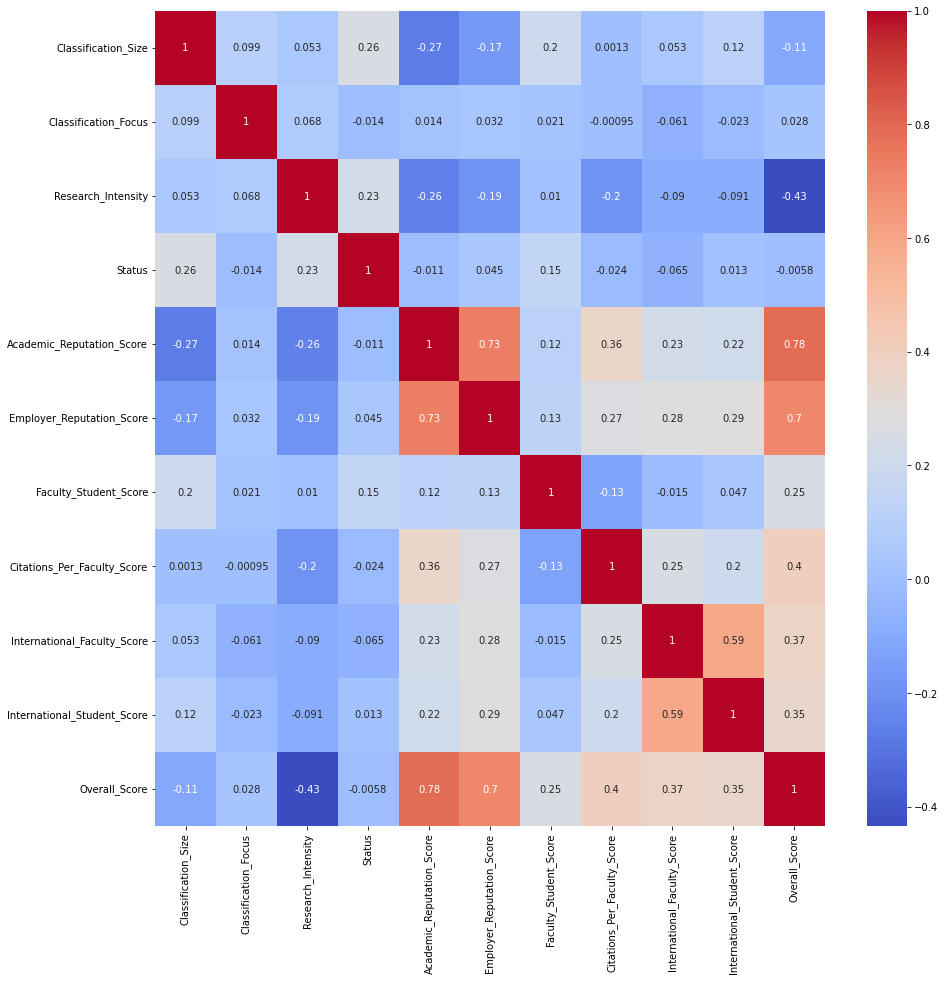

In [390]:
plt.figure(figsize=(15,15))
sns.heatmap(encoded_cat.corr(), cmap='coolwarm', annot=True)
plt.show()

### Check for linearity and multicolinearity

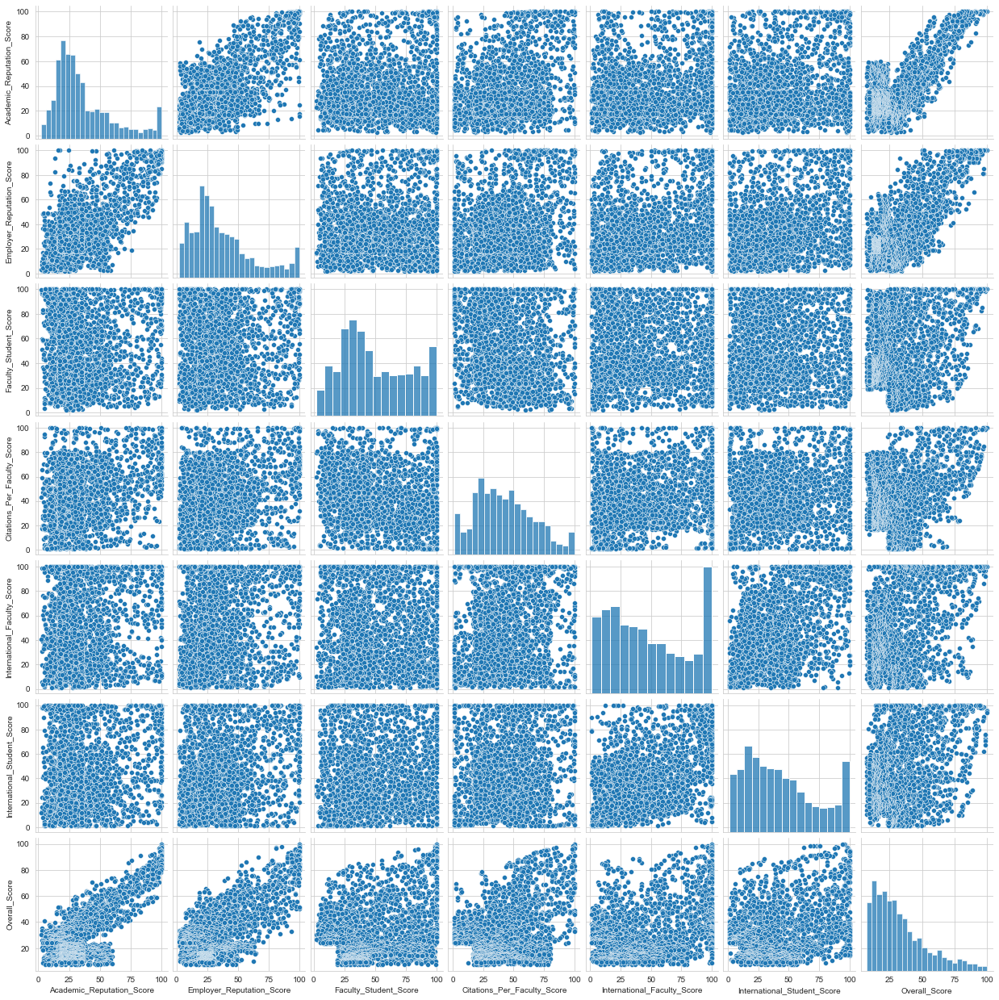

In [391]:
sns.set_style("whitegrid");
sns.pairplot(data);
plt.show();

While a few variables show some sense of relationship (like `academic_reputation_score` and `employer_reputation_score`), it can be said that the dataset is largely not multicolinear.

The bottom row shows that the each of the variables is linearly related to the target variable (`Overall_Score`).

In [392]:
lr = LinearRegression()
dt = DecisionTreeRegressor()
gb = GradientBoostingRegressor()
rf = RandomForestRegressor()
xgb = XGBRegressor()
cbt = CatBoostRegressor()
lass= Lasso()
ridge = Ridge()
models = [lr, dt, gb, rf, xgb, cbt, lass, ridge]
names = ['Linear Regression','DecisionTree','GradientBoosting','RandomForest','XGB','CATBOOST','Lasso','Rige']

In [393]:
def evaluate_models(xTrain, yTrain, xVal, yVal):
    xs = [xTrain, yTrain, xVal, yVal]
    try:
        random_seed= 0
        scores = []
        for i in range(len(models)):
            model = models[i]
            model.fit(xTrain, yTrain)
            y_predicted = model.predict(xVal)
            mse = mean_squared_error(yVal, y_predicted)
            mae = mean_absolute_error(yVal, y_predicted)
            r_squared = r2_score(yVal, y_predicted)
            scores.append({
                'model':names[i],
                'best_score':model.score(xTrain, yTrain),
                'mean_squared_error':mse,
                'mean_absolute_error':mae,
                'R_Squared': r_squared
            })
        return pd.DataFrame(scores, columns=['model','best_score','mean_squared_error','mean_absolute_error', 'R_Squared'])
    except:
        print('Error occured, confirm inputs')

In [394]:
def get_cv(X, y):
    try:
        scores = []
        for i in range(len(models)):
            model = models[i]
            cv = np.mean(np.absolute(cross_val_score(model, X, y, cv = 5, scoring = 'neg_mean_absolute_error')))
            scores.append({'model' : names[i],
                          'CV' : cv})
        return pd.DataFrame(scores, columns = ['model', 'CV'])
    except:
        print('Error occured, confirm inputs')

In [395]:
X = encoded_cat.drop(['Overall_Score'], axis = 1)
y = encoded_cat['Overall_Score']

In [396]:
get_cv(X,y)

Learning rate set to 0.045689
0:	learn: 19.0194195	total: 145ms	remaining: 2m 24s
1:	learn: 18.3854773	total: 148ms	remaining: 1m 13s
2:	learn: 17.8296519	total: 152ms	remaining: 50.4s
3:	learn: 17.2766898	total: 154ms	remaining: 38.5s
4:	learn: 16.7266822	total: 157ms	remaining: 31.3s
5:	learn: 16.2082366	total: 160ms	remaining: 26.5s
6:	learn: 15.7043081	total: 163ms	remaining: 23.1s
7:	learn: 15.2573186	total: 166ms	remaining: 20.6s
8:	learn: 14.8332597	total: 169ms	remaining: 18.6s
9:	learn: 14.4213137	total: 172ms	remaining: 17s
10:	learn: 14.0246641	total: 175ms	remaining: 15.8s
11:	learn: 13.6497896	total: 178ms	remaining: 14.7s
12:	learn: 13.3019988	total: 181ms	remaining: 13.8s
13:	learn: 13.0071428	total: 185ms	remaining: 13s
14:	learn: 12.6506617	total: 188ms	remaining: 12.4s
15:	learn: 12.3376068	total: 192ms	remaining: 11.8s
16:	learn: 12.0573019	total: 195ms	remaining: 11.3s
17:	learn: 11.7678164	total: 199ms	remaining: 10.8s
18:	learn: 11.5356675	total: 202ms	remaining: 

171:	learn: 5.0522457	total: 700ms	remaining: 3.37s
172:	learn: 5.0456780	total: 703ms	remaining: 3.36s
173:	learn: 5.0386904	total: 706ms	remaining: 3.35s
174:	learn: 5.0298015	total: 709ms	remaining: 3.34s
175:	learn: 5.0183131	total: 712ms	remaining: 3.33s
176:	learn: 5.0092298	total: 715ms	remaining: 3.33s
177:	learn: 5.0004730	total: 718ms	remaining: 3.32s
178:	learn: 4.9897162	total: 722ms	remaining: 3.31s
179:	learn: 4.9842385	total: 725ms	remaining: 3.3s
180:	learn: 4.9775311	total: 728ms	remaining: 3.29s
181:	learn: 4.9616169	total: 731ms	remaining: 3.29s
182:	learn: 4.9541564	total: 734ms	remaining: 3.28s
183:	learn: 4.9465948	total: 737ms	remaining: 3.27s
184:	learn: 4.9372743	total: 741ms	remaining: 3.27s
185:	learn: 4.9317570	total: 747ms	remaining: 3.27s
186:	learn: 4.9218117	total: 750ms	remaining: 3.26s
187:	learn: 4.9163997	total: 753ms	remaining: 3.25s
188:	learn: 4.9095857	total: 756ms	remaining: 3.24s
189:	learn: 4.9011176	total: 759ms	remaining: 3.24s
190:	learn: 4

382:	learn: 3.8832542	total: 1.39s	remaining: 2.23s
383:	learn: 3.8779544	total: 1.39s	remaining: 2.23s
384:	learn: 3.8758853	total: 1.39s	remaining: 2.23s
385:	learn: 3.8737607	total: 1.4s	remaining: 2.22s
386:	learn: 3.8708672	total: 1.4s	remaining: 2.22s
387:	learn: 3.8684148	total: 1.4s	remaining: 2.21s
388:	learn: 3.8660573	total: 1.41s	remaining: 2.21s
389:	learn: 3.8616927	total: 1.41s	remaining: 2.2s
390:	learn: 3.8571721	total: 1.41s	remaining: 2.2s
391:	learn: 3.8538556	total: 1.42s	remaining: 2.19s
392:	learn: 3.8484570	total: 1.42s	remaining: 2.19s
393:	learn: 3.8451339	total: 1.42s	remaining: 2.19s
394:	learn: 3.8401812	total: 1.42s	remaining: 2.18s
395:	learn: 3.8338610	total: 1.43s	remaining: 2.18s
396:	learn: 3.8293249	total: 1.43s	remaining: 2.17s
397:	learn: 3.8240077	total: 1.43s	remaining: 2.17s
398:	learn: 3.8214760	total: 1.44s	remaining: 2.16s
399:	learn: 3.8196022	total: 1.44s	remaining: 2.16s
400:	learn: 3.8152253	total: 1.44s	remaining: 2.15s
401:	learn: 3.812

546:	learn: 3.3643997	total: 1.9s	remaining: 1.57s
547:	learn: 3.3632534	total: 1.91s	remaining: 1.57s
548:	learn: 3.3607615	total: 1.91s	remaining: 1.57s
549:	learn: 3.3586470	total: 1.91s	remaining: 1.56s
550:	learn: 3.3549893	total: 1.92s	remaining: 1.56s
551:	learn: 3.3528233	total: 1.92s	remaining: 1.56s
552:	learn: 3.3500220	total: 1.92s	remaining: 1.55s
553:	learn: 3.3485429	total: 1.92s	remaining: 1.55s
554:	learn: 3.3451496	total: 1.93s	remaining: 1.54s
555:	learn: 3.3429930	total: 1.93s	remaining: 1.54s
556:	learn: 3.3415271	total: 1.93s	remaining: 1.54s
557:	learn: 3.3385711	total: 1.94s	remaining: 1.53s
558:	learn: 3.3361202	total: 1.94s	remaining: 1.53s
559:	learn: 3.3332890	total: 1.94s	remaining: 1.53s
560:	learn: 3.3315567	total: 1.95s	remaining: 1.52s
561:	learn: 3.3280041	total: 1.95s	remaining: 1.52s
562:	learn: 3.3253245	total: 1.95s	remaining: 1.51s
563:	learn: 3.3233677	total: 1.96s	remaining: 1.51s
564:	learn: 3.3221462	total: 1.96s	remaining: 1.51s
565:	learn: 3

710:	learn: 2.9839643	total: 2.42s	remaining: 985ms
711:	learn: 2.9827686	total: 2.42s	remaining: 981ms
712:	learn: 2.9807600	total: 2.43s	remaining: 978ms
713:	learn: 2.9793747	total: 2.43s	remaining: 974ms
714:	learn: 2.9776505	total: 2.43s	remaining: 970ms
715:	learn: 2.9756542	total: 2.44s	remaining: 967ms
716:	learn: 2.9729035	total: 2.44s	remaining: 963ms
717:	learn: 2.9709721	total: 2.44s	remaining: 960ms
718:	learn: 2.9679960	total: 2.45s	remaining: 956ms
719:	learn: 2.9645841	total: 2.45s	remaining: 953ms
720:	learn: 2.9636575	total: 2.45s	remaining: 949ms
721:	learn: 2.9621411	total: 2.46s	remaining: 946ms
722:	learn: 2.9598655	total: 2.46s	remaining: 942ms
723:	learn: 2.9558659	total: 2.46s	remaining: 939ms
724:	learn: 2.9534801	total: 2.46s	remaining: 935ms
725:	learn: 2.9508238	total: 2.47s	remaining: 932ms
726:	learn: 2.9488601	total: 2.47s	remaining: 928ms
727:	learn: 2.9466893	total: 2.47s	remaining: 925ms
728:	learn: 2.9459485	total: 2.48s	remaining: 921ms
729:	learn: 

873:	learn: 2.6769555	total: 2.93s	remaining: 423ms
874:	learn: 2.6751888	total: 2.94s	remaining: 419ms
875:	learn: 2.6736609	total: 2.94s	remaining: 416ms
876:	learn: 2.6723789	total: 2.94s	remaining: 413ms
877:	learn: 2.6707837	total: 2.94s	remaining: 409ms
878:	learn: 2.6692412	total: 2.95s	remaining: 406ms
879:	learn: 2.6670822	total: 2.95s	remaining: 402ms
880:	learn: 2.6649114	total: 2.95s	remaining: 399ms
881:	learn: 2.6634402	total: 2.96s	remaining: 396ms
882:	learn: 2.6618476	total: 2.96s	remaining: 392ms
883:	learn: 2.6605234	total: 2.96s	remaining: 389ms
884:	learn: 2.6577675	total: 2.97s	remaining: 385ms
885:	learn: 2.6562269	total: 2.97s	remaining: 382ms
886:	learn: 2.6550304	total: 2.97s	remaining: 379ms
887:	learn: 2.6536279	total: 2.98s	remaining: 375ms
888:	learn: 2.6517113	total: 2.98s	remaining: 372ms
889:	learn: 2.6489537	total: 2.98s	remaining: 369ms
890:	learn: 2.6480650	total: 2.98s	remaining: 365ms
891:	learn: 2.6464749	total: 2.99s	remaining: 362ms
892:	learn: 

67:	learn: 6.5670326	total: 216ms	remaining: 2.96s
68:	learn: 6.5339957	total: 220ms	remaining: 2.96s
69:	learn: 6.4961539	total: 223ms	remaining: 2.96s
70:	learn: 6.4727953	total: 226ms	remaining: 2.96s
71:	learn: 6.4417059	total: 230ms	remaining: 2.96s
72:	learn: 6.4127894	total: 233ms	remaining: 2.96s
73:	learn: 6.3927128	total: 236ms	remaining: 2.95s
74:	learn: 6.3716537	total: 239ms	remaining: 2.95s
75:	learn: 6.3389186	total: 242ms	remaining: 2.94s
76:	learn: 6.3219776	total: 245ms	remaining: 2.94s
77:	learn: 6.2878829	total: 248ms	remaining: 2.93s
78:	learn: 6.2606360	total: 252ms	remaining: 2.94s
79:	learn: 6.2327095	total: 255ms	remaining: 2.93s
80:	learn: 6.2112370	total: 258ms	remaining: 2.93s
81:	learn: 6.1915813	total: 261ms	remaining: 2.92s
82:	learn: 6.1709059	total: 264ms	remaining: 2.92s
83:	learn: 6.1539721	total: 267ms	remaining: 2.91s
84:	learn: 6.1371062	total: 270ms	remaining: 2.9s
85:	learn: 6.1210637	total: 274ms	remaining: 2.91s
86:	learn: 6.1029315	total: 277m

272:	learn: 4.5660759	total: 899ms	remaining: 2.39s
273:	learn: 4.5633949	total: 902ms	remaining: 2.39s
274:	learn: 4.5614488	total: 905ms	remaining: 2.39s
275:	learn: 4.5565232	total: 908ms	remaining: 2.38s
276:	learn: 4.5480388	total: 911ms	remaining: 2.38s
277:	learn: 4.5427510	total: 915ms	remaining: 2.38s
278:	learn: 4.5321544	total: 918ms	remaining: 2.37s
279:	learn: 4.5272270	total: 921ms	remaining: 2.37s
280:	learn: 4.5228652	total: 924ms	remaining: 2.36s
281:	learn: 4.5186194	total: 928ms	remaining: 2.36s
282:	learn: 4.5141524	total: 935ms	remaining: 2.37s
283:	learn: 4.5096231	total: 940ms	remaining: 2.37s
284:	learn: 4.5065113	total: 946ms	remaining: 2.37s
285:	learn: 4.5021822	total: 950ms	remaining: 2.37s
286:	learn: 4.4965332	total: 955ms	remaining: 2.37s
287:	learn: 4.4918416	total: 959ms	remaining: 2.37s
288:	learn: 4.4869373	total: 962ms	remaining: 2.37s
289:	learn: 4.4817520	total: 965ms	remaining: 2.36s
290:	learn: 4.4772323	total: 968ms	remaining: 2.36s
291:	learn: 

467:	learn: 3.7884815	total: 1.58s	remaining: 1.8s
468:	learn: 3.7851172	total: 1.59s	remaining: 1.8s
469:	learn: 3.7787909	total: 1.59s	remaining: 1.79s
470:	learn: 3.7731887	total: 1.59s	remaining: 1.79s
471:	learn: 3.7702415	total: 1.6s	remaining: 1.78s
472:	learn: 3.7670919	total: 1.6s	remaining: 1.78s
473:	learn: 3.7644319	total: 1.6s	remaining: 1.78s
474:	learn: 3.7608818	total: 1.6s	remaining: 1.77s
475:	learn: 3.7580293	total: 1.61s	remaining: 1.77s
476:	learn: 3.7535372	total: 1.61s	remaining: 1.77s
477:	learn: 3.7497427	total: 1.61s	remaining: 1.76s
478:	learn: 3.7459971	total: 1.62s	remaining: 1.76s
479:	learn: 3.7448631	total: 1.62s	remaining: 1.76s
480:	learn: 3.7416608	total: 1.62s	remaining: 1.75s
481:	learn: 3.7398462	total: 1.63s	remaining: 1.75s
482:	learn: 3.7347977	total: 1.63s	remaining: 1.75s
483:	learn: 3.7303199	total: 1.63s	remaining: 1.74s
484:	learn: 3.7286152	total: 1.64s	remaining: 1.74s
485:	learn: 3.7265841	total: 1.64s	remaining: 1.73s
486:	learn: 3.7254

667:	learn: 3.2659610	total: 2.27s	remaining: 1.13s
668:	learn: 3.2634663	total: 2.27s	remaining: 1.12s
669:	learn: 3.2617381	total: 2.27s	remaining: 1.12s
670:	learn: 3.2600332	total: 2.28s	remaining: 1.12s
671:	learn: 3.2575291	total: 2.28s	remaining: 1.11s
672:	learn: 3.2556912	total: 2.29s	remaining: 1.11s
673:	learn: 3.2541182	total: 2.29s	remaining: 1.11s
674:	learn: 3.2509984	total: 2.29s	remaining: 1.1s
675:	learn: 3.2492922	total: 2.29s	remaining: 1.1s
676:	learn: 3.2485012	total: 2.3s	remaining: 1.09s
677:	learn: 3.2468134	total: 2.3s	remaining: 1.09s
678:	learn: 3.2449716	total: 2.3s	remaining: 1.09s
679:	learn: 3.2430562	total: 2.31s	remaining: 1.08s
680:	learn: 3.2415071	total: 2.31s	remaining: 1.08s
681:	learn: 3.2393670	total: 2.31s	remaining: 1.08s
682:	learn: 3.2364485	total: 2.31s	remaining: 1.07s
683:	learn: 3.2333509	total: 2.32s	remaining: 1.07s
684:	learn: 3.2307475	total: 2.32s	remaining: 1.07s
685:	learn: 3.2292059	total: 2.33s	remaining: 1.06s
686:	learn: 3.225

827:	learn: 2.9508131	total: 2.79s	remaining: 579ms
828:	learn: 2.9469781	total: 2.79s	remaining: 576ms
829:	learn: 2.9452243	total: 2.79s	remaining: 573ms
830:	learn: 2.9432237	total: 2.8s	remaining: 569ms
831:	learn: 2.9416935	total: 2.8s	remaining: 566ms
832:	learn: 2.9398137	total: 2.8s	remaining: 562ms
833:	learn: 2.9380783	total: 2.81s	remaining: 559ms
834:	learn: 2.9361343	total: 2.81s	remaining: 556ms
835:	learn: 2.9340440	total: 2.81s	remaining: 552ms
836:	learn: 2.9318000	total: 2.82s	remaining: 549ms
837:	learn: 2.9313698	total: 2.82s	remaining: 545ms
838:	learn: 2.9296896	total: 2.82s	remaining: 542ms
839:	learn: 2.9270875	total: 2.83s	remaining: 538ms
840:	learn: 2.9249836	total: 2.83s	remaining: 535ms
841:	learn: 2.9234314	total: 2.83s	remaining: 532ms
842:	learn: 2.9220669	total: 2.84s	remaining: 528ms
843:	learn: 2.9197201	total: 2.84s	remaining: 525ms
844:	learn: 2.9188188	total: 2.84s	remaining: 521ms
845:	learn: 2.9167097	total: 2.85s	remaining: 518ms
846:	learn: 2.9

988:	learn: 2.6826308	total: 3.3s	remaining: 36.7ms
989:	learn: 2.6814209	total: 3.3s	remaining: 33.4ms
990:	learn: 2.6793246	total: 3.31s	remaining: 30ms
991:	learn: 2.6784316	total: 3.31s	remaining: 26.7ms
992:	learn: 2.6769785	total: 3.31s	remaining: 23.4ms
993:	learn: 2.6751178	total: 3.32s	remaining: 20ms
994:	learn: 2.6734101	total: 3.32s	remaining: 16.7ms
995:	learn: 2.6716895	total: 3.32s	remaining: 13.3ms
996:	learn: 2.6684168	total: 3.33s	remaining: 10ms
997:	learn: 2.6670411	total: 3.33s	remaining: 6.67ms
998:	learn: 2.6648078	total: 3.33s	remaining: 3.33ms
999:	learn: 2.6631983	total: 3.33s	remaining: 0us
Learning rate set to 0.045689
0:	learn: 19.8896112	total: 3.18ms	remaining: 3.18s
1:	learn: 19.1888184	total: 8.51ms	remaining: 4.25s
2:	learn: 18.5391792	total: 11.4ms	remaining: 3.78s
3:	learn: 17.8950964	total: 14.5ms	remaining: 3.61s
4:	learn: 17.2818527	total: 17.4ms	remaining: 3.46s
5:	learn: 16.6860624	total: 20.7ms	remaining: 3.44s
6:	learn: 16.1134497	total: 23.8m

160:	learn: 3.9674635	total: 567ms	remaining: 2.95s
161:	learn: 3.9601861	total: 570ms	remaining: 2.95s
162:	learn: 3.9481147	total: 574ms	remaining: 2.94s
163:	learn: 3.9421904	total: 577ms	remaining: 2.94s
164:	learn: 3.9355036	total: 580ms	remaining: 2.94s
165:	learn: 3.9290528	total: 583ms	remaining: 2.93s
166:	learn: 3.9243002	total: 586ms	remaining: 2.92s
167:	learn: 3.9124762	total: 589ms	remaining: 2.92s
168:	learn: 3.9088207	total: 592ms	remaining: 2.91s
169:	learn: 3.9031199	total: 596ms	remaining: 2.91s
170:	learn: 3.8917779	total: 599ms	remaining: 2.9s
171:	learn: 3.8813808	total: 602ms	remaining: 2.9s
172:	learn: 3.8714022	total: 605ms	remaining: 2.89s
173:	learn: 3.8648071	total: 608ms	remaining: 2.88s
174:	learn: 3.8571525	total: 611ms	remaining: 2.88s
175:	learn: 3.8484771	total: 614ms	remaining: 2.88s
176:	learn: 3.8437574	total: 618ms	remaining: 2.87s
177:	learn: 3.8379765	total: 621ms	remaining: 2.87s
178:	learn: 3.8308728	total: 624ms	remaining: 2.86s
179:	learn: 3.

358:	learn: 2.9784524	total: 1.25s	remaining: 2.23s
359:	learn: 2.9764206	total: 1.25s	remaining: 2.23s
360:	learn: 2.9735482	total: 1.26s	remaining: 2.22s
361:	learn: 2.9702090	total: 1.26s	remaining: 2.22s
362:	learn: 2.9675690	total: 1.26s	remaining: 2.22s
363:	learn: 2.9652946	total: 1.27s	remaining: 2.21s
364:	learn: 2.9621828	total: 1.27s	remaining: 2.21s
365:	learn: 2.9582052	total: 1.27s	remaining: 2.2s
366:	learn: 2.9557275	total: 1.28s	remaining: 2.2s
367:	learn: 2.9527672	total: 1.28s	remaining: 2.2s
368:	learn: 2.9484243	total: 1.28s	remaining: 2.19s
369:	learn: 2.9459348	total: 1.29s	remaining: 2.19s
370:	learn: 2.9414202	total: 1.29s	remaining: 2.19s
371:	learn: 2.9391853	total: 1.29s	remaining: 2.18s
372:	learn: 2.9373776	total: 1.3s	remaining: 2.18s
373:	learn: 2.9338177	total: 1.3s	remaining: 2.18s
374:	learn: 2.9307108	total: 1.3s	remaining: 2.17s
375:	learn: 2.9274652	total: 1.31s	remaining: 2.17s
376:	learn: 2.9261640	total: 1.31s	remaining: 2.17s
377:	learn: 2.9224

542:	learn: 2.4994750	total: 1.94s	remaining: 1.63s
543:	learn: 2.4981276	total: 1.94s	remaining: 1.63s
544:	learn: 2.4954425	total: 1.95s	remaining: 1.62s
545:	learn: 2.4938319	total: 1.95s	remaining: 1.62s
546:	learn: 2.4908491	total: 1.95s	remaining: 1.62s
547:	learn: 2.4903579	total: 1.96s	remaining: 1.61s
548:	learn: 2.4882530	total: 1.96s	remaining: 1.61s
549:	learn: 2.4850333	total: 1.96s	remaining: 1.6s
550:	learn: 2.4818535	total: 1.97s	remaining: 1.6s
551:	learn: 2.4801566	total: 1.97s	remaining: 1.6s
552:	learn: 2.4789210	total: 1.97s	remaining: 1.59s
553:	learn: 2.4778361	total: 1.98s	remaining: 1.59s
554:	learn: 2.4745495	total: 1.98s	remaining: 1.59s
555:	learn: 2.4726073	total: 1.98s	remaining: 1.58s
556:	learn: 2.4685726	total: 1.99s	remaining: 1.58s
557:	learn: 2.4673542	total: 1.99s	remaining: 1.57s
558:	learn: 2.4662784	total: 1.99s	remaining: 1.57s
559:	learn: 2.4647175	total: 1.99s	remaining: 1.57s
560:	learn: 2.4618773	total: 2s	remaining: 1.56s
561:	learn: 2.4598

745:	learn: 2.1429353	total: 2.62s	remaining: 891ms
746:	learn: 2.1421730	total: 2.62s	remaining: 887ms
747:	learn: 2.1401583	total: 2.62s	remaining: 884ms
748:	learn: 2.1379752	total: 2.63s	remaining: 881ms
749:	learn: 2.1363122	total: 2.63s	remaining: 877ms
750:	learn: 2.1333083	total: 2.63s	remaining: 874ms
751:	learn: 2.1306793	total: 2.64s	remaining: 870ms
752:	learn: 2.1299167	total: 2.64s	remaining: 866ms
753:	learn: 2.1288437	total: 2.64s	remaining: 863ms
754:	learn: 2.1267159	total: 2.65s	remaining: 859ms
755:	learn: 2.1255579	total: 2.65s	remaining: 856ms
756:	learn: 2.1237297	total: 2.65s	remaining: 852ms
757:	learn: 2.1231203	total: 2.66s	remaining: 848ms
758:	learn: 2.1207777	total: 2.66s	remaining: 845ms
759:	learn: 2.1186083	total: 2.66s	remaining: 841ms
760:	learn: 2.1166038	total: 2.67s	remaining: 837ms
761:	learn: 2.1148019	total: 2.67s	remaining: 834ms
762:	learn: 2.1140198	total: 2.67s	remaining: 831ms
763:	learn: 2.1130170	total: 2.68s	remaining: 827ms
764:	learn: 

952:	learn: 1.8366502	total: 3.31s	remaining: 163ms
953:	learn: 1.8356989	total: 3.31s	remaining: 160ms
954:	learn: 1.8340729	total: 3.32s	remaining: 156ms
955:	learn: 1.8328409	total: 3.32s	remaining: 153ms
956:	learn: 1.8310306	total: 3.32s	remaining: 149ms
957:	learn: 1.8287788	total: 3.33s	remaining: 146ms
958:	learn: 1.8284389	total: 3.33s	remaining: 142ms
959:	learn: 1.8253792	total: 3.33s	remaining: 139ms
960:	learn: 1.8247840	total: 3.34s	remaining: 135ms
961:	learn: 1.8232471	total: 3.34s	remaining: 132ms
962:	learn: 1.8226802	total: 3.35s	remaining: 129ms
963:	learn: 1.8213991	total: 3.35s	remaining: 125ms
964:	learn: 1.8196563	total: 3.35s	remaining: 122ms
965:	learn: 1.8184715	total: 3.35s	remaining: 118ms
966:	learn: 1.8166097	total: 3.36s	remaining: 115ms
967:	learn: 1.8151512	total: 3.36s	remaining: 111ms
968:	learn: 1.8142273	total: 3.37s	remaining: 108ms
969:	learn: 1.8135195	total: 3.37s	remaining: 104ms
970:	learn: 1.8125066	total: 3.37s	remaining: 101ms
971:	learn: 

160:	learn: 5.2501628	total: 514ms	remaining: 2.68s
161:	learn: 5.2399667	total: 517ms	remaining: 2.67s
162:	learn: 5.2317401	total: 520ms	remaining: 2.67s
163:	learn: 5.2215358	total: 523ms	remaining: 2.67s
164:	learn: 5.2109542	total: 526ms	remaining: 2.66s
165:	learn: 5.2058301	total: 529ms	remaining: 2.66s
166:	learn: 5.1958750	total: 533ms	remaining: 2.66s
167:	learn: 5.1867886	total: 536ms	remaining: 2.65s
168:	learn: 5.1812118	total: 539ms	remaining: 2.65s
169:	learn: 5.1717210	total: 542ms	remaining: 2.65s
170:	learn: 5.1660366	total: 545ms	remaining: 2.64s
171:	learn: 5.1584986	total: 548ms	remaining: 2.64s
172:	learn: 5.1480689	total: 551ms	remaining: 2.63s
173:	learn: 5.1328707	total: 554ms	remaining: 2.63s
174:	learn: 5.1264652	total: 557ms	remaining: 2.63s
175:	learn: 5.1182208	total: 560ms	remaining: 2.62s
176:	learn: 5.1130292	total: 563ms	remaining: 2.62s
177:	learn: 5.1040312	total: 567ms	remaining: 2.62s
178:	learn: 5.1003849	total: 570ms	remaining: 2.61s
179:	learn: 

373:	learn: 4.0746743	total: 1.2s	remaining: 2.01s
374:	learn: 4.0728434	total: 1.2s	remaining: 2.01s
375:	learn: 4.0678172	total: 1.21s	remaining: 2s
376:	learn: 4.0616676	total: 1.21s	remaining: 2s
377:	learn: 4.0550699	total: 1.21s	remaining: 2s
378:	learn: 4.0514722	total: 1.22s	remaining: 2s
379:	learn: 4.0470895	total: 1.22s	remaining: 1.99s
380:	learn: 4.0424301	total: 1.22s	remaining: 1.99s
381:	learn: 4.0369414	total: 1.23s	remaining: 1.98s
382:	learn: 4.0315581	total: 1.23s	remaining: 1.98s
383:	learn: 4.0278437	total: 1.23s	remaining: 1.98s
384:	learn: 4.0204215	total: 1.24s	remaining: 1.97s
385:	learn: 4.0181048	total: 1.24s	remaining: 1.97s
386:	learn: 4.0164337	total: 1.24s	remaining: 1.97s
387:	learn: 4.0135163	total: 1.24s	remaining: 1.96s
388:	learn: 4.0086048	total: 1.25s	remaining: 1.96s
389:	learn: 4.0055020	total: 1.25s	remaining: 1.96s
390:	learn: 4.0040217	total: 1.25s	remaining: 1.95s
391:	learn: 3.9997354	total: 1.26s	remaining: 1.95s
392:	learn: 3.9963352	tota

536:	learn: 3.5365957	total: 1.72s	remaining: 1.48s
537:	learn: 3.5338825	total: 1.72s	remaining: 1.48s
538:	learn: 3.5322788	total: 1.73s	remaining: 1.48s
539:	learn: 3.5300671	total: 1.73s	remaining: 1.47s
540:	learn: 3.5282400	total: 1.73s	remaining: 1.47s
541:	learn: 3.5273289	total: 1.74s	remaining: 1.47s
542:	learn: 3.5264460	total: 1.74s	remaining: 1.46s
543:	learn: 3.5228125	total: 1.74s	remaining: 1.46s
544:	learn: 3.5209769	total: 1.74s	remaining: 1.46s
545:	learn: 3.5168480	total: 1.75s	remaining: 1.45s
546:	learn: 3.5148509	total: 1.75s	remaining: 1.45s
547:	learn: 3.5113932	total: 1.75s	remaining: 1.45s
548:	learn: 3.5096787	total: 1.76s	remaining: 1.44s
549:	learn: 3.5059763	total: 1.76s	remaining: 1.44s
550:	learn: 3.5024248	total: 1.76s	remaining: 1.44s
551:	learn: 3.5005804	total: 1.77s	remaining: 1.43s
552:	learn: 3.4982632	total: 1.77s	remaining: 1.43s
553:	learn: 3.4957256	total: 1.77s	remaining: 1.43s
554:	learn: 3.4946157	total: 1.78s	remaining: 1.42s
555:	learn: 

698:	learn: 3.1358748	total: 2.24s	remaining: 964ms
699:	learn: 3.1350100	total: 2.24s	remaining: 961ms
700:	learn: 3.1335952	total: 2.25s	remaining: 958ms
701:	learn: 3.1327459	total: 2.25s	remaining: 954ms
702:	learn: 3.1315206	total: 2.25s	remaining: 952ms
703:	learn: 3.1294724	total: 2.26s	remaining: 949ms
704:	learn: 3.1275373	total: 2.26s	remaining: 945ms
705:	learn: 3.1241546	total: 2.26s	remaining: 942ms
706:	learn: 3.1207273	total: 2.27s	remaining: 939ms
707:	learn: 3.1184273	total: 2.27s	remaining: 936ms
708:	learn: 3.1167805	total: 2.27s	remaining: 932ms
709:	learn: 3.1141425	total: 2.27s	remaining: 929ms
710:	learn: 3.1127485	total: 2.28s	remaining: 926ms
711:	learn: 3.1109276	total: 2.28s	remaining: 923ms
712:	learn: 3.1080729	total: 2.28s	remaining: 920ms
713:	learn: 3.1068125	total: 2.29s	remaining: 916ms
714:	learn: 3.1043986	total: 2.29s	remaining: 913ms
715:	learn: 3.1031147	total: 2.29s	remaining: 910ms
716:	learn: 3.1016667	total: 2.3s	remaining: 906ms
717:	learn: 3

861:	learn: 2.8176113	total: 2.75s	remaining: 441ms
862:	learn: 2.8164664	total: 2.75s	remaining: 437ms
863:	learn: 2.8153814	total: 2.76s	remaining: 434ms
864:	learn: 2.8132813	total: 2.76s	remaining: 431ms
865:	learn: 2.8113499	total: 2.77s	remaining: 428ms
866:	learn: 2.8096535	total: 2.77s	remaining: 425ms
867:	learn: 2.8080249	total: 2.77s	remaining: 421ms
868:	learn: 2.8066332	total: 2.77s	remaining: 418ms
869:	learn: 2.8057529	total: 2.78s	remaining: 415ms
870:	learn: 2.8041192	total: 2.78s	remaining: 412ms
871:	learn: 2.8024184	total: 2.78s	remaining: 409ms
872:	learn: 2.8000118	total: 2.79s	remaining: 405ms
873:	learn: 2.7963533	total: 2.79s	remaining: 402ms
874:	learn: 2.7945209	total: 2.79s	remaining: 399ms
875:	learn: 2.7929435	total: 2.79s	remaining: 396ms
876:	learn: 2.7916239	total: 2.8s	remaining: 392ms
877:	learn: 2.7891940	total: 2.8s	remaining: 389ms
878:	learn: 2.7885770	total: 2.8s	remaining: 386ms
879:	learn: 2.7866320	total: 2.81s	remaining: 383ms
880:	learn: 2.7

53:	learn: 6.9114209	total: 177ms	remaining: 3.1s
54:	learn: 6.8670996	total: 180ms	remaining: 3.1s
55:	learn: 6.8183661	total: 183ms	remaining: 3.09s
56:	learn: 6.7769324	total: 186ms	remaining: 3.08s
57:	learn: 6.7258373	total: 191ms	remaining: 3.1s
58:	learn: 6.6701760	total: 194ms	remaining: 3.1s
59:	learn: 6.6098842	total: 197ms	remaining: 3.09s
60:	learn: 6.5579681	total: 200ms	remaining: 3.08s
61:	learn: 6.5238212	total: 204ms	remaining: 3.08s
62:	learn: 6.4943746	total: 207ms	remaining: 3.08s
63:	learn: 6.4636536	total: 210ms	remaining: 3.07s
64:	learn: 6.4249367	total: 214ms	remaining: 3.07s
65:	learn: 6.3945307	total: 217ms	remaining: 3.07s
66:	learn: 6.3628037	total: 220ms	remaining: 3.06s
67:	learn: 6.3115406	total: 223ms	remaining: 3.05s
68:	learn: 6.2788719	total: 226ms	remaining: 3.04s
69:	learn: 6.2499456	total: 229ms	remaining: 3.04s
70:	learn: 6.2132893	total: 232ms	remaining: 3.03s
71:	learn: 6.1834954	total: 235ms	remaining: 3.03s
72:	learn: 6.1601948	total: 238ms	r

255:	learn: 4.2356552	total: 865ms	remaining: 2.51s
256:	learn: 4.2319767	total: 869ms	remaining: 2.51s
257:	learn: 4.2287421	total: 874ms	remaining: 2.51s
258:	learn: 4.2234309	total: 880ms	remaining: 2.52s
259:	learn: 4.2194115	total: 883ms	remaining: 2.51s
260:	learn: 4.2156035	total: 886ms	remaining: 2.51s
261:	learn: 4.2074308	total: 890ms	remaining: 2.51s
262:	learn: 4.2001742	total: 893ms	remaining: 2.5s
263:	learn: 4.1935022	total: 898ms	remaining: 2.5s
264:	learn: 4.1877889	total: 903ms	remaining: 2.5s
265:	learn: 4.1803325	total: 906ms	remaining: 2.5s
266:	learn: 4.1740665	total: 909ms	remaining: 2.5s
267:	learn: 4.1697155	total: 912ms	remaining: 2.49s
268:	learn: 4.1649054	total: 915ms	remaining: 2.49s
269:	learn: 4.1582395	total: 921ms	remaining: 2.49s
270:	learn: 4.1510140	total: 924ms	remaining: 2.49s
271:	learn: 4.1464968	total: 927ms	remaining: 2.48s
272:	learn: 4.1421392	total: 930ms	remaining: 2.48s
273:	learn: 4.1370488	total: 934ms	remaining: 2.47s
274:	learn: 4.132

455:	learn: 3.3923383	total: 1.55s	remaining: 1.85s
456:	learn: 3.3889101	total: 1.55s	remaining: 1.84s
457:	learn: 3.3861030	total: 1.56s	remaining: 1.84s
458:	learn: 3.3831579	total: 1.56s	remaining: 1.84s
459:	learn: 3.3797599	total: 1.56s	remaining: 1.83s
460:	learn: 3.3773039	total: 1.56s	remaining: 1.83s
461:	learn: 3.3744301	total: 1.57s	remaining: 1.83s
462:	learn: 3.3696827	total: 1.57s	remaining: 1.82s
463:	learn: 3.3661527	total: 1.57s	remaining: 1.82s
464:	learn: 3.3649574	total: 1.58s	remaining: 1.81s
465:	learn: 3.3609956	total: 1.58s	remaining: 1.81s
466:	learn: 3.3572457	total: 1.58s	remaining: 1.81s
467:	learn: 3.3542892	total: 1.59s	remaining: 1.8s
468:	learn: 3.3515618	total: 1.59s	remaining: 1.8s
469:	learn: 3.3483822	total: 1.59s	remaining: 1.79s
470:	learn: 3.3454783	total: 1.59s	remaining: 1.79s
471:	learn: 3.3424807	total: 1.6s	remaining: 1.79s
472:	learn: 3.3390398	total: 1.6s	remaining: 1.78s
473:	learn: 3.3349306	total: 1.6s	remaining: 1.78s
474:	learn: 3.331

668:	learn: 2.8342645	total: 2.24s	remaining: 1.11s
669:	learn: 2.8315322	total: 2.24s	remaining: 1.1s
670:	learn: 2.8283879	total: 2.24s	remaining: 1.1s
671:	learn: 2.8254592	total: 2.25s	remaining: 1.1s
672:	learn: 2.8234201	total: 2.25s	remaining: 1.09s
673:	learn: 2.8212484	total: 2.25s	remaining: 1.09s
674:	learn: 2.8189526	total: 2.26s	remaining: 1.09s
675:	learn: 2.8165695	total: 2.26s	remaining: 1.08s
676:	learn: 2.8137896	total: 2.26s	remaining: 1.08s
677:	learn: 2.8107178	total: 2.27s	remaining: 1.08s
678:	learn: 2.8093238	total: 2.27s	remaining: 1.07s
679:	learn: 2.8080478	total: 2.27s	remaining: 1.07s
680:	learn: 2.8057517	total: 2.27s	remaining: 1.06s
681:	learn: 2.8048138	total: 2.28s	remaining: 1.06s
682:	learn: 2.8032133	total: 2.28s	remaining: 1.06s
683:	learn: 2.8018169	total: 2.29s	remaining: 1.06s
684:	learn: 2.7992243	total: 2.29s	remaining: 1.05s
685:	learn: 2.7967726	total: 2.29s	remaining: 1.05s
686:	learn: 2.7949040	total: 2.29s	remaining: 1.04s
687:	learn: 2.7

837:	learn: 2.5074971	total: 2.75s	remaining: 533ms
838:	learn: 2.5038475	total: 2.76s	remaining: 529ms
839:	learn: 2.5027521	total: 2.76s	remaining: 526ms
840:	learn: 2.4998452	total: 2.76s	remaining: 523ms
841:	learn: 2.4971423	total: 2.77s	remaining: 519ms
842:	learn: 2.4952213	total: 2.77s	remaining: 516ms
843:	learn: 2.4935436	total: 2.77s	remaining: 513ms
844:	learn: 2.4919469	total: 2.78s	remaining: 509ms
845:	learn: 2.4889804	total: 2.78s	remaining: 506ms
846:	learn: 2.4857591	total: 2.78s	remaining: 503ms
847:	learn: 2.4843096	total: 2.79s	remaining: 500ms
848:	learn: 2.4820625	total: 2.79s	remaining: 496ms
849:	learn: 2.4810004	total: 2.79s	remaining: 493ms
850:	learn: 2.4793064	total: 2.8s	remaining: 490ms
851:	learn: 2.4771394	total: 2.8s	remaining: 486ms
852:	learn: 2.4762899	total: 2.8s	remaining: 483ms
853:	learn: 2.4747998	total: 2.81s	remaining: 480ms
854:	learn: 2.4731019	total: 2.81s	remaining: 476ms
855:	learn: 2.4709994	total: 2.81s	remaining: 473ms
856:	learn: 2.4

,model,CV
0,Linear Regression,9.848895
1,DecisionTree,7.513139
2,GradientBoosting,6.812378
3,RandomForest,6.367434
4,XGB,6.438848
5,CATBOOST,5.683577
6,Lasso,10.497810
7,Rige,9.850568


In [397]:
xtrain, xtest, ytrain, ytest = train_test_split(X, y, test_size = 0.3)

In [398]:
evaluate_models(xtrain, ytrain, xtest, ytest)

Learning rate set to 0.044736
0:	learn: 19.9077367	total: 3.01ms	remaining: 3s
1:	learn: 19.2509573	total: 5.96ms	remaining: 2.97s
2:	learn: 18.6626315	total: 9.15ms	remaining: 3.04s
3:	learn: 18.0814979	total: 11.8ms	remaining: 2.94s
4:	learn: 17.5392771	total: 14.6ms	remaining: 2.9s
5:	learn: 16.9888037	total: 21ms	remaining: 3.48s
6:	learn: 16.4520804	total: 24.1ms	remaining: 3.42s
7:	learn: 15.9993283	total: 26.7ms	remaining: 3.31s
8:	learn: 15.5521154	total: 30.8ms	remaining: 3.39s
9:	learn: 15.1336940	total: 33.6ms	remaining: 3.32s
10:	learn: 14.7460051	total: 36.6ms	remaining: 3.29s
11:	learn: 14.3366710	total: 41.1ms	remaining: 3.38s
12:	learn: 13.9580235	total: 44ms	remaining: 3.34s
13:	learn: 13.6533468	total: 46.8ms	remaining: 3.29s
14:	learn: 13.2635641	total: 49.7ms	remaining: 3.26s
15:	learn: 12.9249177	total: 53.1ms	remaining: 3.27s
16:	learn: 12.6175941	total: 56ms	remaining: 3.24s
17:	learn: 12.3103446	total: 58.8ms	remaining: 3.21s
18:	learn: 12.0393996	total: 63.8ms	

199:	learn: 4.7704489	total: 686ms	remaining: 2.74s
200:	learn: 4.7611046	total: 689ms	remaining: 2.74s
201:	learn: 4.7529157	total: 693ms	remaining: 2.74s
202:	learn: 4.7454674	total: 696ms	remaining: 2.73s
203:	learn: 4.7359563	total: 700ms	remaining: 2.73s
204:	learn: 4.7265918	total: 703ms	remaining: 2.73s
205:	learn: 4.7223893	total: 706ms	remaining: 2.72s
206:	learn: 4.7135682	total: 709ms	remaining: 2.72s
207:	learn: 4.7082997	total: 713ms	remaining: 2.71s
208:	learn: 4.6992622	total: 716ms	remaining: 2.71s
209:	learn: 4.6895594	total: 720ms	remaining: 2.71s
210:	learn: 4.6825936	total: 723ms	remaining: 2.7s
211:	learn: 4.6777626	total: 726ms	remaining: 2.7s
212:	learn: 4.6691290	total: 729ms	remaining: 2.69s
213:	learn: 4.6622317	total: 732ms	remaining: 2.69s
214:	learn: 4.6557269	total: 736ms	remaining: 2.69s
215:	learn: 4.6444649	total: 739ms	remaining: 2.68s
216:	learn: 4.6381635	total: 742ms	remaining: 2.68s
217:	learn: 4.6314134	total: 745ms	remaining: 2.67s
218:	learn: 4.

401:	learn: 3.7140720	total: 1.36s	remaining: 2.02s
402:	learn: 3.7096014	total: 1.36s	remaining: 2.02s
403:	learn: 3.7055246	total: 1.37s	remaining: 2.02s
404:	learn: 3.7019117	total: 1.37s	remaining: 2.01s
405:	learn: 3.6966078	total: 1.37s	remaining: 2.01s
406:	learn: 3.6939940	total: 1.38s	remaining: 2s
407:	learn: 3.6901791	total: 1.38s	remaining: 2s
408:	learn: 3.6856672	total: 1.38s	remaining: 2s
409:	learn: 3.6813071	total: 1.39s	remaining: 2s
410:	learn: 3.6786395	total: 1.39s	remaining: 1.99s
411:	learn: 3.6741129	total: 1.39s	remaining: 1.99s
412:	learn: 3.6697992	total: 1.4s	remaining: 1.99s
413:	learn: 3.6655214	total: 1.4s	remaining: 1.98s
414:	learn: 3.6620682	total: 1.4s	remaining: 1.98s
415:	learn: 3.6578420	total: 1.41s	remaining: 1.98s
416:	learn: 3.6548316	total: 1.41s	remaining: 1.97s
417:	learn: 3.6506284	total: 1.42s	remaining: 1.97s
418:	learn: 3.6451944	total: 1.42s	remaining: 1.97s
419:	learn: 3.6413235	total: 1.42s	remaining: 1.96s
420:	learn: 3.6383687	total

561:	learn: 3.1882855	total: 1.87s	remaining: 1.46s
562:	learn: 3.1853237	total: 1.88s	remaining: 1.46s
563:	learn: 3.1817138	total: 1.88s	remaining: 1.45s
564:	learn: 3.1786600	total: 1.88s	remaining: 1.45s
565:	learn: 3.1765841	total: 1.89s	remaining: 1.45s
566:	learn: 3.1736157	total: 1.89s	remaining: 1.44s
567:	learn: 3.1696208	total: 1.89s	remaining: 1.44s
568:	learn: 3.1678349	total: 1.89s	remaining: 1.43s
569:	learn: 3.1665846	total: 1.9s	remaining: 1.43s
570:	learn: 3.1629930	total: 1.9s	remaining: 1.43s
571:	learn: 3.1603019	total: 1.9s	remaining: 1.42s
572:	learn: 3.1587216	total: 1.91s	remaining: 1.42s
573:	learn: 3.1550311	total: 1.91s	remaining: 1.42s
574:	learn: 3.1525047	total: 1.91s	remaining: 1.41s
575:	learn: 3.1491159	total: 1.91s	remaining: 1.41s
576:	learn: 3.1459884	total: 1.92s	remaining: 1.41s
577:	learn: 3.1426447	total: 1.92s	remaining: 1.4s
578:	learn: 3.1408889	total: 1.92s	remaining: 1.4s
579:	learn: 3.1378871	total: 1.93s	remaining: 1.39s
580:	learn: 3.135

724:	learn: 2.7838172	total: 2.39s	remaining: 906ms
725:	learn: 2.7816698	total: 2.39s	remaining: 903ms
726:	learn: 2.7795328	total: 2.4s	remaining: 900ms
727:	learn: 2.7783285	total: 2.4s	remaining: 897ms
728:	learn: 2.7757520	total: 2.4s	remaining: 893ms
729:	learn: 2.7715528	total: 2.4s	remaining: 890ms
730:	learn: 2.7689141	total: 2.41s	remaining: 887ms
731:	learn: 2.7664541	total: 2.41s	remaining: 883ms
732:	learn: 2.7657590	total: 2.42s	remaining: 880ms
733:	learn: 2.7638297	total: 2.42s	remaining: 876ms
734:	learn: 2.7618308	total: 2.42s	remaining: 873ms
735:	learn: 2.7588857	total: 2.42s	remaining: 869ms
736:	learn: 2.7575008	total: 2.43s	remaining: 866ms
737:	learn: 2.7542276	total: 2.43s	remaining: 864ms
738:	learn: 2.7526924	total: 2.44s	remaining: 860ms
739:	learn: 2.7498160	total: 2.44s	remaining: 857ms
740:	learn: 2.7489285	total: 2.44s	remaining: 854ms
741:	learn: 2.7464427	total: 2.44s	remaining: 850ms
742:	learn: 2.7444756	total: 2.45s	remaining: 847ms
743:	learn: 2.74

926:	learn: 2.4101942	total: 3.08s	remaining: 242ms
927:	learn: 2.4084630	total: 3.08s	remaining: 239ms
928:	learn: 2.4063957	total: 3.08s	remaining: 236ms
929:	learn: 2.4042968	total: 3.09s	remaining: 232ms
930:	learn: 2.4021754	total: 3.09s	remaining: 229ms
931:	learn: 2.4015350	total: 3.09s	remaining: 226ms
932:	learn: 2.3995121	total: 3.1s	remaining: 222ms
933:	learn: 2.3967576	total: 3.1s	remaining: 219ms
934:	learn: 2.3943633	total: 3.1s	remaining: 216ms
935:	learn: 2.3914100	total: 3.11s	remaining: 212ms
936:	learn: 2.3896388	total: 3.11s	remaining: 209ms
937:	learn: 2.3887852	total: 3.11s	remaining: 206ms
938:	learn: 2.3880255	total: 3.12s	remaining: 202ms
939:	learn: 2.3869276	total: 3.12s	remaining: 199ms
940:	learn: 2.3855127	total: 3.12s	remaining: 196ms
941:	learn: 2.3849611	total: 3.13s	remaining: 192ms
942:	learn: 2.3821212	total: 3.13s	remaining: 189ms
943:	learn: 2.3812213	total: 3.13s	remaining: 186ms
944:	learn: 2.3803876	total: 3.13s	remaining: 182ms
945:	learn: 2.3

,model,best_score,mean_squared_error,mean_absolute_error,R_Squared
0,Linear Regression,0.769903,91.519100,7.665702,0.788648
1,DecisionTree,1.000000,65.660652,5.170573,0.848365
2,GradientBoosting,0.939521,38.948894,4.574551,0.910052
3,RandomForest,0.989228,33.738404,3.810682,0.922085
4,XGB,0.998580,32.601128,4.013357,0.924712
5,CATBOOST,0.987566,28.092703,3.632748,0.935123
6,Lasso,0.761385,90.469415,7.944642,0.791072
7,Rige,0.769903,91.505819,7.666410,0.788678


In [399]:
one_hot = pd.concat([data.drop(list(cat_cols.columns), axis = 1),pd.get_dummies(cat_cols)], axis = 1)

In [400]:
one_hot

,Academic_Reputation_Score,Employer_Reputation_Score,Faculty_Student_Score,Citations_Per_Faculty_Score,International_Faculty_Score,International_Student_Score,Overall_Score,Classification_Size_L,Classification_Size_M,Classification_Size_S,Classification_Size_XL,Classification_Focus_CO,Classification_Focus_FC,Classification_Focus_FO,Classification_Focus_SP,Research_Intensity_HI,Research_Intensity_LO,Research_Intensity_MD,Research_Intensity_VH,Status_A,Status_B,Status_C
0,100.0,100.0,100.0,99.9,100.0,96.1,100.0,0,1,0,0,1,0,0,0,0,0,0,1,0,1,0
1,100.0,100.0,100.0,99.4,99.6,72.7,98.7,1,0,0,0,0,1,0,0,0,0,0,1,0,1,0
2,100.0,100.0,98.3,99.9,96.5,75.2,98.4,1,0,0,0,0,1,0,0,0,0,0,1,0,1,0
3,99.5,85.4,100.0,100.0,93.4,89.2,97.7,0,0,1,0,1,0,0,0,0,0,0,1,0,1,0
4,100.0,100.0,100.0,78.3,97.4,97.7,95.6,1,0,0,0,0,1,0,0,0,0,0,1,1,0,0
5,100.0,100.0,100.0,76.3,98.6,98.5,95.3,1,0,0,0,0,1,0,0,0,0,0,1,1,0,0
6,99.7,99.5,99.1,74.7,96.6,100.0,94.6,0,0,0,1,0,1,0,0,0,0,0,1,1,0,0
7,99.4,100.0,100.0,68.7,100.0,100.0,93.7,1,0,0,0,0,1,0,0,0,0,0,1,1,0,0
8,99.9,92.9,96.5,85.9,71.9,79.8,93.5,1,0,0,0,0,1,0,0,0,0,0,1,0,1,0
9,99.6,99.4,68.2,98.7,100.0,98.8,93.3,1,0,0,0,1,0,0,0,0,0,0,1,1,0,0


In [401]:
X2 = one_hot.drop(['Overall_Score'], axis = 1)
y2 = one_hot['Overall_Score']

xtrain2, xtest2, ytrain2, ytest2 = train_test_split(X2, y2, test_size = 0.3)

In [402]:
get_cv(X2, y2)

Learning rate set to 0.045689
0:	learn: 19.0788704	total: 3.19ms	remaining: 3.19s
1:	learn: 18.4626002	total: 6.26ms	remaining: 3.12s
2:	learn: 17.8485632	total: 9.37ms	remaining: 3.11s
3:	learn: 17.2784582	total: 12.6ms	remaining: 3.13s
4:	learn: 16.7309265	total: 15.6ms	remaining: 3.11s
5:	learn: 16.2121683	total: 18.8ms	remaining: 3.11s
6:	learn: 15.7485662	total: 21.7ms	remaining: 3.07s
7:	learn: 15.2936359	total: 25ms	remaining: 3.1s
8:	learn: 14.8836608	total: 28ms	remaining: 3.09s
9:	learn: 14.4477097	total: 31.1ms	remaining: 3.08s
10:	learn: 14.0744163	total: 34.4ms	remaining: 3.09s
11:	learn: 13.6867522	total: 37.5ms	remaining: 3.08s
12:	learn: 13.3226367	total: 40.7ms	remaining: 3.09s
13:	learn: 12.9927410	total: 43.8ms	remaining: 3.09s
14:	learn: 12.6667883	total: 47.3ms	remaining: 3.11s
15:	learn: 12.3526772	total: 50.4ms	remaining: 3.1s
16:	learn: 12.0511411	total: 53.4ms	remaining: 3.09s
17:	learn: 11.7550269	total: 56.7ms	remaining: 3.09s
18:	learn: 11.4640928	total: 59.

192:	learn: 4.8481929	total: 685ms	remaining: 2.87s
193:	learn: 4.8408902	total: 689ms	remaining: 2.86s
194:	learn: 4.8360517	total: 693ms	remaining: 2.86s
195:	learn: 4.8300557	total: 697ms	remaining: 2.86s
196:	learn: 4.8191607	total: 701ms	remaining: 2.86s
197:	learn: 4.8118055	total: 705ms	remaining: 2.85s
198:	learn: 4.8054512	total: 708ms	remaining: 2.85s
199:	learn: 4.7991631	total: 711ms	remaining: 2.84s
200:	learn: 4.7856827	total: 715ms	remaining: 2.84s
201:	learn: 4.7805749	total: 718ms	remaining: 2.84s
202:	learn: 4.7733858	total: 722ms	remaining: 2.83s
203:	learn: 4.7658673	total: 726ms	remaining: 2.83s
204:	learn: 4.7603930	total: 729ms	remaining: 2.83s
205:	learn: 4.7554280	total: 732ms	remaining: 2.82s
206:	learn: 4.7498420	total: 736ms	remaining: 2.82s
207:	learn: 4.7440080	total: 739ms	remaining: 2.81s
208:	learn: 4.7361231	total: 743ms	remaining: 2.81s
209:	learn: 4.7287450	total: 747ms	remaining: 2.81s
210:	learn: 4.7225532	total: 750ms	remaining: 2.81s
211:	learn: 

364:	learn: 3.9293541	total: 1.37s	remaining: 2.39s
365:	learn: 3.9267432	total: 1.38s	remaining: 2.38s
366:	learn: 3.9246167	total: 1.38s	remaining: 2.38s
367:	learn: 3.9189288	total: 1.39s	remaining: 2.38s
368:	learn: 3.9145557	total: 1.39s	remaining: 2.38s
369:	learn: 3.9125620	total: 1.39s	remaining: 2.37s
370:	learn: 3.9106435	total: 1.4s	remaining: 2.37s
371:	learn: 3.9081730	total: 1.4s	remaining: 2.36s
372:	learn: 3.9060833	total: 1.4s	remaining: 2.36s
373:	learn: 3.9023756	total: 1.41s	remaining: 2.37s
374:	learn: 3.9005156	total: 1.42s	remaining: 2.36s
375:	learn: 3.8955568	total: 1.42s	remaining: 2.36s
376:	learn: 3.8898589	total: 1.42s	remaining: 2.35s
377:	learn: 3.8877871	total: 1.43s	remaining: 2.36s
378:	learn: 3.8851517	total: 1.44s	remaining: 2.35s
379:	learn: 3.8794180	total: 1.44s	remaining: 2.35s
380:	learn: 3.8765479	total: 1.44s	remaining: 2.35s
381:	learn: 3.8733907	total: 1.45s	remaining: 2.34s
382:	learn: 3.8691184	total: 1.45s	remaining: 2.34s
383:	learn: 3.8

531:	learn: 3.4145748	total: 2.06s	remaining: 1.81s
532:	learn: 3.4106164	total: 2.06s	remaining: 1.8s
533:	learn: 3.4078646	total: 2.06s	remaining: 1.8s
534:	learn: 3.4045826	total: 2.07s	remaining: 1.8s
535:	learn: 3.4011998	total: 2.07s	remaining: 1.79s
536:	learn: 3.3988618	total: 2.08s	remaining: 1.79s
537:	learn: 3.3976933	total: 2.08s	remaining: 1.79s
538:	learn: 3.3964105	total: 2.08s	remaining: 1.78s
539:	learn: 3.3945696	total: 2.09s	remaining: 1.78s
540:	learn: 3.3923986	total: 2.09s	remaining: 1.78s
541:	learn: 3.3906491	total: 2.1s	remaining: 1.77s
542:	learn: 3.3883603	total: 2.1s	remaining: 1.77s
543:	learn: 3.3836587	total: 2.1s	remaining: 1.76s
544:	learn: 3.3809192	total: 2.11s	remaining: 1.76s
545:	learn: 3.3782049	total: 2.11s	remaining: 1.76s
546:	learn: 3.3760549	total: 2.12s	remaining: 1.75s
547:	learn: 3.3722278	total: 2.12s	remaining: 1.75s
548:	learn: 3.3702441	total: 2.12s	remaining: 1.74s
549:	learn: 3.3669812	total: 2.13s	remaining: 1.74s
550:	learn: 3.3654

697:	learn: 3.0090018	total: 2.74s	remaining: 1.19s
698:	learn: 3.0086873	total: 2.75s	remaining: 1.18s
699:	learn: 3.0058704	total: 2.75s	remaining: 1.18s
700:	learn: 3.0042836	total: 2.75s	remaining: 1.17s
701:	learn: 3.0012619	total: 2.76s	remaining: 1.17s
702:	learn: 2.9989973	total: 2.76s	remaining: 1.17s
703:	learn: 2.9947635	total: 2.77s	remaining: 1.16s
704:	learn: 2.9922801	total: 2.77s	remaining: 1.16s
705:	learn: 2.9906060	total: 2.77s	remaining: 1.16s
706:	learn: 2.9878533	total: 2.78s	remaining: 1.15s
707:	learn: 2.9865723	total: 2.78s	remaining: 1.15s
708:	learn: 2.9854356	total: 2.79s	remaining: 1.14s
709:	learn: 2.9825607	total: 2.79s	remaining: 1.14s
710:	learn: 2.9801552	total: 2.79s	remaining: 1.14s
711:	learn: 2.9769221	total: 2.8s	remaining: 1.13s
712:	learn: 2.9727677	total: 2.8s	remaining: 1.13s
713:	learn: 2.9704180	total: 2.81s	remaining: 1.13s
714:	learn: 2.9679584	total: 2.81s	remaining: 1.12s
715:	learn: 2.9666791	total: 2.82s	remaining: 1.12s
716:	learn: 2.

867:	learn: 2.6685101	total: 3.43s	remaining: 521ms
868:	learn: 2.6672094	total: 3.43s	remaining: 517ms
869:	learn: 2.6653258	total: 3.43s	remaining: 513ms
870:	learn: 2.6637313	total: 3.44s	remaining: 510ms
871:	learn: 2.6628677	total: 3.44s	remaining: 506ms
872:	learn: 2.6618572	total: 3.45s	remaining: 502ms
873:	learn: 2.6604262	total: 3.45s	remaining: 498ms
874:	learn: 2.6568007	total: 3.46s	remaining: 494ms
875:	learn: 2.6565213	total: 3.46s	remaining: 490ms
876:	learn: 2.6550260	total: 3.47s	remaining: 486ms
877:	learn: 2.6535660	total: 3.47s	remaining: 482ms
878:	learn: 2.6525978	total: 3.47s	remaining: 478ms
879:	learn: 2.6514284	total: 3.48s	remaining: 474ms
880:	learn: 2.6484751	total: 3.48s	remaining: 470ms
881:	learn: 2.6475556	total: 3.49s	remaining: 466ms
882:	learn: 2.6467181	total: 3.49s	remaining: 463ms
883:	learn: 2.6443812	total: 3.49s	remaining: 459ms
884:	learn: 2.6414875	total: 3.5s	remaining: 455ms
885:	learn: 2.6401197	total: 3.5s	remaining: 451ms
886:	learn: 2.

52:	learn: 7.1183505	total: 217ms	remaining: 3.87s
53:	learn: 7.0509472	total: 221ms	remaining: 3.87s
54:	learn: 7.0008264	total: 225ms	remaining: 3.87s
55:	learn: 6.9526319	total: 230ms	remaining: 3.87s
56:	learn: 6.9057784	total: 234ms	remaining: 3.88s
57:	learn: 6.8586414	total: 239ms	remaining: 3.88s
58:	learn: 6.8109271	total: 243ms	remaining: 3.87s
59:	learn: 6.7558744	total: 247ms	remaining: 3.87s
60:	learn: 6.7225733	total: 251ms	remaining: 3.86s
61:	learn: 6.6825400	total: 255ms	remaining: 3.86s
62:	learn: 6.6440947	total: 259ms	remaining: 3.86s
63:	learn: 6.5989381	total: 264ms	remaining: 3.86s
64:	learn: 6.5660570	total: 268ms	remaining: 3.85s
65:	learn: 6.5303952	total: 272ms	remaining: 3.85s
66:	learn: 6.4962515	total: 277ms	remaining: 3.85s
67:	learn: 6.4660620	total: 281ms	remaining: 3.85s
68:	learn: 6.4304652	total: 286ms	remaining: 3.85s
69:	learn: 6.3971994	total: 291ms	remaining: 3.86s
70:	learn: 6.3679240	total: 296ms	remaining: 3.87s
71:	learn: 6.3375049	total: 301

230:	learn: 4.7626242	total: 1.29s	remaining: 4.28s
231:	learn: 4.7565617	total: 1.29s	remaining: 4.27s
232:	learn: 4.7495207	total: 1.29s	remaining: 4.26s
233:	learn: 4.7441103	total: 1.3s	remaining: 4.25s
234:	learn: 4.7376343	total: 1.3s	remaining: 4.24s
235:	learn: 4.7316925	total: 1.3s	remaining: 4.23s
236:	learn: 4.7283623	total: 1.31s	remaining: 4.21s
237:	learn: 4.7214272	total: 1.31s	remaining: 4.21s
238:	learn: 4.7140456	total: 1.32s	remaining: 4.2s
239:	learn: 4.7097016	total: 1.32s	remaining: 4.18s
240:	learn: 4.7036022	total: 1.32s	remaining: 4.17s
241:	learn: 4.6977153	total: 1.33s	remaining: 4.16s
242:	learn: 4.6920677	total: 1.33s	remaining: 4.15s
243:	learn: 4.6870458	total: 1.34s	remaining: 4.14s
244:	learn: 4.6837471	total: 1.34s	remaining: 4.13s
245:	learn: 4.6742685	total: 1.34s	remaining: 4.12s
246:	learn: 4.6685011	total: 1.35s	remaining: 4.11s
247:	learn: 4.6630654	total: 1.35s	remaining: 4.1s
248:	learn: 4.6577316	total: 1.35s	remaining: 4.09s
249:	learn: 4.656

405:	learn: 3.9643370	total: 1.97s	remaining: 2.88s
406:	learn: 3.9577035	total: 1.97s	remaining: 2.87s
407:	learn: 3.9553026	total: 1.97s	remaining: 2.86s
408:	learn: 3.9532159	total: 1.98s	remaining: 2.86s
409:	learn: 3.9506128	total: 1.98s	remaining: 2.85s
410:	learn: 3.9497031	total: 1.98s	remaining: 2.84s
411:	learn: 3.9461649	total: 1.99s	remaining: 2.83s
412:	learn: 3.9453157	total: 1.99s	remaining: 2.83s
413:	learn: 3.9426213	total: 1.99s	remaining: 2.82s
414:	learn: 3.9361566	total: 2s	remaining: 2.81s
415:	learn: 3.9316485	total: 2s	remaining: 2.81s
416:	learn: 3.9297932	total: 2s	remaining: 2.8s
417:	learn: 3.9279805	total: 2.01s	remaining: 2.79s
418:	learn: 3.9257442	total: 2.01s	remaining: 2.79s
419:	learn: 3.9208703	total: 2.01s	remaining: 2.78s
420:	learn: 3.9171679	total: 2.02s	remaining: 2.77s
421:	learn: 3.9130149	total: 2.02s	remaining: 2.77s
422:	learn: 3.9091383	total: 2.02s	remaining: 2.76s
423:	learn: 3.9057969	total: 2.03s	remaining: 2.75s
424:	learn: 3.9028749	

574:	learn: 3.4543114	total: 2.66s	remaining: 1.97s
575:	learn: 3.4519187	total: 2.66s	remaining: 1.96s
576:	learn: 3.4490493	total: 2.67s	remaining: 1.95s
577:	learn: 3.4453817	total: 2.67s	remaining: 1.95s
578:	learn: 3.4429076	total: 2.67s	remaining: 1.94s
579:	learn: 3.4420276	total: 2.68s	remaining: 1.94s
580:	learn: 3.4395277	total: 2.68s	remaining: 1.93s
581:	learn: 3.4370458	total: 2.68s	remaining: 1.93s
582:	learn: 3.4342231	total: 2.69s	remaining: 1.92s
583:	learn: 3.4327951	total: 2.69s	remaining: 1.92s
584:	learn: 3.4314852	total: 2.69s	remaining: 1.91s
585:	learn: 3.4302399	total: 2.7s	remaining: 1.91s
586:	learn: 3.4275936	total: 2.7s	remaining: 1.9s
587:	learn: 3.4250284	total: 2.71s	remaining: 1.9s
588:	learn: 3.4210925	total: 2.71s	remaining: 1.89s
589:	learn: 3.4177225	total: 2.71s	remaining: 1.88s
590:	learn: 3.4149956	total: 2.71s	remaining: 1.88s
591:	learn: 3.4088368	total: 2.72s	remaining: 1.87s
592:	learn: 3.4054354	total: 2.72s	remaining: 1.87s
593:	learn: 3.40

755:	learn: 3.0254675	total: 3.6s	remaining: 1.16s
756:	learn: 3.0239382	total: 3.61s	remaining: 1.16s
757:	learn: 3.0222671	total: 3.61s	remaining: 1.15s
758:	learn: 3.0208163	total: 3.61s	remaining: 1.15s
759:	learn: 3.0185505	total: 3.62s	remaining: 1.14s
760:	learn: 3.0155248	total: 3.62s	remaining: 1.14s
761:	learn: 3.0146721	total: 3.62s	remaining: 1.13s
762:	learn: 3.0117356	total: 3.63s	remaining: 1.13s
763:	learn: 3.0099265	total: 3.63s	remaining: 1.12s
764:	learn: 3.0084566	total: 3.64s	remaining: 1.12s
765:	learn: 3.0079283	total: 3.64s	remaining: 1.11s
766:	learn: 3.0066645	total: 3.64s	remaining: 1.11s
767:	learn: 3.0029620	total: 3.65s	remaining: 1.1s
768:	learn: 3.0026254	total: 3.65s	remaining: 1.1s
769:	learn: 3.0004772	total: 3.65s	remaining: 1.09s
770:	learn: 2.9989529	total: 3.66s	remaining: 1.09s
771:	learn: 2.9971826	total: 3.66s	remaining: 1.08s
772:	learn: 2.9956394	total: 3.66s	remaining: 1.08s
773:	learn: 2.9941330	total: 3.67s	remaining: 1.07s
774:	learn: 2.9

934:	learn: 2.6908404	total: 4.29s	remaining: 298ms
935:	learn: 2.6891322	total: 4.29s	remaining: 294ms
936:	learn: 2.6876291	total: 4.3s	remaining: 289ms
937:	learn: 2.6852020	total: 4.3s	remaining: 284ms
938:	learn: 2.6835824	total: 4.3s	remaining: 280ms
939:	learn: 2.6809444	total: 4.31s	remaining: 275ms
940:	learn: 2.6790665	total: 4.31s	remaining: 270ms
941:	learn: 2.6774448	total: 4.32s	remaining: 266ms
942:	learn: 2.6766393	total: 4.32s	remaining: 261ms
943:	learn: 2.6751276	total: 4.33s	remaining: 257ms
944:	learn: 2.6741119	total: 4.33s	remaining: 252ms
945:	learn: 2.6727361	total: 4.33s	remaining: 247ms
946:	learn: 2.6697314	total: 4.34s	remaining: 243ms
947:	learn: 2.6682939	total: 4.34s	remaining: 238ms
948:	learn: 2.6678803	total: 4.34s	remaining: 234ms
949:	learn: 2.6666366	total: 4.35s	remaining: 229ms
950:	learn: 2.6653861	total: 4.35s	remaining: 224ms
951:	learn: 2.6629865	total: 4.36s	remaining: 220ms
952:	learn: 2.6619557	total: 4.36s	remaining: 215ms
953:	learn: 2.6

94:	learn: 4.6110370	total: 692ms	remaining: 6.59s
95:	learn: 4.5998591	total: 698ms	remaining: 6.57s
96:	learn: 4.5875206	total: 703ms	remaining: 6.55s
97:	learn: 4.5776104	total: 710ms	remaining: 6.53s
98:	learn: 4.5639224	total: 719ms	remaining: 6.54s
99:	learn: 4.5487893	total: 724ms	remaining: 6.51s
100:	learn: 4.5335656	total: 730ms	remaining: 6.5s
101:	learn: 4.5208671	total: 738ms	remaining: 6.5s
102:	learn: 4.5071042	total: 744ms	remaining: 6.48s
103:	learn: 4.4872361	total: 749ms	remaining: 6.45s
104:	learn: 4.4759839	total: 753ms	remaining: 6.42s
105:	learn: 4.4684876	total: 767ms	remaining: 6.47s
106:	learn: 4.4570013	total: 775ms	remaining: 6.46s
107:	learn: 4.4458363	total: 780ms	remaining: 6.45s
108:	learn: 4.4343064	total: 786ms	remaining: 6.43s
109:	learn: 4.4230991	total: 791ms	remaining: 6.4s
110:	learn: 4.4072224	total: 797ms	remaining: 6.38s
111:	learn: 4.3950608	total: 801ms	remaining: 6.35s
112:	learn: 4.3888907	total: 807ms	remaining: 6.34s
113:	learn: 4.3767600

254:	learn: 3.4213032	total: 1.72s	remaining: 5.03s
255:	learn: 3.4132665	total: 1.73s	remaining: 5.02s
256:	learn: 3.4105499	total: 1.73s	remaining: 5.01s
257:	learn: 3.4073472	total: 1.74s	remaining: 5.01s
258:	learn: 3.4025041	total: 1.75s	remaining: 5s
259:	learn: 3.3990636	total: 1.76s	remaining: 5s
260:	learn: 3.3919284	total: 1.76s	remaining: 4.99s
261:	learn: 3.3868656	total: 1.77s	remaining: 4.98s
262:	learn: 3.3823676	total: 1.77s	remaining: 4.97s
263:	learn: 3.3790902	total: 1.78s	remaining: 4.96s
264:	learn: 3.3756130	total: 1.78s	remaining: 4.95s
265:	learn: 3.3714660	total: 1.79s	remaining: 4.95s
266:	learn: 3.3693620	total: 1.8s	remaining: 4.94s
267:	learn: 3.3639624	total: 1.81s	remaining: 4.93s
268:	learn: 3.3620505	total: 1.81s	remaining: 4.93s
269:	learn: 3.3584887	total: 1.82s	remaining: 4.92s
270:	learn: 3.3547777	total: 1.82s	remaining: 4.91s
271:	learn: 3.3514764	total: 1.83s	remaining: 4.9s
272:	learn: 3.3469105	total: 1.84s	remaining: 4.9s
273:	learn: 3.3437996

434:	learn: 2.8056503	total: 2.74s	remaining: 3.55s
435:	learn: 2.7990369	total: 2.74s	remaining: 3.55s
436:	learn: 2.7960517	total: 2.75s	remaining: 3.54s
437:	learn: 2.7930805	total: 2.75s	remaining: 3.53s
438:	learn: 2.7917051	total: 2.76s	remaining: 3.52s
439:	learn: 2.7878092	total: 2.76s	remaining: 3.52s
440:	learn: 2.7837548	total: 2.77s	remaining: 3.51s
441:	learn: 2.7807982	total: 2.78s	remaining: 3.5s
442:	learn: 2.7777015	total: 2.78s	remaining: 3.5s
443:	learn: 2.7767894	total: 2.79s	remaining: 3.49s
444:	learn: 2.7726431	total: 2.79s	remaining: 3.48s
445:	learn: 2.7713254	total: 2.8s	remaining: 3.47s
446:	learn: 2.7700099	total: 2.8s	remaining: 3.47s
447:	learn: 2.7664978	total: 2.81s	remaining: 3.46s
448:	learn: 2.7629031	total: 2.81s	remaining: 3.45s
449:	learn: 2.7594284	total: 2.82s	remaining: 3.44s
450:	learn: 2.7569255	total: 2.82s	remaining: 3.44s
451:	learn: 2.7542582	total: 2.83s	remaining: 3.43s
452:	learn: 2.7533952	total: 2.83s	remaining: 3.42s
453:	learn: 2.75

620:	learn: 2.3754499	total: 3.78s	remaining: 2.31s
621:	learn: 2.3736647	total: 3.79s	remaining: 2.3s
622:	learn: 2.3722836	total: 3.79s	remaining: 2.29s
623:	learn: 2.3696501	total: 3.79s	remaining: 2.29s
624:	learn: 2.3680219	total: 3.8s	remaining: 2.28s
625:	learn: 2.3676950	total: 3.8s	remaining: 2.27s
626:	learn: 2.3654747	total: 3.81s	remaining: 2.27s
627:	learn: 2.3629770	total: 3.81s	remaining: 2.26s
628:	learn: 2.3618887	total: 3.82s	remaining: 2.25s
629:	learn: 2.3603867	total: 3.82s	remaining: 2.25s
630:	learn: 2.3596192	total: 3.83s	remaining: 2.24s
631:	learn: 2.3581609	total: 3.83s	remaining: 2.23s
632:	learn: 2.3552167	total: 3.84s	remaining: 2.22s
633:	learn: 2.3529430	total: 3.84s	remaining: 2.22s
634:	learn: 2.3504241	total: 3.84s	remaining: 2.21s
635:	learn: 2.3494977	total: 3.85s	remaining: 2.2s
636:	learn: 2.3472904	total: 3.85s	remaining: 2.19s
637:	learn: 2.3459004	total: 3.86s	remaining: 2.19s
638:	learn: 2.3439501	total: 3.86s	remaining: 2.18s
639:	learn: 2.34

797:	learn: 2.0794706	total: 4.64s	remaining: 1.17s
798:	learn: 2.0780590	total: 4.64s	remaining: 1.17s
799:	learn: 2.0772688	total: 4.64s	remaining: 1.16s
800:	learn: 2.0760337	total: 4.65s	remaining: 1.15s
801:	learn: 2.0752215	total: 4.65s	remaining: 1.15s
802:	learn: 2.0725359	total: 4.66s	remaining: 1.14s
803:	learn: 2.0714158	total: 4.66s	remaining: 1.14s
804:	learn: 2.0697712	total: 4.67s	remaining: 1.13s
805:	learn: 2.0672030	total: 4.67s	remaining: 1.12s
806:	learn: 2.0652635	total: 4.68s	remaining: 1.12s
807:	learn: 2.0638029	total: 4.68s	remaining: 1.11s
808:	learn: 2.0622426	total: 4.69s	remaining: 1.11s
809:	learn: 2.0599596	total: 4.69s	remaining: 1.1s
810:	learn: 2.0585240	total: 4.7s	remaining: 1.09s
811:	learn: 2.0573315	total: 4.7s	remaining: 1.09s
812:	learn: 2.0555388	total: 4.71s	remaining: 1.08s
813:	learn: 2.0537248	total: 4.71s	remaining: 1.08s
814:	learn: 2.0527156	total: 4.72s	remaining: 1.07s
815:	learn: 2.0497467	total: 4.72s	remaining: 1.06s
816:	learn: 2.0

966:	learn: 1.8488865	total: 5.51s	remaining: 188ms
967:	learn: 1.8476858	total: 5.51s	remaining: 182ms
968:	learn: 1.8461309	total: 5.52s	remaining: 177ms
969:	learn: 1.8453761	total: 5.52s	remaining: 171ms
970:	learn: 1.8440452	total: 5.53s	remaining: 165ms
971:	learn: 1.8424327	total: 5.54s	remaining: 160ms
972:	learn: 1.8410558	total: 5.54s	remaining: 154ms
973:	learn: 1.8398883	total: 5.55s	remaining: 148ms
974:	learn: 1.8386075	total: 5.55s	remaining: 142ms
975:	learn: 1.8376108	total: 5.56s	remaining: 137ms
976:	learn: 1.8357768	total: 5.56s	remaining: 131ms
977:	learn: 1.8348936	total: 5.57s	remaining: 125ms
978:	learn: 1.8328424	total: 5.57s	remaining: 120ms
979:	learn: 1.8319973	total: 5.58s	remaining: 114ms
980:	learn: 1.8310303	total: 5.58s	remaining: 108ms
981:	learn: 1.8291696	total: 5.59s	remaining: 102ms
982:	learn: 1.8281746	total: 5.59s	remaining: 96.8ms
983:	learn: 1.8269614	total: 5.6s	remaining: 91ms
984:	learn: 1.8249580	total: 5.61s	remaining: 85.4ms
985:	learn: 

148:	learn: 5.2802407	total: 579ms	remaining: 3.3s
149:	learn: 5.2725172	total: 586ms	remaining: 3.32s
150:	learn: 5.2586457	total: 590ms	remaining: 3.31s
151:	learn: 5.2475793	total: 595ms	remaining: 3.32s
152:	learn: 5.2328859	total: 600ms	remaining: 3.32s
153:	learn: 5.2238795	total: 604ms	remaining: 3.32s
154:	learn: 5.2149815	total: 608ms	remaining: 3.31s
155:	learn: 5.2049828	total: 612ms	remaining: 3.31s
156:	learn: 5.1963898	total: 616ms	remaining: 3.31s
157:	learn: 5.1886635	total: 622ms	remaining: 3.31s
158:	learn: 5.1836073	total: 627ms	remaining: 3.31s
159:	learn: 5.1808275	total: 632ms	remaining: 3.32s
160:	learn: 5.1721168	total: 636ms	remaining: 3.31s
161:	learn: 5.1631823	total: 640ms	remaining: 3.31s
162:	learn: 5.1578450	total: 644ms	remaining: 3.31s
163:	learn: 5.1477845	total: 648ms	remaining: 3.3s
164:	learn: 5.1423311	total: 652ms	remaining: 3.3s
165:	learn: 5.1377936	total: 657ms	remaining: 3.3s
166:	learn: 5.1321454	total: 662ms	remaining: 3.3s
167:	learn: 5.122

319:	learn: 4.2421190	total: 1.26s	remaining: 2.68s
320:	learn: 4.2390067	total: 1.26s	remaining: 2.67s
321:	learn: 4.2354695	total: 1.27s	remaining: 2.67s
322:	learn: 4.2295466	total: 1.27s	remaining: 2.67s
323:	learn: 4.2257225	total: 1.27s	remaining: 2.66s
324:	learn: 4.2225195	total: 1.28s	remaining: 2.66s
325:	learn: 4.2191219	total: 1.28s	remaining: 2.65s
326:	learn: 4.2150204	total: 1.29s	remaining: 2.65s
327:	learn: 4.2111986	total: 1.29s	remaining: 2.64s
328:	learn: 4.2038338	total: 1.29s	remaining: 2.64s
329:	learn: 4.1982769	total: 1.3s	remaining: 2.63s
330:	learn: 4.1925248	total: 1.3s	remaining: 2.63s
331:	learn: 4.1891064	total: 1.3s	remaining: 2.62s
332:	learn: 4.1856353	total: 1.31s	remaining: 2.62s
333:	learn: 4.1800492	total: 1.31s	remaining: 2.62s
334:	learn: 4.1762661	total: 1.31s	remaining: 2.61s
335:	learn: 4.1699712	total: 1.32s	remaining: 2.61s
336:	learn: 4.1673644	total: 1.32s	remaining: 2.6s
337:	learn: 4.1626047	total: 1.32s	remaining: 2.59s
338:	learn: 4.15

521:	learn: 3.5310915	total: 1.95s	remaining: 1.79s
522:	learn: 3.5286646	total: 1.95s	remaining: 1.78s
523:	learn: 3.5257145	total: 1.96s	remaining: 1.78s
524:	learn: 3.5216381	total: 1.96s	remaining: 1.77s
525:	learn: 3.5189947	total: 1.97s	remaining: 1.77s
526:	learn: 3.5170732	total: 1.97s	remaining: 1.77s
527:	learn: 3.5150806	total: 1.97s	remaining: 1.76s
528:	learn: 3.5133464	total: 1.98s	remaining: 1.76s
529:	learn: 3.5108724	total: 1.98s	remaining: 1.75s
530:	learn: 3.5092096	total: 1.98s	remaining: 1.75s
531:	learn: 3.5055629	total: 1.99s	remaining: 1.75s
532:	learn: 3.5007510	total: 1.99s	remaining: 1.74s
533:	learn: 3.4978152	total: 1.99s	remaining: 1.74s
534:	learn: 3.4964245	total: 2s	remaining: 1.74s
535:	learn: 3.4932595	total: 2s	remaining: 1.73s
536:	learn: 3.4908465	total: 2.01s	remaining: 1.73s
537:	learn: 3.4859667	total: 2.01s	remaining: 1.73s
538:	learn: 3.4848402	total: 2.01s	remaining: 1.72s
539:	learn: 3.4817328	total: 2.02s	remaining: 1.72s
540:	learn: 3.4778

714:	learn: 3.0525083	total: 2.64s	remaining: 1.05s
715:	learn: 3.0503825	total: 2.64s	remaining: 1.05s
716:	learn: 3.0484794	total: 2.65s	remaining: 1.04s
717:	learn: 3.0471593	total: 2.65s	remaining: 1.04s
718:	learn: 3.0455753	total: 2.65s	remaining: 1.04s
719:	learn: 3.0443775	total: 2.66s	remaining: 1.03s
720:	learn: 3.0435737	total: 2.66s	remaining: 1.03s
721:	learn: 3.0382284	total: 2.67s	remaining: 1.03s
722:	learn: 3.0352751	total: 2.67s	remaining: 1.02s
723:	learn: 3.0326961	total: 2.67s	remaining: 1.02s
724:	learn: 3.0304352	total: 2.68s	remaining: 1.01s
725:	learn: 3.0289798	total: 2.68s	remaining: 1.01s
726:	learn: 3.0278146	total: 2.68s	remaining: 1.01s
727:	learn: 3.0252201	total: 2.69s	remaining: 1s
728:	learn: 3.0245229	total: 2.69s	remaining: 1s
729:	learn: 3.0215666	total: 2.69s	remaining: 997ms
730:	learn: 3.0199934	total: 2.7s	remaining: 993ms
731:	learn: 3.0177473	total: 2.7s	remaining: 989ms
732:	learn: 3.0141923	total: 2.71s	remaining: 985ms
733:	learn: 3.010895

907:	learn: 2.6902368	total: 3.5s	remaining: 355ms
908:	learn: 2.6871657	total: 3.51s	remaining: 351ms
909:	learn: 2.6851960	total: 3.51s	remaining: 347ms
910:	learn: 2.6827633	total: 3.52s	remaining: 343ms
911:	learn: 2.6792773	total: 3.52s	remaining: 340ms
912:	learn: 2.6784892	total: 3.52s	remaining: 336ms
913:	learn: 2.6747270	total: 3.53s	remaining: 332ms
914:	learn: 2.6735257	total: 3.53s	remaining: 328ms
915:	learn: 2.6711014	total: 3.54s	remaining: 324ms
916:	learn: 2.6694359	total: 3.54s	remaining: 321ms
917:	learn: 2.6680939	total: 3.55s	remaining: 317ms
918:	learn: 2.6665733	total: 3.55s	remaining: 313ms
919:	learn: 2.6646624	total: 3.55s	remaining: 309ms
920:	learn: 2.6625908	total: 3.56s	remaining: 305ms
921:	learn: 2.6617400	total: 3.56s	remaining: 301ms
922:	learn: 2.6605750	total: 3.57s	remaining: 298ms
923:	learn: 2.6584349	total: 3.57s	remaining: 294ms
924:	learn: 2.6571428	total: 3.57s	remaining: 290ms
925:	learn: 2.6551206	total: 3.58s	remaining: 286ms
926:	learn: 2

92:	learn: 5.6372720	total: 431ms	remaining: 4.2s
93:	learn: 5.6266177	total: 448ms	remaining: 4.31s
94:	learn: 5.6020610	total: 452ms	remaining: 4.3s
95:	learn: 5.5866426	total: 462ms	remaining: 4.35s
96:	learn: 5.5753942	total: 467ms	remaining: 4.35s
97:	learn: 5.5642764	total: 475ms	remaining: 4.37s
98:	learn: 5.5473987	total: 483ms	remaining: 4.39s
99:	learn: 5.5300829	total: 488ms	remaining: 4.39s
100:	learn: 5.5189098	total: 492ms	remaining: 4.38s
101:	learn: 5.5066271	total: 501ms	remaining: 4.41s
102:	learn: 5.4967744	total: 506ms	remaining: 4.4s
103:	learn: 5.4828127	total: 511ms	remaining: 4.4s
104:	learn: 5.4720439	total: 516ms	remaining: 4.39s
105:	learn: 5.4607196	total: 524ms	remaining: 4.42s
106:	learn: 5.4410902	total: 529ms	remaining: 4.41s
107:	learn: 5.4302229	total: 533ms	remaining: 4.4s
108:	learn: 5.4112607	total: 537ms	remaining: 4.39s
109:	learn: 5.4020292	total: 540ms	remaining: 4.37s
110:	learn: 5.3889566	total: 552ms	remaining: 4.42s
111:	learn: 5.3788425	tot

289:	learn: 4.0577268	total: 1.29s	remaining: 3.16s
290:	learn: 4.0547549	total: 1.29s	remaining: 3.15s
291:	learn: 4.0480697	total: 1.3s	remaining: 3.15s
292:	learn: 4.0431054	total: 1.3s	remaining: 3.14s
293:	learn: 4.0360017	total: 1.3s	remaining: 3.13s
294:	learn: 4.0335473	total: 1.31s	remaining: 3.13s
295:	learn: 4.0262989	total: 1.31s	remaining: 3.12s
296:	learn: 4.0210545	total: 1.31s	remaining: 3.11s
297:	learn: 4.0152589	total: 1.32s	remaining: 3.11s
298:	learn: 4.0120903	total: 1.32s	remaining: 3.1s
299:	learn: 4.0057754	total: 1.32s	remaining: 3.09s
300:	learn: 4.0014271	total: 1.33s	remaining: 3.08s
301:	learn: 3.9980854	total: 1.33s	remaining: 3.08s
302:	learn: 3.9947267	total: 1.33s	remaining: 3.07s
303:	learn: 3.9891996	total: 1.34s	remaining: 3.07s
304:	learn: 3.9852761	total: 1.34s	remaining: 3.06s
305:	learn: 3.9816395	total: 1.34s	remaining: 3.05s
306:	learn: 3.9783931	total: 1.35s	remaining: 3.05s
307:	learn: 3.9742539	total: 1.35s	remaining: 3.04s
308:	learn: 3.97

463:	learn: 3.3404649	total: 1.98s	remaining: 2.28s
464:	learn: 3.3385316	total: 1.98s	remaining: 2.28s
465:	learn: 3.3348473	total: 1.98s	remaining: 2.27s
466:	learn: 3.3310321	total: 1.99s	remaining: 2.27s
467:	learn: 3.3300035	total: 1.99s	remaining: 2.26s
468:	learn: 3.3265773	total: 2s	remaining: 2.26s
469:	learn: 3.3231767	total: 2s	remaining: 2.25s
470:	learn: 3.3213309	total: 2s	remaining: 2.25s
471:	learn: 3.3198307	total: 2.01s	remaining: 2.24s
472:	learn: 3.3172663	total: 2.01s	remaining: 2.24s
473:	learn: 3.3130246	total: 2.01s	remaining: 2.23s
474:	learn: 3.3087160	total: 2.02s	remaining: 2.23s
475:	learn: 3.3060026	total: 2.02s	remaining: 2.23s
476:	learn: 3.3034136	total: 2.02s	remaining: 2.22s
477:	learn: 3.3010418	total: 2.03s	remaining: 2.22s
478:	learn: 3.2989505	total: 2.03s	remaining: 2.21s
479:	learn: 3.2967161	total: 2.04s	remaining: 2.21s
480:	learn: 3.2944199	total: 2.04s	remaining: 2.2s
481:	learn: 3.2924257	total: 2.05s	remaining: 2.2s
482:	learn: 3.2893148	t

643:	learn: 2.8490113	total: 2.85s	remaining: 1.57s
644:	learn: 2.8478739	total: 2.85s	remaining: 1.57s
645:	learn: 2.8463450	total: 2.85s	remaining: 1.56s
646:	learn: 2.8441519	total: 2.86s	remaining: 1.56s
647:	learn: 2.8427497	total: 2.86s	remaining: 1.55s
648:	learn: 2.8412587	total: 2.87s	remaining: 1.55s
649:	learn: 2.8388547	total: 2.87s	remaining: 1.54s
650:	learn: 2.8358235	total: 2.88s	remaining: 1.54s
651:	learn: 2.8336525	total: 2.88s	remaining: 1.54s
652:	learn: 2.8304431	total: 2.89s	remaining: 1.53s
653:	learn: 2.8290696	total: 2.89s	remaining: 1.53s
654:	learn: 2.8260902	total: 2.89s	remaining: 1.52s
655:	learn: 2.8241069	total: 2.9s	remaining: 1.52s
656:	learn: 2.8216867	total: 2.9s	remaining: 1.52s
657:	learn: 2.8198194	total: 2.91s	remaining: 1.51s
658:	learn: 2.8182834	total: 2.91s	remaining: 1.51s
659:	learn: 2.8160606	total: 2.92s	remaining: 1.5s
660:	learn: 2.8128539	total: 2.92s	remaining: 1.5s
661:	learn: 2.8107097	total: 2.93s	remaining: 1.5s
662:	learn: 2.809

823:	learn: 2.5140256	total: 3.71s	remaining: 792ms
824:	learn: 2.5129320	total: 3.71s	remaining: 787ms
825:	learn: 2.5114222	total: 3.71s	remaining: 782ms
826:	learn: 2.5105763	total: 3.72s	remaining: 778ms
827:	learn: 2.5090498	total: 3.72s	remaining: 774ms
828:	learn: 2.5066485	total: 3.73s	remaining: 769ms
829:	learn: 2.5048761	total: 3.73s	remaining: 765ms
830:	learn: 2.5025669	total: 3.74s	remaining: 760ms
831:	learn: 2.5010282	total: 3.74s	remaining: 755ms
832:	learn: 2.4996939	total: 3.75s	remaining: 751ms
833:	learn: 2.4965017	total: 3.75s	remaining: 748ms
834:	learn: 2.4950967	total: 3.76s	remaining: 743ms
835:	learn: 2.4935290	total: 3.76s	remaining: 738ms
836:	learn: 2.4925082	total: 3.77s	remaining: 734ms
837:	learn: 2.4915481	total: 3.77s	remaining: 730ms
838:	learn: 2.4902030	total: 3.78s	remaining: 725ms
839:	learn: 2.4887932	total: 3.79s	remaining: 721ms
840:	learn: 2.4867288	total: 3.79s	remaining: 717ms
841:	learn: 2.4840454	total: 3.79s	remaining: 712ms
842:	learn: 

996:	learn: 2.2476350	total: 4.56s	remaining: 13.7ms
997:	learn: 2.2461394	total: 4.57s	remaining: 9.15ms
998:	learn: 2.2442887	total: 4.57s	remaining: 4.58ms
999:	learn: 2.2425679	total: 4.58s	remaining: 0us


,model,CV
0,Linear Regression,8.848421
1,DecisionTree,7.156522
2,GradientBoosting,6.798905
3,RandomForest,6.239720
4,XGB,6.297795
5,CATBOOST,5.686939
6,Lasso,10.383028
7,Rige,8.852263


In [403]:
evaluate_models(xtrain2, ytrain2, xtest2, ytest2)

Learning rate set to 0.044736
0:	learn: 20.2774368	total: 3.49ms	remaining: 3.48s
1:	learn: 19.6166290	total: 8.6ms	remaining: 4.29s
2:	learn: 18.9812704	total: 15.3ms	remaining: 5.08s
3:	learn: 18.4066333	total: 19.2ms	remaining: 4.78s
4:	learn: 17.8413361	total: 24.6ms	remaining: 4.9s
5:	learn: 17.3113451	total: 28.3ms	remaining: 4.69s
6:	learn: 16.8124438	total: 31.3ms	remaining: 4.44s
7:	learn: 16.3526259	total: 35.7ms	remaining: 4.42s
8:	learn: 15.9122186	total: 40.4ms	remaining: 4.44s
9:	learn: 15.4379923	total: 47ms	remaining: 4.66s
10:	learn: 15.0315335	total: 50.9ms	remaining: 4.58s
11:	learn: 14.6235403	total: 55.2ms	remaining: 4.54s
12:	learn: 14.2125711	total: 58.8ms	remaining: 4.47s
13:	learn: 13.8507287	total: 62.5ms	remaining: 4.4s
14:	learn: 13.4741073	total: 69.8ms	remaining: 4.58s
15:	learn: 13.1472683	total: 73ms	remaining: 4.49s
16:	learn: 12.7969598	total: 76.6ms	remaining: 4.43s
17:	learn: 12.4860647	total: 82ms	remaining: 4.47s
18:	learn: 12.1937899	total: 86.4ms

193:	learn: 4.8638954	total: 845ms	remaining: 3.51s
194:	learn: 4.8520964	total: 849ms	remaining: 3.5s
195:	learn: 4.8470638	total: 852ms	remaining: 3.5s
196:	learn: 4.8381739	total: 862ms	remaining: 3.51s
197:	learn: 4.8294149	total: 866ms	remaining: 3.5s
198:	learn: 4.8240864	total: 869ms	remaining: 3.5s
199:	learn: 4.8158528	total: 874ms	remaining: 3.5s
200:	learn: 4.8127616	total: 877ms	remaining: 3.49s
201:	learn: 4.8038704	total: 882ms	remaining: 3.48s
202:	learn: 4.7960975	total: 887ms	remaining: 3.48s
203:	learn: 4.7903669	total: 891ms	remaining: 3.48s
204:	learn: 4.7829837	total: 895ms	remaining: 3.47s
205:	learn: 4.7785483	total: 899ms	remaining: 3.46s
206:	learn: 4.7723439	total: 904ms	remaining: 3.46s
207:	learn: 4.7672838	total: 908ms	remaining: 3.46s
208:	learn: 4.7572227	total: 912ms	remaining: 3.45s
209:	learn: 4.7514019	total: 918ms	remaining: 3.45s
210:	learn: 4.7412775	total: 922ms	remaining: 3.45s
211:	learn: 4.7376362	total: 929ms	remaining: 3.45s
212:	learn: 4.730

353:	learn: 3.9346411	total: 1.71s	remaining: 3.12s
354:	learn: 3.9298371	total: 1.72s	remaining: 3.12s
355:	learn: 3.9246059	total: 1.72s	remaining: 3.11s
356:	learn: 3.9195429	total: 1.72s	remaining: 3.1s
357:	learn: 3.9150242	total: 1.73s	remaining: 3.1s
358:	learn: 3.9111221	total: 1.74s	remaining: 3.1s
359:	learn: 3.9083470	total: 1.74s	remaining: 3.09s
360:	learn: 3.9051362	total: 1.74s	remaining: 3.09s
361:	learn: 3.9017899	total: 1.75s	remaining: 3.08s
362:	learn: 3.8979809	total: 1.75s	remaining: 3.08s
363:	learn: 3.8909755	total: 1.76s	remaining: 3.08s
364:	learn: 3.8874759	total: 1.76s	remaining: 3.07s
365:	learn: 3.8823182	total: 1.77s	remaining: 3.07s
366:	learn: 3.8754212	total: 1.77s	remaining: 3.06s
367:	learn: 3.8720492	total: 1.78s	remaining: 3.06s
368:	learn: 3.8678648	total: 1.79s	remaining: 3.06s
369:	learn: 3.8626652	total: 1.79s	remaining: 3.05s
370:	learn: 3.8580998	total: 1.79s	remaining: 3.04s
371:	learn: 3.8532964	total: 1.8s	remaining: 3.04s
372:	learn: 3.85

520:	learn: 3.3264827	total: 2.4s	remaining: 2.21s
521:	learn: 3.3231570	total: 2.4s	remaining: 2.2s
522:	learn: 3.3204124	total: 2.41s	remaining: 2.2s
523:	learn: 3.3174816	total: 2.41s	remaining: 2.19s
524:	learn: 3.3152599	total: 2.42s	remaining: 2.19s
525:	learn: 3.3133200	total: 2.42s	remaining: 2.18s
526:	learn: 3.3110333	total: 2.42s	remaining: 2.17s
527:	learn: 3.3075091	total: 2.43s	remaining: 2.17s
528:	learn: 3.3049331	total: 2.43s	remaining: 2.16s
529:	learn: 3.2994366	total: 2.43s	remaining: 2.16s
530:	learn: 3.2949645	total: 2.44s	remaining: 2.15s
531:	learn: 3.2916539	total: 2.44s	remaining: 2.15s
532:	learn: 3.2890516	total: 2.44s	remaining: 2.14s
533:	learn: 3.2865451	total: 2.45s	remaining: 2.14s
534:	learn: 3.2813588	total: 2.45s	remaining: 2.13s
535:	learn: 3.2779161	total: 2.46s	remaining: 2.13s
536:	learn: 3.2760393	total: 2.46s	remaining: 2.12s
537:	learn: 3.2720541	total: 2.46s	remaining: 2.11s
538:	learn: 3.2699093	total: 2.47s	remaining: 2.11s
539:	learn: 3.26

679:	learn: 2.9017377	total: 3.09s	remaining: 1.45s
680:	learn: 2.9007986	total: 3.09s	remaining: 1.45s
681:	learn: 2.8953106	total: 3.1s	remaining: 1.44s
682:	learn: 2.8909766	total: 3.1s	remaining: 1.44s
683:	learn: 2.8898445	total: 3.1s	remaining: 1.43s
684:	learn: 2.8856341	total: 3.11s	remaining: 1.43s
685:	learn: 2.8849120	total: 3.11s	remaining: 1.42s
686:	learn: 2.8813773	total: 3.11s	remaining: 1.42s
687:	learn: 2.8772939	total: 3.12s	remaining: 1.41s
688:	learn: 2.8757619	total: 3.12s	remaining: 1.41s
689:	learn: 2.8731762	total: 3.13s	remaining: 1.41s
690:	learn: 2.8704122	total: 3.13s	remaining: 1.4s
691:	learn: 2.8682843	total: 3.14s	remaining: 1.4s
692:	learn: 2.8668960	total: 3.14s	remaining: 1.39s
693:	learn: 2.8626866	total: 3.14s	remaining: 1.39s
694:	learn: 2.8614169	total: 3.15s	remaining: 1.38s
695:	learn: 2.8607162	total: 3.15s	remaining: 1.38s
696:	learn: 2.8576261	total: 3.16s	remaining: 1.37s
697:	learn: 2.8549104	total: 3.16s	remaining: 1.37s
698:	learn: 2.852

863:	learn: 2.5225073	total: 3.94s	remaining: 620ms
864:	learn: 2.5211131	total: 3.94s	remaining: 615ms
865:	learn: 2.5187853	total: 3.95s	remaining: 611ms
866:	learn: 2.5162637	total: 3.95s	remaining: 606ms
867:	learn: 2.5139767	total: 3.95s	remaining: 601ms
868:	learn: 2.5116403	total: 3.96s	remaining: 596ms
869:	learn: 2.5089766	total: 3.96s	remaining: 592ms
870:	learn: 2.5081059	total: 3.96s	remaining: 587ms
871:	learn: 2.5064675	total: 3.97s	remaining: 582ms
872:	learn: 2.5045853	total: 3.97s	remaining: 578ms
873:	learn: 2.5035270	total: 3.98s	remaining: 573ms
874:	learn: 2.5008673	total: 3.98s	remaining: 569ms
875:	learn: 2.4975967	total: 3.98s	remaining: 564ms
876:	learn: 2.4944883	total: 3.99s	remaining: 559ms
877:	learn: 2.4909703	total: 3.99s	remaining: 555ms
878:	learn: 2.4897489	total: 4s	remaining: 550ms
879:	learn: 2.4867438	total: 4s	remaining: 546ms
880:	learn: 2.4858777	total: 4s	remaining: 541ms
881:	learn: 2.4844351	total: 4.01s	remaining: 536ms
882:	learn: 2.4815604

,model,best_score,mean_squared_error,mean_absolute_error,R_Squared
0,Linear Regression,0.811299,84.246202,7.170890,0.788437
1,DecisionTree,1.000000,61.832903,4.999601,0.844723
2,GradientBoosting,0.941655,34.444524,4.380053,0.913501
3,RandomForest,0.990481,28.935732,3.662877,0.927335
4,XGB,0.998952,31.633171,3.996111,0.920561
5,CATBOOST,0.988054,25.911922,3.615889,0.934929
6,Lasso,0.783354,91.798976,7.991058,0.769471
7,Rige,0.811296,84.220883,7.173141,0.788501


In [404]:
X3 = encoded_cat[['Classification_Focus', 'Academic_Reputation_Score', 'Employer_Reputation_Score', 'Research_Intensity']]
y3 = encoded_cat['Overall_Score']

xtrain3, xtest3, ytrain3, ytest3 = train_test_split(X3, y3, test_size = 0.3)

In [405]:
get_cv(X3, y3)

Learning rate set to 0.045689
0:	learn: 19.0224332	total: 2.02ms	remaining: 2.02s
1:	learn: 18.4179456	total: 3.92ms	remaining: 1.96s
2:	learn: 17.8475476	total: 6ms	remaining: 1.99s
3:	learn: 17.3253334	total: 7.93ms	remaining: 1.97s
4:	learn: 16.8339112	total: 10.3ms	remaining: 2.06s
5:	learn: 16.3422141	total: 12.8ms	remaining: 2.11s
6:	learn: 15.8760548	total: 14.9ms	remaining: 2.11s
7:	learn: 15.4327403	total: 16.9ms	remaining: 2.1s
8:	learn: 15.0337477	total: 18.9ms	remaining: 2.08s
9:	learn: 14.6441720	total: 21ms	remaining: 2.08s
10:	learn: 14.2752334	total: 23.2ms	remaining: 2.08s
11:	learn: 13.9301318	total: 25.3ms	remaining: 2.08s
12:	learn: 13.6045242	total: 27.1ms	remaining: 2.06s
13:	learn: 13.3388503	total: 29.2ms	remaining: 2.06s
14:	learn: 13.0485039	total: 31.6ms	remaining: 2.07s
15:	learn: 12.7713572	total: 36.4ms	remaining: 2.24s
16:	learn: 12.5222454	total: 39.1ms	remaining: 2.26s
17:	learn: 12.3025106	total: 41.1ms	remaining: 2.24s
18:	learn: 12.0725895	total: 43.

198:	learn: 7.9322226	total: 500ms	remaining: 2.01s
199:	learn: 7.9302335	total: 514ms	remaining: 2.05s
200:	learn: 7.9264941	total: 517ms	remaining: 2.05s
201:	learn: 7.9230438	total: 521ms	remaining: 2.06s
202:	learn: 7.9189173	total: 524ms	remaining: 2.06s
203:	learn: 7.9167149	total: 527ms	remaining: 2.06s
204:	learn: 7.9138978	total: 530ms	remaining: 2.06s
205:	learn: 7.9075364	total: 533ms	remaining: 2.05s
206:	learn: 7.9057773	total: 536ms	remaining: 2.05s
207:	learn: 7.9021720	total: 539ms	remaining: 2.05s
208:	learn: 7.8987169	total: 543ms	remaining: 2.06s
209:	learn: 7.8964512	total: 550ms	remaining: 2.07s
210:	learn: 7.8942254	total: 554ms	remaining: 2.07s
211:	learn: 7.8918134	total: 557ms	remaining: 2.07s
212:	learn: 7.8888378	total: 560ms	remaining: 2.07s
213:	learn: 7.8875224	total: 562ms	remaining: 2.06s
214:	learn: 7.8842444	total: 566ms	remaining: 2.07s
215:	learn: 7.8795869	total: 579ms	remaining: 2.1s
216:	learn: 7.8779398	total: 582ms	remaining: 2.1s
217:	learn: 7.

376:	learn: 7.3871352	total: 1.17s	remaining: 1.93s
377:	learn: 7.3866912	total: 1.17s	remaining: 1.93s
378:	learn: 7.3859058	total: 1.17s	remaining: 1.92s
379:	learn: 7.3813267	total: 1.18s	remaining: 1.92s
380:	learn: 7.3783380	total: 1.18s	remaining: 1.92s
381:	learn: 7.3765129	total: 1.18s	remaining: 1.91s
382:	learn: 7.3750985	total: 1.18s	remaining: 1.91s
383:	learn: 7.3738328	total: 1.19s	remaining: 1.9s
384:	learn: 7.3721533	total: 1.19s	remaining: 1.9s
385:	learn: 7.3670704	total: 1.19s	remaining: 1.89s
386:	learn: 7.3634222	total: 1.19s	remaining: 1.89s
387:	learn: 7.3622566	total: 1.2s	remaining: 1.89s
388:	learn: 7.3604554	total: 1.2s	remaining: 1.88s
389:	learn: 7.3570310	total: 1.2s	remaining: 1.88s
390:	learn: 7.3535134	total: 1.2s	remaining: 1.87s
391:	learn: 7.3497643	total: 1.2s	remaining: 1.87s
392:	learn: 7.3474305	total: 1.21s	remaining: 1.86s
393:	learn: 7.3469583	total: 1.21s	remaining: 1.86s
394:	learn: 7.3435847	total: 1.21s	remaining: 1.85s
395:	learn: 7.34035

601:	learn: 6.8807383	total: 1.67s	remaining: 1.1s
602:	learn: 6.8790509	total: 1.67s	remaining: 1.1s
603:	learn: 6.8782737	total: 1.67s	remaining: 1.1s
604:	learn: 6.8779540	total: 1.67s	remaining: 1.09s
605:	learn: 6.8751142	total: 1.68s	remaining: 1.09s
606:	learn: 6.8741231	total: 1.68s	remaining: 1.09s
607:	learn: 6.8713180	total: 1.68s	remaining: 1.08s
608:	learn: 6.8690441	total: 1.68s	remaining: 1.08s
609:	learn: 6.8667837	total: 1.68s	remaining: 1.08s
610:	learn: 6.8648943	total: 1.69s	remaining: 1.07s
611:	learn: 6.8637866	total: 1.69s	remaining: 1.07s
612:	learn: 6.8629338	total: 1.69s	remaining: 1.07s
613:	learn: 6.8599435	total: 1.69s	remaining: 1.06s
614:	learn: 6.8569293	total: 1.7s	remaining: 1.06s
615:	learn: 6.8557749	total: 1.7s	remaining: 1.06s
616:	learn: 6.8553831	total: 1.7s	remaining: 1.05s
617:	learn: 6.8533643	total: 1.7s	remaining: 1.05s
618:	learn: 6.8494879	total: 1.7s	remaining: 1.05s
619:	learn: 6.8479407	total: 1.71s	remaining: 1.04s
620:	learn: 6.846943

818:	learn: 6.4743937	total: 2.17s	remaining: 479ms
819:	learn: 6.4736224	total: 2.17s	remaining: 477ms
820:	learn: 6.4719314	total: 2.17s	remaining: 474ms
821:	learn: 6.4689233	total: 2.17s	remaining: 471ms
822:	learn: 6.4666270	total: 2.18s	remaining: 468ms
823:	learn: 6.4646882	total: 2.18s	remaining: 466ms
824:	learn: 6.4623288	total: 2.18s	remaining: 463ms
825:	learn: 6.4619596	total: 2.18s	remaining: 460ms
826:	learn: 6.4593807	total: 2.19s	remaining: 457ms
827:	learn: 6.4586482	total: 2.19s	remaining: 454ms
828:	learn: 6.4575787	total: 2.19s	remaining: 452ms
829:	learn: 6.4574862	total: 2.19s	remaining: 449ms
830:	learn: 6.4551736	total: 2.19s	remaining: 446ms
831:	learn: 6.4539571	total: 2.2s	remaining: 443ms
832:	learn: 6.4531043	total: 2.2s	remaining: 441ms
833:	learn: 6.4523176	total: 2.2s	remaining: 438ms
834:	learn: 6.4499316	total: 2.2s	remaining: 435ms
835:	learn: 6.4493852	total: 2.2s	remaining: 432ms
836:	learn: 6.4491461	total: 2.21s	remaining: 430ms
837:	learn: 6.448

979:	learn: 6.2418188	total: 2.51s	remaining: 51.2ms
980:	learn: 6.2398864	total: 2.51s	remaining: 48.6ms
981:	learn: 6.2390465	total: 2.51s	remaining: 46ms
982:	learn: 6.2376048	total: 2.51s	remaining: 43.5ms
983:	learn: 6.2359151	total: 2.52s	remaining: 40.9ms
984:	learn: 6.2351196	total: 2.52s	remaining: 38.3ms
985:	learn: 6.2337578	total: 2.52s	remaining: 35.8ms
986:	learn: 6.2324399	total: 2.52s	remaining: 33.2ms
987:	learn: 6.2304632	total: 2.52s	remaining: 30.7ms
988:	learn: 6.2296211	total: 2.52s	remaining: 28.1ms
989:	learn: 6.2279378	total: 2.53s	remaining: 25.5ms
990:	learn: 6.2277393	total: 2.53s	remaining: 23ms
991:	learn: 6.2267780	total: 2.53s	remaining: 20.4ms
992:	learn: 6.2252322	total: 2.53s	remaining: 17.9ms
993:	learn: 6.2246094	total: 2.54s	remaining: 15.3ms
994:	learn: 6.2237076	total: 2.54s	remaining: 12.8ms
995:	learn: 6.2209670	total: 2.54s	remaining: 10.2ms
996:	learn: 6.2198467	total: 2.54s	remaining: 7.65ms
997:	learn: 6.2181619	total: 2.54s	remaining: 5.1m

192:	learn: 8.0668237	total: 404ms	remaining: 1.69s
193:	learn: 8.0646680	total: 406ms	remaining: 1.69s
194:	learn: 8.0619246	total: 408ms	remaining: 1.69s
195:	learn: 8.0551358	total: 410ms	remaining: 1.68s
196:	learn: 8.0531949	total: 412ms	remaining: 1.68s
197:	learn: 8.0499611	total: 414ms	remaining: 1.68s
198:	learn: 8.0472460	total: 416ms	remaining: 1.68s
199:	learn: 8.0436696	total: 418ms	remaining: 1.67s
200:	learn: 8.0410778	total: 421ms	remaining: 1.67s
201:	learn: 8.0387809	total: 423ms	remaining: 1.67s
202:	learn: 8.0355824	total: 425ms	remaining: 1.67s
203:	learn: 8.0330943	total: 427ms	remaining: 1.67s
204:	learn: 8.0311607	total: 429ms	remaining: 1.66s
205:	learn: 8.0290654	total: 431ms	remaining: 1.66s
206:	learn: 8.0255898	total: 433ms	remaining: 1.66s
207:	learn: 8.0241724	total: 435ms	remaining: 1.66s
208:	learn: 8.0198332	total: 437ms	remaining: 1.65s
209:	learn: 8.0157751	total: 439ms	remaining: 1.65s
210:	learn: 8.0129875	total: 441ms	remaining: 1.65s
211:	learn: 

354:	learn: 7.6033570	total: 743ms	remaining: 1.35s
355:	learn: 7.5982439	total: 745ms	remaining: 1.35s
356:	learn: 7.5960690	total: 748ms	remaining: 1.35s
357:	learn: 7.5937956	total: 750ms	remaining: 1.34s
358:	learn: 7.5910380	total: 752ms	remaining: 1.34s
359:	learn: 7.5892420	total: 754ms	remaining: 1.34s
360:	learn: 7.5869150	total: 756ms	remaining: 1.34s
361:	learn: 7.5855123	total: 758ms	remaining: 1.33s
362:	learn: 7.5838243	total: 761ms	remaining: 1.33s
363:	learn: 7.5826608	total: 764ms	remaining: 1.33s
364:	learn: 7.5814050	total: 767ms	remaining: 1.33s
365:	learn: 7.5766509	total: 770ms	remaining: 1.33s
366:	learn: 7.5752688	total: 773ms	remaining: 1.33s
367:	learn: 7.5731574	total: 775ms	remaining: 1.33s
368:	learn: 7.5704983	total: 777ms	remaining: 1.33s
369:	learn: 7.5669468	total: 779ms	remaining: 1.32s
370:	learn: 7.5632075	total: 781ms	remaining: 1.32s
371:	learn: 7.5621671	total: 783ms	remaining: 1.32s
372:	learn: 7.5594437	total: 785ms	remaining: 1.32s
373:	learn: 

526:	learn: 7.1565601	total: 1.41s	remaining: 1.27s
527:	learn: 7.1542597	total: 1.42s	remaining: 1.27s
528:	learn: 7.1518803	total: 1.42s	remaining: 1.26s
529:	learn: 7.1502638	total: 1.42s	remaining: 1.26s
530:	learn: 7.1484680	total: 1.43s	remaining: 1.26s
531:	learn: 7.1461891	total: 1.43s	remaining: 1.26s
532:	learn: 7.1446802	total: 1.43s	remaining: 1.26s
533:	learn: 7.1432276	total: 1.44s	remaining: 1.25s
534:	learn: 7.1404353	total: 1.44s	remaining: 1.25s
535:	learn: 7.1393822	total: 1.44s	remaining: 1.25s
536:	learn: 7.1355140	total: 1.45s	remaining: 1.25s
537:	learn: 7.1342188	total: 1.45s	remaining: 1.25s
538:	learn: 7.1325138	total: 1.45s	remaining: 1.24s
539:	learn: 7.1307455	total: 1.46s	remaining: 1.24s
540:	learn: 7.1290253	total: 1.46s	remaining: 1.24s
541:	learn: 7.1260280	total: 1.46s	remaining: 1.24s
542:	learn: 7.1227924	total: 1.47s	remaining: 1.23s
543:	learn: 7.1196541	total: 1.47s	remaining: 1.23s
544:	learn: 7.1167808	total: 1.47s	remaining: 1.23s
545:	learn: 

729:	learn: 6.7896136	total: 1.9s	remaining: 704ms
730:	learn: 6.7877314	total: 1.91s	remaining: 701ms
731:	learn: 6.7855287	total: 1.91s	remaining: 698ms
732:	learn: 6.7821194	total: 1.91s	remaining: 695ms
733:	learn: 6.7809903	total: 1.91s	remaining: 693ms
734:	learn: 6.7779703	total: 1.91s	remaining: 690ms
735:	learn: 6.7764085	total: 1.92s	remaining: 688ms
736:	learn: 6.7754558	total: 1.92s	remaining: 685ms
737:	learn: 6.7747002	total: 1.92s	remaining: 683ms
738:	learn: 6.7713983	total: 1.92s	remaining: 680ms
739:	learn: 6.7711735	total: 1.93s	remaining: 677ms
740:	learn: 6.7705470	total: 1.93s	remaining: 674ms
741:	learn: 6.7678779	total: 1.93s	remaining: 671ms
742:	learn: 6.7661678	total: 1.93s	remaining: 669ms
743:	learn: 6.7639143	total: 1.94s	remaining: 667ms
744:	learn: 6.7625660	total: 1.94s	remaining: 664ms
745:	learn: 6.7614624	total: 1.94s	remaining: 661ms
746:	learn: 6.7593587	total: 1.94s	remaining: 659ms
747:	learn: 6.7588140	total: 1.95s	remaining: 656ms
748:	learn: 6

963:	learn: 6.4123836	total: 2.4s	remaining: 89.8ms
964:	learn: 6.4106981	total: 2.41s	remaining: 87.3ms
965:	learn: 6.4099229	total: 2.41s	remaining: 84.8ms
966:	learn: 6.4093986	total: 2.41s	remaining: 82.3ms
967:	learn: 6.4078117	total: 2.41s	remaining: 79.8ms
968:	learn: 6.4072179	total: 2.42s	remaining: 77.3ms
969:	learn: 6.4065059	total: 2.42s	remaining: 74.8ms
970:	learn: 6.4042306	total: 2.42s	remaining: 72.3ms
971:	learn: 6.4024307	total: 2.42s	remaining: 69.8ms
972:	learn: 6.4013887	total: 2.42s	remaining: 67.3ms
973:	learn: 6.4008312	total: 2.42s	remaining: 64.8ms
974:	learn: 6.3971279	total: 2.43s	remaining: 62.3ms
975:	learn: 6.3952889	total: 2.43s	remaining: 59.8ms
976:	learn: 6.3942926	total: 2.43s	remaining: 57.3ms
977:	learn: 6.3930191	total: 2.43s	remaining: 54.8ms
978:	learn: 6.3918332	total: 2.44s	remaining: 52.3ms
979:	learn: 6.3913055	total: 2.44s	remaining: 49.8ms
980:	learn: 6.3900824	total: 2.44s	remaining: 47.3ms
981:	learn: 6.3883953	total: 2.44s	remaining: 4

170:	learn: 7.4005795	total: 364ms	remaining: 1.76s
171:	learn: 7.3961011	total: 367ms	remaining: 1.76s
172:	learn: 7.3933081	total: 369ms	remaining: 1.76s
173:	learn: 7.3899368	total: 371ms	remaining: 1.76s
174:	learn: 7.3875685	total: 373ms	remaining: 1.76s
175:	learn: 7.3856088	total: 375ms	remaining: 1.75s
176:	learn: 7.3815610	total: 377ms	remaining: 1.75s
177:	learn: 7.3793221	total: 379ms	remaining: 1.75s
178:	learn: 7.3752033	total: 381ms	remaining: 1.75s
179:	learn: 7.3710209	total: 383ms	remaining: 1.75s
180:	learn: 7.3647882	total: 385ms	remaining: 1.74s
181:	learn: 7.3620733	total: 387ms	remaining: 1.74s
182:	learn: 7.3578290	total: 389ms	remaining: 1.74s
183:	learn: 7.3546404	total: 391ms	remaining: 1.74s
184:	learn: 7.3513216	total: 393ms	remaining: 1.73s
185:	learn: 7.3464269	total: 396ms	remaining: 1.73s
186:	learn: 7.3432161	total: 398ms	remaining: 1.73s
187:	learn: 7.3417625	total: 400ms	remaining: 1.73s
188:	learn: 7.3371942	total: 402ms	remaining: 1.72s
189:	learn: 

398:	learn: 6.7028091	total: 868ms	remaining: 1.31s
399:	learn: 6.6999875	total: 873ms	remaining: 1.31s
400:	learn: 6.6975024	total: 876ms	remaining: 1.31s
401:	learn: 6.6955669	total: 879ms	remaining: 1.31s
402:	learn: 6.6936182	total: 883ms	remaining: 1.31s
403:	learn: 6.6915227	total: 885ms	remaining: 1.31s
404:	learn: 6.6899000	total: 891ms	remaining: 1.31s
405:	learn: 6.6891200	total: 894ms	remaining: 1.31s
406:	learn: 6.6863349	total: 897ms	remaining: 1.31s
407:	learn: 6.6836125	total: 901ms	remaining: 1.31s
408:	learn: 6.6826759	total: 904ms	remaining: 1.31s
409:	learn: 6.6813628	total: 914ms	remaining: 1.31s
410:	learn: 6.6770127	total: 918ms	remaining: 1.31s
411:	learn: 6.6752581	total: 921ms	remaining: 1.31s
412:	learn: 6.6747691	total: 926ms	remaining: 1.31s
413:	learn: 6.6721790	total: 929ms	remaining: 1.31s
414:	learn: 6.6691787	total: 933ms	remaining: 1.31s
415:	learn: 6.6670448	total: 936ms	remaining: 1.31s
416:	learn: 6.6631687	total: 939ms	remaining: 1.31s
417:	learn: 

597:	learn: 6.2926201	total: 1.36s	remaining: 917ms
598:	learn: 6.2908627	total: 1.37s	remaining: 915ms
599:	learn: 6.2882871	total: 1.37s	remaining: 912ms
600:	learn: 6.2876026	total: 1.37s	remaining: 910ms
601:	learn: 6.2848245	total: 1.37s	remaining: 908ms
602:	learn: 6.2829985	total: 1.37s	remaining: 905ms
603:	learn: 6.2812218	total: 1.38s	remaining: 903ms
604:	learn: 6.2775768	total: 1.38s	remaining: 900ms
605:	learn: 6.2767806	total: 1.38s	remaining: 898ms
606:	learn: 6.2752096	total: 1.38s	remaining: 895ms
607:	learn: 6.2738036	total: 1.39s	remaining: 893ms
608:	learn: 6.2711069	total: 1.39s	remaining: 891ms
609:	learn: 6.2693136	total: 1.39s	remaining: 888ms
610:	learn: 6.2692532	total: 1.39s	remaining: 886ms
611:	learn: 6.2674076	total: 1.39s	remaining: 883ms
612:	learn: 6.2648211	total: 1.4s	remaining: 881ms
613:	learn: 6.2636480	total: 1.4s	remaining: 879ms
614:	learn: 6.2621614	total: 1.4s	remaining: 876ms
615:	learn: 6.2613792	total: 1.4s	remaining: 874ms
616:	learn: 6.25

828:	learn: 5.9351234	total: 1.86s	remaining: 384ms
829:	learn: 5.9333946	total: 1.86s	remaining: 382ms
830:	learn: 5.9328767	total: 1.87s	remaining: 380ms
831:	learn: 5.9308024	total: 1.87s	remaining: 378ms
832:	learn: 5.9299728	total: 1.87s	remaining: 375ms
833:	learn: 5.9297434	total: 1.88s	remaining: 373ms
834:	learn: 5.9293168	total: 1.88s	remaining: 371ms
835:	learn: 5.9286871	total: 1.88s	remaining: 369ms
836:	learn: 5.9272650	total: 1.88s	remaining: 367ms
837:	learn: 5.9255090	total: 1.88s	remaining: 364ms
838:	learn: 5.9238252	total: 1.89s	remaining: 362ms
839:	learn: 5.9224947	total: 1.89s	remaining: 360ms
840:	learn: 5.9213242	total: 1.89s	remaining: 358ms
841:	learn: 5.9204839	total: 1.89s	remaining: 355ms
842:	learn: 5.9177078	total: 1.9s	remaining: 353ms
843:	learn: 5.9159020	total: 1.9s	remaining: 351ms
844:	learn: 5.9155106	total: 1.9s	remaining: 349ms
845:	learn: 5.9134085	total: 1.91s	remaining: 347ms
846:	learn: 5.9120830	total: 1.91s	remaining: 345ms
847:	learn: 5.9

0:	learn: 19.6692851	total: 2.57ms	remaining: 2.57s
1:	learn: 19.0357607	total: 5.04ms	remaining: 2.51s
2:	learn: 18.4390540	total: 7.38ms	remaining: 2.45s
3:	learn: 17.8739901	total: 9.66ms	remaining: 2.4s
4:	learn: 17.3473956	total: 12.1ms	remaining: 2.4s
5:	learn: 16.8377892	total: 14.3ms	remaining: 2.38s
6:	learn: 16.3474285	total: 18.7ms	remaining: 2.65s
7:	learn: 15.8707152	total: 21.5ms	remaining: 2.66s
8:	learn: 15.4593354	total: 24.1ms	remaining: 2.65s
9:	learn: 15.0734125	total: 26.3ms	remaining: 2.6s
10:	learn: 14.6968441	total: 28.6ms	remaining: 2.57s
11:	learn: 14.3271495	total: 31ms	remaining: 2.55s
12:	learn: 13.9848190	total: 33.2ms	remaining: 2.52s
13:	learn: 13.6979207	total: 35.5ms	remaining: 2.5s
14:	learn: 13.3780006	total: 38.1ms	remaining: 2.5s
15:	learn: 13.0913839	total: 41.9ms	remaining: 2.58s
16:	learn: 12.8380751	total: 44.9ms	remaining: 2.59s
17:	learn: 12.6000487	total: 47.2ms	remaining: 2.57s
18:	learn: 12.3591935	total: 49.3ms	remaining: 2.54s
19:	learn:

227:	learn: 8.0481290	total: 498ms	remaining: 1.69s
228:	learn: 8.0448870	total: 501ms	remaining: 1.69s
229:	learn: 8.0433186	total: 503ms	remaining: 1.68s
230:	learn: 8.0413249	total: 505ms	remaining: 1.68s
231:	learn: 8.0376461	total: 508ms	remaining: 1.68s
232:	learn: 8.0325382	total: 511ms	remaining: 1.68s
233:	learn: 8.0277859	total: 515ms	remaining: 1.69s
234:	learn: 8.0246276	total: 517ms	remaining: 1.68s
235:	learn: 8.0229686	total: 519ms	remaining: 1.68s
236:	learn: 8.0205819	total: 521ms	remaining: 1.68s
237:	learn: 8.0170370	total: 523ms	remaining: 1.68s
238:	learn: 8.0155106	total: 525ms	remaining: 1.67s
239:	learn: 8.0136860	total: 528ms	remaining: 1.67s
240:	learn: 8.0104114	total: 531ms	remaining: 1.67s
241:	learn: 8.0080825	total: 533ms	remaining: 1.67s
242:	learn: 8.0054144	total: 535ms	remaining: 1.67s
243:	learn: 8.0043501	total: 537ms	remaining: 1.66s
244:	learn: 7.9981818	total: 539ms	remaining: 1.66s
245:	learn: 7.9954149	total: 541ms	remaining: 1.66s
246:	learn: 

414:	learn: 7.5610619	total: 988ms	remaining: 1.39s
415:	learn: 7.5602830	total: 991ms	remaining: 1.39s
416:	learn: 7.5594257	total: 993ms	remaining: 1.39s
417:	learn: 7.5586173	total: 995ms	remaining: 1.39s
418:	learn: 7.5561677	total: 997ms	remaining: 1.38s
419:	learn: 7.5512838	total: 1000ms	remaining: 1.38s
420:	learn: 7.5474116	total: 1s	remaining: 1.38s
421:	learn: 7.5445362	total: 1s	remaining: 1.38s
422:	learn: 7.5437460	total: 1.01s	remaining: 1.37s
423:	learn: 7.5430938	total: 1.01s	remaining: 1.37s
424:	learn: 7.5423998	total: 1.01s	remaining: 1.37s
425:	learn: 7.5405895	total: 1.01s	remaining: 1.37s
426:	learn: 7.5398206	total: 1.02s	remaining: 1.36s
427:	learn: 7.5370370	total: 1.02s	remaining: 1.36s
428:	learn: 7.5333925	total: 1.02s	remaining: 1.36s
429:	learn: 7.5300333	total: 1.02s	remaining: 1.36s
430:	learn: 7.5278027	total: 1.03s	remaining: 1.35s
431:	learn: 7.5273735	total: 1.03s	remaining: 1.35s
432:	learn: 7.5258993	total: 1.03s	remaining: 1.35s
433:	learn: 7.522

585:	learn: 7.1972074	total: 1.61s	remaining: 1.14s
586:	learn: 7.1950616	total: 1.61s	remaining: 1.13s
587:	learn: 7.1937839	total: 1.61s	remaining: 1.13s
588:	learn: 7.1915328	total: 1.62s	remaining: 1.13s
589:	learn: 7.1891068	total: 1.62s	remaining: 1.13s
590:	learn: 7.1862755	total: 1.62s	remaining: 1.12s
591:	learn: 7.1828420	total: 1.63s	remaining: 1.12s
592:	learn: 7.1807409	total: 1.63s	remaining: 1.12s
593:	learn: 7.1783393	total: 1.64s	remaining: 1.12s
594:	learn: 7.1751972	total: 1.64s	remaining: 1.11s
595:	learn: 7.1727143	total: 1.64s	remaining: 1.11s
596:	learn: 7.1708552	total: 1.64s	remaining: 1.11s
597:	learn: 7.1685463	total: 1.65s	remaining: 1.11s
598:	learn: 7.1668338	total: 1.65s	remaining: 1.1s
599:	learn: 7.1634416	total: 1.65s	remaining: 1.1s
600:	learn: 7.1629820	total: 1.65s	remaining: 1.1s
601:	learn: 7.1609828	total: 1.65s	remaining: 1.09s
602:	learn: 7.1562350	total: 1.66s	remaining: 1.09s
603:	learn: 7.1556646	total: 1.66s	remaining: 1.09s
604:	learn: 7.1

818:	learn: 6.7760179	total: 2.11s	remaining: 466ms
819:	learn: 6.7752250	total: 2.11s	remaining: 464ms
820:	learn: 6.7737649	total: 2.11s	remaining: 461ms
821:	learn: 6.7727094	total: 2.12s	remaining: 458ms
822:	learn: 6.7705623	total: 2.12s	remaining: 456ms
823:	learn: 6.7694603	total: 2.12s	remaining: 453ms
824:	learn: 6.7677720	total: 2.12s	remaining: 450ms
825:	learn: 6.7666851	total: 2.12s	remaining: 448ms
826:	learn: 6.7655735	total: 2.13s	remaining: 445ms
827:	learn: 6.7618343	total: 2.13s	remaining: 442ms
828:	learn: 6.7614182	total: 2.13s	remaining: 440ms
829:	learn: 6.7591179	total: 2.13s	remaining: 437ms
830:	learn: 6.7571605	total: 2.13s	remaining: 434ms
831:	learn: 6.7551362	total: 2.14s	remaining: 432ms
832:	learn: 6.7531942	total: 2.14s	remaining: 429ms
833:	learn: 6.7516214	total: 2.14s	remaining: 426ms
834:	learn: 6.7502812	total: 2.14s	remaining: 424ms
835:	learn: 6.7473167	total: 2.15s	remaining: 421ms
836:	learn: 6.7465441	total: 2.15s	remaining: 418ms
837:	learn: 

982:	learn: 6.5345648	total: 2.45s	remaining: 42.3ms
983:	learn: 6.5322094	total: 2.45s	remaining: 39.8ms
984:	learn: 6.5309997	total: 2.45s	remaining: 37.3ms
985:	learn: 6.5277884	total: 2.45s	remaining: 34.8ms
986:	learn: 6.5258657	total: 2.46s	remaining: 32.3ms
987:	learn: 6.5251161	total: 2.46s	remaining: 29.9ms
988:	learn: 6.5225292	total: 2.46s	remaining: 27.4ms
989:	learn: 6.5213533	total: 2.46s	remaining: 24.9ms
990:	learn: 6.5188365	total: 2.46s	remaining: 22.4ms
991:	learn: 6.5179550	total: 2.47s	remaining: 19.9ms
992:	learn: 6.5167130	total: 2.47s	remaining: 17.4ms
993:	learn: 6.5157901	total: 2.47s	remaining: 14.9ms
994:	learn: 6.5137794	total: 2.47s	remaining: 12.4ms
995:	learn: 6.5131462	total: 2.48s	remaining: 9.95ms
996:	learn: 6.5113708	total: 2.48s	remaining: 7.47ms
997:	learn: 6.5091811	total: 2.48s	remaining: 4.98ms
998:	learn: 6.5086907	total: 2.49s	remaining: 2.49ms
999:	learn: 6.5061266	total: 2.49s	remaining: 0us
Learning rate set to 0.045693
0:	learn: 20.071644

193:	learn: 8.0863766	total: 403ms	remaining: 1.67s
194:	learn: 8.0839407	total: 405ms	remaining: 1.67s
195:	learn: 8.0808931	total: 407ms	remaining: 1.67s
196:	learn: 8.0782600	total: 409ms	remaining: 1.67s
197:	learn: 8.0755126	total: 411ms	remaining: 1.67s
198:	learn: 8.0724622	total: 413ms	remaining: 1.66s
199:	learn: 8.0689460	total: 416ms	remaining: 1.66s
200:	learn: 8.0659947	total: 418ms	remaining: 1.66s
201:	learn: 8.0637619	total: 420ms	remaining: 1.66s
202:	learn: 8.0594742	total: 422ms	remaining: 1.66s
203:	learn: 8.0572585	total: 424ms	remaining: 1.65s
204:	learn: 8.0546733	total: 426ms	remaining: 1.65s
205:	learn: 8.0525052	total: 428ms	remaining: 1.65s
206:	learn: 8.0495461	total: 430ms	remaining: 1.65s
207:	learn: 8.0467042	total: 432ms	remaining: 1.65s
208:	learn: 8.0448090	total: 434ms	remaining: 1.64s
209:	learn: 8.0415837	total: 436ms	remaining: 1.64s
210:	learn: 8.0402616	total: 438ms	remaining: 1.64s
211:	learn: 8.0360763	total: 440ms	remaining: 1.64s
212:	learn: 

355:	learn: 7.6455607	total: 740ms	remaining: 1.34s
356:	learn: 7.6435625	total: 742ms	remaining: 1.34s
357:	learn: 7.6425102	total: 744ms	remaining: 1.33s
358:	learn: 7.6397533	total: 746ms	remaining: 1.33s
359:	learn: 7.6372241	total: 748ms	remaining: 1.33s
360:	learn: 7.6350417	total: 750ms	remaining: 1.33s
361:	learn: 7.6332832	total: 752ms	remaining: 1.32s
362:	learn: 7.6309800	total: 754ms	remaining: 1.32s
363:	learn: 7.6304205	total: 756ms	remaining: 1.32s
364:	learn: 7.6272904	total: 758ms	remaining: 1.32s
365:	learn: 7.6253731	total: 761ms	remaining: 1.32s
366:	learn: 7.6219887	total: 763ms	remaining: 1.31s
367:	learn: 7.6191042	total: 765ms	remaining: 1.31s
368:	learn: 7.6137434	total: 767ms	remaining: 1.31s
369:	learn: 7.6116964	total: 769ms	remaining: 1.31s
370:	learn: 7.6091858	total: 771ms	remaining: 1.31s
371:	learn: 7.6070875	total: 773ms	remaining: 1.3s
372:	learn: 7.6048486	total: 775ms	remaining: 1.3s
373:	learn: 7.6043268	total: 777ms	remaining: 1.3s
374:	learn: 7.6

586:	learn: 7.1390443	total: 1.24s	remaining: 872ms
587:	learn: 7.1348261	total: 1.24s	remaining: 870ms
588:	learn: 7.1338602	total: 1.24s	remaining: 868ms
589:	learn: 7.1324553	total: 1.25s	remaining: 866ms
590:	learn: 7.1315740	total: 1.25s	remaining: 864ms
591:	learn: 7.1301494	total: 1.25s	remaining: 862ms
592:	learn: 7.1269447	total: 1.25s	remaining: 860ms
593:	learn: 7.1249090	total: 1.25s	remaining: 858ms
594:	learn: 7.1240121	total: 1.26s	remaining: 856ms
595:	learn: 7.1232680	total: 1.26s	remaining: 853ms
596:	learn: 7.1215542	total: 1.26s	remaining: 851ms
597:	learn: 7.1195555	total: 1.26s	remaining: 849ms
598:	learn: 7.1181337	total: 1.26s	remaining: 847ms
599:	learn: 7.1163720	total: 1.27s	remaining: 845ms
600:	learn: 7.1134356	total: 1.27s	remaining: 843ms
601:	learn: 7.1109308	total: 1.27s	remaining: 841ms
602:	learn: 7.1102120	total: 1.27s	remaining: 839ms
603:	learn: 7.1085269	total: 1.28s	remaining: 837ms
604:	learn: 7.1073652	total: 1.28s	remaining: 835ms
605:	learn: 

749:	learn: 6.8558009	total: 1.58s	remaining: 526ms
750:	learn: 6.8530202	total: 1.58s	remaining: 524ms
751:	learn: 6.8521605	total: 1.58s	remaining: 522ms
752:	learn: 6.8512756	total: 1.58s	remaining: 520ms
753:	learn: 6.8503061	total: 1.59s	remaining: 518ms
754:	learn: 6.8498431	total: 1.59s	remaining: 515ms
755:	learn: 6.8479032	total: 1.59s	remaining: 513ms
756:	learn: 6.8466004	total: 1.59s	remaining: 511ms
757:	learn: 6.8462016	total: 1.59s	remaining: 509ms
758:	learn: 6.8451498	total: 1.6s	remaining: 507ms
759:	learn: 6.8433357	total: 1.6s	remaining: 505ms
760:	learn: 6.8421069	total: 1.6s	remaining: 503ms
761:	learn: 6.8419355	total: 1.6s	remaining: 501ms
762:	learn: 6.8390877	total: 1.6s	remaining: 498ms
763:	learn: 6.8365245	total: 1.61s	remaining: 496ms
764:	learn: 6.8361286	total: 1.61s	remaining: 494ms
765:	learn: 6.8357440	total: 1.61s	remaining: 492ms
766:	learn: 6.8331367	total: 1.61s	remaining: 490ms
767:	learn: 6.8292375	total: 1.61s	remaining: 488ms
768:	learn: 6.828

911:	learn: 6.6208056	total: 1.91s	remaining: 185ms
912:	learn: 6.6188658	total: 1.92s	remaining: 183ms
913:	learn: 6.6182097	total: 1.92s	remaining: 181ms
914:	learn: 6.6166380	total: 1.92s	remaining: 179ms
915:	learn: 6.6157980	total: 1.92s	remaining: 176ms
916:	learn: 6.6151321	total: 1.93s	remaining: 174ms
917:	learn: 6.6142787	total: 1.93s	remaining: 172ms
918:	learn: 6.6127517	total: 1.93s	remaining: 170ms
919:	learn: 6.6120013	total: 1.93s	remaining: 168ms
920:	learn: 6.6099926	total: 1.94s	remaining: 166ms
921:	learn: 6.6055764	total: 1.94s	remaining: 164ms
922:	learn: 6.6038205	total: 1.94s	remaining: 162ms
923:	learn: 6.6033646	total: 1.94s	remaining: 160ms
924:	learn: 6.6014787	total: 1.95s	remaining: 158ms
925:	learn: 6.6004600	total: 1.95s	remaining: 156ms
926:	learn: 6.5991413	total: 1.95s	remaining: 154ms
927:	learn: 6.5982109	total: 1.95s	remaining: 151ms
928:	learn: 6.5968821	total: 1.95s	remaining: 149ms
929:	learn: 6.5951307	total: 1.96s	remaining: 147ms
930:	learn: 

,model,CV
0,Linear Regression,10.740670
1,DecisionTree,11.296538
2,GradientBoosting,9.551347
3,RandomForest,9.771367
4,XGB,9.966289
5,CATBOOST,9.350825
6,Lasso,11.240963
7,Rige,10.741895


In [406]:
evaluate_models(xtrain3, ytrain3, xtest3, ytest3)

Learning rate set to 0.044736
0:	learn: 20.0230888	total: 2.29ms	remaining: 2.28s
1:	learn: 19.3934724	total: 4.62ms	remaining: 2.31s
2:	learn: 18.7870759	total: 6.79ms	remaining: 2.25s
3:	learn: 18.2391225	total: 8.62ms	remaining: 2.15s
4:	learn: 17.7050180	total: 10.5ms	remaining: 2.1s
5:	learn: 17.1884210	total: 12.8ms	remaining: 2.12s
6:	learn: 16.6890094	total: 15.3ms	remaining: 2.17s
7:	learn: 16.2076800	total: 17.4ms	remaining: 2.15s
8:	learn: 15.7693392	total: 19.4ms	remaining: 2.14s
9:	learn: 15.3603352	total: 21.5ms	remaining: 2.13s
10:	learn: 14.9712367	total: 23.6ms	remaining: 2.12s
11:	learn: 14.5939027	total: 25.6ms	remaining: 2.11s
12:	learn: 14.2384283	total: 27.6ms	remaining: 2.1s
13:	learn: 13.9394497	total: 29.4ms	remaining: 2.07s
14:	learn: 13.6192753	total: 31.4ms	remaining: 2.06s
15:	learn: 13.3212036	total: 33.1ms	remaining: 2.04s
16:	learn: 13.0525537	total: 35ms	remaining: 2.02s
17:	learn: 12.8088351	total: 37ms	remaining: 2.02s
18:	learn: 12.5576958	total: 38.

225:	learn: 8.0581969	total: 508ms	remaining: 1.74s
226:	learn: 8.0536075	total: 510ms	remaining: 1.74s
227:	learn: 8.0514566	total: 512ms	remaining: 1.73s
228:	learn: 8.0492455	total: 514ms	remaining: 1.73s
229:	learn: 8.0419768	total: 516ms	remaining: 1.73s
230:	learn: 8.0359147	total: 517ms	remaining: 1.72s
231:	learn: 8.0335728	total: 519ms	remaining: 1.72s
232:	learn: 8.0322431	total: 521ms	remaining: 1.72s
233:	learn: 8.0311532	total: 523ms	remaining: 1.71s
234:	learn: 8.0293438	total: 525ms	remaining: 1.71s
235:	learn: 8.0243701	total: 527ms	remaining: 1.71s
236:	learn: 8.0224140	total: 529ms	remaining: 1.7s
237:	learn: 8.0183919	total: 531ms	remaining: 1.7s
238:	learn: 8.0152091	total: 533ms	remaining: 1.7s
239:	learn: 8.0120076	total: 535ms	remaining: 1.69s
240:	learn: 8.0105964	total: 537ms	remaining: 1.69s
241:	learn: 8.0080923	total: 539ms	remaining: 1.69s
242:	learn: 8.0012518	total: 541ms	remaining: 1.68s
243:	learn: 7.9985735	total: 543ms	remaining: 1.68s
244:	learn: 7.9

447:	learn: 7.3913386	total: 1.01s	remaining: 1.24s
448:	learn: 7.3884423	total: 1.01s	remaining: 1.24s
449:	learn: 7.3863728	total: 1.01s	remaining: 1.24s
450:	learn: 7.3854483	total: 1.01s	remaining: 1.23s
451:	learn: 7.3834704	total: 1.01s	remaining: 1.23s
452:	learn: 7.3821680	total: 1.02s	remaining: 1.23s
453:	learn: 7.3805005	total: 1.02s	remaining: 1.23s
454:	learn: 7.3795700	total: 1.02s	remaining: 1.22s
455:	learn: 7.3767414	total: 1.02s	remaining: 1.22s
456:	learn: 7.3753682	total: 1.02s	remaining: 1.22s
457:	learn: 7.3704386	total: 1.03s	remaining: 1.22s
458:	learn: 7.3680879	total: 1.03s	remaining: 1.21s
459:	learn: 7.3661090	total: 1.03s	remaining: 1.21s
460:	learn: 7.3645346	total: 1.03s	remaining: 1.21s
461:	learn: 7.3627046	total: 1.03s	remaining: 1.2s
462:	learn: 7.3577844	total: 1.04s	remaining: 1.2s
463:	learn: 7.3568740	total: 1.04s	remaining: 1.2s
464:	learn: 7.3558059	total: 1.04s	remaining: 1.2s
465:	learn: 7.3532008	total: 1.04s	remaining: 1.19s
466:	learn: 7.35

684:	learn: 6.8653032	total: 1.5s	remaining: 691ms
685:	learn: 6.8638696	total: 1.5s	remaining: 689ms
686:	learn: 6.8634047	total: 1.51s	remaining: 687ms
687:	learn: 6.8621417	total: 1.51s	remaining: 684ms
688:	learn: 6.8605518	total: 1.51s	remaining: 682ms
689:	learn: 6.8599709	total: 1.51s	remaining: 680ms
690:	learn: 6.8558441	total: 1.51s	remaining: 677ms
691:	learn: 6.8544141	total: 1.52s	remaining: 675ms
692:	learn: 6.8516600	total: 1.52s	remaining: 673ms
693:	learn: 6.8501120	total: 1.52s	remaining: 670ms
694:	learn: 6.8492104	total: 1.52s	remaining: 668ms
695:	learn: 6.8468693	total: 1.52s	remaining: 666ms
696:	learn: 6.8426847	total: 1.53s	remaining: 664ms
697:	learn: 6.8410871	total: 1.53s	remaining: 661ms
698:	learn: 6.8398719	total: 1.53s	remaining: 659ms
699:	learn: 6.8371026	total: 1.53s	remaining: 657ms
700:	learn: 6.8361983	total: 1.53s	remaining: 654ms
701:	learn: 6.8352403	total: 1.53s	remaining: 652ms
702:	learn: 6.8332784	total: 1.54s	remaining: 650ms
703:	learn: 6.

913:	learn: 6.4976498	total: 2s	remaining: 188ms
914:	learn: 6.4969613	total: 2s	remaining: 186ms
915:	learn: 6.4964991	total: 2s	remaining: 183ms
916:	learn: 6.4952873	total: 2s	remaining: 181ms
917:	learn: 6.4939754	total: 2s	remaining: 179ms
918:	learn: 6.4927928	total: 2.01s	remaining: 177ms
919:	learn: 6.4919562	total: 2.01s	remaining: 175ms
920:	learn: 6.4889721	total: 2.01s	remaining: 172ms
921:	learn: 6.4871134	total: 2.01s	remaining: 170ms
922:	learn: 6.4851528	total: 2.02s	remaining: 168ms
923:	learn: 6.4844427	total: 2.02s	remaining: 166ms
924:	learn: 6.4829599	total: 2.02s	remaining: 164ms
925:	learn: 6.4813701	total: 2.02s	remaining: 162ms
926:	learn: 6.4783925	total: 2.02s	remaining: 159ms
927:	learn: 6.4779784	total: 2.03s	remaining: 157ms
928:	learn: 6.4776856	total: 2.03s	remaining: 155ms
929:	learn: 6.4746033	total: 2.03s	remaining: 153ms
930:	learn: 6.4736648	total: 2.03s	remaining: 151ms
931:	learn: 6.4730223	total: 2.04s	remaining: 149ms
932:	learn: 6.4727621	total

,model,best_score,mean_squared_error,mean_absolute_error,R_Squared
0,Linear Regression,0.710763,124.924169,9.202443,0.704986
1,DecisionTree,0.999925,140.769004,8.608736,0.667568
2,GradientBoosting,0.850722,80.016666,7.072179,0.811037
3,RandomForest,0.970595,82.089704,6.910253,0.806142
4,XGB,0.973991,91.337273,7.398915,0.784303
5,CATBOOST,0.905242,81.100600,7.025437,0.808477
6,Lasso,0.704173,126.703296,9.404511,0.700785
7,Rige,0.710763,124.923313,9.203027,0.704988


## Pipeline creation - a custom transformer

In [407]:
transformer = make_column_transformer((OneHotEncoder(), ['Classification_Size', 'Classification_Focus', 'Research_Intensity', 'Status']), remainder = 'passthrough')

In [408]:
process = [('encode columns', transformer), ('model', CatBoostRegressor())]
pipeline = Pipeline(process)

In [409]:
final_X = data.drop(['Overall_Score'], axis = 1)
final_y = data['Overall_Score']

In [410]:
fxtrain, fxtest, fytrain, fytest = train_test_split(final_X, final_y, test_size = 0.3)

In [411]:
pipeline.fit(fxtrain, fytrain)

Learning rate set to 0.044736
0:	learn: 20.2001094	total: 3.45ms	remaining: 3.44s
1:	learn: 19.5633740	total: 6.93ms	remaining: 3.46s
2:	learn: 18.9249002	total: 10.3ms	remaining: 3.41s
3:	learn: 18.3281925	total: 13.6ms	remaining: 3.38s
4:	learn: 17.7428967	total: 16.9ms	remaining: 3.36s
5:	learn: 17.2148212	total: 21.5ms	remaining: 3.56s
6:	learn: 16.7237178	total: 25ms	remaining: 3.54s
7:	learn: 16.2418783	total: 28.3ms	remaining: 3.5s
8:	learn: 15.7860956	total: 31.5ms	remaining: 3.47s
9:	learn: 15.3290518	total: 35ms	remaining: 3.46s
10:	learn: 14.9345593	total: 39.3ms	remaining: 3.53s
11:	learn: 14.5287130	total: 45.6ms	remaining: 3.75s
12:	learn: 14.1319140	total: 49.9ms	remaining: 3.79s
13:	learn: 13.7949845	total: 54.1ms	remaining: 3.81s
14:	learn: 13.4479472	total: 58.3ms	remaining: 3.83s
15:	learn: 13.1004361	total: 62.6ms	remaining: 3.85s
16:	learn: 12.7535885	total: 68.3ms	remaining: 3.95s
17:	learn: 12.4432062	total: 72.6ms	remaining: 3.96s
18:	learn: 12.1450322	total: 75

161:	learn: 5.0709565	total: 930ms	remaining: 4.81s
162:	learn: 5.0671229	total: 945ms	remaining: 4.85s
163:	learn: 5.0626072	total: 954ms	remaining: 4.86s
164:	learn: 5.0583694	total: 969ms	remaining: 4.9s
165:	learn: 5.0474603	total: 981ms	remaining: 4.93s
166:	learn: 5.0360244	total: 988ms	remaining: 4.93s
167:	learn: 5.0280565	total: 995ms	remaining: 4.93s
168:	learn: 5.0199486	total: 1.01s	remaining: 4.96s
169:	learn: 5.0127176	total: 1.02s	remaining: 4.96s
170:	learn: 5.0029372	total: 1.03s	remaining: 5.01s
171:	learn: 4.9941589	total: 1.04s	remaining: 5.03s
172:	learn: 4.9889189	total: 1.06s	remaining: 5.06s
173:	learn: 4.9823016	total: 1.07s	remaining: 5.06s
174:	learn: 4.9783159	total: 1.07s	remaining: 5.06s
175:	learn: 4.9688040	total: 1.09s	remaining: 5.09s
176:	learn: 4.9630462	total: 1.1s	remaining: 5.1s
177:	learn: 4.9583852	total: 1.1s	remaining: 5.1s
178:	learn: 4.9472235	total: 1.12s	remaining: 5.13s
179:	learn: 4.9394683	total: 1.13s	remaining: 5.13s
180:	learn: 4.930

362:	learn: 3.8863800	total: 1.98s	remaining: 3.48s
363:	learn: 3.8841465	total: 1.98s	remaining: 3.47s
364:	learn: 3.8803295	total: 1.99s	remaining: 3.46s
365:	learn: 3.8780822	total: 1.99s	remaining: 3.45s
366:	learn: 3.8740725	total: 1.99s	remaining: 3.44s
367:	learn: 3.8710804	total: 2s	remaining: 3.43s
368:	learn: 3.8669451	total: 2s	remaining: 3.42s
369:	learn: 3.8620948	total: 2s	remaining: 3.41s
370:	learn: 3.8582921	total: 2.01s	remaining: 3.4s
371:	learn: 3.8556607	total: 2.01s	remaining: 3.4s
372:	learn: 3.8532753	total: 2.02s	remaining: 3.39s
373:	learn: 3.8502167	total: 2.02s	remaining: 3.38s
374:	learn: 3.8465553	total: 2.02s	remaining: 3.37s
375:	learn: 3.8435933	total: 2.03s	remaining: 3.36s
376:	learn: 3.8406845	total: 2.03s	remaining: 3.36s
377:	learn: 3.8372922	total: 2.04s	remaining: 3.35s
378:	learn: 3.8324813	total: 2.04s	remaining: 3.34s
379:	learn: 3.8288835	total: 2.04s	remaining: 3.33s
380:	learn: 3.8266523	total: 2.05s	remaining: 3.33s
381:	learn: 3.8239395	t

546:	learn: 3.2733852	total: 2.67s	remaining: 2.21s
547:	learn: 3.2694135	total: 2.67s	remaining: 2.2s
548:	learn: 3.2667824	total: 2.68s	remaining: 2.2s
549:	learn: 3.2648278	total: 2.68s	remaining: 2.19s
550:	learn: 3.2622705	total: 2.68s	remaining: 2.19s
551:	learn: 3.2595105	total: 2.69s	remaining: 2.18s
552:	learn: 3.2568522	total: 2.69s	remaining: 2.17s
553:	learn: 3.2530279	total: 2.69s	remaining: 2.17s
554:	learn: 3.2505864	total: 2.7s	remaining: 2.16s
555:	learn: 3.2481365	total: 2.7s	remaining: 2.16s
556:	learn: 3.2442048	total: 2.71s	remaining: 2.15s
557:	learn: 3.2390000	total: 2.71s	remaining: 2.15s
558:	learn: 3.2368939	total: 2.71s	remaining: 2.14s
559:	learn: 3.2348055	total: 2.71s	remaining: 2.13s
560:	learn: 3.2315778	total: 2.72s	remaining: 2.13s
561:	learn: 3.2288568	total: 2.72s	remaining: 2.12s
562:	learn: 3.2253654	total: 2.73s	remaining: 2.12s
563:	learn: 3.2225047	total: 2.73s	remaining: 2.11s
564:	learn: 3.2200927	total: 2.73s	remaining: 2.1s
565:	learn: 3.217

754:	learn: 2.7495281	total: 3.36s	remaining: 1.09s
755:	learn: 2.7469698	total: 3.37s	remaining: 1.09s
756:	learn: 2.7458243	total: 3.37s	remaining: 1.08s
757:	learn: 2.7440009	total: 3.37s	remaining: 1.08s
758:	learn: 2.7421274	total: 3.38s	remaining: 1.07s
759:	learn: 2.7396479	total: 3.38s	remaining: 1.07s
760:	learn: 2.7371974	total: 3.38s	remaining: 1.06s
761:	learn: 2.7337187	total: 3.38s	remaining: 1.06s
762:	learn: 2.7323653	total: 3.39s	remaining: 1.05s
763:	learn: 2.7312398	total: 3.39s	remaining: 1.05s
764:	learn: 2.7301711	total: 3.4s	remaining: 1.04s
765:	learn: 2.7273476	total: 3.4s	remaining: 1.04s
766:	learn: 2.7248706	total: 3.4s	remaining: 1.03s
767:	learn: 2.7226269	total: 3.4s	remaining: 1.03s
768:	learn: 2.7199368	total: 3.41s	remaining: 1.02s
769:	learn: 2.7178019	total: 3.42s	remaining: 1.02s
770:	learn: 2.7164669	total: 3.42s	remaining: 1.01s
771:	learn: 2.7145827	total: 3.42s	remaining: 1.01s
772:	learn: 2.7122130	total: 3.43s	remaining: 1.01s
773:	learn: 2.71

937:	learn: 2.4255161	total: 4.05s	remaining: 268ms
938:	learn: 2.4249667	total: 4.06s	remaining: 264ms
939:	learn: 2.4239906	total: 4.07s	remaining: 260ms
940:	learn: 2.4214272	total: 4.08s	remaining: 256ms
941:	learn: 2.4207276	total: 4.09s	remaining: 252ms
942:	learn: 2.4177170	total: 4.09s	remaining: 247ms
943:	learn: 2.4144425	total: 4.1s	remaining: 243ms
944:	learn: 2.4129534	total: 4.1s	remaining: 239ms
945:	learn: 2.4105572	total: 4.11s	remaining: 234ms
946:	learn: 2.4099420	total: 4.11s	remaining: 230ms
947:	learn: 2.4095742	total: 4.12s	remaining: 226ms
948:	learn: 2.4092697	total: 4.12s	remaining: 221ms
949:	learn: 2.4079451	total: 4.12s	remaining: 217ms
950:	learn: 2.4061325	total: 4.13s	remaining: 213ms
951:	learn: 2.4054649	total: 4.13s	remaining: 208ms
952:	learn: 2.4034608	total: 4.13s	remaining: 204ms
953:	learn: 2.4023224	total: 4.14s	remaining: 199ms
954:	learn: 2.4014177	total: 4.14s	remaining: 195ms
955:	learn: 2.3986952	total: 4.14s	remaining: 191ms
956:	learn: 2.

Pipeline(steps=[('encode columns',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(),
                                                  ['Classification_Size',
                                                   'Classification_Focus',
                                                   'Research_Intensity',
                                                   'Status'])])),
                ('model',
                 <catboost.core.CatBoostRegressor object at 0x0000019C91A6DA90>)])

In [412]:
def evaluate_pipeline(xVal, yVal):
    try:
        random_seed= 0
        scores = []
        y_predicted = pipeline.predict(xVal)
        mse = mean_squared_error(yVal, y_predicted)
        mae = mean_absolute_error(yVal, y_predicted)
        r_squared = r2_score(yVal, y_predicted)
        scores.append({
            'model':'pipeline',
            'mean_squared_error':mse,
            'mean_absolute_error':mae,
            'R_Squared': r_squared
        })
        return pd.DataFrame(scores, columns=['model','mean_squared_error','mean_absolute_error', 'R_Squared'])
    except:
        print('Error occured, confirm inputs')

In [413]:
evaluate_pipeline(fxtest, fytest)

,model,mean_squared_error,mean_absolute_error,R_Squared
0,pipeline,27.040522,3.550422,0.933531


In [414]:
a = {'Classification_Size': 'XL', 'Classification_Focus': 'CO', 'Research_Intensity': 'VH', 'Status': 'A', 'Academic_Reputation_Score': '1', 'Employer_Reputation_Score': '3', 'Faculty_Student_Score': '4', 'Citations_Per_Faculty_Score': '3', 'International_Faculty_Score': '2', 'International_Student_Score': '2'}
a = pd.DataFrame(a, index =[1])

In [415]:
a

,Classification_Size,Classification_Focus,Research_Intensity,Status,Academic_Reputation_Score,Employer_Reputation_Score,Faculty_Student_Score,Citations_Per_Faculty_Score,International_Faculty_Score,International_Student_Score
1,XL,CO,VH,A,1,3,4,3,2,2


In [416]:
pipeline.predict(a)[0]

28.208204336311198

In [417]:
def plot_importances(columns, importances, n=20):
    df6 = (pd.DataFrame({'features': columns,
                        'feature_importances': importances})
                       .sort_values('feature_importances', ascending=False)
                       .reset_index(drop=False))

    # plotting the dataframe
    fig, ax = plt.subplots(figsize=(10,8))
    ax = sns.barplot(x = 'feature_importances', y = 'features', data = df6[:n], orient='h')
    plt.ylabel('features')
    plt.xlabel('feature_importances')
    plt.savefig('feature_importances.png',bbox_inches = "tight", dpi=500)
    plt.show()

In [418]:
p_cols = pd.concat([pd.get_dummies(cat_cols), data.drop(list(cat_cols.columns), axis = 1)], axis = 1)

In [419]:
p_cols.values

array([[  0. ,   1. ,   0. , ..., 100. ,  96.1, 100. ],
       [  1. ,   0. ,   0. , ...,  99.6,  72.7,  98.7],
       [  1. ,   0. ,   0. , ...,  96.5,  75.2,  98.4],
       ...,
       [  0. ,   0. ,   0. , ...,  35.7,  44.8,   9.1],
       [  0. ,   1. ,   0. , ..., 100. ,  51.1,   9. ],
       [  1. ,   0. ,   0. , ...,  21.9,  30.5,   9. ]])

In [420]:
pipeline[0].transform(fxtrain)

array([[ 1. ,  0. ,  0. , ..., 28.2, 94. , 75.4],
       [ 0. ,  0. ,  1. , ..., 45.3, 91.3, 66.2],
       [ 1. ,  0. ,  0. , ..., 63.1, 17.3, 14.2],
       ...,
       [ 1. ,  0. ,  0. , ..., 67.1, 39.3, 22.5],
       [ 1. ,  0. ,  0. , ..., 74.1,  6.2,  5. ],
       [ 1. ,  0. ,  0. , ..., 67.4, 67.1, 64.5]])

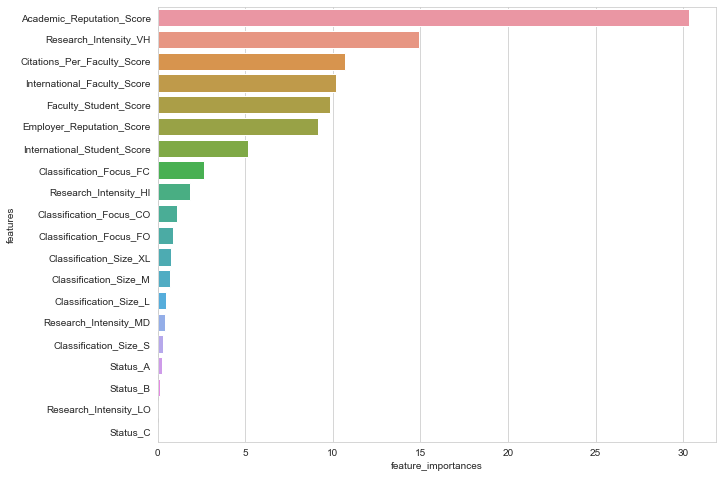

In [421]:
plot_importances(p_cols.drop(['Overall_Score'], axis = 1).columns, pipeline.steps[1][1].feature_importances_)

The result above shows that `academic_reputation_score` has the most contribution to `overall_score`, followed by `research_intensity_vh`, `faculty_student_score`, ...

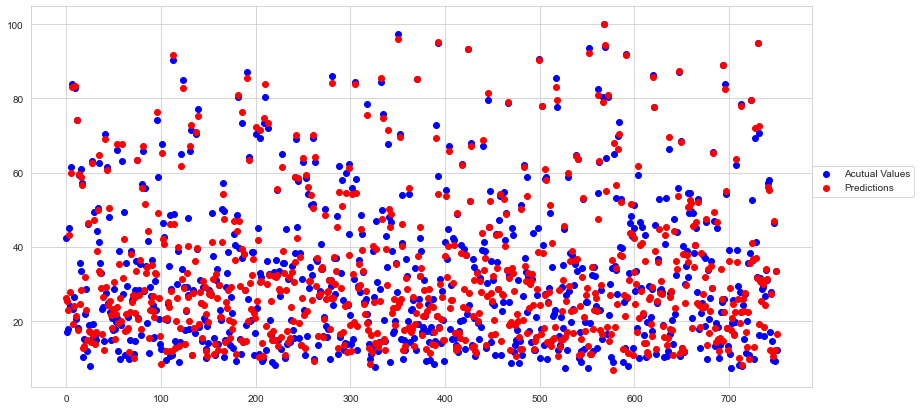

In [422]:
fig, ax = plt.subplots(figsize = (14,7))
x = np.arange(0, len(xtest), 1)
ax.scatter(x, fytest, c='b', label="Acutual Values")
ax.scatter(x, pipeline.predict(fxtest), c='r', label="Predictions")
ax.legend(loc=(1, 0.5));

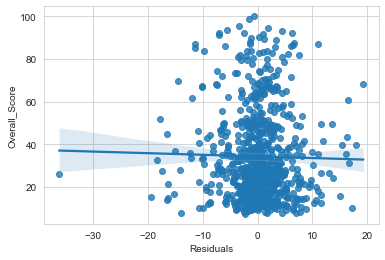

In [423]:
residuals = fytest - pipeline.predict(fxtest)
plt.figure()
a = sns.regplot(x = residuals, y = ytest)
a.set(xlabel = 'Residuals')
plt.show()

### Check for homoscedasciticity

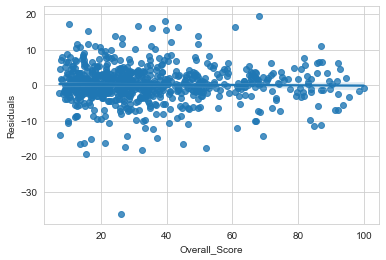

In [424]:
plt.figure()
a = sns.regplot(x = ytest, y = residuals)
a.set(ylabel = 'Residuals')
plt.show()

The almost constant distribution of the residuals along the x-axis shows that it is homoscedastic

### Check for normality

[Text(0.5, 0, 'Residuals')]

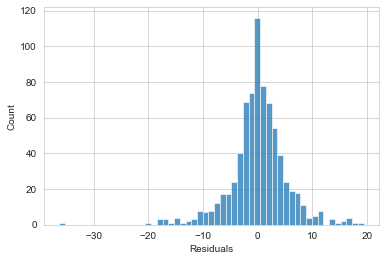

In [425]:
plt.figure()
a = sns.histplot(x = residuals)
a.set(xlabel = 'Residuals')

The umbel shape distribution shows that it is normal

In [424]:
import pickle as pk
with open('final_model.pickle', 'wb') as f:
    pk.dump(pipeline, f)

In [426]:
parameters = {'depth' : [4, 5,6,7,8,9,10],
             'learning_rate' : [0.01, 0.02, 0.03, 0.04, 0.1, 0.2,0.3],
             'iterations':[i for i in range(100,1000,50)]}

In [ ]:
grid_cbt = GridSearchCV(estimator = cbt, param_grid = parameters, cv = 4, n_jobs = -1, verbose = 2)
grid_cbt.fit(xtrain2, ytrain2)

In [ ]:
grid_cbt.best_params_